# This notebook does a full analysis of the 2-point data, comparing the effects of varying the minimum time and maximum time of the data and number of data samples

### It also compares what the results would look like with a the main file's (a12m310_a_avg.h5) 2-point function and that of the Feynman-Hellman file (a12m310_a_fh.h5)

In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import gvar as gv

In [2]:
import h5py
import lsqfit

In [3]:
# Constants

#Physical constants
hbarc = 197.3 # MeV fm
#a = 0.12

# Pion mass
mpi = 0.1885

# Plot constants
t_min_plt = 1
t_max_plt = 25

In [4]:
# This function's job is to add up the dE parameters in the input-parameters to the fit-functions into useable energies 
def Ei(n_selec, p):
    Ea = p['E0']
    for l in range(1, n_selec+1):
        Ea += p['dE{}'.format(l)]
        
    #print(Ea)
    return Ea

In [5]:
num_zs = 1 #Order number of the n's
# Log E: log of the energy.  
# P is point (in the context of )

# Define the 2-point fit function, for P-S and P-P
def C_2pt(t, p):
    
    z = np.array([])
    ztilde = np.array([])
    E = np.array([])
    for i in range(num_zs):
        z = np.append(z, p['Z{}'.format(i)])
        ztilde = np.append(ztilde, p['Ztilde{}'.format(i)])
        E = np.append(E, Ei(i, p))
        
    
    sum_pp = sum([z[i]*z[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    sum_ps = sum([z[i]*ztilde[i]*np.exp(-E[i]*t) for i in range(num_zs)])
    
    return np.transpose(np.array([[sum_pp], [sum_ps]]), axes=[2,0,1])

## First, get all of the data, calculate effective mass and effective z-value, and do a comparison of the two data-sets

In [6]:
# Get the data, first the primary data-set
file = h5py.File("a12m310_a_avg.h5", "r")

data_original = gv.BufferDict()
data_original['proton_dn_pp'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton']['px0_py0_pz0']['spin_dn'])
data_original['proton_up_pp'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton']['px0_py0_pz0']['spin_up'])
data_original['proton_dn_np'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton_np']['px0_py0_pz0']['spin_dn'])
data_original['proton_up_np'] = np.array(file['gf1p0_w3p0_n30_M51p2_L58_a1p5']['spec']['ml0p0126']['proton_np']['px0_py0_pz0']['spin_up'])

data_original['proton'] = (data_original['proton_dn_pp'] + data_original['proton_up_pp'] + data_original['proton_dn_np'] + data_original['proton_up_np'])/4.

# Now, get the Feynman-Hellman dataset
file_fh = h5py.File("a12m310_a_fh.h5", "r")
data_fh = gv.BufferDict()
data_fh['proton_ss'] = np.array(file_fh['proton_ss'])/4.
data_fh['proton_ps'] = np.array(file_fh['proton_ps'])/4.
data_fh['proton'] = np.transpose(np.array([[data_fh['proton_ss']], [data_fh['proton_ps']]]), axes=[2,3,0,1])

# Average out both
avg_data_original = gv.BufferDict()
avg_data_original = gv.dataset.avg_data(data_original)
avg_data_fh = gv.BufferDict()
avg_data_fh = gv.dataset.avg_data(data_fh)

/opt/miniconda3/envs/blur2020/lib/python3.8/site-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


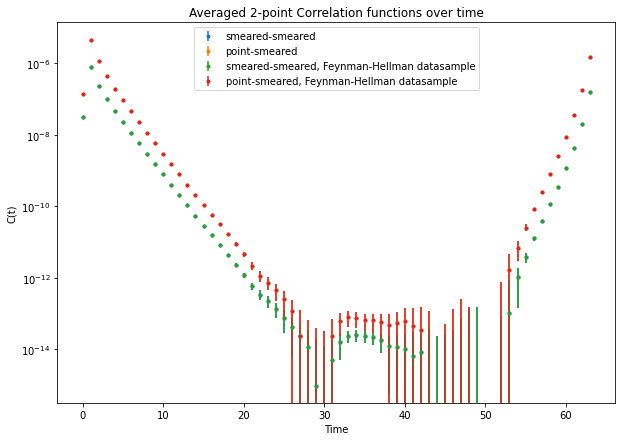

In [7]:
# Plot Correlation functions
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.semilogy()
ax.errorbar([i for i in range(len(avg_data_original['proton']))], [avg_data_original['proton'][i][0][0].mean for i in range(len(avg_data_original['proton']))], yerr=[avg_data_original['proton'][i][0][0].sdev for i in range(len(avg_data_original['proton']))], fmt='.', label="smeared-smeared")
ax.errorbar([i for i in range(len(avg_data_original['proton']))], [avg_data_original['proton'][i][1][0].mean for i in range(len(avg_data_original['proton']))], yerr=[avg_data_original['proton'][i][1][0].sdev for i in range(len(avg_data_original['proton']))], fmt='.', label="point-smeared")

ax.errorbar([i for i in range(len(avg_data_fh['proton']))], [avg_data_fh['proton'][i][0][0].mean for i in range(len(avg_data_fh['proton']))], yerr=[avg_data_fh['proton'][i][0][0].sdev for i in range(len(avg_data_fh['proton']))], fmt='.', label="smeared-smeared, Feynman-Hellman datasample")
ax.errorbar([i for i in range(len(avg_data_fh['proton']))], [avg_data_fh['proton'][i][1][0].mean for i in range(len(avg_data_fh['proton']))], yerr=[avg_data_fh['proton'][i][1][0].sdev for i in range(len(avg_data_fh['proton']))], fmt='.', label="point-smeared, Feynman-Hellman datasample")

plt.xlabel("Time")
plt.ylabel("C(t)")
plt.title("Averaged 2-point Correlation functions over time")
plt.legend()
plt.show()

In [8]:
tau = 1
# Effective mass data (same annihilation, different annihilation)
eff_mass = [[np.log(avg_data_original['proton'][t][0][0]/avg_data_original['proton'][t+tau][0][0])/tau for t in range(len(avg_data_original['proton'])-tau)],\
            [np.log(avg_data_original['proton'][t][1][0]/avg_data_original['proton'][t+tau][1][0])/tau for t in range(len(avg_data_original['proton'])-tau)]]

avg_data_original['eff_mass'] = np.array([np.log(avg_data_original['proton'][t]/avg_data_original['proton'][t+tau])/tau for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['eff_mass'] = np.array([np.log(avg_data_fh['proton'][t]/avg_data_fh['proton'][t+tau])/tau for t in range(len(avg_data_fh['proton'])-tau)])

#zS_eff = np.array([np.sqrt(np.exp(eff_mass[0][t]*t)*avg_data_original['proton'][t][0][0]) for t in range(len(avg_data_original['proton'])-tau)])
avg_data_original['zs_eff'] = np.array([np.sqrt(np.exp(avg_data_original['eff_mass'][t][0][0]*t)*avg_data_original['proton'][t][0][0]) for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['zs_eff'] = np.array([np.sqrt(np.exp(avg_data_fh['eff_mass'][t][0][0]*t)*avg_data_fh['proton'][t][0][0]) for t in range(len(avg_data_fh['proton'])-tau)])

#zP_eff = np.array([np.exp(eff_mass[1][t]*t)*avg_data_original['proton'][t][1][0]/zS_eff[t] for t in range(len(avg_data_original['proton'])-tau)])
avg_data_original['zp_eff'] = np.array([np.exp(avg_data_original['eff_mass'][t][1][0]*t)*avg_data_original['proton'][t][1][0]/avg_data_original['zs_eff'][t] for t in range(len(avg_data_original['proton'])-tau)])
avg_data_fh['zp_eff'] = np.array([np.exp(avg_data_fh['eff_mass'][t][1][0]*t)*avg_data_fh['proton'][t][1][0]/avg_data_fh['zs_eff'][t] for t in range(len(avg_data_fh['proton'])-tau)])

#log_eff_mass = np.log(eff_mass)

<ipython-input-8-5c46469d3407>:3: RuntimeWarning: invalid value encountered in log
  eff_mass = [[np.log(avg_data_original['proton'][t][0][0]/avg_data_original['proton'][t+tau][0][0])/tau for t in range(len(avg_data_original['proton'])-tau)],\
<ipython-input-8-5c46469d3407>:4: RuntimeWarning: invalid value encountered in log
  [np.log(avg_data_original['proton'][t][1][0]/avg_data_original['proton'][t+tau][1][0])/tau for t in range(len(avg_data_original['proton'])-tau)]]
<ipython-input-8-5c46469d3407>:6: RuntimeWarning: invalid value encountered in log
  avg_data_original['eff_mass'] = np.array([np.log(avg_data_original['proton'][t]/avg_data_original['proton'][t+tau])/tau for t in range(len(avg_data_original['proton'])-tau)])
<ipython-input-8-5c46469d3407>:7: RuntimeWarning: invalid value encountered in log
  avg_data_fh['eff_mass'] = np.array([np.log(avg_data_fh['proton'][t]/avg_data_fh['proton'][t+tau])/tau for t in range(len(avg_data_fh['proton'])-tau)])
<ipython-input-8-5c46469d3407

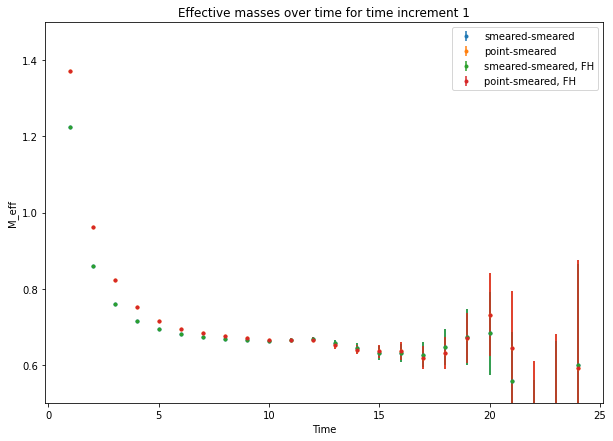

In [9]:
# Plot the effective masses
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['eff_mass'][i][0][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_original['eff_mass'][i][0][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="smeared-smeared")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['eff_mass'][i][1][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_original['eff_mass'][i][1][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="point-smeared")

ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['eff_mass'][i][0][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_fh['eff_mass'][i][0][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="smeared-smeared, FH")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['eff_mass'][i][1][0].mean for i in range(t_min_plt,t_max_plt)]), yerr=np.array([avg_data_fh['eff_mass'][i][1][0].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="point-smeared, FH")

plt.xlabel("Time")
plt.ylabel("M_eff")
plt.ylim(0.5, 1.5)
#plt.yticks(np.arange(0.6,0.8, 0.02))
plt.title("Effective masses over time for time increment {}".format(tau))
plt.legend()
plt.show()



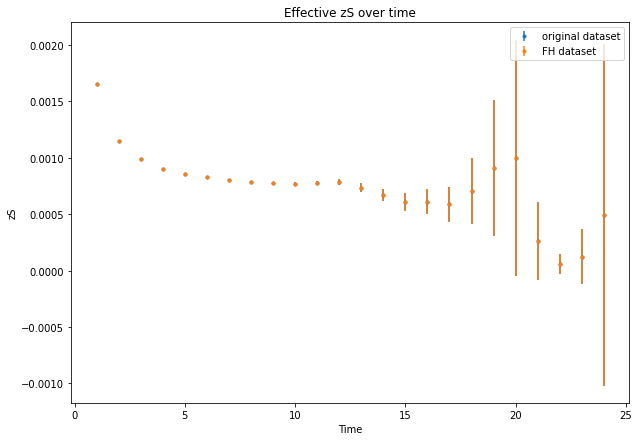

In [10]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes()
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zs_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zs_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="original dataset")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zs_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zs_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="FH dataset")

plt.xlabel("Time")
plt.ylabel("zS")
plt.title("Effective zS over time")
plt.legend()
plt.show()

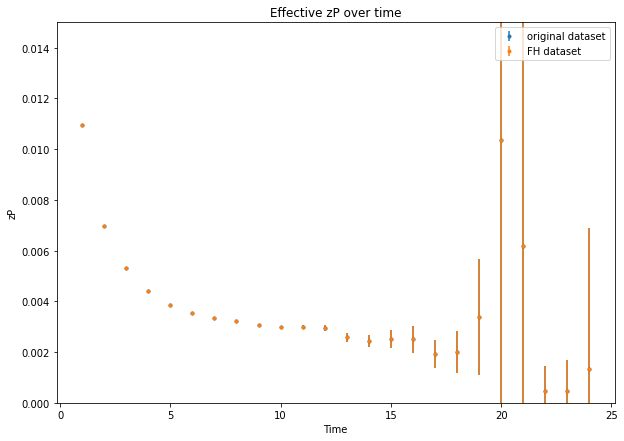

In [11]:
fig = plt.figure(figsize=(10,7))
ax = plt.axes()

ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zp_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_original['zp_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="original dataset")
ax.errorbar(np.array([i for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zp_eff'][i].mean for i in range(t_min_plt,t_max_plt)]), np.array([avg_data_fh['zp_eff'][i].sdev for i in range(t_min_plt,t_max_plt)]), fmt='.', label="FH dataset")

plt.xlabel("Time")
plt.ylabel("zP")
plt.title("Effective zP over time")
plt.ylim(0, 0.015)
plt.legend()
plt.show()

Looks like the Feynman-Hellman and the original datafile do indeed have the same data

## Set the priors for all sampled energy spacing and widths
### Then test the fits

In [12]:
# Define a-values, where a is such that the energy-increment at the nth excited state is 2*mpi/n^a
# Define b-values, where b is the error-bar of log(dE)

num_fitsamples = np.arange(1,12,1)
a = np.linspace(0,2,11)
a_select_indices = np.array([0, 5, 10])
b = np.linspace(0.3,1.3,6)


In [13]:
# Find up to 9 excited priors for each pair of a,b

num_zs = 9


p=gv.BufferDict()
p['E0'] = gv.gvar(0.67, 0.02)
p['Z0'] = gv.gvar(0.0008, 0.0003)
p['Ztilde0'] = gv.gvar(0.003, 0.003)

# Initialize the principal values of the excited energy-priors
dE0 = 2*mpi
energyvals = np.array([[None]*(len(num_fitsamples) + 1)]*len(a))
dEvals = np.array([[None]*len(num_fitsamples)]*len(a))



for i in range(len(a)):
    energyvals[i][0] = p['E0'].mean
    for k in range(np.min(num_fitsamples), np.max(num_fitsamples)+1):
        dEvals[i][k-1] = dE0/np.power(k, a[i])
        energyvals[i][k] = energyvals[i][k-1] + dEvals[i][k-1]
        

priors = []
p_adj = gv.BufferDict()
for i in range(len(a)):
    priors.append([])
    
    for j in range(len(b)):
        #print("i = ", i, " j = ", j)
        priors[i].append(gv.BufferDict())
        
        priors[i][j]['E0'] = p['E0']
        priors[i][j]['Z0'] = p['Z0']
        priors[i][j]['Ztilde0'] = p['Ztilde0']
        
        priors[i][j]['Z1'] = gv.gvar(0.0008, 0.0004)
        priors[i][j]['Ztilde1'] = gv.gvar(0, 0.005)
        priors[i][j]['log(dE1)'] = gv.gvar(np.log(dEvals[i][0]), b[j])
        
        for k in range(2, np.max(num_fitsamples)+1):
            priors[i][j]['Z{}'.format(k)] = gv.gvar(0.0008, 0.0004)
            priors[i][j]['Ztilde{}'.format(k)] = gv.gvar(0, 0.005)
            priors[i][j]['log(dE{})'.format(k)] = gv.gvar(np.log(dEvals[i][k-1]), 0.7)
            

In [14]:
num_zs = 9
aa = 1
bb = 3
fit_check = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, 22)]), np.array([avg_data_original['proton'][l] for l in range(2,22)])), prior=priors[a_select_indices[aa]][bb],fcn=C_2pt,debug=True)

print("a = ", a[a_select_indices[aa]], "; b = ", b[bb])
print("Q= ", fit_check.Q)
print(fit_check.format(pstyle='vv'))

a =  1.0 ; b =  0.9000000000000001
Q=  0.28607122701990034
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.29    logGBF = 989.86

Parameters:
             E0       0.660464 +- 0.00278238             [           0.67 +- 0.02 ]  
             Z0   0.000754629 +- 1.02865e-05             [       0.0008 +- 0.0003 ]  
        Ztilde0    0.00285398 +- 4.61404e-05             [         0.003 +- 0.003 ]  
             Z1   0.000690145 +- 5.47146e-05             [       0.0008 +- 0.0004 ]  
        Ztilde1    0.00457553 +- 0.000539729             [             0 +- 0.005 ]  
       log(dE1)        -0.796633 +- 0.105386             [        -0.97551 +- 0.9 ]  
             Z2   0.000462147 +- 0.000354408             [       0.0008 +- 0.0004 ]  
        Ztilde2      0.0044281 +- 0.00321237             [             0 +- 0.005 ]  
       log(dE2)        -0.548211 +- 0.277962             [        -1.66866 +- 0.7 ]  *
             Z3   0.000468296 +- 0.000367396             [       0.0008 +- 0

### Now, plot fit quality and E0 over tmin and number of excited states used

In [15]:
tmin = np.arange(1,10,1)

list_LogGBF_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a0 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

list_LogGBF_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a1 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

list_LogGBF_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_Q_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
list_E0_a2 = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

In [16]:
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmin)):
            num_zs = j + np.min(num_fitsamples) + 1
            fit_a0 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 22)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],22)])), prior=priors[a_select_indices[0]][i],fcn=C_2pt,debug=True)
            fit_a1 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 22)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],22)])), prior=priors[a_select_indices[1]][i],fcn=C_2pt,debug=True)
            fit_a2 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(tmin[k], 22)]), np.array([avg_data_original['proton'][l] for l in range(tmin[k],22)])), prior=priors[a_select_indices[2]][i],fcn=C_2pt,debug=True)
            
            print("\ni = ", i, " j = ", j, " k = ", k, "\n")
            
            list_LogGBF_a0[i][j][k] = fit_a0.logGBF
            list_Q_a0[i][j][k] = fit_a0.Q
            list_E0_a0[i][j][k] = fit_a0.p['E0']
            
            print("Fit for a = ", a[a_select_indices[0]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a0[i][j][k])
            print("list Q: ", list_Q_a0[i][j][k])
            print("list E0: ", list_E0_a0[i][j][k])
            print(fit_a0.format(pstyle='vv'))
            
            list_LogGBF_a1[i][j][k] = fit_a1.logGBF
            list_Q_a1[i][j][k] = fit_a1.Q
            list_E0_a1[i][j][k] = fit_a1.p['E0']
            
            print("Fit for a = ", a[a_select_indices[1]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a1[i][j][k])
            print("list Q: ", list_Q_a1[i][j][k])
            print("list E0: ", list_E0_a1[i][j][k])
            print(fit_a1.format(pstyle='vv'))
            
            list_LogGBF_a2[i][j][k] = fit_a2.logGBF
            list_Q_a2[i][j][k] = fit_a2.Q
            list_E0_a2[i][j][k] = fit_a2.p['E0']
            
            print("Fit for a = ", a[a_select_indices[2]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmin[k])
            print("list logGBF: ", list_LogGBF_a2[i][j][k])
            print("list Q: ", list_Q_a2[i][j][k])
            print("list E0: ", list_E0_a2[i][j][k])
            print(fit_a2.format(pstyle='vv'))
            #print(list_LogGBF_a0)
            #a = 0, b = 0.7, k = 5 fit


i =  0  j =  0  k =  0 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  1
list logGBF:  -2516.2495743458344
list Q:  0.0
list E0:  0.69160(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2516.2

Parameters:
             E0      0.691598 +- 0.000892501             [     0.67 +- 0.02 ]  *
             Z0   0.000821604 +- 1.94556e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0032839 +- 1.00799e-05             [   0.003 +- 0.003 ]  
             Z1    0.00204812 +- 2.60585e-06             [ 0.0008 +- 0.0004 ]  ***
        Ztilde1     0.0133832 +- 1.86103e-05             [       0 +- 0.005 ]  **
       log(dE1)       0.517462 +- 0.00221606             [  -0.97551 +- 0.3 ]  ****
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  0  k =  2 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  3
list logGBF:  929.2492736882373
list Q:  5.091873608605703e-08
list E0:  0.6633(14)
Least Square Fit:
  chi2/dof [dof] = 2.7 [38]    Q = 5.1e-08    logGBF = 929.25

Parameters:
             E0       0.663311 +- 0.00137074             [     0.67 +- 0.02 ]  
             Z0   0.000769464 +- 3.61265e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00294375 +- 1.70013e-05             [   0.003 +- 0.003 ]  
             Z1    0.00103647 +- 7.98199e-06             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00736849 +- 8.71588e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.378005 +- 0.0141553             [  -0.97551 +- 0.3 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  0  j =  0  k =  4 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  5
list logGBF:  877.1690382291428
list Q:  0.42576463642070833
list E0:  0.6601(24)
Least Square Fit:
  chi2/dof [dof] = 1 [34]    Q = 0.43    logGBF = 877.17

Parameters:
             E0       0.660072 +- 0.00240781             [     0.67 +- 0.02 ]  
             Z0   0.000754129 +- 8.20323e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285504 +- 3.68452e-05             [   0.003 +- 0.003 ]  
             Z1   0.000786514 +- 2.78974e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0052524 +- 0.000272364             [       0 +- 0.005 ]  *
       log(dE1)       -0.703298 +- 0.0559291             [  -0.97551 +- 0.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  0  k =  6 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  7
list logGBF:  788.0904074628315
list Q:  0.5567854914116299
list E0:  0.6566(44)
Least Square Fit:
  chi2/dof [dof] = 0.94 [30]    Q = 0.56    logGBF = 788.09

Parameters:
             E0       0.656628 +- 0.00437009             [     0.67 +- 0.02 ]  
             Z0   0.000737201 +- 1.84589e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277559 +- 7.95167e-05             [   0.003 +- 0.003 ]  
             Z1   0.000660754 +- 7.65997e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00398347 +- 0.000600458             [       0 +- 0.005 ]  
       log(dE1)        -0.970595 +- 0.169445             [  -0.97551 +- 0.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3       


i =  0  j =  0  k =  8 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmin =  9
list logGBF:  694.112805059367
list Q:  0.6375070150709847
list E0:  0.6577(59)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 694.11

Parameters:
             E0       0.657669 +- 0.00587259             [     0.67 +- 0.02 ]  
             Z0   0.000742022 +- 2.63322e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280097 +- 0.000105562             [   0.003 +- 0.003 ]  
             Z1   0.000713275 +- 0.000231561             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00404161 +- 0.00133476             [       0 +- 0.005 ]  
       log(dE1)        -0.904124 +- 0.251327             [  -0.97551 +- 0.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  1  k =  0 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  1
list logGBF:  958.8804566490946
list Q:  7.461436599960426e-19
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.3 [42]    Q = 7.5e-19    logGBF = 958.88

Parameters:
             E0          0.6683 +- 0.00119066             [     0.67 +- 0.02 ]  
             Z0    0.000784271 +- 2.91609e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00300815 +- 1.39335e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000996887 +- 1.17656e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1    -0.00748351 +- 8.18281e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.359554 +- 0.0133539             [  -0.97551 +- 0.3 ]  **
             Z2     0.00243171 +- 2.66574e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2      0.0153244 +- 0.000159106             [       0 +- 0.005 ]  ***
       log(dE2)         0.623313 +- 0.0169551             [  -0.97551 +- 0.


i =  0  j =  1  k =  1 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  2
list logGBF:  992.6421720084692
list Q:  0.3707021958342232
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.37    logGBF = 992.64

Parameters:
             E0       0.661461 +- 0.00183222             [     0.67 +- 0.02 ]  
             Z0   0.000758743 +- 5.76147e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287198 +- 2.74274e-05             [   0.003 +- 0.003 ]  
             Z1   0.000716889 +- 4.17021e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00491315 +- 0.000311212             [       0 +- 0.005 ]  
       log(dE1)       -0.744208 +- 0.0628591             [  -0.97551 +- 0.3 ]  
             Z2    0.00132901 +- 2.26572e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00985822 +- 0.000228525             [       0 +- 0.005 ]  *
       log(dE2)       -0.102298 +- 0.0544421             [  -0.97551 +- 0.7 ]  *
             Z3     


i =  0  j =  1  k =  2 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  3
list logGBF:  957.6867530901883
list Q:  0.5526477169323754
list E0:  0.6611(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 957.69

Parameters:
             E0       0.661135 +- 0.00268246             [     0.67 +- 0.02 ]  
             Z0   0.000756154 +- 9.88047e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285484 +- 4.51182e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563574 +- 0.000103036             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00378275 +- 0.000726547             [       0 +- 0.005 ]  
       log(dE1)        -0.938219 +- 0.167022             [  -0.97551 +- 0.3 ]  
             Z2    0.00110791 +- 4.17955e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807764 +- 0.000447793             [       0 +- 0.005 ]  *
       log(dE2)        -0.456344 +- 0.126568             [  -0.97551 +- 0.7 ]  
             Z3      


i =  0  j =  1  k =  3 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  4
list logGBF:  918.1955444438828
list Q:  0.582520202895173
list E0:  0.6585(38)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.58    logGBF = 918.2

Parameters:
             E0       0.658529 +- 0.00376862             [     0.67 +- 0.02 ]  
             Z0    0.00074465 +- 1.58221e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280697 +- 6.96886e-05             [   0.003 +- 0.003 ]  
             Z1   0.000545469 +- 0.000125097             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00331578 +- 0.000908716             [       0 +- 0.005 ]  
       log(dE1)         -1.05636 +- 0.243315             [  -0.97551 +- 0.3 ]  
             Z2   0.000979259 +- 0.000109505             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00776645 +- 0.00130122             [       0 +- 0.005 ]  *
       log(dE2)        -0.543139 +- 0.243867             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  1  k =  4 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  5
list logGBF:  876.4652164053671
list Q:  0.53330751596505
list E0:  0.6583(43)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 876.47

Parameters:
             E0        0.658341 +- 0.0042671             [     0.67 +- 0.02 ]  
             Z0   0.000744583 +- 1.81113e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280895 +- 7.68486e-05             [   0.003 +- 0.003 ]  
             Z1    0.000563328 +- 0.00015869             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00340151 +- 0.00112959             [       0 +- 0.005 ]  
       log(dE1)         -1.01284 +- 0.249589             [  -0.97551 +- 0.3 ]  
             Z2   0.000780554 +- 0.000216636             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00625981 +- 0.00206161             [       0 +- 0.005 ]  *
       log(dE2)        -0.756245 +- 0.488403             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  1  k =  5 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  6
list logGBF:  834.2179758760283
list Q:  0.6360226092903521
list E0:  0.6588(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.64    logGBF = 834.22

Parameters:
             E0        0.65881 +- 0.00396405             [     0.67 +- 0.02 ]  
             Z0    0.000747733 +- 1.6344e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281795 +- 6.91502e-05             [   0.003 +- 0.003 ]  
             Z1   0.000637947 +- 0.000116695             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00438871 +- 0.00101019             [       0 +- 0.005 ]  
       log(dE1)          -0.8875 +- 0.169886             [  -0.97551 +- 0.3 ]  
             Z2   0.000682096 +- 0.000343112             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00138952 +- 0.00382445             [       0 +- 0.005 ]  
       log(dE2)        -0.812742 +- 0.635962             [  -0.97551 +- 0.7 ]  
             Z3        


i =  0  j =  1  k =  6 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  7
list logGBF:  788.1069797864527
list Q:  0.5911851394286542
list E0:  0.6584(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.59    logGBF = 788.11

Parameters:
             E0       0.658398 +- 0.00410467             [     0.67 +- 0.02 ]  
             Z0    0.00074625 +- 1.70223e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280906 +- 7.14612e-05             [   0.003 +- 0.003 ]  
             Z1   0.000639476 +- 0.000122053             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00471599 +- 0.00140821             [       0 +- 0.005 ]  
       log(dE1)        -0.880432 +- 0.181184             [  -0.97551 +- 0.3 ]  
             Z2   0.000838181 +- 0.000376611             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.000731324 +- 0.0044858             [       0 +- 0.005 ]  
       log(dE2)        -0.872313 +- 0.611148             [  -0.97551 +- 0.7 ]  
             Z3       


i =  0  j =  1  k =  7 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  8
list logGBF:  742.4006616356753
list Q:  0.6068456817977597
list E0:  0.6600(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.61    logGBF = 742.4

Parameters:
             E0       0.660044 +- 0.00412781             [     0.67 +- 0.02 ]  
             Z0   0.000754281 +- 1.66152e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284403 +- 6.98115e-05             [   0.003 +- 0.003 ]  
             Z1    0.00070269 +- 0.000197546             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0056693 +- 0.00180512             [       0 +- 0.005 ]  *
       log(dE1)        -0.743733 +- 0.195117             [  -0.97551 +- 0.3 ]  
             Z2   0.000734407 +- 0.000398336             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00132462 +- 0.00493933             [       0 +- 0.005 ]  
       log(dE2)        -0.826343 +- 0.692889             [  -0.97551 +- 0.7 ]  
             Z3       


i =  0  j =  1  k =  8 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmin =  9
list logGBF:  694.0599546530749
list Q:  0.6256141869674214
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694.06

Parameters:
             E0        0.65785 +- 0.00572775             [     0.67 +- 0.02 ]  
             Z0    0.00074313 +- 2.54148e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280494 +- 0.000102356             [   0.003 +- 0.003 ]  
             Z1    0.000709978 +- 0.00024427             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00420369 +- 0.00139958             [       0 +- 0.005 ]  
       log(dE1)        -0.883988 +- 0.244165             [  -0.97551 +- 0.3 ]  
             Z2   0.000762948 +- 0.000398956             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000819018 +- 0.00496308             [       0 +- 0.005 ]  
       log(dE2)        -0.868245 +- 0.694128             [  -0.97551 +- 0.7 ]  
             Z3       


i =  0  j =  2  k =  0 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  1
list logGBF:  -22057.14007613718
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22057

Parameters:
             E0       0.670231 +- 0.00157632             [     0.67 +- 0.02 ]  
             Z0    0.000737126 +- 4.2825e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281094 +- 1.8945e-05             [   0.003 +- 0.003 ]  
             Z1   8.16405e-05 +- 9.31008e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00435612 +- 0.00419721             [       0 +- 0.005 ]  
       log(dE1)        -0.973963 +- 0.227598             [  -0.97551 +- 0.3 ]  
             Z2   2.78428e-06 +- 6.85706e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447291 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.507177             [  -0.97551 +- 0.7 ]  
             Z3    0.00180395 +- 2


i =  0  j =  2  k =  1 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  2
list logGBF:  992.9582663395876
list Q:  0.4858715304814154
list E0:  0.6603(27)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.96

Parameters:
             E0       0.660313 +- 0.00274351             [     0.67 +- 0.02 ]  
             Z0   0.000753828 +- 1.01003e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284924 +- 4.54066e-05             [   0.003 +- 0.003 ]  
             Z1   0.000670108 +- 6.96415e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443216 +- 0.000582788             [       0 +- 0.005 ]  
       log(dE1)        -0.824164 +- 0.113514             [  -0.97551 +- 0.3 ]  
             Z2    0.00080984 +- 0.000285925             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00650165 +- 0.00210556             [       0 +- 0.005 ]  *
       log(dE2)        -0.434684 +- 0.272908             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  2  k =  2 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  3
list logGBF:  957.9349866312295
list Q:  0.649252405185932
list E0:  0.6584(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.93

Parameters:
             E0       0.658449 +- 0.00394348             [     0.67 +- 0.02 ]  
             Z0   0.000744003 +- 1.70358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028043 +- 7.4521e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560079 +- 8.97995e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336074 +- 0.00073497             [       0 +- 0.005 ]  
       log(dE1)         -1.05296 +- 0.221452             [  -0.97551 +- 0.3 ]  
             Z2    0.000848007 +- 0.00022616             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00806274 +- 0.00212887             [       0 +- 0.005 ]  *
       log(dE2)         -0.519055 +- 0.19279             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  2  k =  3 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  4
list logGBF:  918.2413184309314
list Q:  0.585149584554397
list E0:  0.6582(40)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 918.24

Parameters:
             E0       0.658248 +- 0.00400309             [     0.67 +- 0.02 ]  
             Z0   0.000743311 +- 1.72671e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280181 +- 7.50202e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550718 +- 0.000118491             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00329226 +- 0.000914966             [       0 +- 0.005 ]  
       log(dE1)         -1.06253 +- 0.248433             [  -0.97551 +- 0.3 ]  
             Z2    0.000784119 +- 0.00023389             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680729 +- 0.00258834             [       0 +- 0.005 ]  *
       log(dE2)        -0.623599 +- 0.308558             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  2  k =  4 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  5
list logGBF:  876.2355701392096
list Q:  0.5118460751540321
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 876.24

Parameters:
             E0       0.658403 +- 0.00428443             [     0.67 +- 0.02 ]  
             Z0    0.00074458 +- 1.83175e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280842 +- 7.78424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562648 +- 0.000144785             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00338414 +- 0.00108994             [       0 +- 0.005 ]  
       log(dE1)         -1.02232 +- 0.251972             [  -0.97551 +- 0.3 ]  
             Z2   0.000709233 +- 0.000269851             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00623539 +- 0.00248411             [       0 +- 0.005 ]  *
       log(dE2)        -0.747027 +- 0.467123             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  2  k =  5 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  6
list logGBF:  834.1482349339202
list Q:  0.6278709228022586
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.15

Parameters:
             E0        0.658957 +- 0.0039401             [     0.67 +- 0.02 ]  
             Z0   0.000748382 +- 1.61563e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282088 +- 6.83598e-05             [   0.003 +- 0.003 ]  
             Z1   0.000644177 +- 0.000106513             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00442601 +- 0.000934409             [       0 +- 0.005 ]  
       log(dE1)         -0.87879 +- 0.160385             [  -0.97551 +- 0.3 ]  
             Z2   0.000683079 +- 0.000362283             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00139641 +- 0.00412563             [       0 +- 0.005 ]  
       log(dE2)        -0.726964 +- 0.593582             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  2  k =  6 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  7
list logGBF:  788.144727515172
list Q:  0.5957060546496228
list E0:  0.6585(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.14

Parameters:
             E0       0.658533 +- 0.00409617             [     0.67 +- 0.02 ]  
             Z0   0.000746906 +- 1.69752e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028116 +- 7.11601e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635689 +- 0.000124825             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474794 +- 0.00143091             [       0 +- 0.005 ]  
       log(dE1)        -0.876125 +- 0.180746             [  -0.97551 +- 0.3 ]  
             Z2    0.00082355 +- 0.000379491             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000567648 +- 0.00451341             [       0 +- 0.005 ]  
       log(dE2)        -0.881616 +- 0.599157             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  0  j =  2  k =  7 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  8
list logGBF:  742.3862840879103
list Q:  0.6050355548403314
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.61    logGBF = 742.39

Parameters:
             E0         0.660064 +- 0.004119             [     0.67 +- 0.02 ]  
             Z0    0.00075438 +- 1.65671e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284444 +- 6.96089e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704523 +- 0.000197546             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00569758 +- 0.0018082             [       0 +- 0.005 ]  *
       log(dE1)        -0.741366 +- 0.194171             [  -0.97551 +- 0.3 ]  
             Z2   0.000737828 +- 0.000398537             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0012345 +- 0.00494732             [       0 +- 0.005 ]  
       log(dE2)        -0.801245 +- 0.691644             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  2  k =  8 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmin =  9
list logGBF:  694.0558849210213
list Q:  0.6249048866025094
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0       0.657863 +- 0.00572053             [     0.67 +- 0.02 ]  
             Z0   0.000743202 +- 2.53713e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028052 +- 0.000102199             [   0.003 +- 0.003 ]  
             Z1   0.000710506 +- 0.000244669             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421342 +- 0.00140176             [       0 +- 0.005 ]  
       log(dE1)        -0.882737 +- 0.243761             [  -0.97551 +- 0.3 ]  
             Z2   0.000763842 +- 0.000399016             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00079626 +- 0.00496524             [       0 +- 0.005 ]  
       log(dE2)        -0.858911 +- 0.693356             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  3  k =  0 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  1
list logGBF:  1008.239229900591
list Q:  0.005509586513039614
list E0:  0.6583(32)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0055    logGBF = 1008.2

Parameters:
             E0       0.658321 +- 0.00315855             [     0.67 +- 0.02 ]  
             Z0   0.000744315 +- 1.29566e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280583 +- 5.8946e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540035 +- 0.000104877             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00331417 +- 0.000782482             [       0 +- 0.005 ]  
       log(dE1)         -1.05325 +- 0.221409             [  -0.97551 +- 0.3 ]  
             Z2    0.00099478 +- 4.74186e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00753811 +- 0.000520574             [       0 +- 0.005 ]  *
       log(dE2)        -0.561758 +- 0.133543             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  3  k =  1 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  2
list logGBF:  993.308254360279
list Q:  0.5528159795398666
list E0:  0.6594(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.31

Parameters:
             E0         0.65936 +- 0.0034643             [     0.67 +- 0.02 ]  
             Z0   0.000749152 +- 1.40598e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282791 +- 6.14716e-05             [   0.003 +- 0.003 ]  
             Z1   0.000592438 +- 0.000118044             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00372264 +- 0.000988343             [       0 +- 0.005 ]  
       log(dE1)        -0.944495 +- 0.201863             [  -0.97551 +- 0.3 ]  
             Z2    0.00067248 +- 0.000284211             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00565797 +- 0.00200309             [       0 +- 0.005 ]  *
       log(dE2)        -0.763084 +- 0.435744             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  3  k =  2 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  3
list logGBF:  958.0259264640118
list Q:  0.660084419964893
list E0:  0.6579(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 958.03

Parameters:
             E0       0.657942 +- 0.00407044             [     0.67 +- 0.02 ]  
             Z0   0.000741867 +- 1.77316e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279597 +- 7.71862e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565026 +- 9.11211e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00334114 +- 0.000744992             [       0 +- 0.005 ]  
       log(dE1)         -1.06007 +- 0.225143             [  -0.97551 +- 0.3 ]  
             Z2   0.000792903 +- 0.000238736             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753647 +- 0.00229204             [       0 +- 0.005 ]  *
       log(dE2)        -0.555304 +- 0.225642             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  3  k =  3 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  4
list logGBF:  918.0650083105794
list Q:  0.5731108576290713
list E0:  0.6579(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 918.07

Parameters:
             E0       0.657893 +- 0.00410608             [     0.67 +- 0.02 ]  
             Z0   0.000741702 +- 1.79848e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279561 +- 7.79876e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561349 +- 0.000107687             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00330873 +- 0.000887194             [       0 +- 0.005 ]  
       log(dE1)         -1.06365 +- 0.248168             [  -0.97551 +- 0.3 ]  
             Z2   0.000785937 +- 0.000238621             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00731267 +- 0.00248923             [       0 +- 0.005 ]  *
       log(dE2)        -0.586748 +- 0.287545             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  3  k =  4 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  5
list logGBF:  876.1288842410047
list Q:  0.5009016304145046
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.13

Parameters:
             E0       0.658372 +- 0.00427078             [     0.67 +- 0.02 ]  
             Z0   0.000744423 +- 1.82862e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280792 +- 7.78409e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568764 +- 0.000140024             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00341267 +- 0.00108683             [       0 +- 0.005 ]  
       log(dE1)         -1.01813 +- 0.252199             [  -0.97551 +- 0.3 ]  
             Z2     0.000726032 +- 0.0002766             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00662764 +- 0.00244436             [       0 +- 0.005 ]  *
       log(dE2)        -0.706095 +- 0.444578             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  3  k =  5 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  6
list logGBF:  834.133611624208
list Q:  0.6265326249873032
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0        0.658962 +- 0.0039385             [     0.67 +- 0.02 ]  
             Z0   0.000748401 +- 1.61377e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82932e-05             [   0.003 +- 0.003 ]  
             Z1    0.000645702 +- 0.00010428             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00443084 +- 0.00092037             [       0 +- 0.005 ]  
       log(dE1)        -0.877628 +- 0.158769             [  -0.97551 +- 0.3 ]  
             Z2   0.000684837 +- 0.000364696             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00138278 +- 0.00416828             [       0 +- 0.005 ]  
       log(dE2)        -0.712183 +- 0.586804             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  0  j =  3  k =  6 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  7
list logGBF:  788.1497336473144
list Q:  0.5963500038404408
list E0:  0.6585(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0        0.65855 +- 0.00409566             [     0.67 +- 0.02 ]  
             Z0   0.000746986 +- 1.69719e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281191 +- 7.11366e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635127 +- 0.000125248             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0047514 +- 0.00143379             [       0 +- 0.005 ]  
       log(dE1)         -0.87568 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082155 +- 0.000379765             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000545302 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)        -0.883971 +- 0.597893             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  3  k =  7 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  8
list logGBF:  742.3853453357677
list Q:  0.604924674149472
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411852             [     0.67 +- 0.02 ]  
             Z0   0.000754386 +- 1.65645e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95975e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704643 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569912 +- 0.00180839             [       0 +- 0.005 ]  *
       log(dE1)        -0.741229 +- 0.194118             [  -0.97551 +- 0.3 ]  
             Z2   0.000738042 +- 0.000398549             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122906 +- 0.00494779             [       0 +- 0.005 ]  
       log(dE2)         -0.799688 +- 0.69156             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  3  k =  8 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmin =  9
list logGBF:  694.0556880743593
list Q:  0.6248733322286302
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0       0.657864 +- 0.00572022             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53694e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102193             [   0.003 +- 0.003 ]  
             Z1   0.000710533 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421381 +- 0.00140185             [       0 +- 0.005 ]  
       log(dE1)        -0.882682 +- 0.243744             [  -0.97551 +- 0.3 ]  
             Z2   0.000763883 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795226 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858481 +- 0.693319             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  4  k =  0 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  1
list logGBF:  1006.8105889601886
list Q:  0.002331503236312341
list E0:  0.6651(24)
Least Square Fit:
  chi2/dof [dof] = 1.7 [42]    Q = 0.0023    logGBF = 1006.8

Parameters:
             E0       0.665084 +- 0.00237721             [     0.67 +- 0.02 ]  
             Z0   0.000774113 +- 8.27386e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00292546 +- 3.51454e-05             [   0.003 +- 0.003 ]  
             Z1   -0.00010769 +- 0.000182466             [ 0.0008 +- 0.0004 ]  **
        Ztilde1    -0.00383314 +- 0.00445891             [       0 +- 0.005 ]  
       log(dE1)         -1.15879 +- 0.259184             [  -0.97551 +- 0.3 ]  
             Z2   0.000913184 +- 9.81263e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00551378 +- 0.000973493             [       0 +- 0.005 ]  *
       log(dE2)         -1.11353 +- 0.297252             [  -0.97551 +- 0.7 ]  
             Z3


i =  0  j =  4  k =  1 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  2
list logGBF:  993.3820055936789
list Q:  0.567170178579652
list E0:  0.6592(37)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 993.38

Parameters:
             E0       0.659166 +- 0.00369307             [     0.67 +- 0.02 ]  
             Z0   0.000748072 +- 1.53727e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282307 +- 6.64577e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056741 +- 0.000124849             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00350795 +- 0.00104214             [       0 +- 0.005 ]  
       log(dE1)        -0.983875 +- 0.224776             [  -0.97551 +- 0.3 ]  
             Z2   0.000650647 +- 0.000276373             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00552093 +- 0.00212291             [       0 +- 0.005 ]  *
       log(dE2)        -0.833086 +- 0.454589             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  4  k =  2 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  3
list logGBF:  957.9813697991983
list Q:  0.6571971572732349
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.98

Parameters:
             E0       0.657747 +- 0.00408671             [     0.67 +- 0.02 ]  
             Z0   0.000741119 +- 1.77884e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279307 +- 7.73875e-05             [   0.003 +- 0.003 ]  
             Z1   0.000569141 +- 9.13141e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00335584 +- 0.000742676             [       0 +- 0.005 ]  
       log(dE1)         -1.05799 +- 0.223256             [  -0.97551 +- 0.3 ]  
             Z2   0.000788202 +- 0.000232259             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00736833 +- 0.00234949             [       0 +- 0.005 ]  *
       log(dE2)         -0.560046 +- 0.23255             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  4  k =  3 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  4
list logGBF:  917.9922582559643
list Q:  0.5689682519986757
list E0:  0.6578(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.99

Parameters:
             E0       0.657783 +- 0.00413959             [     0.67 +- 0.02 ]  
             Z0    0.00074121 +- 1.82002e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027937 +- 7.88812e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564841 +- 0.000104315             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00331808 +- 0.000873492             [       0 +- 0.005 ]  
       log(dE1)         -1.06344 +- 0.247076             [  -0.97551 +- 0.3 ]  
             Z2   0.000797943 +- 0.000233746             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754246 +- 0.00241587             [       0 +- 0.005 ]  *
       log(dE2)        -0.567875 +- 0.274794             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  4  k =  4 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  5
list logGBF:  876.1075239235496
list Q:  0.4987982190600939
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.11

Parameters:
             E0       0.658363 +- 0.00426778             [     0.67 +- 0.02 ]  
             Z0   0.000744389 +- 1.82769e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280781 +- 7.78245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570041 +- 0.000139329             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00341929 +- 0.0010866             [       0 +- 0.005 ]  
       log(dE1)         -1.01705 +- 0.252164             [  -0.97551 +- 0.3 ]  
             Z2   0.000730565 +- 0.000277027             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0066984 +- 0.00243923             [       0 +- 0.005 ]  *
       log(dE2)         -0.698319 +- 0.44056             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  4  k =  5 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  6
list logGBF:  834.1314768542492
list Q:  0.6263451684386458
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393828             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61352e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82852e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645932 +- 0.000103956             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443139 +- 0.000918376             [       0 +- 0.005 ]  
       log(dE1)        -0.877489 +- 0.158551             [  -0.97551 +- 0.3 ]  
             Z2   0.000685149 +- 0.000365003             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0013801 +- 0.00417398             [       0 +- 0.005 ]  
       log(dE2)         -0.710104 +- 0.58592             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  4  k =  6 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  7
list logGBF:  788.1502638362892
list Q:  0.5964198000606626
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409559             [     0.67 +- 0.02 ]  
             Z0   0.000746994 +- 1.69715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281194 +- 7.1134e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635065 +- 0.000125298             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00475174 +- 0.0014341             [       0 +- 0.005 ]  
       log(dE1)        -0.875639 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2   0.000821332 +- 0.000379789             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542853 +- 0.00451463             [       0 +- 0.005 ]  
       log(dE2)         -0.884285 +- 0.59778             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  4  k =  7 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  8
list logGBF:  742.3852983146328
list Q:  0.6049182815629573
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95967e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569922 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2   0.000738049 +- 0.000398549             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0012288 +- 0.00494781             [       0 +- 0.005 ]  
       log(dE2)        -0.799604 +- 0.691556             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  4  k =  8 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmin =  9
list logGBF:  694.0556799034407
list Q:  0.6248720540156858
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0       0.657864 +- 0.00572021             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795184 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  5  k =  0 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  1
list logGBF:  1008.794058979254
list Q:  0.00538185198913189
list E0:  0.6651(24)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0054    logGBF = 1008.8

Parameters:
             E0        0.665145 +- 0.00235912             [     0.67 +- 0.02 ]  
             Z0    0.000774321 +- 8.20604e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00292639 +- 3.48539e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000105076 +- 0.000180527             [ 0.0008 +- 0.0004 ]  **
        Ztilde1     -0.00376524 +- 0.00446462             [       0 +- 0.005 ]  
       log(dE1)          -1.17158 +- 0.261048             [  -0.97551 +- 0.3 ]  
             Z2    0.000913073 +- 9.99928e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00555741 +- 0.000967058             [       0 +- 0.005 ]  *
       log(dE2)          -1.10003 +- 0.289411             [  -0.97551 +- 0.7 ]  
        


i =  0  j =  5  k =  1 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  2
list logGBF:  993.2220385565114
list Q:  0.5517863116492563
list E0:  0.6593(37)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.22

Parameters:
             E0       0.659256 +- 0.00372918             [     0.67 +- 0.02 ]  
             Z0   0.000748382 +- 1.55832e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282406 +- 6.71928e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554136 +- 0.000130662             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00343094 +- 0.0010641             [       0 +- 0.005 ]  
       log(dE1)        -0.997022 +- 0.232248             [  -0.97551 +- 0.3 ]  
             Z2   0.000645346 +- 0.000273067             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00535019 +- 0.00221307             [       0 +- 0.005 ]  *
       log(dE2)        -0.867904 +- 0.472261             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  5  k =  2 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  3
list logGBF:  957.938104890568
list Q:  0.654656987147097
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.65    logGBF = 957.94

Parameters:
             E0       0.657685 +- 0.00407929             [     0.67 +- 0.02 ]  
             Z0   0.000740902 +- 1.77274e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279224 +- 7.71505e-05             [   0.003 +- 0.003 ]  
             Z1    0.000571278 +- 9.1089e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00336825 +- 0.000738675             [       0 +- 0.005 ]  
       log(dE1)           -1.05575 +- 0.2214             [  -0.97551 +- 0.3 ]  
             Z2   0.000793043 +- 0.000226501             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00735041 +- 0.00235443             [       0 +- 0.005 ]  *
       log(dE2)        -0.556783 +- 0.231485             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  5  k =  3 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  4
list logGBF:  917.9727278900225
list Q:  0.5679765259527295
list E0:  0.6578(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0       0.657756 +- 0.00414855             [     0.67 +- 0.02 ]  
             Z0   0.000741092 +- 1.82543e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279324 +- 7.91033e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565654 +- 0.000103551             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332042 +- 0.000869832             [       0 +- 0.005 ]  
       log(dE1)         -1.06338 +- 0.246729             [  -0.97551 +- 0.3 ]  
             Z2    0.00080118 +- 0.000232158             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00759636 +- 0.00239821             [       0 +- 0.005 ]  *
       log(dE2)          -0.5633 +- 0.271664             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  5  k =  4 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  5
list logGBF:  876.1037309552185
list Q:  0.49843316197372556
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0       0.658362 +- 0.00426728             [     0.67 +- 0.02 ]  
             Z0   0.000744382 +- 1.82754e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78217e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570267 +- 0.000139215             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342048 +- 0.00108655             [       0 +- 0.005 ]  
       log(dE1)         -1.01685 +- 0.252155             [  -0.97551 +- 0.3 ]  
             Z2    0.000731384 +- 0.00027706             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671001 +- 0.00243856             [       0 +- 0.005 ]  *
       log(dE2)        -0.696999 +- 0.439886             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  5  k =  5 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  6
list logGBF:  834.1312026500862
list Q:  0.6263210940496937
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82843e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645963 +- 0.000103914             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443145 +- 0.000918116             [       0 +- 0.005 ]  
       log(dE1)        -0.877473 +- 0.158523             [  -0.97551 +- 0.3 ]  
             Z2   0.000685194 +- 0.000365041             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00137969 +- 0.0041747             [       0 +- 0.005 ]  
       log(dE2)        -0.709834 +- 0.585811             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  5  k =  6 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  7
list logGBF:  788.1503123066796
list Q:  0.5964262100028038
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11338e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143413             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2   0.000821311 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542627 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)        -0.884317 +- 0.597771             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  5  k =  7 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  8
list logGBF:  742.3852952776409
list Q:  0.6049179329446905
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799599 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  5  k =  8 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmin =  9
list logGBF:  694.0556795892165
list Q:  0.6248720054310548
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  6  k =  0 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  1
list logGBF:  1013.9614527009462
list Q:  0.0526805551138874
list E0:  0.6596(32)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.053    logGBF = 1014

Parameters:
             E0       0.659638 +- 0.00316754             [     0.67 +- 0.02 ]  
             Z0   0.000749768 +- 1.25861e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282792 +- 5.65435e-05             [   0.003 +- 0.003 ]  
             Z1   0.000508461 +- 0.000124046             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323268 +- 0.000847127             [       0 +- 0.005 ]  
       log(dE1)         -1.05194 +- 0.226962             [  -0.97551 +- 0.3 ]  
             Z2   0.000984642 +- 4.88459e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00721186 +- 0.000559188             [       0 +- 0.005 ]  *
       log(dE2)        -0.629331 +- 0.158137             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  6  k =  1 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  2
list logGBF:  992.9953620305718
list Q:  0.5267216184898458
list E0:  0.6595(37)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 993

Parameters:
             E0       0.659456 +- 0.00367824             [     0.67 +- 0.02 ]  
             Z0   0.000749274 +- 1.52821e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282755 +- 6.59977e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549481 +- 0.000135285             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00343741 +- 0.00107548             [       0 +- 0.005 ]  
       log(dE1)         -0.994026 +- 0.23186             [  -0.97551 +- 0.3 ]  
             Z2   0.000655496 +- 0.000269925             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00527239 +- 0.00225002             [       0 +- 0.005 ]  *
       log(dE2)        -0.872801 +- 0.480832             [  -0.97551 +- 0.7 ]  
             Z3   0.0006


i =  0  j =  6  k =  2 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  3
list logGBF:  957.917429796667
list Q:  0.6535819650864838
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.92

Parameters:
             E0       0.657666 +- 0.00407394             [     0.67 +- 0.02 ]  
             Z0   0.000740844 +- 1.76899e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279202 +- 7.70061e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572087 +- 9.09741e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00337362 +- 0.000736869             [       0 +- 0.005 ]  
       log(dE1)         -1.05473 +- 0.220583             [  -0.97551 +- 0.3 ]  
             Z2   0.000795807 +- 0.000224034             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00735201 +- 0.00235273             [       0 +- 0.005 ]  *
       log(dE2)        -0.554848 +- 0.230514             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  6  k =  3 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  4
list logGBF:  917.9679057621149
list Q:  0.567749930054337
list E0:  0.6577(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0        0.65775 +- 0.00415084             [     0.67 +- 0.02 ]  
             Z0   0.000741064 +- 1.82678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279313 +- 7.91583e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565847 +- 0.000103371             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332098 +- 0.000868913             [       0 +- 0.005 ]  
       log(dE1)         -1.06337 +- 0.246637             [  -0.97551 +- 0.3 ]  
             Z2   0.000801943 +- 0.000231754             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00760868 +- 0.0023942             [       0 +- 0.005 ]  *
       log(dE2)          -0.56223 +- 0.27093             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  6  k =  4 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  5
list logGBF:  876.1030789092619
list Q:  0.4983718243167372
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0        0.658361 +- 0.0042672             [     0.67 +- 0.02 ]  
             Z0   0.000744381 +- 1.82752e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78214e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570304 +- 0.000139197             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342068 +- 0.00108654             [       0 +- 0.005 ]  
       log(dE1)         -1.01682 +- 0.252153             [  -0.97551 +- 0.3 ]  
             Z2   0.000731526 +- 0.000277061             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671189 +- 0.00243843             [       0 +- 0.005 ]  *
       log(dE2)        -0.696781 +- 0.439774             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  6  k =  5 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  6
list logGBF:  834.1311698810501
list Q:  0.6263181995867736
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82841e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645967 +- 0.000103909             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443146 +- 0.000918084             [       0 +- 0.005 ]  
       log(dE1)         -0.877471 +- 0.15852             [  -0.97551 +- 0.3 ]  
             Z2     0.0006852 +- 0.000365046             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00137964 +- 0.00417479             [       0 +- 0.005 ]  
       log(dE2)        -0.709802 +- 0.585799             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  6  k =  6 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  7
list logGBF:  788.1503163636247
list Q:  0.596426746670127
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143414             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082131 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542608 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)          -0.88432 +- 0.59777             [  -0.97551 +- 0.7 ]  
             Z3   0.0008


i =  0  j =  6  k =  7 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  8
list logGBF:  742.3852951170193
list Q:  0.6049179146172237
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799598 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  6  k =  8 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmin =  9
list logGBF:  694.0556795776743
list Q:  0.6248720036580763
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  7  k =  0 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  1
list logGBF:  1014.8347119184875
list Q:  0.07024031990689202
list E0:  0.6598(32)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.07    logGBF = 1014.8

Parameters:
             E0       0.659845 +- 0.00317845             [     0.67 +- 0.02 ]  
             Z0   0.000750662 +- 1.25823e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283166 +- 5.63475e-05             [   0.003 +- 0.003 ]  
             Z1   0.000505125 +- 0.000127577             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323369 +- 0.000861201             [       0 +- 0.005 ]  
       log(dE1)         -1.04784 +- 0.226955             [  -0.97551 +- 0.3 ]  
             Z2   0.000981223 +- 5.06295e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00715117 +- 0.000578758             [       0 +- 0.005 ]  *
       log(dE2)        -0.641104 +- 0.165058             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  7  k =  1 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  2
list logGBF:  992.8235731156016
list Q:  0.5065600213772996
list E0:  0.6597(36)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.82

Parameters:
             E0        0.659653 +- 0.0035962             [     0.67 +- 0.02 ]  
             Z0     0.0007502 +- 1.47959e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283132 +- 6.41078e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551859 +- 0.000137247             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349367 +- 0.00107295             [       0 +- 0.005 ]  
       log(dE1)        -0.982124 +- 0.226421             [  -0.97551 +- 0.3 ]  
             Z2   0.000674745 +- 0.000265903             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529298 +- 0.00225555             [       0 +- 0.005 ]  *
       log(dE2)         -0.85547 +- 0.479974             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  7  k =  2 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  3
list logGBF:  957.9094283166132
list Q:  0.6531955331329271
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.91

Parameters:
             E0        0.657661 +- 0.0040716             [     0.67 +- 0.02 ]  
             Z0   0.000740828 +- 1.76742e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279195 +- 7.69455e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572365 +- 9.09365e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00337558 +- 0.00073623             [       0 +- 0.005 ]  
       log(dE1)         -1.05435 +- 0.220283             [  -0.97551 +- 0.3 ]  
             Z2   0.000796876 +- 0.000223142             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00735313 +- 0.00235187             [       0 +- 0.005 ]  *
       log(dE2)        -0.554119 +- 0.230132             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  7  k =  3 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  4
list logGBF:  917.9667535693012
list Q:  0.5676988706710975
list E0:  0.6577(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0        0.657748 +- 0.0041514             [     0.67 +- 0.02 ]  
             Z0   0.000741057 +- 1.82711e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027931 +- 7.91717e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565892 +- 0.000103329             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332111 +- 0.000868687             [       0 +- 0.005 ]  
       log(dE1)         -1.06337 +- 0.246614             [  -0.97551 +- 0.3 ]  
             Z2   0.000802117 +- 0.000231657             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00761147 +- 0.0023933             [       0 +- 0.005 ]  *
       log(dE2)        -0.561983 +- 0.270759             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  7  k =  4 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  5
list logGBF:  876.1029737000464
list Q:  0.4983618214151412
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0       0.658361 +- 0.00426719             [     0.67 +- 0.02 ]  
             Z0   0.000744381 +- 1.82751e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78213e-05             [   0.003 +- 0.003 ]  
             Z1    0.00057031 +- 0.000139193             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342071 +- 0.00108654             [       0 +- 0.005 ]  
       log(dE1)         -1.01681 +- 0.252153             [  -0.97551 +- 0.3 ]  
             Z2    0.00073155 +- 0.000277061             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0067122 +- 0.00243842             [       0 +- 0.005 ]  *
       log(dE2)        -0.696744 +- 0.439756             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  7  k =  5 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  6
list logGBF:  834.1311661407266
list Q:  0.6263178673091414
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82841e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645967 +- 0.000103908             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443146 +- 0.000918081             [       0 +- 0.005 ]  
       log(dE1)        -0.877471 +- 0.158519             [  -0.97551 +- 0.3 ]  
             Z2   0.000685201 +- 0.000365046             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00137963 +- 0.0041748             [       0 +- 0.005 ]  
       log(dE2)        -0.709798 +- 0.585797             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  7  k =  6 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  7
list logGBF:  788.1503166852181
list Q:  0.5964267891918265
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143414             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082131 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542607 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)          -0.88432 +- 0.59777             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  7  k =  7 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  8
list logGBF:  742.3852951087364
list Q:  0.6049179136758497
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799598 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  7  k =  8 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmin =  9
list logGBF:  694.05567957727
list Q:  0.6248720035959713
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  0  j =  8  k =  0 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  1
list logGBF:  1015.456673777469
list Q:  0.08524616374045962
list E0:  0.6600(32)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.085    logGBF = 1015.5

Parameters:
             E0       0.659996 +- 0.00319284             [     0.67 +- 0.02 ]  
             Z0   0.000751321 +- 1.26144e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283444 +- 5.63353e-05             [   0.003 +- 0.003 ]  
             Z1   0.000502807 +- 0.000130515             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323571 +- 0.000873861             [       0 +- 0.005 ]  
       log(dE1)          -1.04426 +- 0.22711             [  -0.97551 +- 0.3 ]  
             Z2   0.000977375 +- 5.28184e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00709664 +- 0.000601586             [       0 +- 0.005 ]  *
       log(dE2)        -0.651342 +- 0.171812             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  8  k =  1 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  2
list logGBF:  992.7288132918078
list Q:  0.495556640461599
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.73

Parameters:
             E0        0.659769 +- 0.0035383             [     0.67 +- 0.02 ]  
             Z0   0.000750756 +- 1.44531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283365 +- 6.27722e-05             [   0.003 +- 0.003 ]  
             Z1    0.000555586 +- 0.00013729             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354335 +- 0.00106407             [       0 +- 0.005 ]  
       log(dE1)        -0.972288 +- 0.221262             [  -0.97551 +- 0.3 ]  
             Z2   0.000689006 +- 0.000263097             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053291 +- 0.00225639             [       0 +- 0.005 ]  *
       log(dE2)        -0.838443 +- 0.476721             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  8  k =  2 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  3
list logGBF:  957.9065738226034
list Q:  0.6530638041840484
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.91

Parameters:
             E0       0.657659 +- 0.00407072             [     0.67 +- 0.02 ]  
             Z0   0.000740823 +- 1.76683e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279194 +- 7.69228e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572457 +- 9.09254e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00337627 +- 0.000736016             [       0 +- 0.005 ]  
       log(dE1)         -1.05421 +- 0.220178             [  -0.97551 +- 0.3 ]  
             Z2    0.00079725 +- 0.000222835             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00735347 +- 0.0023516             [       0 +- 0.005 ]  *
       log(dE2)        -0.553872 +- 0.230003             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  8  k =  3 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  4
list logGBF:  917.9664853378848
list Q:  0.5676874513850256
list E0:  0.6577(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0       0.657748 +- 0.00415154             [     0.67 +- 0.02 ]  
             Z0   0.000741056 +- 1.82719e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027931 +- 7.91749e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565903 +- 0.000103319             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332114 +- 0.000868634             [       0 +- 0.005 ]  
       log(dE1)         -1.06337 +- 0.246609             [  -0.97551 +- 0.3 ]  
             Z2   0.000802157 +- 0.000231634             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0076121 +- 0.0023931             [       0 +- 0.005 ]  *
       log(dE2)         -0.561927 +- 0.27072             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  8  k =  4 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  5
list logGBF:  876.102956876766
list Q:  0.4983602267754026
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0       0.658361 +- 0.00426719             [     0.67 +- 0.02 ]  
             Z0   0.000744381 +- 1.82751e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78213e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570312 +- 0.000139193             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342072 +- 0.00108654             [       0 +- 0.005 ]  
       log(dE1)         -1.01681 +- 0.252153             [  -0.97551 +- 0.3 ]  
             Z2   0.000731554 +- 0.000277061             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671225 +- 0.00243841             [       0 +- 0.005 ]  *
       log(dE2)        -0.696738 +- 0.439753             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  0  j =  8  k =  5 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  6
list logGBF:  834.1311657264332
list Q:  0.6263178303414905
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82841e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645967 +- 0.000103908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00443146 +- 0.00091808             [       0 +- 0.005 ]  
       log(dE1)        -0.877471 +- 0.158519             [  -0.97551 +- 0.3 ]  
             Z2   0.000685201 +- 0.000365046             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00137963 +- 0.0041748             [       0 +- 0.005 ]  
       log(dE2)        -0.709797 +- 0.585797             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  8  k =  6 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  7
list logGBF:  788.1503167098477
list Q:  0.5964267924464475
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143414             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082131 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542607 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)          -0.88432 +- 0.59777             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  8  k =  7 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  8
list logGBF:  742.38529510832
list Q:  0.6049179136286174
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799598 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  0  j =  8  k =  8 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmin =  9
list logGBF:  694.05567957725
list Q:  0.6248720035930653
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  0  j =  9  k =  0 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  1
list logGBF:  1015.9032037124405
list Q:  0.09728006096251292
list E0:  0.6601(32)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.097    logGBF = 1015.9

Parameters:
             E0       0.660104 +- 0.00321149             [     0.67 +- 0.02 ]  
             Z0    0.000751798 +- 1.2681e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283648 +- 5.64908e-05             [   0.003 +- 0.003 ]  
             Z1   0.000501055 +- 0.000133034             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323686 +- 0.000885563             [       0 +- 0.005 ]  
       log(dE1)         -1.04144 +- 0.227543             [  -0.97551 +- 0.3 ]  
             Z2    0.00097294 +- 5.55131e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.0070444 +- 0.000628751             [       0 +- 0.005 ]  *
       log(dE2)        -0.660841 +- 0.178602             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  9  k =  1 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  2
list logGBF:  992.6815205938702
list Q:  0.4903429977486746
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.68

Parameters:
             E0       0.659821 +- 0.00351097             [     0.67 +- 0.02 ]  
             Z0   0.000751006 +- 1.42913e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028347 +- 6.21383e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557692 +- 0.000137046             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356866 +- 0.00105822             [       0 +- 0.005 ]  
       log(dE1)        -0.967379 +- 0.218536             [  -0.97551 +- 0.3 ]  
             Z2   0.000695758 +- 0.000261794             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534774 +- 0.00225741             [       0 +- 0.005 ]  *
       log(dE2)        -0.829793 +- 0.474827             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  9  k =  2 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  3
list logGBF:  957.9055950455813
list Q:  0.653019896724808
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.91

Parameters:
             E0        0.657659 +- 0.0040704             [     0.67 +- 0.02 ]  
             Z0   0.000740822 +- 1.76662e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279193 +- 7.69147e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572488 +- 9.09222e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0033765 +- 0.000735946             [       0 +- 0.005 ]  
       log(dE1)         -1.05417 +- 0.220143             [  -0.97551 +- 0.3 ]  
             Z2   0.000797376 +- 0.000222732             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00735356 +- 0.00235152             [       0 +- 0.005 ]  *
       log(dE2)        -0.553791 +- 0.229961             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  9  k =  3 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  4
list logGBF:  917.9664239090466
list Q:  0.5676849085333272
list E0:  0.6577(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0       0.657748 +- 0.00415157             [     0.67 +- 0.02 ]  
             Z0   0.000741055 +- 1.82721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279309 +- 7.91756e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565905 +- 0.000103317             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332115 +- 0.000868621             [       0 +- 0.005 ]  
       log(dE1)         -1.06337 +- 0.246607             [  -0.97551 +- 0.3 ]  
             Z2   0.000802166 +- 0.000231629             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00761224 +- 0.00239305             [       0 +- 0.005 ]  *
       log(dE2)        -0.561914 +- 0.270711             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  9  k =  4 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  5
list logGBF:  876.1029542313576
list Q:  0.4983599765356024
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0       0.658361 +- 0.00426719             [     0.67 +- 0.02 ]  
             Z0   0.000744381 +- 1.82751e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78213e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570312 +- 0.000139193             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342072 +- 0.00108654             [       0 +- 0.005 ]  
       log(dE1)         -1.01681 +- 0.252153             [  -0.97551 +- 0.3 ]  
             Z2   0.000731554 +- 0.000277061             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671226 +- 0.00243841             [       0 +- 0.005 ]  *
       log(dE2)        -0.696737 +- 0.439752             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  9  k =  5 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  6
list logGBF:  834.1311656814463
list Q:  0.6263178263143898
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82841e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645967 +- 0.000103908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00443146 +- 0.00091808             [       0 +- 0.005 ]  
       log(dE1)        -0.877471 +- 0.158519             [  -0.97551 +- 0.3 ]  
             Z2   0.000685201 +- 0.000365046             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00137963 +- 0.0041748             [       0 +- 0.005 ]  
       log(dE2)        -0.709797 +- 0.585797             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  9  k =  6 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  7
list logGBF:  788.1503167116919
list Q:  0.5964267926900465
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143414             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082131 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542607 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)          -0.88432 +- 0.59777             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  9  k =  7 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  8
list logGBF:  742.3852951082979
list Q:  0.6049179136261343
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799598 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  9  k =  8 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmin =  9
list logGBF:  694.0556795772519
list Q:  0.6248720035932698
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  10  k =  0 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  1
list logGBF:  1016.240123064563
list Q:  0.10536293689518493
list E0:  0.6604(35)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1016.2

Parameters:
             E0        0.660381 +- 0.0035012             [     0.67 +- 0.02 ]  
             Z0    0.00075315 +- 1.40985e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284233 +- 6.13463e-05             [   0.003 +- 0.003 ]  
             Z1   0.000490538 +- 0.000148641             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321878 +- 0.000945776             [       0 +- 0.005 ]  
       log(dE1)         -1.03382 +- 0.232413             [  -0.97551 +- 0.3 ]  
             Z2    0.000905956 +- 0.00011775             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00637362 +- 0.00125967             [       0 +- 0.005 ]  *
       log(dE2)        -0.751356 +- 0.259897             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  10  k =  1 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  2
list logGBF:  992.6588885310385
list Q:  0.4879134841587879
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.66

Parameters:
             E0       0.659844 +- 0.00349829             [     0.67 +- 0.02 ]  
             Z0   0.000751118 +- 1.42164e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283518 +- 6.18441e-05             [   0.003 +- 0.003 ]  
             Z1   0.000558747 +- 0.000136865             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00358078 +- 0.0010551             [       0 +- 0.005 ]  
       log(dE1)        -0.965054 +- 0.217211             [  -0.97551 +- 0.3 ]  
             Z2   0.000698914 +- 0.000261206             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.005357 +- 0.00225812             [       0 +- 0.005 ]  *
       log(dE2)        -0.825584 +- 0.473829             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  10  k =  2 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  3
list logGBF:  957.9052667793322
list Q:  0.6530054306499463
list E0:  0.6577(41)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.91

Parameters:
             E0        0.657659 +- 0.0040703             [     0.67 +- 0.02 ]  
             Z0   0.000740821 +- 1.76655e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279193 +- 7.6912e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572498 +- 9.09213e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00337658 +- 0.000735923             [       0 +- 0.005 ]  
       log(dE1)         -1.05415 +- 0.220131             [  -0.97551 +- 0.3 ]  
             Z2   0.000797418 +- 0.000222697             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00735358 +- 0.0023515             [       0 +- 0.005 ]  *
       log(dE2)        -0.553765 +- 0.229948             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  10  k =  3 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  4
list logGBF:  917.9664099948508
list Q:  0.5676843436855759
list E0:  0.6577(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.97

Parameters:
             E0       0.657748 +- 0.00415158             [     0.67 +- 0.02 ]  
             Z0   0.000741055 +- 1.82721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279309 +- 7.91758e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565906 +- 0.000103316             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00332115 +- 0.000868619             [       0 +- 0.005 ]  
       log(dE1)         -1.06337 +- 0.246607             [  -0.97551 +- 0.3 ]  
             Z2   0.000802168 +- 0.000231628             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00761227 +- 0.00239304             [       0 +- 0.005 ]  *
       log(dE2)        -0.561911 +- 0.270709             [  -0.97551 +- 0.7 ]  
             Z3    


i =  0  j =  10  k =  4 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  5
list logGBF:  876.1029538200481
list Q:  0.49835993768282716
list E0:  0.6584(43)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 876.1

Parameters:
             E0       0.658361 +- 0.00426719             [     0.67 +- 0.02 ]  
             Z0   0.000744381 +- 1.82751e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280779 +- 7.78213e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570312 +- 0.000139193             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342072 +- 0.00108654             [       0 +- 0.005 ]  
       log(dE1)         -1.01681 +- 0.252153             [  -0.97551 +- 0.3 ]  
             Z2   0.000731554 +- 0.000277061             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671226 +- 0.00243841             [       0 +- 0.005 ]  *
       log(dE2)        -0.696737 +- 0.439752             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  10  k =  5 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  6
list logGBF:  834.1311656766281
list Q:  0.6263178258821172
list E0:  0.6590(39)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 834.13

Parameters:
             E0       0.658961 +- 0.00393825             [     0.67 +- 0.02 ]  
             Z0   0.000748399 +- 1.61349e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282103 +- 6.82841e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645967 +- 0.000103908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00443146 +- 0.00091808             [       0 +- 0.005 ]  
       log(dE1)        -0.877471 +- 0.158519             [  -0.97551 +- 0.3 ]  
             Z2   0.000685201 +- 0.000365046             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00137963 +- 0.0041748             [       0 +- 0.005 ]  
       log(dE2)        -0.709797 +- 0.585797             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  10  k =  6 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  7
list logGBF:  788.1503167118258
list Q:  0.5964267927078182
list E0:  0.6586(41)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 788.15

Parameters:
             E0       0.658551 +- 0.00409558             [     0.67 +- 0.02 ]  
             Z0   0.000746995 +- 1.69714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281194 +- 7.11337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000635059 +- 0.000125303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00475177 +- 0.00143414             [       0 +- 0.005 ]  
       log(dE1)        -0.875635 +- 0.180728             [  -0.97551 +- 0.3 ]  
             Z2    0.00082131 +- 0.000379791             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000542607 +- 0.00451462             [       0 +- 0.005 ]  
       log(dE2)          -0.88432 +- 0.59777             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  10  k =  7 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  8
list logGBF:  742.3852951082996
list Q:  0.6049179136262314
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.91 [28]    Q = 0.6    logGBF = 742.39

Parameters:
             E0       0.660065 +- 0.00411848             [     0.67 +- 0.02 ]  
             Z0   0.000754387 +- 1.65643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284447 +- 6.95966e-05             [   0.003 +- 0.003 ]  
             Z1   0.000704651 +- 0.000197535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00569923 +- 0.00180841             [       0 +- 0.005 ]  *
       log(dE1)        -0.741218 +- 0.194114             [  -0.97551 +- 0.3 ]  
             Z2     0.00073805 +- 0.00039855             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00122879 +- 0.00494782             [       0 +- 0.005 ]  
       log(dE2)        -0.799598 +- 0.691555             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  10  k =  8 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmin =  9
list logGBF:  694.0556795772521
list Q:  0.6248720035933246
list E0:  0.6579(57)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.62    logGBF = 694.06

Parameters:
             E0        0.657864 +- 0.0057202             [     0.67 +- 0.02 ]  
             Z0   0.000743205 +- 2.53693e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280521 +- 0.000102192             [   0.003 +- 0.003 ]  
             Z1   0.000710534 +- 0.000244684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00421382 +- 0.00140186             [       0 +- 0.005 ]  
       log(dE1)         -0.88268 +- 0.243743             [  -0.97551 +- 0.3 ]  
             Z2   0.000763885 +- 0.000399018             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000795182 +- 0.00496534             [       0 +- 0.005 ]  
       log(dE2)        -0.858463 +- 0.693318             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  0  k =  0 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  1
list logGBF:  -2508.834652790038
list Q:  0.0
list E0:  0.69161(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2508.8

Parameters:
             E0      0.691607 +- 0.000892506             [     0.67 +- 0.02 ]  *
             Z0   0.000821623 +- 1.94558e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00328399 +- 1.00801e-05             [   0.003 +- 0.003 ]  
             Z1    0.00204818 +- 2.60635e-06             [ 0.0008 +- 0.0004 ]  ***
        Ztilde1     0.0133835 +- 1.86127e-05             [       0 +- 0.005 ]  **
       log(dE1)       0.517525 +- 0.00221629             [  -0.97551 +- 0.5 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3           


i =  1  j =  0  k =  1 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  2
list logGBF:  748.5523068622889
list Q:  5.861240368658732e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 5.9e-90    logGBF = 748.55

Parameters:
             E0       0.667431 +- 0.00107205             [     0.67 +- 0.02 ]  
             Z0   0.000785151 +- 2.50312e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0030352 +- 1.20782e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125275 +- 3.72657e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917292 +- 4.22283e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128251 +- 0.00669474             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  1  j =  0  k =  3 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  4
list logGBF:  914.8967012184772
list Q:  0.11043925714393857
list E0:  0.6624(17)
Least Square Fit:
  chi2/dof [dof] = 1.3 [36]    Q = 0.11    logGBF = 914.9

Parameters:
             E0       0.662353 +- 0.0017415            [     0.67 +- 0.02 ]  
             Z0   0.000763979 +- 5.1792e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00290618 +- 2.39195e-05            [   0.003 +- 0.003 ]  
             Z1   0.000897476 +- 1.6495e-05            [ 0.0008 +- 0.0004 ]  
        Ztilde1   0.00630243 +- 0.000167982            [       0 +- 0.005 ]  *
       log(dE1)      -0.538191 +- 0.0294278            [  -0.97551 +- 0.5 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008 +- 0.0


i =  1  j =  0  k =  5 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  6
list logGBF:  834.3501036189143
list Q:  0.649465432606074
list E0:  0.6569(37)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.65    logGBF = 834.35

Parameters:
             E0       0.656862 +- 0.00369148             [     0.67 +- 0.02 ]  
             Z0    0.000738836 +- 1.4749e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278392 +- 6.48698e-05             [   0.003 +- 0.003 ]  
             Z1   0.000686205 +- 4.48401e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00418315 +- 0.000387448             [       0 +- 0.005 ]  
       log(dE1)        -0.924014 +- 0.116396             [  -0.97551 +- 0.5 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  1  j =  0  k =  7 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmin =  8
list logGBF:  742.5656896475007
list Q:  0.6501002158782399
list E0:  0.6604(42)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.57

Parameters:
             E0       0.660374 +- 0.00420989             [     0.67 +- 0.02 ]  
             Z0   0.000755804 +- 1.70712e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285199 +- 7.23821e-05             [   0.003 +- 0.003 ]  
             Z1    0.000752902 +- 0.00021351             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00600516 +- 0.00228508             [       0 +- 0.005 ]  *
       log(dE1)        -0.699917 +- 0.224301             [  -0.97551 +- 0.5 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  1  k =  0 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  1
list logGBF:  959.7245668508114
list Q:  2.1346951543823106e-18
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.2 [42]    Q = 2.1e-18    logGBF = 959.72

Parameters:
             E0         0.668312 +- 0.0011902             [     0.67 +- 0.02 ]  
             Z0    0.000784322 +- 2.91446e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00300848 +- 1.39267e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000997491 +- 1.17779e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1    -0.00748836 +- 8.19246e-05             [       0 +- 0.005 ]  *
       log(dE1)         -0.35867 +- 0.0133564             [  -0.97551 +- 0.5 ]  *
             Z2     0.00243282 +- 2.67818e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2      0.0153295 +- 0.000159799             [       0 +- 0.005 ]  ***
       log(dE2)         0.623944 +- 0.0170054             [  -0.97551 +- 0.


i =  1  j =  1  k =  1 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  2
list logGBF:  992.3579333083939
list Q:  0.3867786260154339
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 992.36

Parameters:
             E0       0.661516 +- 0.00182474             [     0.67 +- 0.02 ]  
             Z0   0.000759032 +- 5.73102e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028737 +- 2.73285e-05             [   0.003 +- 0.003 ]  
             Z1   0.000720972 +- 4.23109e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00494666 +- 0.000316712             [       0 +- 0.005 ]  
       log(dE1)        -0.73727 +- 0.0632065             [  -0.97551 +- 0.5 ]  
             Z2    0.00133011 +- 2.34306e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986618 +- 0.000234423             [       0 +- 0.005 ]  *
       log(dE2)      -0.0985757 +- 0.0559305             [  -0.97551 +- 0.7 ]  *
             Z3       


i =  1  j =  1  k =  2 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  3
list logGBF:  957.3094496367241
list Q:  0.5532079917561614
list E0:  0.6612(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 957.31

Parameters:
             E0       0.661181 +- 0.00267993             [     0.67 +- 0.02 ]  
             Z0   0.000756404 +- 9.95003e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285621 +- 4.5988e-05             [   0.003 +- 0.003 ]  
             Z1   0.000567401 +- 0.000112923             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00381479 +- 0.000810719             [       0 +- 0.005 ]  
       log(dE1)        -0.930402 +- 0.184313             [  -0.97551 +- 0.5 ]  
             Z2    0.00110835 +- 4.33197e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807893 +- 0.000459927             [       0 +- 0.005 ]  *
       log(dE2)        -0.454186 +- 0.133794             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  1  k =  3 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  4
list logGBF:  917.8874813339124
list Q:  0.5856430685302978
list E0:  0.6582(41)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.89

Parameters:
             E0       0.658239 +- 0.00410859             [     0.67 +- 0.02 ]  
             Z0   0.000743075 +- 1.83574e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027995 +- 8.22879e-05             [   0.003 +- 0.003 ]  
             Z1   0.000534666 +- 0.000148875             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321517 +- 0.00113197             [       0 +- 0.005 ]  
       log(dE1)         -1.08912 +- 0.331927             [  -0.97551 +- 0.5 ]  
             Z2    0.00097909 +- 0.000105222             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00775274 +- 0.00129771             [       0 +- 0.005 ]  *
       log(dE2)        -0.546214 +- 0.240784             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  1  k =  4 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  5
list logGBF:  876.1753830052453
list Q:  0.5340787174940802
list E0:  0.6581(47)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 876.18

Parameters:
             E0       0.658136 +- 0.00467603             [     0.67 +- 0.02 ]  
             Z0   0.000743514 +- 2.07924e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280409 +- 8.94364e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055532 +- 0.000190201             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00332342 +- 0.00144771             [       0 +- 0.005 ]  
       log(dE1)         -1.03447 +- 0.344695             [  -0.97551 +- 0.5 ]  
             Z2   0.000786814 +- 0.000212556             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00632424 +- 0.0020415             [       0 +- 0.005 ]  *
       log(dE2)        -0.752217 +- 0.487608             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  1  k =  6 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  7
list logGBF:  787.7962985644181
list Q:  0.5953707743531078
list E0:  0.6586(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 787.8

Parameters:
             E0       0.658633 +- 0.00417147             [     0.67 +- 0.02 ]  
             Z0   0.000747447 +- 1.74238e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281452 +- 7.37957e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646725 +- 0.000127191             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00487503 +- 0.0016807             [       0 +- 0.005 ]  
       log(dE1)         -0.85879 +- 0.201974             [  -0.97551 +- 0.5 ]  
             Z2   0.000850163 +- 0.000379651             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000983173 +- 0.00461167             [       0 +- 0.005 ]  
       log(dE2)        -0.895765 +- 0.624777             [  -0.97551 +- 0.7 ]  
             Z3         


i =  1  j =  1  k =  7 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  8
list logGBF:  742.4467853535224
list Q:  0.6335206511709868
list E0:  0.6605(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.45

Parameters:
             E0       0.660535 +- 0.00406375             [     0.67 +- 0.02 ]  
             Z0    0.00075667 +- 1.62505e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285552 +- 6.89603e-05             [   0.003 +- 0.003 ]  
             Z1   0.000748267 +- 0.000226175             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00629686 +- 0.0023589             [       0 +- 0.005 ]  *
       log(dE1)          -0.6815 +- 0.212959             [  -0.97551 +- 0.5 ]  
             Z2   0.000746294 +- 0.000398727             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101966 +- 0.00495813             [       0 +- 0.005 ]  
       log(dE2)        -0.840318 +- 0.693905             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  1  k =  8 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmin =  9
list logGBF:  694.0001316420182
list Q:  0.6309640242530756
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658358 +- 0.00592216             [     0.67 +- 0.02 ]  
             Z0   0.000745756 +- 2.64696e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281616 +- 0.000107766             [   0.003 +- 0.003 ]  
             Z1   0.000742679 +- 0.000284806             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00451186 +- 0.00194969             [       0 +- 0.005 ]  
       log(dE1)        -0.832048 +- 0.305178             [  -0.97551 +- 0.5 ]  
             Z2   0.000768907 +- 0.000399244             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000704303 +- 0.00497204             [       0 +- 0.005 ]  
       log(dE2)        -0.883875 +- 0.695636             [  -0.97551 +- 0.7 ]  
             Z3          


i =  1  j =  2  k =  0 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  1
list logGBF:  -22057.435929270625
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22057

Parameters:
             E0       0.670231 +- 0.00158282             [     0.67 +- 0.02 ]  
             Z0    0.000737126 +- 4.2996e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281094 +- 1.9167e-05             [   0.003 +- 0.003 ]  
             Z1   8.16443e-05 +- 9.49376e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00435602 +- 0.00423114             [       0 +- 0.005 ]  
       log(dE1)         -0.973963 +- 0.28637             [  -0.97551 +- 0.5 ]  
             Z2   2.78348e-06 +- 8.17289e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447292 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.514136             [  -0.97551 +- 0.7 ]  
             Z3    0.00180395 +- 


i =  1  j =  2  k =  1 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  2
list logGBF:  992.7046390326481
list Q:  0.49450215304096135
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.7

Parameters:
             E0          0.6606 +- 0.0026718             [     0.67 +- 0.02 ]  
             Z0   0.000755144 +- 9.73448e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285565 +- 4.39766e-05             [   0.003 +- 0.003 ]  
             Z1   0.000684198 +- 6.33695e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00456653 +- 0.000548576             [       0 +- 0.005 ]  
       log(dE1)        -0.799377 +- 0.106143             [  -0.97551 +- 0.5 ]  
             Z2   0.000838575 +- 0.000279029             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00668337 +- 0.00211776             [       0 +- 0.005 ]  *
       log(dE2)        -0.382069 +- 0.241203             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  2  k =  2 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  3
list logGBF:  957.5613041483373
list Q:  0.651959090470535
list E0:  0.6581(44)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.56

Parameters:
             E0       0.658078 +- 0.00443987             [     0.67 +- 0.02 ]  
             Z0     0.000742079 +- 2.024e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279555 +- 8.93614e-05             [   0.003 +- 0.003 ]  
             Z1    0.000552092 +- 9.9759e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00326985 +- 0.000862842             [       0 +- 0.005 ]  
       log(dE1)          -1.08375 +- 0.28321             [  -0.97551 +- 0.5 ]  
             Z2   0.000843846 +- 0.000227606             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00805935 +- 0.00211843             [       0 +- 0.005 ]  *
       log(dE2)        -0.521439 +- 0.191532             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  2  k =  3 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  4
list logGBF:  917.931670574206
list Q:  0.5888313967816141
list E0:  0.6579(46)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.93

Parameters:
             E0        0.657876 +- 0.0045596             [     0.67 +- 0.02 ]  
             Z0   0.000741315 +- 2.11017e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279261 +- 9.2762e-05             [   0.003 +- 0.003 ]  
             Z1   0.000539116 +- 0.000141029             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00317726 +- 0.00115294             [       0 +- 0.005 ]  
       log(dE1)         -1.10018 +- 0.347403             [  -0.97551 +- 0.5 ]  
             Z2   0.000782058 +- 0.000233252             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00679289 +- 0.00257469             [       0 +- 0.005 ]  *
       log(dE2)        -0.629322 +- 0.307317             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  2  k =  4 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  5
list logGBF:  875.938881841852
list Q:  0.5130555414800572
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 875.94

Parameters:
             E0       0.658132 +- 0.00477773             [     0.67 +- 0.02 ]  
             Z0   0.000743164 +- 2.15895e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00280203 +- 9.2927e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553131 +- 0.000173587             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00328779 +- 0.00139952             [       0 +- 0.005 ]  
       log(dE1)         -1.04971 +- 0.352523             [  -0.97551 +- 0.5 ]  
             Z2   0.000712004 +- 0.000265648             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00627425 +- 0.00247491             [       0 +- 0.005 ]  *
       log(dE2)        -0.746871 +- 0.467502             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  2  k =  5 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  6
list logGBF:  833.7949570157504
list Q:  0.6319422171776121
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.79

Parameters:
             E0        0.659219 +- 0.0040042             [     0.67 +- 0.02 ]  
             Z0   0.000749635 +- 1.64941e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028266 +- 7.02156e-05             [   0.003 +- 0.003 ]  
             Z1   0.000651781 +- 0.000105311             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454133 +- 0.00105424             [       0 +- 0.005 ]  
       log(dE1)        -0.858886 +- 0.171734             [  -0.97551 +- 0.5 ]  
             Z2   0.000689504 +- 0.000364194             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00102722 +- 0.00438573             [       0 +- 0.005 ]  
       log(dE2)         -0.73044 +- 0.592836             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  1  j =  2  k =  6 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  7
list logGBF:  787.8395249271961
list Q:  0.6002671618398618
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.84

Parameters:
             E0       0.658773 +- 0.00415342             [     0.67 +- 0.02 ]  
             Z0   0.000748121 +- 1.73204e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281717 +- 7.3265e-05             [   0.003 +- 0.003 ]  
             Z1     0.000643119 +- 0.0001297             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00491573 +- 0.0017112             [       0 +- 0.005 ]  
       log(dE1)         -0.853742 +- 0.20108             [  -0.97551 +- 0.5 ]  
             Z2   0.000835247 +- 0.000382076             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000826126 +- 0.00463077             [       0 +- 0.005 ]  
       log(dE2)        -0.906545 +- 0.614765             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  2  k =  7 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  8
list logGBF:  742.435056518836
list Q:  0.6321491864094855
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.44

Parameters:
             E0       0.660552 +- 0.00405372             [     0.67 +- 0.02 ]  
             Z0   0.000756749 +- 1.61962e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285584 +- 6.87262e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749481 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632271 +- 0.00236139             [       0 +- 0.005 ]  *
       log(dE1)        -0.679684 +- 0.211854             [  -0.97551 +- 0.5 ]  
             Z2   0.000748448 +- 0.000398844             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000969385 +- 0.00496215             [       0 +- 0.005 ]  
       log(dE2)         -0.82267 +- 0.692915             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  2  k =  8 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmin =  9
list logGBF:  693.9971579652166
list Q:  0.630385094771314
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0        0.658374 +- 0.0059109             [     0.67 +- 0.02 ]  
             Z0   0.000745838 +- 2.64011e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281647 +- 0.000107509             [   0.003 +- 0.003 ]  
             Z1   0.000743367 +- 0.000285151             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452421 +- 0.00195239             [       0 +- 0.005 ]  
       log(dE1)         -0.83055 +- 0.304236             [  -0.97551 +- 0.5 ]  
             Z2   0.000769562 +- 0.000399282             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000687734 +- 0.00497344             [       0 +- 0.005 ]  
       log(dE2)        -0.876455 +- 0.695093             [  -0.97551 +- 0.7 ]  
             Z3   0.000798


i =  1  j =  3  k =  0 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  1
list logGBF:  1007.8882366427072
list Q:  0.005582422496885762
list E0:  0.6582(34)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0056    logGBF = 1007.9

Parameters:
             E0       0.658201 +- 0.00338912             [     0.67 +- 0.02 ]  
             Z0   0.000743499 +- 1.46905e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280146 +- 6.78876e-05             [   0.003 +- 0.003 ]  
             Z1    0.00052833 +- 0.000122056             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322359 +- 0.000931633             [       0 +- 0.005 ]  
       log(dE1)           -1.08133 +- 0.2837             [  -0.97551 +- 0.5 ]  
             Z2   0.000996132 +- 4.52327e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00752457 +- 0.000510511             [       0 +- 0.005 ]  *
       log(dE2)        -0.565352 +- 0.129306             [  -0.97551 +- 0.7 ]  
             Z3  


i =  1  j =  3  k =  1 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  2
list logGBF:  993.0395716590791
list Q:  0.5533313233212045
list E0:  0.6596(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.04

Parameters:
             E0       0.659552 +- 0.00353224             [     0.67 +- 0.02 ]  
             Z0   0.000750089 +- 1.44957e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283217 +- 6.41298e-05             [   0.003 +- 0.003 ]  
             Z1   0.000602366 +- 0.000128261             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00382002 +- 0.00111113             [       0 +- 0.005 ]  
       log(dE1)        -0.924723 +- 0.222724             [  -0.97551 +- 0.5 ]  
             Z2   0.000673968 +- 0.000288828             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00564098 +- 0.00206041             [       0 +- 0.005 ]  *
       log(dE2)        -0.742558 +- 0.446232             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  3  k =  2 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  3
list logGBF:  957.6624858323596
list Q:  0.6632736260453531
list E0:  0.6576(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.66

Parameters:
             E0       0.657551 +- 0.00463027             [     0.67 +- 0.02 ]  
             Z0    0.000739812 +- 2.1321e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278664 +- 9.35682e-05             [   0.003 +- 0.003 ]  
             Z1   0.000555936 +- 0.000102469             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00324337 +- 0.000883277             [       0 +- 0.005 ]  
       log(dE1)         -1.09329 +- 0.292008             [  -0.97551 +- 0.5 ]  
             Z2   0.000787885 +- 0.000239599             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00749024 +- 0.00229559             [       0 +- 0.005 ]  *
       log(dE2)        -0.561195 +- 0.226799             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  3  k =  3 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  4
list logGBF:  917.7496623699009
list Q:  0.576876533356456
list E0:  0.6575(48)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.75

Parameters:
             E0       0.657482 +- 0.00479524             [     0.67 +- 0.02 ]  
             Z0    0.000739512 +- 2.2559e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278568 +- 9.85879e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550473 +- 0.000127775             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00319648 +- 0.00111237             [       0 +- 0.005 ]  
       log(dE1)          -1.1012 +- 0.345547             [  -0.97551 +- 0.5 ]  
             Z2   0.000782936 +- 0.000237728             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00727807 +- 0.00248991             [       0 +- 0.005 ]  *
       log(dE2)        -0.593224 +- 0.287433             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  3  k =  4 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  5
list logGBF:  875.8372216749482
list Q:  0.5018977500573074
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.84

Parameters:
             E0       0.658118 +- 0.00478307             [     0.67 +- 0.02 ]  
             Z0   0.000743098 +- 2.16778e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280196 +- 9.33924e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560361 +- 0.000168594             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00332568 +- 0.00139993             [       0 +- 0.005 ]  
       log(dE1)         -1.04286 +- 0.351803             [  -0.97551 +- 0.5 ]  
             Z2    0.000729185 +- 0.00027256             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00667639 +- 0.00242957             [       0 +- 0.005 ]  *
       log(dE2)        -0.705195 +- 0.446382             [  -0.97551 +- 0.7 ]  
             Z3     0.


i =  1  j =  3  k =  5 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  6
list logGBF:  833.7783665231332
list Q:  0.630685167189974
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400275             [     0.67 +- 0.02 ]  
             Z0   0.000749657 +- 1.64763e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01408e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653023 +- 0.000103253             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454399 +- 0.00103887             [       0 +- 0.005 ]  
       log(dE1)        -0.857994 +- 0.170068             [  -0.97551 +- 0.5 ]  
             Z2   0.000691086 +- 0.000366398             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101692 +- 0.00441514             [       0 +- 0.005 ]  
       log(dE2)         -0.71693 +- 0.586452             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  1  j =  3  k =  6 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  7
list logGBF:  787.8451836521601
list Q:  0.6009509521462847
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658789 +- 0.00415192             [     0.67 +- 0.02 ]  
             Z0   0.000748202 +- 1.73114e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281748 +- 7.32179e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642584 +- 0.00013008             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492017 +- 0.00171491             [       0 +- 0.005 ]  
       log(dE1)        -0.853218 +- 0.201016             [  -0.97551 +- 0.5 ]  
             Z2   0.000833217 +- 0.000382315             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000804896 +- 0.00463167             [       0 +- 0.005 ]  
       log(dE2)        -0.908961 +- 0.613644             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  1  j =  3  k =  7 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  8
list logGBF:  742.4342990593237
list Q:  0.6320645715313654
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405312             [     0.67 +- 0.02 ]  
             Z0    0.000756754 +- 1.6193e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87121e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749566 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632418 +- 0.00236156             [       0 +- 0.005 ]  *
       log(dE1)        -0.679574 +- 0.211788             [  -0.97551 +- 0.5 ]  
             Z2   0.000748584 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966279 +- 0.00496239             [       0 +- 0.005 ]  
       log(dE2)         -0.821554 +- 0.69285             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  3  k =  8 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmin =  9
list logGBF:  693.997014090462
list Q:  0.6303593030752135
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0        0.658375 +- 0.0059104             [     0.67 +- 0.02 ]  
             Z0   0.000745842 +- 2.63981e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107498             [   0.003 +- 0.003 ]  
             Z1   0.000743401 +- 0.000285163             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452472 +- 0.00195251             [       0 +- 0.005 ]  
       log(dE1)        -0.830484 +- 0.304195             [  -0.97551 +- 0.5 ]  
             Z2   0.000769592 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686976 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876113 +- 0.695068             [  -0.97551 +- 0.7 ]  
             Z3    0.00079


i =  1  j =  4  k =  0 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  1
list logGBF:  1010.5919271389218
list Q:  0.01744334419147307
list E0:  0.6588(33)
Least Square Fit:
  chi2/dof [dof] = 1.5 [42]    Q = 0.017    logGBF = 1010.6

Parameters:
             E0       0.658822 +- 0.00334532             [     0.67 +- 0.02 ]  
             Z0   0.000746014 +- 1.42205e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281142 +- 6.56247e-05             [   0.003 +- 0.003 ]  
             Z1   0.000510317 +- 0.000132231             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0031596 +- 0.000968883             [       0 +- 0.005 ]  
       log(dE1)         -1.08822 +- 0.292516             [  -0.97551 +- 0.5 ]  
             Z2   0.000992524 +- 4.47298e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.0073757 +- 0.000515745             [       0 +- 0.005 ]  *
       log(dE2)        -0.596479 +- 0.137166             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  4  k =  1 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  2
list logGBF:  993.0752107547563
list Q:  0.5672075339289318
list E0:  0.6591(40)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 993.08

Parameters:
             E0       0.659113 +- 0.00402485             [     0.67 +- 0.02 ]  
             Z0   0.000747807 +- 1.73885e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282187 +- 7.58543e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565075 +- 0.000146923             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034842 +- 0.00128677             [       0 +- 0.005 ]  
       log(dE1)         -0.989355 +- 0.28493             [  -0.97551 +- 0.5 ]  
             Z2    0.00065095 +- 0.000275292             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00553245 +- 0.00211728             [       0 +- 0.005 ]  *
       log(dE2)        -0.835564 +- 0.466871             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  4  k =  2 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  3
list logGBF:  957.6185190517883
list Q:  0.6602148874884795
list E0:  0.6574(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.62

Parameters:
             E0        0.657381 +- 0.0046312             [     0.67 +- 0.02 ]  
             Z0   0.000739191 +- 2.12612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027843 +- 9.32385e-05             [   0.003 +- 0.003 ]  
             Z1    0.000560095 +- 0.00010312             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00326177 +- 0.000881282             [       0 +- 0.005 ]  
       log(dE1)           -1.08952 +- 0.2882             [  -0.97551 +- 0.5 ]  
             Z2   0.000783171 +- 0.000232664             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00730248 +- 0.0023627             [       0 +- 0.005 ]  *
       log(dE2)        -0.567588 +- 0.235305             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  4  k =  3 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  4
list logGBF:  917.6723308166864
list Q:  0.5726999093127161
list E0:  0.6574(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.67

Parameters:
             E0       0.657365 +- 0.00485633             [     0.67 +- 0.02 ]  
             Z0   0.000738992 +- 2.29045e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278367 +- 9.99634e-05             [   0.003 +- 0.003 ]  
             Z1    0.000554409 +- 0.00012328             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00320889 +- 0.00109032             [       0 +- 0.005 ]  
       log(dE1)         -1.10029 +- 0.342048             [  -0.97551 +- 0.5 ]  
             Z2   0.000795246 +- 0.000232338             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00750861 +- 0.00241836             [       0 +- 0.005 ]  *
       log(dE2)        -0.573761 +- 0.274219             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  4  k =  4 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  5
list logGBF:  875.8170725764083
list Q:  0.49974248668067667
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.82

Parameters:
             E0       0.658114 +- 0.00478192             [     0.67 +- 0.02 ]  
             Z0   0.000743093 +- 2.16778e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34089e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561905 +- 0.000167907             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333477 +- 0.00140047             [       0 +- 0.005 ]  
       log(dE1)         -1.04107 +- 0.351377             [  -0.97551 +- 0.5 ]  
             Z2   0.000733916 +- 0.000272987             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00674933 +- 0.00242352             [       0 +- 0.005 ]  *
       log(dE2)        -0.697198 +- 0.442678             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  4  k =  5 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  6
list logGBF:  833.7759507814575
list Q:  0.6305071669823359
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0        0.659224 +- 0.0040026             [     0.67 +- 0.02 ]  
             Z0   0.000749656 +- 1.64742e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01327e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653212 +- 0.000102956             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454421 +- 0.00103668             [       0 +- 0.005 ]  
       log(dE1)        -0.857896 +- 0.169844             [  -0.97551 +- 0.5 ]  
             Z2    0.000691373 +- 0.00036668             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101483 +- 0.00441906             [       0 +- 0.005 ]  
       log(dE2)        -0.715022 +- 0.585616             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  4  k =  6 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  7
list logGBF:  787.8457781495287
list Q:  0.6010244722757019
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415175             [     0.67 +- 0.02 ]  
             Z0    0.00074821 +- 1.73104e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281751 +- 7.32129e-05             [   0.003 +- 0.003 ]  
             Z1   0.000642525 +- 0.000130125             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492062 +- 0.00171531             [       0 +- 0.005 ]  
       log(dE1)        -0.853168 +- 0.201011             [  -0.97551 +- 0.5 ]  
             Z2   0.000832996 +- 0.000382336             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802581 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)         -0.909278 +- 0.61354             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  4  k =  7 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  8
list logGBF:  742.4342547879111
list Q:  0.6320597047337728
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87113e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632426 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748592 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000966097 +- 0.0049624             [       0 +- 0.005 ]  
       log(dE2)        -0.821488 +- 0.692847             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  4  k =  8 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmin =  9
list logGBF:  693.9970081505705
list Q:  0.6303582589206668
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686945 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.0007


i =  1  j =  5  k =  0 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  1
list logGBF:  1012.3889575830785
list Q:  0.03447263624684395
list E0:  0.6592(33)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.034    logGBF = 1012.4

Parameters:
             E0       0.659216 +- 0.00331962             [     0.67 +- 0.02 ]  
             Z0   0.000747694 +- 1.39084e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028183 +- 6.40028e-05             [   0.003 +- 0.003 ]  
             Z1   0.000502322 +- 0.000138454             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00314551 +- 0.000992836             [       0 +- 0.005 ]  
       log(dE1)         -1.08507 +- 0.293917             [  -0.97551 +- 0.5 ]  
             Z2   0.000989773 +- 4.55414e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00728948 +- 0.000525996             [       0 +- 0.005 ]  *
       log(dE2)        -0.614344 +- 0.144103             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  5  k =  1 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  2
list logGBF:  992.906593278184
list Q:  0.5520378214911787
list E0:  0.6591(41)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.91

Parameters:
             E0       0.659118 +- 0.00412526             [     0.67 +- 0.02 ]  
             Z0    0.000747687 +- 1.8029e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282095 +- 7.84513e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548112 +- 0.000155746             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336906 +- 0.00133957             [       0 +- 0.005 ]  
       log(dE1)         -1.01177 +- 0.306462             [  -0.97551 +- 0.5 ]  
             Z2   0.000645407 +- 0.000270992             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00538018 +- 0.00219386             [       0 +- 0.005 ]  *
       log(dE2)        -0.873432 +- 0.481421             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  5  k =  2 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  3
list logGBF:  957.5736731918024
list Q:  0.6575023683176624
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.57

Parameters:
             E0       0.657337 +- 0.00460377             [     0.67 +- 0.02 ]  
             Z0   0.000739072 +- 2.10653e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0027839 +- 9.2421e-05             [   0.003 +- 0.003 ]  
             Z1    0.000562483 +- 0.00010287             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00327798 +- 0.000875065             [       0 +- 0.005 ]  
       log(dE1)          -1.0858 +- 0.284167             [  -0.97551 +- 0.5 ]  
             Z2    0.00078846 +- 0.000226627             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00728238 +- 0.00236974             [       0 +- 0.005 ]  *
       log(dE2)        -0.564441 +- 0.234555             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  5  k =  3 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  4
list logGBF:  917.651380982936
list Q:  0.5716991836419262
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.65

Parameters:
             E0       0.657337 +- 0.00487037             [     0.67 +- 0.02 ]  
             Z0   0.000738871 +- 2.29794e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027832 +- 0.000100259             [   0.003 +- 0.003 ]  
             Z1    0.000555334 +- 0.00012223             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321207 +- 0.00108436             [       0 +- 0.005 ]  
       log(dE1)          -1.10004 +- 0.34099             [  -0.97551 +- 0.5 ]  
             Z2   0.000798587 +- 0.000230588             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00756296 +- 0.00240083             [       0 +- 0.005 ]  *
       log(dE2)        -0.569018 +- 0.270946             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  5  k =  4 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  5
list logGBF:  875.8135008292267
list Q:  0.4993681116272346
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478168             [     0.67 +- 0.02 ]  
             Z0   0.000743092 +- 2.16773e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34098e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562179 +- 0.000167795             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333641 +- 0.00140055             [       0 +- 0.005 ]  
       log(dE1)         -1.04074 +- 0.351288             [  -0.97551 +- 0.5 ]  
             Z2    0.000734769 +- 0.00027302             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676123 +- 0.00242273             [       0 +- 0.005 ]  *
       log(dE2)        -0.695842 +- 0.442064             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  5  k =  5 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  6
list logGBF:  833.7756392114242
list Q:  0.6304841840165208
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400258             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01318e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653238 +- 0.000102917             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00454423 +- 0.0010364             [       0 +- 0.005 ]  
       log(dE1)        -0.857885 +- 0.169816             [  -0.97551 +- 0.5 ]  
             Z2   0.000691415 +- 0.000366714             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101451 +- 0.00441955             [       0 +- 0.005 ]  
       log(dE2)        -0.714774 +- 0.585513             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  5  k =  6 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  7
list logGBF:  787.8458321509889
list Q:  0.6010311967366875
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73103e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281751 +- 7.32125e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492066 +- 0.00171534             [       0 +- 0.005 ]  
       log(dE1)         -0.853164 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832976 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802367 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)         -0.90931 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  5  k =  7 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  8
list logGBF:  742.4342523575411
list Q:  0.6320594398954681
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966087 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821485 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  5  k =  8 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmin =  9
list logGBF:  693.9970079230592
list Q:  0.6303582192479267
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.0007


i =  1  j =  6  k =  0 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  1
list logGBF:  1013.6281249404703
list Q:  0.05321904771647185
list E0:  0.6595(33)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.053    logGBF = 1013.6

Parameters:
             E0       0.659502 +- 0.00330765             [     0.67 +- 0.02 ]  
             Z0    0.000748941 +- 1.3714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028235 +- 6.29049e-05             [   0.003 +- 0.003 ]  
             Z1   0.000497676 +- 0.000143378             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00314471 +- 0.00101342             [       0 +- 0.005 ]  
       log(dE1)          -1.07992 +- 0.29392             [  -0.97551 +- 0.5 ]  
             Z2    0.00098674 +- 4.69451e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00722179 +- 0.000541137             [       0 +- 0.005 ]  *
       log(dE2)         -0.628034 +- 0.15106             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  6  k =  1 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  2
list logGBF:  992.6858152814749
list Q:  0.5269103409860888
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.69

Parameters:
             E0       0.659338 +- 0.00402725             [     0.67 +- 0.02 ]  
             Z0   0.000748678 +- 1.74644e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282486 +- 7.62313e-05             [   0.003 +- 0.003 ]  
             Z1   0.000543939 +- 0.000160839             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0033809 +- 0.00135406             [       0 +- 0.005 ]  
       log(dE1)         -1.00726 +- 0.304883             [  -0.97551 +- 0.5 ]  
             Z2   0.000654906 +- 0.000268707             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529918 +- 0.00223486             [       0 +- 0.005 ]  *
       log(dE2)         -0.878152 +- 0.49051             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  6  k =  2 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  3
list logGBF:  957.5520985045032
list Q:  0.6563512192672496
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.55

Parameters:
             E0       0.657327 +- 0.00458912             [     0.67 +- 0.02 ]  
             Z0   0.000739056 +- 2.09668e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278386 +- 9.20153e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563418 +- 0.000102711             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00328506 +- 0.000872138             [       0 +- 0.005 ]  
       log(dE1)         -1.08414 +- 0.282384             [  -0.97551 +- 0.5 ]  
             Z2   0.000791474 +- 0.000224054             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00728455 +- 0.0023682             [       0 +- 0.005 ]  *
       log(dE2)        -0.562429 +- 0.233611             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  6  k =  3 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  4
list logGBF:  917.6461758705508
list Q:  0.5714708163798836
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.65

Parameters:
             E0        0.65733 +- 0.00487376             [     0.67 +- 0.02 ]  
             Z0    0.000738841 +- 2.2997e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278308 +- 0.000100329             [   0.003 +- 0.003 ]  
             Z1   0.000555552 +- 0.000121981             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321282 +- 0.00108285             [       0 +- 0.005 ]  
       log(dE1)         -1.09998 +- 0.340716             [  -0.97551 +- 0.5 ]  
             Z2   0.000799368 +- 0.000230143             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00757529 +- 0.00239687             [       0 +- 0.005 ]  *
       log(dE2)         -0.567915 +- 0.27018             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  6  k =  4 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  5
list logGBF:  875.8128823634621
list Q:  0.4993051554714423
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478166             [     0.67 +- 0.02 ]  
             Z0   0.000743091 +- 2.16774e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34105e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562225 +- 0.000167777             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333668 +- 0.00140056             [       0 +- 0.005 ]  
       log(dE1)         -1.04069 +- 0.351275             [  -0.97551 +- 0.5 ]  
             Z2   0.000734912 +- 0.000273022             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0067632 +- 0.0024226             [       0 +- 0.005 ]  *
       log(dE2)         -0.695617 +- 0.44196             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  6  k =  5 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  6
list logGBF:  833.7756018296932
list Q:  0.6304814126067592
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400258             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01317e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653241 +- 0.000102913             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454423 +- 0.00103636             [       0 +- 0.005 ]  
       log(dE1)        -0.857884 +- 0.169813             [  -0.97551 +- 0.5 ]  
             Z2    0.00069142 +- 0.000366718             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101447 +- 0.00441961             [       0 +- 0.005 ]  
       log(dE2)        -0.714743 +- 0.585501             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  6  k =  6 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  7
list logGBF:  787.8458366523049
list Q:  0.6010317584367517
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73102e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281752 +- 7.32124e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492067 +- 0.00171535             [       0 +- 0.005 ]  
       log(dE1)         -0.853164 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832974 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802349 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)        -0.909313 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  6  k =  7 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  8
list logGBF:  742.4342522292479
list Q:  0.6320594259928728
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966086 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821484 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  6  k =  8 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmin =  9
list logGBF:  693.997007914728
list Q:  0.6303582178006795
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.00079


i =  1  j =  7  k =  0 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  1
list logGBF:  1014.5006430378887
list Q:  0.07085757278115654
list E0:  0.6597(33)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.071    logGBF = 1014.5

Parameters:
             E0        0.659713 +- 0.0033059             [     0.67 +- 0.02 ]  
             Z0   0.000749871 +- 1.36095e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282743 +- 6.22298e-05             [   0.003 +- 0.003 ]  
             Z1   0.000494754 +- 0.000147453             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00314837 +- 0.00103196             [       0 +- 0.005 ]  
       log(dE1)          -1.0747 +- 0.293786             [  -0.97551 +- 0.5 ]  
             Z2   0.000983305 +- 4.87736e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.0071636 +- 0.000560142             [       0 +- 0.005 ]  *
       log(dE2)        -0.639434 +- 0.157961             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  7  k =  1 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  2
list logGBF:  992.5253379716809
list Q:  0.5065825521262038
list E0:  0.6596(38)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.53

Parameters:
             E0          0.659611 +- 0.00385             [     0.67 +- 0.02 ]  
             Z0   0.000749988 +- 1.64003e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283036 +- 7.19448e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549681 +- 0.000160908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347181 +- 0.00133005             [       0 +- 0.005 ]  
       log(dE1)         -0.98703 +- 0.287927             [  -0.97551 +- 0.5 ]  
             Z2   0.000674243 +- 0.000265747             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530274 +- 0.00225623             [       0 +- 0.005 ]  *
       log(dE2)        -0.857951 +- 0.491578             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  7  k =  2 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  3
list logGBF:  957.5437408658656
list Q:  0.6559365497233133
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.54

Parameters:
             E0       0.657324 +- 0.00458327             [     0.67 +- 0.02 ]  
             Z0   0.000739056 +- 2.09282e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278386 +- 9.18571e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563744 +- 0.000102655             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00328766 +- 0.000871084             [       0 +- 0.005 ]  
       log(dE1)         -1.08352 +- 0.281731             [  -0.97551 +- 0.5 ]  
             Z2   0.000792641 +- 0.000223127             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0072861 +- 0.00236729             [       0 +- 0.005 ]  *
       log(dE2)        -0.561657 +- 0.233226             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  7  k =  3 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  4
list logGBF:  917.6449348019662
list Q:  0.5714194331710062
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.64

Parameters:
             E0       0.657329 +- 0.00487457             [     0.67 +- 0.02 ]  
             Z0   0.000738834 +- 2.30011e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278306 +- 0.000100345             [   0.003 +- 0.003 ]  
             Z1   0.000555605 +- 0.000121921             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321301 +- 0.00108248             [       0 +- 0.005 ]  
       log(dE1)         -1.09997 +- 0.340646             [  -0.97551 +- 0.5 ]  
             Z2   0.000799549 +- 0.000230036             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00757816 +- 0.00239598             [       0 +- 0.005 ]  *
       log(dE2)            -0.567654 +- 0.27             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  7  k =  4 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  5
list logGBF:  875.8127949625731
list Q:  0.49929488187116944
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478163             [     0.67 +- 0.02 ]  
             Z0   0.000743092 +- 2.16772e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34098e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562234 +- 0.000167773             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333675 +- 0.00140056             [       0 +- 0.005 ]  
       log(dE1)         -1.04067 +- 0.351268             [  -0.97551 +- 0.5 ]  
             Z2   0.000734943 +- 0.000273023             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676353 +- 0.00242258             [       0 +- 0.005 ]  *
       log(dE2)        -0.695572 +- 0.441943             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  7  k =  5 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  6
list logGBF:  833.7755975503269
list Q:  0.6304810938925413
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400257             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01317e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653241 +- 0.000102912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454423 +- 0.00103636             [       0 +- 0.005 ]  
       log(dE1)        -0.857884 +- 0.169812             [  -0.97551 +- 0.5 ]  
             Z2   0.000691421 +- 0.000366719             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101446 +- 0.00441962             [       0 +- 0.005 ]  
       log(dE2)           -0.71474 +- 0.5855             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  7  k =  6 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  7
list logGBF:  787.8458370081939
list Q:  0.6010318028803552
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73102e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281752 +- 7.32124e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492067 +- 0.00171535             [       0 +- 0.005 ]  
       log(dE1)         -0.853163 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832974 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802348 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)        -0.909313 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  7  k =  7 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  8
list logGBF:  742.4342522226418
list Q:  0.6320594252796812
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966086 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821484 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  7  k =  8 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmin =  9
list logGBF:  693.997007914424
list Q:  0.6303582177483984
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.00079


i =  1  j =  8  k =  0 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  1
list logGBF:  1015.1219978634892
list Q:  0.08590366869663069
list E0:  0.6599(33)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.086    logGBF = 1015.1

Parameters:
             E0       0.659866 +- 0.00331248             [     0.67 +- 0.02 ]  
             Z0    0.000750555 +- 1.3577e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283036 +- 6.19029e-05             [   0.003 +- 0.003 ]  
             Z1    0.00049277 +- 0.000150889             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00315248 +- 0.00104904             [       0 +- 0.005 ]  
       log(dE1)         -1.07023 +- 0.294024             [  -0.97551 +- 0.5 ]  
             Z2    0.000979437 +- 5.0984e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00711097 +- 0.000582492             [       0 +- 0.005 ]  *
       log(dE2)        -0.649421 +- 0.164722             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  8  k =  1 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  2
list logGBF:  992.43846102948
list Q:  0.4955623230876919
list E0:  0.6598(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.44

Parameters:
             E0       0.659788 +- 0.00372244             [     0.67 +- 0.02 ]  
             Z0   0.000750851 +- 1.56317e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283409 +- 6.87968e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556638 +- 0.000158414             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00355376 +- 0.00129432             [       0 +- 0.005 ]  
       log(dE1)        -0.970017 +- 0.272199             [  -0.97551 +- 0.5 ]  
             Z2   0.000689237 +- 0.000263475             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532415 +- 0.00227247             [       0 +- 0.005 ]  *
       log(dE2)         -0.837198 +- 0.48898             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  1  j =  8  k =  2 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  3
list logGBF:  957.5407590448986
list Q:  0.6557948989401083
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.54

Parameters:
             E0       0.657324 +- 0.00458113             [     0.67 +- 0.02 ]  
             Z0   0.000739056 +- 2.09142e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278387 +- 9.17998e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563853 +- 0.000102638             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00328856 +- 0.000870728             [       0 +- 0.005 ]  
       log(dE1)          -1.0833 +- 0.281504             [  -0.97551 +- 0.5 ]  
             Z2    0.00079305 +- 0.000222808             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00728662 +- 0.00236699             [       0 +- 0.005 ]  *
       log(dE2)        -0.561393 +- 0.233095             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  8  k =  3 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  4
list logGBF:  917.6446621350667
list Q:  0.5714079560636135
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.64

Parameters:
             E0       0.657328 +- 0.00487473             [     0.67 +- 0.02 ]  
             Z0   0.000738833 +- 2.30019e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278305 +- 0.000100348             [   0.003 +- 0.003 ]  
             Z1   0.000555619 +- 0.000121907             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00321306 +- 0.0010824             [       0 +- 0.005 ]  
       log(dE1)         -1.09996 +- 0.340628             [  -0.97551 +- 0.5 ]  
             Z2   0.000799587 +- 0.000230014             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00757878 +- 0.0023958             [       0 +- 0.005 ]  *
       log(dE2)        -0.567595 +- 0.269962             [  -0.97551 +- 0.7 ]  
             Z3      


i =  1  j =  8  k =  4 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  5
list logGBF:  875.8127791010769
list Q:  0.4992932433321985
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478162             [     0.67 +- 0.02 ]  
             Z0   0.000743092 +- 2.16772e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34098e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562236 +- 0.000167773             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333676 +- 0.00140056             [       0 +- 0.005 ]  
       log(dE1)         -1.04067 +- 0.351268             [  -0.97551 +- 0.5 ]  
             Z2   0.000734947 +- 0.000273023             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676358 +- 0.00242258             [       0 +- 0.005 ]  *
       log(dE2)         -0.695566 +- 0.44194             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  8  k =  5 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  6
list logGBF:  833.7755970753507
list Q:  0.6304810583947171
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400257             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01317e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653241 +- 0.000102912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454423 +- 0.00103636             [       0 +- 0.005 ]  
       log(dE1)        -0.857884 +- 0.169812             [  -0.97551 +- 0.5 ]  
             Z2   0.000691421 +- 0.000366719             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101446 +- 0.00441962             [       0 +- 0.005 ]  
       log(dE2)         -0.71474 +- 0.585499             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  8  k =  6 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  7
list logGBF:  787.8458370353958
list Q:  0.60103180627835
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73102e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281752 +- 7.32124e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492067 +- 0.00171535             [       0 +- 0.005 ]  
       log(dE1)         -0.853163 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832974 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802348 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)        -0.909313 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.00081


i =  1  j =  8  k =  7 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  8
list logGBF:  742.4342522223043
list Q:  0.6320594252432468
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966086 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821484 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  8  k =  8 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmin =  9
list logGBF:  693.9970079144196
list Q:  0.6303582177472462
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.0007


i =  1  j =  9  k =  0 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  1
list logGBF:  1015.5681689368562
list Q:  0.09795684399028558
list E0:  0.6600(33)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.098    logGBF = 1015.6

Parameters:
             E0       0.659974 +- 0.00332728             [     0.67 +- 0.02 ]  
             Z0   0.000751046 +- 1.36089e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283248 +- 6.18851e-05             [   0.003 +- 0.003 ]  
             Z1   0.000491244 +- 0.000153864             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00315484 +- 0.00106522             [       0 +- 0.005 ]  
       log(dE1)           -1.06684 +- 0.2949             [  -0.97551 +- 0.5 ]  
             Z2   0.000975002 +- 5.36727e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00706049 +- 0.000609025             [       0 +- 0.005 ]  *
       log(dE2)        -0.658691 +- 0.171449             [  -0.97551 +- 0.7 ]  
             Z3   


i =  1  j =  9  k =  1 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  2
list logGBF:  992.3944295354771
list Q:  0.4903791056763147
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.39

Parameters:
             E0        0.659868 +- 0.0036634             [     0.67 +- 0.02 ]  
             Z0   0.000751243 +- 1.52763e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028358 +- 6.73262e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560391 +- 0.000156677             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359516 +- 0.00127315             [       0 +- 0.005 ]  
       log(dE1)        -0.961679 +- 0.264216             [  -0.97551 +- 0.5 ]  
             Z2   0.000696441 +- 0.000262379             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00533556 +- 0.00228186             [       0 +- 0.005 ]  *
       log(dE2)        -0.826397 +- 0.487003             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  9  k =  2 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  3
list logGBF:  957.5397364681444
list Q:  0.6557475987506611
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.54

Parameters:
             E0       0.657324 +- 0.00458038             [     0.67 +- 0.02 ]  
             Z0   0.000739057 +- 2.09093e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278387 +- 9.17799e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056389 +- 0.000102633             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00328886 +- 0.000870611             [       0 +- 0.005 ]  
       log(dE1)         -1.08323 +- 0.281428             [  -0.97551 +- 0.5 ]  
             Z2     0.000793188 +- 0.0002227             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00728677 +- 0.00236691             [       0 +- 0.005 ]  *
       log(dE2)        -0.561306 +- 0.233052             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  9  k =  3 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  4
list logGBF:  917.6445942479268
list Q:  0.5714054029687914
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.64

Parameters:
             E0       0.657328 +- 0.00487478             [     0.67 +- 0.02 ]  
             Z0   0.000738832 +- 2.30022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278305 +- 0.000100349             [   0.003 +- 0.003 ]  
             Z1   0.000555621 +- 0.000121904             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321307 +- 0.00108238             [       0 +- 0.005 ]  
       log(dE1)         -1.09996 +- 0.340624             [  -0.97551 +- 0.5 ]  
             Z2   0.000799596 +- 0.000230008             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00757893 +- 0.00239576             [       0 +- 0.005 ]  *
       log(dE2)        -0.567582 +- 0.269952             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  9  k =  4 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  5
list logGBF:  875.8127766071933
list Q:  0.49929298612553585
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478162             [     0.67 +- 0.02 ]  
             Z0   0.000743092 +- 2.16771e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34098e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562236 +- 0.000167773             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333676 +- 0.00140056             [       0 +- 0.005 ]  
       log(dE1)         -1.04067 +- 0.351268             [  -0.97551 +- 0.5 ]  
             Z2   0.000734948 +- 0.000273023             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676359 +- 0.00242258             [       0 +- 0.005 ]  *
       log(dE2)         -0.695565 +- 0.44194             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  9  k =  5 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  6
list logGBF:  833.7755970237056
list Q:  0.6304810545253421
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400257             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01317e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653241 +- 0.000102912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454423 +- 0.00103636             [       0 +- 0.005 ]  
       log(dE1)        -0.857884 +- 0.169812             [  -0.97551 +- 0.5 ]  
             Z2   0.000691421 +- 0.000366719             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101446 +- 0.00441962             [       0 +- 0.005 ]  
       log(dE2)        -0.714739 +- 0.585499             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  9  k =  6 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  7
list logGBF:  787.8458370374285
list Q:  0.6010318065324214
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73102e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281752 +- 7.32124e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492067 +- 0.00171535             [       0 +- 0.005 ]  
       log(dE1)         -0.853163 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832974 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802348 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)        -0.909313 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  9  k =  7 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  8
list logGBF:  742.4342522222883
list Q:  0.6320594252416285
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966086 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821484 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  9  k =  8 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmin =  9
list logGBF:  693.9970079144198
list Q:  0.630358217747327
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.0007


i =  1  j =  10  k =  0 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  1
list logGBF:  1015.8948432710699
list Q:  0.10595441935375245
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1015.9

Parameters:
             E0       0.660222 +- 0.00365908             [     0.67 +- 0.02 ]  
             Z0   0.000752283 +- 1.52363e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028379 +- 6.75652e-05             [   0.003 +- 0.003 ]  
             Z1   0.000480478 +- 0.000170281             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312819 +- 0.00115306             [       0 +- 0.005 ]  
       log(dE1)         -1.06086 +- 0.307354             [  -0.97551 +- 0.5 ]  
             Z2   0.000905924 +- 0.000118586             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00639289 +- 0.00125253             [       0 +- 0.005 ]  *
       log(dE2)        -0.748569 +- 0.251876             [  -0.97551 +- 0.7 ]  
             Z3   


i =  1  j =  10  k =  1 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  2
list logGBF:  992.3731680405796
list Q:  0.48797268110022585
list E0:  0.6599(36)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.37

Parameters:
             E0       0.659904 +- 0.00363662             [     0.67 +- 0.02 ]  
             Z0   0.000751419 +- 1.51154e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283658 +- 6.6657e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562209 +- 0.000155761             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036147 +- 0.00126256             [       0 +- 0.005 ]  
       log(dE1)        -0.957802 +- 0.260459             [  -0.97551 +- 0.5 ]  
             Z2    0.000699788 +- 0.00026188             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534121 +- 0.00228658             [       0 +- 0.005 ]  *
       log(dE2)        -0.821196 +- 0.485904             [  -0.97551 +- 0.7 ]  
             Z3   


i =  1  j =  10  k =  2 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  3
list logGBF:  957.5393934512057
list Q:  0.6557319928781224
list E0:  0.6573(46)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.54

Parameters:
             E0       0.657324 +- 0.00458012             [     0.67 +- 0.02 ]  
             Z0   0.000739057 +- 2.09076e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278387 +- 9.17731e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563901 +- 0.000102631             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00328897 +- 0.000870572             [       0 +- 0.005 ]  
       log(dE1)          -1.0832 +- 0.281402             [  -0.97551 +- 0.5 ]  
             Z2   0.000793234 +- 0.000222665             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00728681 +- 0.00236688             [       0 +- 0.005 ]  *
       log(dE2)        -0.561277 +- 0.233038             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  10  k =  3 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  4
list logGBF:  917.6445254847464
list Q:  0.5714048365009741
list E0:  0.6573(49)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.64

Parameters:
             E0       0.657328 +- 0.00487488             [     0.67 +- 0.02 ]  
             Z0   0.000738831 +- 2.30028e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278305 +- 0.000100351             [   0.003 +- 0.003 ]  
             Z1   0.000555617 +- 0.000121903             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00321302 +- 0.00108236             [       0 +- 0.005 ]  
       log(dE1)         -1.09998 +- 0.340631             [  -0.97551 +- 0.5 ]  
             Z2   0.000799602 +- 0.000230001             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00757897 +- 0.0023957             [       0 +- 0.005 ]  *
       log(dE2)        -0.567584 +- 0.269942             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  10  k =  4 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  5
list logGBF:  875.8127762194672
list Q:  0.4992929461827623
list E0:  0.6581(48)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.81

Parameters:
             E0       0.658114 +- 0.00478162             [     0.67 +- 0.02 ]  
             Z0   0.000743092 +- 2.16771e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280199 +- 9.34098e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562236 +- 0.000167773             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333676 +- 0.00140056             [       0 +- 0.005 ]  
       log(dE1)         -1.04067 +- 0.351268             [  -0.97551 +- 0.5 ]  
             Z2   0.000734948 +- 0.000273023             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676359 +- 0.00242258             [       0 +- 0.005 ]  *
       log(dE2)         -0.695565 +- 0.44194             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  10  k =  5 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  6
list logGBF:  833.7755970181636
list Q:  0.6304810541093271
list E0:  0.6592(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.78

Parameters:
             E0       0.659224 +- 0.00400257             [     0.67 +- 0.02 ]  
             Z0   0.000749655 +- 1.64739e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282676 +- 7.01317e-05             [   0.003 +- 0.003 ]  
             Z1   0.000653241 +- 0.000102912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454423 +- 0.00103636             [       0 +- 0.005 ]  
       log(dE1)        -0.857884 +- 0.169812             [  -0.97551 +- 0.5 ]  
             Z2   0.000691421 +- 0.000366719             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00101446 +- 0.00441962             [       0 +- 0.005 ]  
       log(dE2)        -0.714739 +- 0.585499             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  10  k =  6 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  7
list logGBF:  787.8458370375763
list Q:  0.6010318065508498
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.85

Parameters:
             E0       0.658791 +- 0.00415174             [     0.67 +- 0.02 ]  
             Z0   0.000748211 +- 1.73102e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281752 +- 7.32124e-05             [   0.003 +- 0.003 ]  
             Z1    0.000642519 +- 0.00013013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00492067 +- 0.00171535             [       0 +- 0.005 ]  
       log(dE1)         -0.853163 +- 0.20101             [  -0.97551 +- 0.5 ]  
             Z2   0.000832974 +- 0.000382338             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000802348 +- 0.00463169             [       0 +- 0.005 ]  
       log(dE2)        -0.909313 +- 0.613531             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  10  k =  7 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  8
list logGBF:  742.4342522222886
list Q:  0.6320594252416648
list E0:  0.6606(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [28]    Q = 0.63    logGBF = 742.43

Parameters:
             E0       0.660553 +- 0.00405309             [     0.67 +- 0.02 ]  
             Z0   0.000756754 +- 1.61928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285586 +- 6.87112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000749572 +- 0.000226318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00632427 +- 0.00236157             [       0 +- 0.005 ]  *
       log(dE1)        -0.679567 +- 0.211784             [  -0.97551 +- 0.5 ]  
             Z2   0.000748593 +- 0.000398851             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000966086 +- 0.00496241             [       0 +- 0.005 ]  
       log(dE2)        -0.821484 +- 0.692846             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  10  k =  8 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmin =  9
list logGBF:  693.9970079144172
list Q:  0.6303582177469321
list E0:  0.6584(59)
Least Square Fit:
  chi2/dof [dof] = 0.89 [26]    Q = 0.63    logGBF = 694

Parameters:
             E0       0.658375 +- 0.00591038             [     0.67 +- 0.02 ]  
             Z0    0.000745842 +- 2.6398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281649 +- 0.000107497             [   0.003 +- 0.003 ]  
             Z1   0.000743403 +- 0.000285164             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452474 +- 0.00195252             [       0 +- 0.005 ]  
       log(dE1)        -0.830481 +- 0.304193             [  -0.97551 +- 0.5 ]  
             Z2   0.000769594 +- 0.000399284             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000686944 +- 0.00497351             [       0 +- 0.005 ]  
       log(dE2)        -0.876098 +- 0.695067             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  0  k =  0 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  1
list logGBF:  -2506.987384517552
list Q:  0.0
list E0:  0.69161(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2507

Parameters:
             E0       0.69161 +- 0.000892508             [     0.67 +- 0.02 ]  *
             Z0   0.000821628 +- 1.94558e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00328402 +- 1.00802e-05             [   0.003 +- 0.003 ]  
             Z1     0.0020482 +- 2.60649e-06             [ 0.0008 +- 0.0004 ]  ***
        Ztilde1     0.0133835 +- 1.86134e-05             [       0 +- 0.005 ]  **
       log(dE1)       0.517542 +- 0.00221636             [  -0.97551 +- 0.7 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3             


i =  2  j =  0  k =  2 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  3
list logGBF:  930.0276416644588
list Q:  1.479385060469658e-07
list E0:  0.6634(14)
Least Square Fit:
  chi2/dof [dof] = 2.6 [38]    Q = 1.5e-07    logGBF = 930.03

Parameters:
             E0       0.663364 +- 0.00137013             [     0.67 +- 0.02 ]  
             Z0   0.000769644 +- 3.61039e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00294465 +- 1.69931e-05             [   0.003 +- 0.003 ]  
             Z1    0.00103697 +- 8.00393e-06             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00737516 +- 8.74381e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.376797 +- 0.014173             [  -0.97551 +- 0.7 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3 


i =  2  j =  0  k =  4 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  5
list logGBF:  876.7009784306327
list Q:  0.45853484046971277
list E0:  0.6603(24)
Least Square Fit:
  chi2/dof [dof] = 1 [34]    Q = 0.46    logGBF = 876.7

Parameters:
             E0        0.660287 +- 0.0024036             [     0.67 +- 0.02 ]  
             Z0   0.000755007 +- 8.18291e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285926 +- 3.68057e-05             [   0.003 +- 0.003 ]  
             Z1     0.00078957 +- 2.8561e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0052931 +- 0.000281706             [       0 +- 0.005 ]  *
       log(dE1)       -0.694796 +- 0.0567238             [  -0.97551 +- 0.7 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3         


i =  2  j =  0  k =  6 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  7
list logGBF:  787.3967362721713
list Q:  0.5568003999584139
list E0:  0.6566(46)
Least Square Fit:
  chi2/dof [dof] = 0.94 [30]    Q = 0.56    logGBF = 787.4

Parameters:
             E0       0.656648 +- 0.00461866             [     0.67 +- 0.02 ]  
             Z0   0.000737304 +- 1.99648e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277606 +- 8.69061e-05             [   0.003 +- 0.003 ]  
             Z1   0.000661208 +- 8.29183e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00398834 +- 0.000696021             [       0 +- 0.005 ]  
       log(dE1)        -0.969196 +- 0.196956             [  -0.97551 +- 0.7 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  2  j =  0  k =  7 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmin =  8
list logGBF:  742.4117292884656
list Q:  0.6587054481382639
list E0:  0.6606(42)
Least Square Fit:
  chi2/dof [dof] = 0.87 [28]    Q = 0.66    logGBF = 742.41

Parameters:
             E0       0.660551 +- 0.00418984             [     0.67 +- 0.02 ]  
             Z0    0.00075665 +- 1.69495e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285598 +- 7.20542e-05             [   0.003 +- 0.003 ]  
             Z1   0.000768026 +- 0.000224701             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00622049 +- 0.00250043             [       0 +- 0.005 ]  *
       log(dE1)        -0.679335 +- 0.229981             [  -0.97551 +- 0.7 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3      


i =  2  j =  1  k =  0 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  1
list logGBF:  959.762077779755
list Q:  2.8509875693837933e-18
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.2 [42]    Q = 2.9e-18    logGBF = 959.76

Parameters:
             E0        0.668315 +- 0.00119007             [     0.67 +- 0.02 ]  
             Z0    0.000784336 +- 2.91401e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00300857 +- 1.39248e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000997658 +- 1.17813e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1     -0.0074897 +- 8.19512e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.358426 +- 0.0133571             [  -0.97551 +- 0.7 ]  
             Z2     0.00243312 +- 2.68163e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2      0.0153309 +- 0.000159991             [       0 +- 0.005 ]  ***
       log(dE2)         0.624118 +- 0.0170193             [  -0.97551 +- 0.7 


i =  2  j =  1  k =  1 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  2
list logGBF:  992.0861085087291
list Q:  0.3914332914116968
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 992.09

Parameters:
             E0       0.661532 +- 0.00182264             [     0.67 +- 0.02 ]  
             Z0   0.000759114 +- 5.72244e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287418 +- 2.73003e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722128 +- 4.24806e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00495615 +- 0.000318241             [       0 +- 0.005 ]  
       log(dE1)       -0.735321 +- 0.0632976             [  -0.97551 +- 0.7 ]  
             Z2    0.00133044 +- 2.36571e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00986848 +- 0.00023614             [       0 +- 0.005 ]  *
       log(dE2)      -0.0975054 +- 0.0563595             [  -0.97551 +- 0.7 ]  *
             Z3       


i =  2  j =  1  k =  2 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  3
list logGBF:  957.0151630306109
list Q:  0.5534056844616067
list E0:  0.6612(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 957.02

Parameters:
             E0       0.661197 +- 0.00267911             [     0.67 +- 0.02 ]  
             Z0   0.000756491 +- 9.97367e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285669 +- 4.62825e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568738 +- 0.000116278             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00382596 +- 0.000838917             [       0 +- 0.005 ]  
       log(dE1)        -0.927704 +- 0.189912             [  -0.97551 +- 0.7 ]  
             Z2    0.00110851 +- 4.38867e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807939 +- 0.000464329             [       0 +- 0.005 ]  *
       log(dE2)        -0.453409 +- 0.136468             [  -0.97551 +- 0.7 ]  
             Z3      


i =  2  j =  1  k =  3 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  4
list logGBF:  917.6438334326673
list Q:  0.5870248793277021
list E0:  0.6581(43)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.64

Parameters:
             E0       0.658103 +- 0.00431845             [     0.67 +- 0.02 ]  
             Z0   0.000742327 +- 1.99439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279594 +- 9.0136e-05             [   0.003 +- 0.003 ]  
             Z1   0.000529698 +- 0.000162006             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316914 +- 0.00125284             [       0 +- 0.005 ]  
       log(dE1)         -1.10483 +- 0.382868             [  -0.97551 +- 0.7 ]  
             Z2   0.000978907 +- 0.000103595             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00774419 +- 0.00130731             [       0 +- 0.005 ]  *
       log(dE2)        -0.547566 +- 0.239629             [  -0.97551 +- 0.7 ]  
             Z3      


i =  2  j =  1  k =  4 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  5
list logGBF:  875.937418669656
list Q:  0.5344824660481031
list E0:  0.6580(49)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 875.94

Parameters:
             E0       0.658026 +- 0.00494243             [     0.67 +- 0.02 ]  
             Z0   0.000742933 +- 2.25445e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280146 +- 9.76099e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551076 +- 0.000209135             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00328237 +- 0.00162916             [       0 +- 0.005 ]  
       log(dE1)          -1.04626 +- 0.40165             [  -0.97551 +- 0.7 ]  
             Z2   0.000789992 +- 0.000210347             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00635505 +- 0.00202983             [       0 +- 0.005 ]  *
       log(dE2)        -0.750181 +- 0.488192             [  -0.97551 +- 0.7 ]  
             Z3       


i =  2  j =  1  k =  5 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  6
list logGBF:  833.5917206657206
list Q:  0.6407213770519716
list E0:  0.6592(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.64    logGBF = 833.59

Parameters:
             E0        0.65916 +- 0.00405766             [     0.67 +- 0.02 ]  
             Z0   0.000749416 +- 1.68304e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028256 +- 7.1836e-05             [   0.003 +- 0.003 ]  
             Z1   0.000649406 +- 0.000114884             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00455435 +- 0.00118542             [       0 +- 0.005 ]  
       log(dE1)         -0.859713 +- 0.18588             [  -0.97551 +- 0.7 ]  
             Z2   0.000690991 +- 0.000347542             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898464 +- 0.00426903             [       0 +- 0.005 ]  
       log(dE2)        -0.810608 +- 0.632833             [  -0.97551 +- 0.7 ]  
             Z3       


i =  2  j =  1  k =  6 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  7
list logGBF:  787.5248473639144
list Q:  0.5968718808317253
list E0:  0.6587(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 787.52

Parameters:
             E0       0.658713 +- 0.00419225             [     0.67 +- 0.02 ]  
             Z0   0.000747849 +- 1.75439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281636 +- 7.45104e-05             [   0.003 +- 0.003 ]  
             Z1   0.000649255 +- 0.000129098             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00493201 +- 0.00177868             [       0 +- 0.005 ]  
       log(dE1)        -0.851416 +- 0.208582             [  -0.97551 +- 0.7 ]  
             Z2   0.000854385 +- 0.000380825             [ 0.0008 +- 0.0004 ]  
        Ztilde2     -0.0010683 +- 0.00465371             [       0 +- 0.005 ]  
       log(dE2)        -0.904051 +- 0.629992             [  -0.97551 +- 0.7 ]  
             Z3        


i =  2  j =  1  k =  7 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  8
list logGBF:  742.295629746221
list Q:  0.6433223129523084
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.3

Parameters:
             E0       0.660693 +- 0.00404128             [     0.67 +- 0.02 ]  
             Z0      0.00075742 +- 1.612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285912 +- 6.85801e-05             [   0.003 +- 0.003 ]  
             Z1   0.000763971 +- 0.000236087             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00652015 +- 0.00255467             [       0 +- 0.005 ]  *
       log(dE1)        -0.661807 +- 0.217256             [  -0.97551 +- 0.7 ]  
             Z2   0.000749722 +- 0.000398819             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000943089 +- 0.00496234             [       0 +- 0.005 ]  
       log(dE2)        -0.846071 +- 0.694175             [  -0.97551 +- 0.7 ]  
             Z3        


i =  2  j =  1  k =  8 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmin =  9
list logGBF:  693.841634877724
list Q:  0.633614057270418
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0        0.65859 +- 0.00601649             [     0.67 +- 0.02 ]  
             Z0   0.000746931 +- 2.69351e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282117 +- 0.000110057             [   0.003 +- 0.003 ]  
             Z1    0.00075775 +- 0.000303189             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00466075 +- 0.00221519             [       0 +- 0.005 ]  
       log(dE1)        -0.809269 +- 0.327588             [  -0.97551 +- 0.7 ]  
             Z2   0.000771366 +- 0.000399351             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000660282 +- 0.0049753             [       0 +- 0.005 ]  
       log(dE2)        -0.890609 +- 0.696213             [  -0.97551 +- 0.7 ]  
             Z3         


i =  2  j =  2  k =  0 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  1
list logGBF:  -22057.689051833673
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22058

Parameters:
             E0       0.670231 +- 0.00158617             [     0.67 +- 0.02 ]  
             Z0    0.000737126 +- 4.3084e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281094 +- 1.92812e-05             [   0.003 +- 0.003 ]  
             Z1   8.16455e-05 +- 9.58774e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1       0.004356 +- 0.00424869             [       0 +- 0.005 ]  
       log(dE1)        -0.973963 +- 0.312579             [  -0.97551 +- 0.7 ]  
             Z2   2.78319e-06 +- 8.77914e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447292 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.517716             [  -0.97551 +- 0.7 ]  
             Z3    0.00180395 +- 


i =  2  j =  2  k =  1 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  2
list logGBF:  992.4379239887672
list Q:  0.497327866610644
list E0:  0.6607(27)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.44

Parameters:
             E0       0.660674 +- 0.00265588             [     0.67 +- 0.02 ]  
             Z0   0.000755479 +- 9.65354e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285729 +- 4.36603e-05             [   0.003 +- 0.003 ]  
             Z1    0.000687367 +- 6.2304e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00459775 +- 0.00054336             [       0 +- 0.005 ]  
       log(dE1)        -0.793528 +- 0.104785             [  -0.97551 +- 0.7 ]  
             Z2   0.000844828 +- 0.000277435             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671439 +- 0.00212214             [       0 +- 0.005 ]  *
       log(dE2)        -0.371535 +- 0.235004             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  2  k =  2 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  3
list logGBF:  957.2779566302002
list Q:  0.6531414714790174
list E0:  0.6579(47)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.28

Parameters:
             E0         0.657906 +- 0.004704             [     0.67 +- 0.02 ]  
             Z0   0.000741176 +- 2.19458e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279145 +- 9.72015e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548579 +- 0.000104191             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322969 +- 0.000919687             [       0 +- 0.005 ]  
       log(dE1)         -1.09805 +- 0.313672             [  -0.97551 +- 0.7 ]  
             Z2   0.000841735 +- 0.000228437             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00805305 +- 0.00211702             [       0 +- 0.005 ]  *
       log(dE2)        -0.522526 +- 0.190976             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  2  k =  3 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  4
list logGBF:  917.6918900964473
list Q:  0.5905142284692032
list E0:  0.6577(49)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.69

Parameters:
             E0       0.657693 +- 0.00493259             [     0.67 +- 0.02 ]  
             Z0   0.000740312 +- 2.36776e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002788 +- 0.000104614             [   0.003 +- 0.003 ]  
             Z1   0.000533551 +- 0.000154218             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312231 +- 0.00129016             [       0 +- 0.005 ]  
       log(dE1)         -1.11919 +- 0.408759             [  -0.97551 +- 0.7 ]  
             Z2   0.000780776 +- 0.000233337             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678078 +- 0.00257171             [       0 +- 0.005 ]  *
       log(dE2)        -0.632138 +- 0.307063             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  2  k =  4 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  5
list logGBF:  875.7006277781912
list Q:  0.5136937717734259
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 875.7

Parameters:
             E0       0.657985 +- 0.00511541             [     0.67 +- 0.02 ]  
             Z0   0.000742381 +- 2.38321e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027985 +- 0.000103178             [   0.003 +- 0.003 ]  
             Z1   0.000548053 +- 0.000191281             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032368 +- 0.00158081             [       0 +- 0.005 ]  
       log(dE1)         -1.06489 +- 0.415334             [  -0.97551 +- 0.7 ]  
             Z2   0.000713232 +- 0.000263429             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00628928 +- 0.0024694             [       0 +- 0.005 ]  *
       log(dE2)        -0.746954 +- 0.468656             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  2  k =  5 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  6
list logGBF:  833.5071383634843
list Q:  0.6333636900464186
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.51

Parameters:
             E0       0.659309 +- 0.00402527             [     0.67 +- 0.02 ]  
             Z0   0.000750061 +- 1.66008e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282854 +- 7.07889e-05             [   0.003 +- 0.003 ]  
             Z1   0.000654078 +- 0.000105188             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458023 +- 0.00109729             [       0 +- 0.005 ]  
       log(dE1)         -0.852397 +- 0.17532             [  -0.97551 +- 0.7 ]  
             Z2   0.000691642 +- 0.000364728             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000910076 +- 0.00445921             [       0 +- 0.005 ]  
       log(dE2)        -0.733448 +- 0.593313             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  2  k =  6 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  7
list logGBF:  787.5697532728932
list Q:  0.6018979365482784
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.57

Parameters:
             E0       0.658853 +- 0.00417074             [     0.67 +- 0.02 ]  
             Z0   0.000748526 +- 1.74206e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281903 +- 7.38965e-05             [   0.003 +- 0.003 ]  
             Z1     0.0006457 +- 0.000131506             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00497557 +- 0.00181152             [       0 +- 0.005 ]  
       log(dE1)        -0.846161 +- 0.207484             [  -0.97551 +- 0.7 ]  
             Z2   0.000839357 +- 0.000383081             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000912964 +- 0.00466971             [       0 +- 0.005 ]  
       log(dE2)        -0.915282 +- 0.620605             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  2  k =  7 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  8
list logGBF:  742.2844613597383
list Q:  0.6420690304803307
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660707 +- 0.00403101             [     0.67 +- 0.02 ]  
             Z0   0.000757491 +- 1.60647e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285942 +- 6.83405e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765035 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654529 +- 0.00255624             [       0 +- 0.005 ]  *
       log(dE1)        -0.660157 +- 0.216102             [  -0.97551 +- 0.7 ]  
             Z2   0.000751569 +- 0.000398919             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000900913 +- 0.00496563             [       0 +- 0.005 ]  
       log(dE2)         -0.83009 +- 0.693251             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  2  k =  8 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmin =  9
list logGBF:  693.8386825870074
list Q:  0.6330871675247743
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0        0.658606 +- 0.0060033             [     0.67 +- 0.02 ]  
             Z0   0.000747012 +- 2.68556e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282148 +- 0.000109753             [   0.003 +- 0.003 ]  
             Z1   0.000758444 +- 0.000303421             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00467371 +- 0.00221716             [       0 +- 0.005 ]  
       log(dE1)          -0.80778 +- 0.32637             [  -0.97551 +- 0.7 ]  
             Z2   0.000771933 +- 0.000399381             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000645877 +- 0.00497644             [       0 +- 0.005 ]  
       log(dE2)        -0.883912 +- 0.695749             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  3  k =  0 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  1
list logGBF:  1007.6159771457876
list Q:  0.005613389026908908
list E0:  0.6581(35)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0056    logGBF = 1007.6

Parameters:
             E0       0.658148 +- 0.00350593             [     0.67 +- 0.02 ]  
             Z0    0.00074313 +- 1.55863e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279948 +- 7.25107e-05             [   0.003 +- 0.003 ]  
             Z1   0.000523265 +- 0.000129943             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00318435 +- 0.000999964             [       0 +- 0.005 ]  
       log(dE1)         -1.09401 +- 0.314421             [  -0.97551 +- 0.7 ]  
             Z2   0.000996693 +- 4.43281e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.0075186 +- 0.000507028             [       0 +- 0.005 ]  *
       log(dE2)         -0.56663 +- 0.127057             [  -0.97551 +- 0.7 ]  
             Z3  


i =  2  j =  3  k =  1 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  2
list logGBF:  992.7838760778471
list Q:  0.5536047645311635
list E0:  0.6596(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.78

Parameters:
             E0       0.659644 +- 0.00353007             [     0.67 +- 0.02 ]  
             Z0   0.000750535 +- 1.44881e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283421 +- 6.43542e-05             [   0.003 +- 0.003 ]  
             Z1    0.000607204 +- 0.00012998             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00386741 +- 0.00113536             [       0 +- 0.005 ]  
       log(dE1)         -0.915336 +- 0.22514             [  -0.97551 +- 0.7 ]  
             Z2    0.00067494 +- 0.000290877             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00563302 +- 0.0020889             [       0 +- 0.005 ]  *
       log(dE2)        -0.731894 +- 0.448316             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  3  k =  2 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  3
list logGBF:  957.3858630029356
list Q:  0.664662986005804
list E0:  0.6574(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.39

Parameters:
             E0       0.657369 +- 0.00493623             [     0.67 +- 0.02 ]  
             Z0   0.000738842 +- 2.32893e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278224 +- 0.000102494             [   0.003 +- 0.003 ]  
             Z1   0.000551869 +- 0.000107829             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00319966 +- 0.000948084             [       0 +- 0.005 ]  
       log(dE1)         -1.10891 +- 0.326426             [  -0.97551 +- 0.7 ]  
             Z2   0.000785234 +- 0.000240224             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00746289 +- 0.00230261             [       0 +- 0.005 ]  *
       log(dE2)        -0.564046 +- 0.227484             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  3  k =  3 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  4
list logGBF:  917.5061096965594
list Q:  0.5785843342083807
list E0:  0.6573(52)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.51

Parameters:
             E0       0.657281 +- 0.00524992             [     0.67 +- 0.02 ]  
             Z0   0.000738421 +- 2.55633e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278074 +- 0.000112043             [   0.003 +- 0.003 ]  
             Z1   0.000545338 +- 0.000139279             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00314362 +- 0.00123983             [       0 +- 0.005 ]  
       log(dE1)          -1.1199 +- 0.404895             [  -0.97551 +- 0.7 ]  
             Z2   0.000781212 +- 0.000237671             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0072555 +- 0.0024969             [       0 +- 0.005 ]  *
       log(dE2)        -0.596411 +- 0.287838             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  3  k =  4 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  5
list logGBF:  875.6004699389626
list Q:  0.5024198718637307
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.6

Parameters:
             E0         0.65798 +- 0.0051322             [     0.67 +- 0.02 ]  
             Z0   0.000742373 +- 2.39775e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027987 +- 0.000103842             [   0.003 +- 0.003 ]  
             Z1    0.000555937 +- 0.00018591             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00328014 +- 0.0015815             [       0 +- 0.005 ]  
       log(dE1)         -1.05638 +- 0.413036             [  -0.97551 +- 0.7 ]  
             Z2   0.000730666 +- 0.000270481             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00669753 +- 0.00242154             [       0 +- 0.005 ]  *
       log(dE2)        -0.704797 +- 0.448433             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  3  k =  5 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  6
list logGBF:  833.4900963975131
list Q:  0.6321276217670978
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402386             [     0.67 +- 0.02 ]  
             Z0   0.000750083 +- 1.65833e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07126e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655238 +- 0.000103188             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458219 +- 0.00108148             [       0 +- 0.005 ]  
       log(dE1)        -0.851591 +- 0.173655             [  -0.97551 +- 0.7 ]  
             Z2   0.000693158 +- 0.000366871             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000901189 +- 0.00448486             [       0 +- 0.005 ]  
       log(dE2)         -0.720294 +- 0.58707             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  3  k =  6 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  7
list logGBF:  787.5756212377174
list Q:  0.602595593849732
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0        0.65887 +- 0.00416884             [     0.67 +- 0.02 ]  
             Z0   0.000748608 +- 1.74092e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281934 +- 7.38398e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645172 +- 0.000131874             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0049804 +- 0.00181553             [       0 +- 0.005 ]  
       log(dE1)        -0.845608 +- 0.207396             [  -0.97551 +- 0.7 ]  
             Z2   0.000837318 +- 0.000383305             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00089204 +- 0.00467043             [       0 +- 0.005 ]  
       log(dE2)        -0.917743 +- 0.619531             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  2  j =  3  k =  7 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  8
list logGBF:  742.2837433058231
list Q:  0.6419916658692304
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660708 +- 0.00403039             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60614e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285943 +- 6.83259e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765111 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654674 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660055 +- 0.216033             [  -0.97551 +- 0.7 ]  
             Z2   0.000751686 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898295 +- 0.00496583             [       0 +- 0.005 ]  
       log(dE2)        -0.829078 +- 0.693191             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  3  k =  8 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmin =  9
list logGBF:  693.8385760027802
list Q:  0.6330636894620384
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600266             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68517e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758486 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467432 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)        -0.807703 +- 0.326313             [  -0.97551 +- 0.7 ]  
             Z2   0.000771955 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00064531 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883588 +- 0.695728             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  4  k =  0 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  1
list logGBF:  1010.3271060784125
list Q:  0.01754324031028626
list E0:  0.6588(34)
Least Square Fit:
  chi2/dof [dof] = 1.5 [42]    Q = 0.018    logGBF = 1010.3

Parameters:
             E0        0.65876 +- 0.00344238             [     0.67 +- 0.02 ]  
             Z0   0.000745612 +- 1.50084e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280928 +- 6.98686e-05             [   0.003 +- 0.003 ]  
             Z1   0.000505272 +- 0.000140726             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311941 +- 0.00104211             [       0 +- 0.005 ]  
       log(dE1)         -1.10169 +- 0.325904             [  -0.97551 +- 0.7 ]  
             Z2   0.000993308 +- 4.38736e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00737512 +- 0.000510169             [       0 +- 0.005 ]  *
       log(dE2)        -0.596504 +- 0.134119             [  -0.97551 +- 0.7 ]  
             Z3    


i =  2  j =  4  k =  1 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  2
list logGBF:  992.8161307624599
list Q:  0.5672285471679406
list E0:  0.6591(42)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.82

Parameters:
             E0        0.659083 +- 0.0041991             [     0.67 +- 0.02 ]  
             Z0   0.000747653 +- 1.84297e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282119 +- 8.06546e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563731 +- 0.000157646             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034705 +- 0.00140192             [       0 +- 0.005 ]  
       log(dE1)        -0.992525 +- 0.313792             [  -0.97551 +- 0.7 ]  
             Z2    0.000651031 +- 0.00027467             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00553832 +- 0.0021133             [       0 +- 0.005 ]  *
       log(dE2)          -0.8371 +- 0.473044             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  4  k =  2 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  3
list logGBF:  957.341956447638
list Q:  0.6615153687245323
list E0:  0.6572(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.34

Parameters:
             E0       0.657214 +- 0.00492313             [     0.67 +- 0.02 ]  
             Z0   0.000738294 +- 2.31303e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278023 +- 0.000101723             [   0.003 +- 0.003 ]  
             Z1   0.000556055 +- 0.000108725             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321995 +- 0.000946185             [       0 +- 0.005 ]  
       log(dE1)          -1.1042 +- 0.321277             [  -0.97551 +- 0.7 ]  
             Z2   0.000780535 +- 0.000233052             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00726657 +- 0.00237384             [       0 +- 0.005 ]  *
       log(dE2)        -0.571217 +- 0.236774             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  4  k =  3 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  4
list logGBF:  917.4252830152784
list Q:  0.5743787448647562
list E0:  0.6572(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.43

Parameters:
             E0       0.657162 +- 0.00532032             [     0.67 +- 0.02 ]  
             Z0   0.000737897 +- 2.59325e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277874 +- 0.000113461             [   0.003 +- 0.003 ]  
             Z1    0.00054955 +- 0.000133928             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0031581 +- 0.00121082             [       0 +- 0.005 ]  
       log(dE1)         -1.11842 +- 0.398868             [  -0.97551 +- 0.7 ]  
             Z2   0.000793751 +- 0.000231978             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00748736 +- 0.00242664             [       0 +- 0.005 ]  *
       log(dE2)        -0.576578 +- 0.274321             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  4  k =  4 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  5
list logGBF:  875.5806306547406
list Q:  0.5002362770005149
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0        0.657981 +- 0.0051312             [     0.67 +- 0.02 ]  
             Z0   0.000742386 +- 2.39735e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279882 +- 0.000103834             [   0.003 +- 0.003 ]  
             Z1   0.000557638 +- 0.000185165             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329066 +- 0.00158193             [       0 +- 0.005 ]  
       log(dE1)         -1.05414 +- 0.412069             [  -0.97551 +- 0.7 ]  
             Z2   0.000735508 +- 0.000270918             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00677187 +- 0.00241508             [       0 +- 0.005 ]  *
       log(dE2)        -0.696667 +- 0.444923             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  4  k =  5 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  6
list logGBF:  833.4876133045501
list Q:  0.6319519163877843
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402373             [     0.67 +- 0.02 ]  
             Z0   0.000750082 +- 1.65813e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07047e-05             [   0.003 +- 0.003 ]  
             Z1     0.000655415 +- 0.0001029             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045823 +- 0.00107922             [       0 +- 0.005 ]  
       log(dE1)        -0.851505 +- 0.173433             [  -0.97551 +- 0.7 ]  
             Z2   0.000693436 +- 0.000367144             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000899323 +- 0.00448828             [       0 +- 0.005 ]  
       log(dE2)        -0.718432 +- 0.586252             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  4  k =  6 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  7
list logGBF:  787.5762352672804
list Q:  0.6026704185150467
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416863             [     0.67 +- 0.02 ]  
             Z0    0.000748616 +- 1.7408e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38339e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645114 +- 0.000131917             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00498089 +- 0.00181596             [       0 +- 0.005 ]  
       log(dE1)        -0.845556 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837096 +- 0.000383325             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889761 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)         -0.918061 +- 0.61943             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  4  k =  7 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  8
list logGBF:  742.2837014198258
list Q:  0.6419872216685494
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765115 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216029             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898142 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829018 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  4  k =  8 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmin =  9
list logGBF:  693.8385702871338
list Q:  0.6330627394279699
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645283 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  5  k =  0 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  1
list logGBF:  1012.1254705790313
list Q:  0.034645972835987825
list E0:  0.6592(34)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.035    logGBF = 1012.1

Parameters:
             E0       0.659154 +- 0.00340221             [     0.67 +- 0.02 ]  
             Z0   0.000747303 +- 1.45947e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281621 +- 6.78115e-05             [   0.003 +- 0.003 ]  
             Z1   0.000497442 +- 0.000147329             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00310608 +- 0.00106879             [       0 +- 0.005 ]  
       log(dE1)         -1.09827 +- 0.327692             [  -0.97551 +- 0.7 ]  
             Z2   0.000990609 +- 4.47241e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00729144 +- 0.000519576             [       0 +- 0.005 ]  *
       log(dE2)        -0.613868 +- 0.140845             [  -0.97551 +- 0.7 ]  
             Z3   


i =  2  j =  5  k =  1 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  2
list logGBF:  992.6475405429156
list Q:  0.5521841177440772
list E0:  0.6590(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.65

Parameters:
             E0       0.659034 +- 0.00436741             [     0.67 +- 0.02 ]  
             Z0   0.000747261 +- 1.95114e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281904 +- 8.51799e-05             [   0.003 +- 0.003 ]  
             Z1    0.00054452 +- 0.000169444             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333213 +- 0.00148469             [       0 +- 0.005 ]  
       log(dE1)         -1.02079 +- 0.347915             [  -0.97551 +- 0.7 ]  
             Z2   0.000645443 +- 0.000269712             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00539704 +- 0.00218087             [       0 +- 0.005 ]  *
       log(dE2)        -0.876533 +- 0.485953             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  5  k =  2 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  3
list logGBF:  957.2958769766715
list Q:  0.6587180286465728
list E0:  0.6572(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.3

Parameters:
             E0        0.65718 +- 0.00487984             [     0.67 +- 0.02 ]  
             Z0   0.000738232 +- 2.28288e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278007 +- 0.000100447             [   0.003 +- 0.003 ]  
             Z1   0.000558584 +- 0.000108415             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323818 +- 0.000938232             [       0 +- 0.005 ]  
       log(dE1)         -1.09963 +- 0.315635             [  -0.97551 +- 0.7 ]  
             Z2   0.000786072 +- 0.000226867             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0072462 +- 0.00238132             [       0 +- 0.005 ]  *
       log(dE2)        -0.568087 +- 0.236152             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  5  k =  3 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  4
list logGBF:  917.4032608146854
list Q:  0.573370306313709
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0        0.657134 +- 0.0053351             [     0.67 +- 0.02 ]  
             Z0   0.000737776 +- 2.60039e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277827 +- 0.00011373             [   0.003 +- 0.003 ]  
             Z1    0.00055054 +- 0.000132662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316178 +- 0.00120295             [       0 +- 0.005 ]  
       log(dE1)         -1.11803 +- 0.397097             [  -0.97551 +- 0.7 ]  
             Z2   0.000797153 +- 0.000230133             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754209 +- 0.00240923             [       0 +- 0.005 ]  *
       log(dE2)        -0.571746 +- 0.270956             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  5  k =  4 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  5
list logGBF:  875.5771020226676
list Q:  0.4998568096693379
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513092             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39719e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103829             [   0.003 +- 0.003 ]  
             Z1    0.00055794 +- 0.000185043             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329257 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05373 +- 0.411878             [  -0.97551 +- 0.7 ]  
             Z2   0.000736382 +- 0.000270951             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678405 +- 0.00241422             [       0 +- 0.005 ]  *
       log(dE2)        -0.695286 +- 0.444342             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  5  k =  5 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  6
list logGBF:  833.4872925841871
list Q:  0.6319291860406753
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0   0.000750081 +- 1.65811e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07038e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655439 +- 0.000102863             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107892             [       0 +- 0.005 ]  
       log(dE1)        -0.851496 +- 0.173404             [  -0.97551 +- 0.7 ]  
             Z2   0.000693477 +- 0.000367178             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000899034 +- 0.00448871             [       0 +- 0.005 ]  
       log(dE2)        -0.718189 +- 0.586151             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  5  k =  6 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  7
list logGBF:  787.5762909302963
list Q:  0.6026772535435758
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131921             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498093 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837076 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889551 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918093 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  5  k =  7 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  8
list logGBF:  742.2836991230677
list Q:  0.6419869800561543
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898134 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  5  k =  8 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmin =  9
list logGBF:  693.8385700689387
list Q:  0.633062703341179
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  6  k =  0 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  1
list logGBF:  1013.3644510601202
list Q:  0.05344864220956436
list E0:  0.6594(34)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.053    logGBF = 1013.4

Parameters:
             E0       0.659442 +- 0.00338012             [     0.67 +- 0.02 ]  
             Z0   0.000748567 +- 1.43228e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 6.63616e-05             [   0.003 +- 0.003 ]  
             Z1   0.000492978 +- 0.000152578             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00310637 +- 0.00109171             [       0 +- 0.005 ]  
       log(dE1)         -1.09263 +- 0.327623             [  -0.97551 +- 0.7 ]  
             Z2   0.000987584 +- 4.61548e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00722533 +- 0.000534237             [       0 +- 0.005 ]  *
       log(dE2)        -0.627302 +- 0.147739             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  6  k =  1 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  2
list logGBF:  992.429120839192
list Q:  0.527023123736647
list E0:  0.6593(42)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.43

Parameters:
             E0       0.659264 +- 0.00424041             [     0.67 +- 0.02 ]  
             Z0   0.000748304 +- 1.87851e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282317 +- 8.23276e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540564 +- 0.000174739             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00334639 +- 0.00150019             [       0 +- 0.005 ]  
       log(dE1)         -1.01553 +- 0.345319             [  -0.97551 +- 0.7 ]  
             Z2    0.00065455 +- 0.000267942             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531493 +- 0.00222388             [       0 +- 0.005 ]  *
       log(dE2)        -0.881199 +- 0.495399             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  6  k =  2 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  3
list logGBF:  957.2736454373219
list Q:  0.6575299281886191
list E0:  0.6572(49)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.27

Parameters:
             E0       0.657174 +- 0.00485813             [     0.67 +- 0.02 ]  
             Z0   0.000738239 +- 2.26838e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278014 +- 9.98403e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055959 +- 0.000108209             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00324617 +- 0.000934435             [       0 +- 0.005 ]  
       log(dE1)           -1.0976 +- 0.31314             [  -0.97551 +- 0.7 ]  
             Z2   0.000789229 +- 0.000224235             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00724911 +- 0.00237957             [       0 +- 0.005 ]  *
       log(dE2)          -0.566007 +- 0.2352             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  6  k =  3 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  4
list logGBF:  917.3977162363316
list Q:  0.573140246082869
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0       0.657127 +- 0.00533871             [     0.67 +- 0.02 ]  
             Z0    0.000737746 +- 2.6021e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277815 +- 0.000113794             [   0.003 +- 0.003 ]  
             Z1   0.000550766 +- 0.000132359             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316259 +- 0.00120095             [       0 +- 0.005 ]  
       log(dE1)         -1.11796 +- 0.396657             [  -0.97551 +- 0.7 ]  
             Z2    0.00079794 +- 0.000229663             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00755438 +- 0.00240528             [       0 +- 0.005 ]  *
       log(dE2)        -0.570636 +- 0.270164             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  6  k =  4 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  5
list logGBF:  875.5765037894884
list Q:  0.49979296770778703
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513086             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103828             [   0.003 +- 0.003 ]  
             Z1   0.000557992 +- 0.000185022             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032929 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05366 +- 0.411843             [  -0.97551 +- 0.7 ]  
             Z2   0.000736534 +- 0.000270953             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678606 +- 0.00241408             [       0 +- 0.005 ]  *
       log(dE2)        -0.695052 +- 0.444244             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  6  k =  5 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  6
list logGBF:  833.4872540603264
list Q:  0.6319264421393402
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0    0.000750081 +- 1.6581e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07037e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655442 +- 0.000102858             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107889             [       0 +- 0.005 ]  
       log(dE1)        -0.851495 +- 0.173401             [  -0.97551 +- 0.7 ]  
             Z2   0.000693482 +- 0.000367182             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898995 +- 0.00448876             [       0 +- 0.005 ]  
       log(dE2)         -0.71816 +- 0.586139             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  6  k =  6 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  7
list logGBF:  787.5762955640693
list Q:  0.6026778240617936
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131922             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498094 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837074 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889534 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918096 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  6  k =  7 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  8
list logGBF:  742.2836990019088
list Q:  0.6419869673801168
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898133 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  6  k =  8 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmin =  9
list logGBF:  693.8385700609659
list Q:  0.6330627020249928
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  7  k =  0 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  1
list logGBF:  1014.2364819852746
list Q:  0.0711218829881912
list E0:  0.6597(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.071    logGBF = 1014.2

Parameters:
             E0       0.659654 +- 0.00337167             [     0.67 +- 0.02 ]  
             Z0   0.000749513 +- 1.41641e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282551 +- 6.54321e-05             [   0.003 +- 0.003 ]  
             Z1   0.000490216 +- 0.000156948             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311103 +- 0.00111248             [       0 +- 0.005 ]  
       log(dE1)         -1.08695 +- 0.327389             [  -0.97551 +- 0.7 ]  
             Z2   0.000984146 +- 4.79976e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00716824 +- 0.000552902             [       0 +- 0.005 ]  *
       log(dE2)        -0.638559 +- 0.154627             [  -0.97551 +- 0.7 ]  
             Z3     


i =  2  j =  7  k =  1 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  2
list logGBF:  992.2702222666259
list Q:  0.5065958502049764
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.27

Parameters:
             E0       0.659585 +- 0.00398709             [     0.67 +- 0.02 ]  
             Z0   0.000749856 +- 1.72531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282975 +- 7.60494e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548328 +- 0.000172583             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345823 +- 0.00145248             [       0 +- 0.005 ]  
       log(dE1)        -0.990098 +- 0.317769             [  -0.97551 +- 0.7 ]  
             Z2   0.000673924 +- 0.000265634             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530859 +- 0.00225507             [       0 +- 0.005 ]  *
       log(dE2)        -0.859485 +- 0.497513             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  7  k =  2 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  3
list logGBF:  957.265036827142
list Q:  0.6571016476736085
list E0:  0.6572(48)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.27

Parameters:
             E0       0.657173 +- 0.00484966             [     0.67 +- 0.02 ]  
             Z0   0.000738247 +- 2.26282e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278018 +- 9.96083e-05             [   0.003 +- 0.003 ]  
             Z1   0.000559942 +- 0.000108134             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0032491 +- 0.000933062             [       0 +- 0.005 ]  
       log(dE1)         -1.09685 +- 0.312228             [  -0.97551 +- 0.7 ]  
             Z2    0.00079045 +- 0.000223288             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00725101 +- 0.00237854             [       0 +- 0.005 ]  *
       log(dE2)        -0.565205 +- 0.234807             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  7  k =  3 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  4
list logGBF:  917.3964024881731
list Q:  0.573088504109017
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0       0.657126 +- 0.00533952             [     0.67 +- 0.02 ]  
             Z0   0.000737739 +- 2.60247e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277812 +- 0.000113808             [   0.003 +- 0.003 ]  
             Z1   0.000550821 +- 0.000132287             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0031628 +- 0.00120046             [       0 +- 0.005 ]  
       log(dE1)         -1.11794 +- 0.396545             [  -0.97551 +- 0.7 ]  
             Z2    0.000798123 +- 0.00022955             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00755721 +- 0.00240439             [       0 +- 0.005 ]  *
       log(dE2)         -0.570376 +- 0.26998             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  7  k =  4 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  5
list logGBF:  875.5764057254925
list Q:  0.4997825457828968
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513085             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103828             [   0.003 +- 0.003 ]  
             Z1   0.000558001 +- 0.000185019             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329296 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05365 +- 0.411836             [  -0.97551 +- 0.7 ]  
             Z2    0.00073656 +- 0.000270954             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678639 +- 0.00241406             [       0 +- 0.005 ]  *
       log(dE2)        -0.695014 +- 0.444228             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  7  k =  5 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  6
list logGBF:  833.4872496466529
list Q:  0.6319261263835385
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0    0.000750081 +- 1.6581e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07037e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655442 +- 0.000102858             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107888             [       0 +- 0.005 ]  
       log(dE1)        -0.851495 +- 0.173401             [  -0.97551 +- 0.7 ]  
             Z2   0.000693483 +- 0.000367183             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898991 +- 0.00448876             [       0 +- 0.005 ]  
       log(dE2)        -0.718157 +- 0.586137             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  7  k =  6 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  7
list logGBF:  787.5762959301213
list Q:  0.602677869182585
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131922             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498094 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837074 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889532 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918096 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.0008


i =  2  j =  7  k =  7 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  8
list logGBF:  742.2836989956766
list Q:  0.6419869667304132
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898133 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  7  k =  8 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmin =  9
list logGBF:  693.8385700606798
list Q:  0.6330627019779596
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  8  k =  0 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  1
list logGBF:  1014.8574777241931
list Q:  0.08618680951116067
list E0:  0.6598(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.086    logGBF = 1014.9

Parameters:
             E0       0.659808 +- 0.00337432             [     0.67 +- 0.02 ]  
             Z0   0.000750207 +- 1.40979e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028285 +- 6.49438e-05             [   0.003 +- 0.003 ]  
             Z1   0.000488348 +- 0.000160665             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311583 +- 0.00113184             [       0 +- 0.005 ]  
       log(dE1)         -1.08212 +- 0.327694             [  -0.97551 +- 0.7 ]  
             Z2   0.000980268 +- 5.02138e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00711639 +- 0.000574974             [       0 +- 0.005 ]  *
       log(dE2)        -0.648457 +- 0.161381             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  8  k =  1 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  2
list logGBF:  992.1835769036944
list Q:  0.4955656327724739
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.18

Parameters:
             E0         0.6598 +- 0.00380531             [     0.67 +- 0.02 ]  
             Z0   0.000750909 +- 1.61502e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283435 +- 7.1439e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557271 +- 0.000167538             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356004 +- 0.00139069             [       0 +- 0.005 ]  
       log(dE1)        -0.968652 +- 0.292992             [  -0.97551 +- 0.7 ]  
             Z2    0.00068941 +- 0.000263664             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00532128 +- 0.0022811             [       0 +- 0.005 ]  *
       log(dE2)        -0.836416 +- 0.494846             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  8  k =  2 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  3
list logGBF:  957.2619662113465
list Q:  0.6569552305796598
list E0:  0.6572(48)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.26

Parameters:
             E0        0.657173 +- 0.0048466             [     0.67 +- 0.02 ]  
             Z0   0.000738251 +- 2.26082e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027802 +- 9.95253e-05             [   0.003 +- 0.003 ]  
             Z1    0.000560061 +- 0.00010811             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00325012 +- 0.000932597             [       0 +- 0.005 ]  
       log(dE1)         -1.09659 +- 0.311912             [  -0.97551 +- 0.7 ]  
             Z2   0.000790878 +- 0.000222963             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00725166 +- 0.00237819             [       0 +- 0.005 ]  *
       log(dE2)         -0.56493 +- 0.234672             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  8  k =  3 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  4
list logGBF:  917.3960954699884
list Q:  0.5730769516267369
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0       0.657125 +- 0.00533971             [     0.67 +- 0.02 ]  
             Z0   0.000737737 +- 2.60255e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277812 +- 0.000113811             [   0.003 +- 0.003 ]  
             Z1    0.000550834 +- 0.00013227             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316284 +- 0.00120035             [       0 +- 0.005 ]  
       log(dE1)         -1.11793 +- 0.396518             [  -0.97551 +- 0.7 ]  
             Z2   0.000798165 +- 0.000229524             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00755784 +- 0.00240419             [       0 +- 0.005 ]  *
       log(dE2)        -0.570316 +- 0.269938             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  8  k =  4 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  5
list logGBF:  875.5763900422157
list Q:  0.4997808831683418
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513085             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103827             [   0.003 +- 0.003 ]  
             Z1   0.000558002 +- 0.000185018             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329297 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05365 +- 0.411835             [  -0.97551 +- 0.7 ]  
             Z2   0.000736564 +- 0.000270954             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678644 +- 0.00241406             [       0 +- 0.005 ]  *
       log(dE2)        -0.695007 +- 0.444226             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  8  k =  5 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  6
list logGBF:  833.4872491564935
list Q:  0.631926091200377
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0    0.000750081 +- 1.6581e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07037e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655442 +- 0.000102858             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107888             [       0 +- 0.005 ]  
       log(dE1)        -0.851495 +- 0.173401             [  -0.97551 +- 0.7 ]  
             Z2   0.000693483 +- 0.000367183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00089899 +- 0.00448876             [       0 +- 0.005 ]  
       log(dE2)        -0.718156 +- 0.586137             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  2  j =  8  k =  6 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  7
list logGBF:  787.5762959580843
list Q:  0.6026778726313835
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131922             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498094 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837074 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889532 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918096 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  8  k =  7 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  8
list logGBF:  742.2836989953605
list Q:  0.6419869666975571
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898133 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  8  k =  8 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmin =  9
list logGBF:  693.8385700606714
list Q:  0.6330627019764068
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  9  k =  0 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  1
list logGBF:  1015.3033813046586
list Q:  0.09825041959837975
list E0:  0.6599(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.098    logGBF = 1015.3

Parameters:
             E0       0.659916 +- 0.00338733             [     0.67 +- 0.02 ]  
             Z0     0.0007507 +- 1.41133e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283064 +- 6.48466e-05             [   0.003 +- 0.003 ]  
             Z1   0.000486893 +- 0.000163901             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311845 +- 0.00115041             [       0 +- 0.005 ]  
       log(dE1)         -1.07855 +- 0.328897             [  -0.97551 +- 0.7 ]  
             Z2   0.000975856 +- 5.28845e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00706688 +- 0.000601031             [       0 +- 0.005 ]  *
       log(dE2)        -0.657599 +- 0.168034             [  -0.97551 +- 0.7 ]  
             Z3   


i =  2  j =  9  k =  1 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  2
list logGBF:  992.1400219689898
list Q:  0.4903985133634643
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.14

Parameters:
             E0          0.6599 +- 0.0037193             [     0.67 +- 0.02 ]  
             Z0   0.000751404 +- 1.56302e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283654 +- 6.92414e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562284 +- 0.000164261             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361369 +- 0.00135411             [       0 +- 0.005 ]  
       log(dE1)        -0.957781 +- 0.280279             [  -0.97551 +- 0.7 ]  
             Z2   0.000697334 +- 0.000262641             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532961 +- 0.00229627             [       0 +- 0.005 ]  *
       log(dE2)        -0.823495 +- 0.492293             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  9  k =  2 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  3
list logGBF:  957.2609132490912
list Q:  0.6569063033350815
list E0:  0.6572(48)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.26

Parameters:
             E0       0.657173 +- 0.00484553             [     0.67 +- 0.02 ]  
             Z0   0.000738253 +- 2.26013e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278021 +- 9.94965e-05             [   0.003 +- 0.003 ]  
             Z1     0.0005601 +- 0.000108103             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00325047 +- 0.000932442             [       0 +- 0.005 ]  
       log(dE1)          -1.0965 +- 0.311805             [  -0.97551 +- 0.7 ]  
             Z2   0.000791023 +- 0.000222853             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00725186 +- 0.00237809             [       0 +- 0.005 ]  *
       log(dE2)        -0.564839 +- 0.234628             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  9  k =  3 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  4
list logGBF:  917.3960249560455
list Q:  0.5730743825483089
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0       0.657125 +- 0.00533975             [     0.67 +- 0.02 ]  
             Z0   0.000737737 +- 2.60257e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277812 +- 0.000113811             [   0.003 +- 0.003 ]  
             Z1   0.000550837 +- 0.000132266             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316286 +- 0.00120032             [       0 +- 0.005 ]  
       log(dE1)         -1.11793 +- 0.396512             [  -0.97551 +- 0.7 ]  
             Z2   0.000798174 +- 0.000229518             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00755798 +- 0.00240414             [       0 +- 0.005 ]  *
       log(dE2)        -0.570303 +- 0.269928             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  9  k =  4 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  5
list logGBF:  875.5763875757564
list Q:  0.49978062213766805
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513085             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103827             [   0.003 +- 0.003 ]  
             Z1   0.000558002 +- 0.000185018             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329297 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05365 +- 0.411835             [  -0.97551 +- 0.7 ]  
             Z2   0.000736565 +- 0.000270954             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678645 +- 0.00241406             [       0 +- 0.005 ]  *
       log(dE2)        -0.695006 +- 0.444225             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  9  k =  5 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  6
list logGBF:  833.4872491031696
list Q:  0.6319260873633811
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0    0.000750081 +- 1.6581e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07037e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655442 +- 0.000102858             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107888             [       0 +- 0.005 ]  
       log(dE1)        -0.851495 +- 0.173401             [  -0.97551 +- 0.7 ]  
             Z2   0.000693483 +- 0.000367183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00089899 +- 0.00448876             [       0 +- 0.005 ]  
       log(dE2)        -0.718156 +- 0.586137             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  9  k =  6 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  7
list logGBF:  787.5762959601741
list Q:  0.6026778728892339
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131922             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498094 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837074 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889532 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918096 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  9  k =  7 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  8
list logGBF:  742.2836989953429
list Q:  0.6419869666957088
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898133 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  9  k =  8 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmin =  9
list logGBF:  693.8385700606694
list Q:  0.6330627019762385
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  10  k =  0 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  1
list logGBF:  1015.6394467173798
list Q:  0.10624839666251096
list E0:  0.6601(37)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1015.6

Parameters:
             E0       0.660127 +- 0.00372118             [     0.67 +- 0.02 ]  
             Z0    0.00075177 +- 1.57618e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283536 +- 7.07323e-05             [   0.003 +- 0.003 ]  
             Z1   0.000476368 +- 0.000180615             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308586 +- 0.00125114             [       0 +- 0.005 ]  
       log(dE1)         -1.07481 +- 0.346869             [  -0.97551 +- 0.7 ]  
             Z2   0.000913451 +- 0.000111714             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00647201 +- 0.00118133             [       0 +- 0.005 ]  *
       log(dE2)        -0.739206 +- 0.241092             [  -0.97551 +- 0.7 ]  
             Z3   


i =  2  j =  10  k =  1 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  2
list logGBF:  992.1183158715318
list Q:  0.48800519935157527
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.12

Parameters:
             E0       0.659942 +- 0.00368382             [     0.67 +- 0.02 ]  
             Z0     0.00075161 +- 1.5416e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283746 +- 6.83312e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564478 +- 0.000162755             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363683 +- 0.00133769             [       0 +- 0.005 ]  
       log(dE1)        -0.953166 +- 0.274874             [  -0.97551 +- 0.7 ]  
             Z2   0.000700744 +- 0.000262184             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00533324 +- 0.00230315             [       0 +- 0.005 ]  *
       log(dE2)        -0.817809 +- 0.490972             [  -0.97551 +- 0.7 ]  
             Z3   


i =  2  j =  10  k =  2 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  3
list logGBF:  957.2605600290319
list Q:  0.6568901513482
list E0:  0.6572(48)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.26

Parameters:
             E0       0.657173 +- 0.00484517             [     0.67 +- 0.02 ]  
             Z0    0.000738254 +- 2.2599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278021 +- 9.94868e-05             [   0.003 +- 0.003 ]  
             Z1     0.000560113 +- 0.0001081             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00325058 +- 0.000932391             [       0 +- 0.005 ]  
       log(dE1)         -1.09647 +- 0.311769             [  -0.97551 +- 0.7 ]  
             Z2   0.000791071 +- 0.000222817             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00725192 +- 0.00237805             [       0 +- 0.005 ]  *
       log(dE2)        -0.564809 +- 0.234614             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  10  k =  3 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  4
list logGBF:  917.396024116983
list Q:  0.5730738125836199
list E0:  0.6571(53)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.4

Parameters:
             E0       0.657125 +- 0.00533971             [     0.67 +- 0.02 ]  
             Z0   0.000737737 +- 2.60254e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277812 +- 0.00011381             [   0.003 +- 0.003 ]  
             Z1    0.00055084 +- 0.000132265             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316288 +- 0.00120031             [       0 +- 0.005 ]  
       log(dE1)         -1.11792 +- 0.396506             [  -0.97551 +- 0.7 ]  
             Z2   0.000798179 +- 0.000229516             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00755806 +- 0.00240413             [       0 +- 0.005 ]  *
       log(dE2)        -0.570294 +- 0.269927             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  10  k =  4 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  5
list logGBF:  875.5763871922234
list Q:  0.49978058159586525
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.58

Parameters:
             E0       0.657981 +- 0.00513085             [     0.67 +- 0.02 ]  
             Z0   0.000742389 +- 2.39715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279884 +- 0.000103827             [   0.003 +- 0.003 ]  
             Z1   0.000558002 +- 0.000185018             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329297 +- 0.00158198             [       0 +- 0.005 ]  
       log(dE1)         -1.05365 +- 0.411835             [  -0.97551 +- 0.7 ]  
             Z2   0.000736565 +- 0.000270954             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678645 +- 0.00241406             [       0 +- 0.005 ]  *
       log(dE2)        -0.695006 +- 0.444225             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  10  k =  5 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  6
list logGBF:  833.4872490974553
list Q:  0.631926086951659
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.49

Parameters:
             E0       0.659314 +- 0.00402372             [     0.67 +- 0.02 ]  
             Z0    0.000750081 +- 1.6581e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282869 +- 7.07037e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655442 +- 0.000102858             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458231 +- 0.00107888             [       0 +- 0.005 ]  
       log(dE1)        -0.851495 +- 0.173401             [  -0.97551 +- 0.7 ]  
             Z2   0.000693483 +- 0.000367183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00089899 +- 0.00448876             [       0 +- 0.005 ]  
       log(dE2)        -0.718156 +- 0.586137             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  10  k =  6 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  7
list logGBF:  787.5762959603297
list Q:  0.6026778729083999
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.58

Parameters:
             E0       0.658872 +- 0.00416861             [     0.67 +- 0.02 ]  
             Z0   0.000748617 +- 1.74079e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281938 +- 7.38333e-05             [   0.003 +- 0.003 ]  
             Z1   0.000645108 +- 0.000131922             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00498094 +- 0.001816             [       0 +- 0.005 ]  
       log(dE1)        -0.845551 +- 0.207388             [  -0.97551 +- 0.7 ]  
             Z2   0.000837074 +- 0.000383327             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000889532 +- 0.00467044             [       0 +- 0.005 ]  
       log(dE2)        -0.918096 +- 0.619421             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  10  k =  7 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  8
list logGBF:  742.2836989953428
list Q:  0.6419869666957916
list E0:  0.6607(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.64    logGBF = 742.28

Parameters:
             E0       0.660709 +- 0.00403035             [     0.67 +- 0.02 ]  
             Z0   0.000757496 +- 1.60612e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285944 +- 6.8325e-05             [   0.003 +- 0.003 ]  
             Z1   0.000765116 +- 0.000236214             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00654682 +- 0.00255636             [       0 +- 0.005 ]  *
       log(dE1)        -0.660049 +- 0.216028             [  -0.97551 +- 0.7 ]  
             Z2   0.000751693 +- 0.000398925             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898133 +- 0.00496584             [       0 +- 0.005 ]  
       log(dE2)        -0.829015 +- 0.693188             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  10  k =  8 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmin =  9
list logGBF:  693.8385700606701
list Q:  0.633062701976159
list E0:  0.6586(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.84

Parameters:
             E0       0.658607 +- 0.00600263             [     0.67 +- 0.02 ]  
             Z0   0.000747016 +- 2.68516e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028215 +- 0.000109738             [   0.003 +- 0.003 ]  
             Z1   0.000758487 +- 0.000303431             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00467434 +- 0.0022173             [       0 +- 0.005 ]  
       log(dE1)          -0.8077 +- 0.326311             [  -0.97551 +- 0.7 ]  
             Z2   0.000771956 +- 0.000399383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.000645282 +- 0.0049765             [       0 +- 0.005 ]  
       log(dE2)        -0.883575 +- 0.695727             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  3  j =  0  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  1
list logGBF:  -2506.340025707304
list Q:  0.0
list E0:  0.69161(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2506.3

Parameters:
             E0     0.691611 +- 0.000892509            [     0.67 +- 0.02 ]  *
             Z0   0.00082163 +- 1.94558e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00328403 +- 1.00802e-05            [   0.003 +- 0.003 ]  
             Z1   0.00204821 +- 2.60655e-06            [ 0.0008 +- 0.0004 ]  ***
        Ztilde1    0.0133836 +- 1.86136e-05            [       0 +- 0.005 ]  **
       log(dE1)      0.517549 +- 0.00221639            [  -0.97551 +- 0.9 ]  *
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0


i =  3  j =  0  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  2
list logGBF:  748.9575940731985
list Q:  1.4762391589452086e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.5e-89    logGBF = 748.96

Parameters:
             E0       0.667439 +- 0.00107202             [     0.67 +- 0.02 ]  
             Z0   0.000785172 +- 2.50302e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303531 +- 1.2078e-05             [   0.003 +- 0.003 ]  
             Z1     0.0012528 +- 3.72768e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.0091735 +- 4.22395e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128124 +- 0.00669583             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  



i =  3  j =  0  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  4
list logGBF:  914.5776660768316
list Q:  0.12072107443859598
list E0:  0.6624(17)
Least Square Fit:
  chi2/dof [dof] = 1.3 [36]    Q = 0.12    logGBF = 914.58

Parameters:
             E0       0.662388 +- 0.00174069             [     0.67 +- 0.02 ]  
             Z0   0.000764109 +- 5.17583e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290684 +- 2.39075e-05             [   0.003 +- 0.003 ]  
             Z1   0.000897973 +- 1.65449e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00630881 +- 0.00016862             [       0 +- 0.005 ]  *
       log(dE1)       -0.537027 +- 0.0294678             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  0  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  6
list logGBF:  833.7885540362583
list Q:  0.6498460896621204
list E0:  0.6569(37)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.65    logGBF = 833.79

Parameters:
             E0       0.656899 +- 0.00371485             [     0.67 +- 0.02 ]  
             Z0   0.000739012 +- 1.48773e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278474 +- 6.55178e-05             [   0.003 +- 0.003 ]  
             Z1   0.000686699 +- 4.53806e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00418924 +- 0.00039629             [       0 +- 0.005 ]  
       log(dE1)        -0.922148 +- 0.118602             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  0  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmin =  8
list logGBF:  742.2399045124342
list Q:  0.662607167869775
list E0:  0.6606(42)
Least Square Fit:
  chi2/dof [dof] = 0.87 [28]    Q = 0.66    logGBF = 742.24

Parameters:
             E0       0.660626 +- 0.00418035             [     0.67 +- 0.02 ]  
             Z0   0.000757011 +- 1.68919e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285768 +- 7.18825e-05             [   0.003 +- 0.003 ]  
             Z1   0.000774726 +- 0.000229564             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00631708 +- 0.0025959             [       0 +- 0.005 ]  *
       log(dE1)        -0.670515 +- 0.232121             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  1  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  1
list logGBF:  959.6647519277049
list Q:  3.2113815833864494e-18
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.2 [42]    Q = 3.2e-18    logGBF = 959.66

Parameters:
             E0        0.668317 +- 0.00119002             [     0.67 +- 0.02 ]  
             Z0    0.000784342 +- 2.91382e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00300861 +- 1.3924e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000997726 +- 1.17827e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1    -0.00749025 +- 8.19622e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.358325 +- 0.0133574             [  -0.97551 +- 0.9 ]  
             Z2     0.00243325 +- 2.68305e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2       0.0153315 +- 0.00016007             [       0 +- 0.005 ]  ***
       log(dE2)           0.62419 +- 0.017025             [  


i =  3  j =  1  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  2
list logGBF:  991.8616837952876
list Q:  0.3933780172056363
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.86

Parameters:
             E0       0.661538 +- 0.00182178             [     0.67 +- 0.02 ]  
             Z0   0.000759148 +- 5.71889e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287439 +- 2.72885e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722607 +- 4.25506e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496008 +- 0.000318872             [       0 +- 0.005 ]  
       log(dE1)       -0.734514 +- 0.0633345             [  -0.97551 +- 0.9 ]  
             Z2     0.00133057 +- 2.3752e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986945 +- 0.000236858             [       0 +- 0.005 ]  *
       log(dE2)      -0.0970592 +- 0.0565385             [  -0.97551 +- 0.7 ]  *
       


i =  3  j =  1  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  3
list logGBF:  956.7819921456648
list Q:  0.5534940337913776
list E0:  0.6612(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 956.78

Parameters:
             E0       0.661205 +- 0.00267877             [     0.67 +- 0.02 ]  
             Z0   0.000756529 +- 9.98412e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028569 +- 4.64122e-05             [   0.003 +- 0.003 ]  
             Z1   0.000569329 +- 0.000117755             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00383091 +- 0.000851282             [       0 +- 0.005 ]  
       log(dE1)        -0.926513 +- 0.192339             [  -0.97551 +- 0.9 ]  
             Z2    0.00110858 +- 4.41438e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807959 +- 0.000466307             [       0 +- 0.005 ]  *
       log(dE2)         -0.453062 +- 0.13768             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  1  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  4
list logGBF:  917.4418669989587
list Q:  0.5877138465302953
list E0:  0.6580(44)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.44

Parameters:
             E0       0.658033 +- 0.00444562             [     0.67 +- 0.02 ]  
             Z0   0.000741937 +- 2.09078e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027941 +- 9.48919e-05             [   0.003 +- 0.003 ]  
             Z1   0.000527156 +- 0.000169578             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00314564 +- 0.00132207             [       0 +- 0.005 ]  
       log(dE1)         -1.11304 +- 0.412714             [  -0.97551 +- 0.9 ]  
             Z2    0.00097879 +- 0.000102886             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00773931 +- 0.00131631             [       0 +- 0.005 ]  *
       log(dE2)        -0.548235 +- 0.239183             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  1  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  5
list logGBF:  875.738631103784
list Q:  0.5347004967390037
list E0:  0.6580(51)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 875.74

Parameters:
             E0       0.657966 +- 0.00510976             [     0.67 +- 0.02 ]  
             Z0   0.000742612 +- 2.36451e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0        0.0028 +- 0.000102728             [   0.003 +- 0.003 ]  
             Z1   0.000548752 +- 0.000220598             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00325999 +- 0.0017368             [       0 +- 0.005 ]  
       log(dE1)         -1.05282 +- 0.436171             [  -0.97551 +- 0.9 ]  
             Z2   0.000791684 +- 0.000209133             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0063709 +- 0.00202355             [       0 +- 0.005 ]  *
       log(dE2)        -0.749108 +- 0.488993             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  1  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  6
list logGBF:  833.3622793635503
list Q:  0.6412794722397026
list E0:  0.6592(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.64    logGBF = 833.36

Parameters:
             E0         0.6592 +- 0.00406747             [     0.67 +- 0.02 ]  
             Z0   0.000749604 +- 1.68788e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282646 +- 7.20982e-05             [   0.003 +- 0.003 ]  
             Z1   0.000650551 +- 0.000114782             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00457283 +- 0.00120583             [       0 +- 0.005 ]  
       log(dE1)        -0.856728 +- 0.187452             [  -0.97551 +- 0.9 ]  
             Z2   0.000692031 +- 0.000347972             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000845964 +- 0.00431042             [       0 +- 0.005 ]  
       log(dE2)        -0.811261 +- 0.632742             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  1  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  7
list logGBF:  787.3017019737205
list Q:  0.5975454660551314
list E0:  0.6587(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 787.3

Parameters:
             E0       0.658748 +- 0.00420109             [     0.67 +- 0.02 ]  
             Z0   0.000748023 +- 1.75943e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281716 +- 7.48125e-05             [   0.003 +- 0.003 ]  
             Z1   0.000650379 +- 0.000129954             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0049574 +- 0.00182247             [       0 +- 0.005 ]  
       log(dE1)        -0.848186 +- 0.211414             [  -0.97551 +- 0.9 ]  
             Z2   0.000856259 +- 0.000381366             [ 0.0008 +- 0.0004 ]  
        Ztilde2     -0.00110561 +- 0.0046721             [       0 +- 0.005 ]  
       log(dE2)        -0.907688 +- 0.632359             [  -0.97551 +- 0.7 ]  
         


i =  3  j =  1  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  8
list logGBF:  742.1246598489848
list Q:  0.6477227613197585
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.12

Parameters:
             E0        0.66076 +- 0.00403123             [     0.67 +- 0.02 ]  
             Z0   0.000757736 +- 1.60616e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286064 +- 6.83988e-05             [   0.003 +- 0.003 ]  
             Z1    0.000770829 +- 0.00024037             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00661877 +- 0.00264049             [       0 +- 0.005 ]  *
       log(dE1)        -0.653465 +- 0.218858             [  -0.97551 +- 0.9 ]  
             Z2   0.000751134 +- 0.000398854             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000912877 +- 0.00496395             [       0 +- 0.005 ]  
       log(dE2)         -0.848611 +- 0.69428             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  1  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmin =  9
list logGBF:  693.6723553939316
list Q:  0.6349564531272658
list E0:  0.6587(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0      0.658703 +- 0.00606223            [     0.67 +- 0.02 ]  
             Z0   0.000747494 +- 2.7152e-05            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00282356 +- 0.000111108            [   0.003 +- 0.003 ]  
             Z1   0.000765035 +- 0.00031189            [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00473453 +- 0.00234679            [       0 +- 0.005 ]  
       log(dE1)       -0.798471 +- 0.337399            [  -0.97551 +- 0.9 ]  
             Z2   0.00077249 +- 0.000399397            [ 0.0008 +- 0.0004 ]  
        Ztilde2   0.000640774 +- 0.00497673            [       0 +- 0.005 ]  
       log(dE2)       -0.893727 +- 0.696464            [  -0.97551 +- 0.7 ]  
             Z3          


i =  3  j =  2  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  1
list logGBF:  -22057.901099532337
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22058

Parameters:
             E0       0.670231 +- 0.00158795             [     0.67 +- 0.02 ]  
             Z0   0.000737126 +- 4.31307e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281094 +- 1.93416e-05             [   0.003 +- 0.003 ]  
             Z1   8.16459e-05 +- 9.63738e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00435598 +- 0.00425801             [       0 +- 0.005 ]  
       log(dE1)        -0.973963 +- 0.325668             [  -0.97551 +- 0.9 ]  
             Z2   2.78306e-06 +- 9.08532e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447292 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.519611             [  -0.97551 +- 0.7 ]  
             Z3   


i =  3  j =  2  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  2
list logGBF:  992.2154304073455
list Q:  0.4985450414650622
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.22

Parameters:
             E0       0.660704 +- 0.00264962             [     0.67 +- 0.02 ]  
             Z0   0.000755614 +- 9.62177e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285795 +- 4.3536e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688616 +- 6.19205e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461015 +- 0.000541557             [       0 +- 0.005 ]  
       log(dE1)        -0.791198 +- 0.104279             [  -0.97551 +- 0.9 ]  
             Z2   0.000847241 +- 0.000276817             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00672527 +- 0.00212414             [       0 +- 0.005 ]  *
       log(dE2)        -0.367534 +- 0.232676             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  2  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  3
list logGBF:  957.0523431740406
list Q:  0.6537252973620776
list E0:  0.6578(48)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 957.05

Parameters:
             E0       0.657819 +- 0.00484891             [     0.67 +- 0.02 ]  
             Z0   0.000740712 +- 2.28822e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278934 +- 0.000101491             [   0.003 +- 0.003 ]  
             Z1   0.000546824 +- 0.000106444             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00320962 +- 0.000948675             [       0 +- 0.005 ]  
       log(dE1)         -1.10538 +- 0.329909             [  -0.97551 +- 0.9 ]  
             Z2   0.000840618 +- 0.000228902             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00804863 +- 0.00211724             [       0 +- 0.005 ]  *
       log(dE2)        -0.523088 +- 0.190709             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  2  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  4
list logGBF:  917.4943257515154
list Q:  0.5913702570249977
list E0:  0.6576(52)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.49

Parameters:
             E0       0.657595 +- 0.00517191             [     0.67 +- 0.02 ]  
             Z0   0.000739771 +- 2.53274e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278552 +- 0.000112185             [   0.003 +- 0.003 ]  
             Z1   0.000530627 +- 0.000162203             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309349 +- 0.00137285             [       0 +- 0.005 ]  
       log(dE1)          -1.12946 +- 0.44677             [  -0.97551 +- 0.9 ]  
             Z2   0.000780028 +- 0.000233529             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00677303 +- 0.00257167             [       0 +- 0.005 ]  *
       log(dE2)         -0.63363 +- 0.307125             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  2  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  5
list logGBF:  875.5032833894597
list Q:  0.5140407309730397
list E0:  0.6579(53)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 875.5

Parameters:
             E0       0.657903 +- 0.00533528             [     0.67 +- 0.02 ]  
             Z0   0.000741941 +- 2.52902e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279652 +- 0.000109816             [   0.003 +- 0.003 ]  
             Z1   0.000545258 +- 0.000202261             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00320885 +- 0.00169128             [       0 +- 0.005 ]  
       log(dE1)         -1.07343 +- 0.454651             [  -0.97551 +- 0.9 ]  
             Z2   0.000713832 +- 0.000262224             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00629595 +- 0.00246662             [       0 +- 0.005 ]  *
       log(dE2)        -0.747047 +- 0.469796             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  2  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  6
list logGBF:  833.2766689907843
list Q:  0.6339949254517765
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.28

Parameters:
             E0       0.659348 +- 0.00403437             [     0.67 +- 0.02 ]  
             Z0   0.000750248 +- 1.66462e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282938 +- 7.10318e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655053 +- 0.000105175             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00459738 +- 0.00111665             [       0 +- 0.005 ]  
       log(dE1)        -0.849576 +- 0.176865             [  -0.97551 +- 0.9 ]  
             Z2   0.000692579 +- 0.000364948             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00085969 +- 0.00448964             [       0 +- 0.005 ]  
       log(dE2)        -0.735016 +- 0.593637             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  2  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  7
list logGBF:  787.3473239477242
list Q:  0.6026287621381207
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658888 +- 0.00417795             [     0.67 +- 0.02 ]  
             Z0   0.000748703 +- 1.74616e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281984 +- 7.41596e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646844 +- 0.000132319             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00500228 +- 0.00185634             [       0 +- 0.005 ]  *
       log(dE1)         -0.84284 +- 0.210215             [  -0.97551 +- 0.9 ]  
             Z2   0.000841184 +- 0.000383543             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00095094 +- 0.00468667             [       0 +- 0.005 ]  
       log(dE2)        -0.919144 +- 0.623237             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  2  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  8
list logGBF:  742.1137537404544
list Q:  0.646517176449759
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660774 +- 0.00402084             [     0.67 +- 0.02 ]  
             Z0   0.000757805 +- 1.60057e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286093 +- 6.81564e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771847 +- 0.000240488             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664375 +- 0.00264166             [       0 +- 0.005 ]  *
       log(dE1)        -0.651868 +- 0.217683             [  -0.97551 +- 0.9 ]  
             Z2   0.000752848 +- 0.000398948             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00087392 +- 0.00496699             [       0 +- 0.005 ]  
       log(dE2)        -0.833232 +- 0.693384             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  2  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmin =  9
list logGBF:  693.6693286374522
list Q:  0.6344531254815549
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604813             [     0.67 +- 0.02 ]  
             Z0   0.000747572 +- 2.70676e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282387 +- 0.000110784             [   0.003 +- 0.003 ]  
             Z1   0.000765715 +- 0.000312051             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00474763 +- 0.0023482             [       0 +- 0.005 ]  
       log(dE1)        -0.797011 +- 0.336052             [  -0.97551 +- 0.9 ]  
             Z2   0.000773018 +- 0.000399424             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000627298 +- 0.00497776             [       0 +- 0.005 ]  
       log(dE2)        -0.887348 +- 0.696033             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  1
list logGBF:  1007.3961137502681
list Q:  0.00562849849629754
list E0:  0.6581(36)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0056    logGBF = 1007.4

Parameters:
             E0       0.658121 +- 0.00356867             [     0.67 +- 0.02 ]  
             Z0   0.000742944 +- 1.60714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279849 +- 7.50147e-05             [   0.003 +- 0.003 ]  
             Z1   0.000520766 +- 0.000134009             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316498 +- 0.00103522             [       0 +- 0.005 ]  
       log(dE1)         -1.10041 +- 0.330752             [  -0.97551 +- 0.9 ]  
             Z2   0.000996963 +- 4.38907e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00751562 +- 0.000505576             [       0 +- 0.005 ]  *
       log(dE2)        -0.567199 +- 0.125863             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  3  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  2
list logGBF:  992.567084867971
list Q:  0.553747963197883
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.57

Parameters:
             E0       0.659689 +- 0.00352303             [     0.67 +- 0.02 ]  
             Z0   0.000750753 +- 1.44485e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283521 +- 6.42886e-05             [   0.003 +- 0.003 ]  
             Z1    0.00060959 +- 0.000130269             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00389078 +- 0.00114141             [       0 +- 0.005 ]  
       log(dE1)        -0.910759 +- 0.225132             [  -0.97551 +- 0.9 ]  
             Z2   0.000675483 +- 0.000291836             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562917 +- 0.00210305             [       0 +- 0.005 ]  *
       log(dE2)        -0.726476 +- 0.448686             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  3  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  3
list logGBF:  957.1643606557407
list Q:  0.665349773971408
list E0:  0.6573(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.67    logGBF = 957.16

Parameters:
             E0        0.657276 +- 0.0051075             [     0.67 +- 0.02 ]  
             Z0    0.00073834 +- 2.43927e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277997 +- 0.000107486             [   0.003 +- 0.003 ]  
             Z1   0.000549822 +- 0.000110654             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00317768 +- 0.000982233             [       0 +- 0.005 ]  
       log(dE1)         -1.11696 +- 0.345262             [  -0.97551 +- 0.9 ]  
             Z2     0.0007838 +- 0.000240603             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00744752 +- 0.00230781             [       0 +- 0.005 ]  *
       log(dE2)        -0.565536 +- 0.227884             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  4
list logGBF:  917.305916892875
list Q:  0.5794488076832363
list E0:  0.6572(55)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.31

Parameters:
             E0       0.657174 +- 0.00553756             [     0.67 +- 0.02 ]  
             Z0   0.000737835 +- 2.74567e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027781 +- 0.000120502             [   0.003 +- 0.003 ]  
             Z1   0.000542655 +- 0.000146141             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00311604 +- 0.0013156             [       0 +- 0.005 ]  
       log(dE1)         -1.12994 +- 0.441201             [  -0.97551 +- 0.9 ]  
             Z2   0.000780218 +- 0.000237777             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00724192 +- 0.00250332             [       0 +- 0.005 ]  *
       log(dE2)        -0.598128 +- 0.288276             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  5
list logGBF:  875.4033744956829
list Q:  0.5027020694586605
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.4

Parameters:
             E0       0.657904 +- 0.00535743             [     0.67 +- 0.02 ]  
             Z0    0.00074197 +- 2.54544e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279689 +- 0.000110525             [   0.003 +- 0.003 ]  
             Z1   0.000553532 +- 0.000196521             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00325544 +- 0.0016909             [       0 +- 0.005 ]  
       log(dE1)         -1.06389 +- 0.450822             [  -0.97551 +- 0.9 ]  
             Z2    0.000731421 +- 0.00026938             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0067078 +- 0.00241759             [       0 +- 0.005 ]  *
       log(dE2)        -0.704593 +- 0.450119             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  3  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  6
list logGBF:  833.2594552232987
list Q:  0.6327672156770117
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659354 +- 0.00403298             [     0.67 +- 0.02 ]  
             Z0    0.00075027 +- 1.66289e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09551e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656178 +- 0.000103201             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00459903 +- 0.00110065             [       0 +- 0.005 ]  
       log(dE1)        -0.848806 +- 0.175203             [  -0.97551 +- 0.9 ]  
             Z2   0.000694065 +- 0.000367066             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000851433 +- 0.00451375             [       0 +- 0.005 ]  
       log(dE2)        -0.722007 +- 0.587457             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  3  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  7
list logGBF:  787.3532750746888
list Q:  0.6033325527555644
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658905 +- 0.00417589             [     0.67 +- 0.02 ]  
             Z0   0.000748784 +- 1.74493e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282016 +- 7.40991e-05             [   0.003 +- 0.003 ]  
             Z1    0.000646319 +- 0.00013268             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00500725 +- 0.00186045             [       0 +- 0.005 ]  *
       log(dE1)        -0.842277 +- 0.210116             [  -0.97551 +- 0.9 ]  
             Z2   0.000839139 +- 0.000383761             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000930134 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921614 +- 0.622182             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  8
list logGBF:  742.113050969734
list Q:  0.6464427576454777
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402021             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60024e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81416e-05             [   0.003 +- 0.003 ]  
             Z1    0.00077192 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664518 +- 0.00264175             [       0 +- 0.005 ]  *
       log(dE1)         -0.65177 +- 0.217612             [  -0.97551 +- 0.9 ]  
             Z2   0.000752958 +- 0.000398953             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871486 +- 0.00496718             [       0 +- 0.005 ]  
       log(dE2)        -0.832259 +- 0.693326             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmin =  9
list logGBF:  693.6691881425934
list Q:  0.6344306975772592
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604749             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70638e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110769             [   0.003 +- 0.003 ]  
             Z1   0.000765749 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474818 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796946 +- 0.335993             [  -0.97551 +- 0.9 ]  
             Z2   0.000773042 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626687 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)        -0.887053 +- 0.696013             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  4  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  1
list logGBF:  1010.1112183797318
list Q:  0.017591965165170854
list E0:  0.6587(35)
Least Square Fit:
  chi2/dof [dof] = 1.5 [42]    Q = 0.018    logGBF = 1010.1

Parameters:
             E0       0.658729 +- 0.00349519             [     0.67 +- 0.02 ]  
             Z0    0.00074541 +- 1.54427e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028082 +- 7.22096e-05             [   0.003 +- 0.003 ]  
             Z1   0.000502775 +- 0.000145165             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309952 +- 0.00108034             [       0 +- 0.005 ]  
       log(dE1)         -1.10849 +- 0.343853             [  -0.97551 +- 0.9 ]  
             Z2   0.000993684 +- 4.34591e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00737469 +- 0.00050772             [       0 +- 0.005 ]  *
       log(dE2)        -0.596465 +- 0.132555             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  4  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  2
list logGBF:  992.601396548654
list Q:  0.5672403053332511
list E0:  0.6591(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.6

Parameters:
             E0       0.659065 +- 0.00429425             [     0.67 +- 0.02 ]  
             Z0   0.000747566 +- 1.89945e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028208 +- 8.32462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562971 +- 0.000163297             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00346276 +- 0.0014619             [       0 +- 0.005 ]  
       log(dE1)        -0.994326 +- 0.329022             [  -0.97551 +- 0.9 ]  
             Z2   0.000651077 +- 0.000274316             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554159 +- 0.00211088             [       0 +- 0.005 ]  *
       log(dE2)        -0.837961 +- 0.476308             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  4  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  3
list logGBF:  957.1203712094928
list Q:  0.6621549292878164
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.12

Parameters:
             E0       0.657128 +- 0.00508492             [     0.67 +- 0.02 ]  
             Z0   0.000737834 +- 2.41681e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277814 +- 0.000106423             [   0.003 +- 0.003 ]  
             Z1   0.000554023 +- 0.000111681             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00319896 +- 0.000980312             [       0 +- 0.005 ]  
       log(dE1)         -1.11174 +- 0.339265             [  -0.97551 +- 0.9 ]  
             Z2     0.000779115 +- 0.0002333             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00724696 +- 0.00238096             [       0 +- 0.005 ]  *
       log(dE2)        -0.573111 +- 0.237589             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  4  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  4
list logGBF:  917.2226243431708
list Q:  0.5752243100374824
list E0:  0.6571(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.22

Parameters:
             E0       0.657055 +- 0.00560949             [     0.67 +- 0.02 ]  
             Z0   0.000737314 +- 2.78122e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277611 +- 0.000121822             [   0.003 +- 0.003 ]  
             Z1   0.000547033 +- 0.000140188             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313181 +- 0.00128146             [       0 +- 0.005 ]  
       log(dE1)         -1.12807 +- 0.433138             [  -0.97551 +- 0.9 ]  
             Z2   0.000792903 +- 0.000231902             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00747475 +- 0.00243382             [       0 +- 0.005 ]  *
       log(dE2)        -0.578075 +- 0.274564             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  4  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  5
list logGBF:  875.3834672175532
list Q:  0.5005026915398947
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535597             [     0.67 +- 0.02 ]  
             Z0   0.000741994 +- 2.54435e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279706 +- 0.000110481             [   0.003 +- 0.003 ]  
             Z1   0.000555313 +- 0.000195706             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326671 +- 0.00169094             [       0 +- 0.005 ]  
       log(dE1)          -1.0614 +- 0.449398             [  -0.97551 +- 0.9 ]  
             Z2   0.000736313 +- 0.000269822             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678288 +- 0.00241085             [       0 +- 0.005 ]  *
       log(dE2)        -0.696413 +- 0.446717             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  4  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  6
list logGBF:  833.256945897454
list Q:  0.6325923998216444
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659354 +- 0.00403286             [     0.67 +- 0.02 ]  
             Z0   0.000750269 +- 1.66269e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09472e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656351 +- 0.000102916             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109836             [       0 +- 0.005 ]  
       log(dE1)        -0.848726 +- 0.174981             [  -0.97551 +- 0.9 ]  
             Z2   0.000694339 +- 0.000367337             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849666 +- 0.00451697             [       0 +- 0.005 ]  
       log(dE2)        -0.720164 +- 0.586645             [  -0.97551 +- 0.7 ]  
         


i =  3  j =  4  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  7
list logGBF:  787.353897186577
list Q:  0.6034079553819429
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417567             [     0.67 +- 0.02 ]  
             Z0    0.000748792 +- 1.7448e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40928e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646261 +- 0.000132723             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00500775 +- 0.00186088             [       0 +- 0.005 ]  *
       log(dE1)        -0.842224 +- 0.210108             [  -0.97551 +- 0.9 ]  
             Z2    0.000838916 +- 0.00038378             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00092787 +- 0.00468732             [       0 +- 0.005 ]  
       log(dE2)        -0.921933 +- 0.622082             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  4  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  8
list logGBF:  742.1130100130687
list Q:  0.6464384853324553
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81408e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664526 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651765 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752964 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871344 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832202 +- 0.693322             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  4  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmin =  9
list logGBF:  693.6691823902981
list Q:  0.6344297902997134
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626662 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)        -0.887041 +- 0.696012             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  1
list logGBF:  1011.9102785749544
list Q:  0.03473057915349282
list E0:  0.6591(34)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.035    logGBF = 1011.9

Parameters:
             E0       0.659123 +- 0.00344715             [     0.67 +- 0.02 ]  
             Z0   0.000747105 +- 1.49745e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281515 +- 6.99224e-05             [   0.003 +- 0.003 ]  
             Z1   0.000495028 +- 0.000151984             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308656 +- 0.00110855             [       0 +- 0.005 ]  
       log(dE1)         -1.10494 +- 0.345871             [  -0.97551 +- 0.9 ]  
             Z2   0.000991009 +- 4.43282e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00729228 +- 0.00051669             [       0 +- 0.005 ]  *
       log(dE2)        -0.613582 +- 0.139183             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  5  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  2
list logGBF:  992.4345402607345
list Q:  0.5522683368246956
list E0:  0.6590(45)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.43

Parameters:
             E0       0.658985 +- 0.00451458             [     0.67 +- 0.02 ]  
             Z0   0.000747007 +- 2.04097e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028179 +- 8.9232e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542412 +- 0.000177316             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00331044 +- 0.00156696             [       0 +- 0.005 ]  
       log(dE1)         -1.02618 +- 0.372239             [  -0.97551 +- 0.9 ]  
             Z2   0.000645476 +- 0.000268944             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00540664 +- 0.00217285             [       0 +- 0.005 ]  *
       log(dE2)         -0.87827 +- 0.488368             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  5  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  3
list logGBF:  957.073468649571
list Q:  0.6593131472176738
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.07

Parameters:
             E0       0.657101 +- 0.00503113             [     0.67 +- 0.02 ]  
             Z0   0.000737804 +- 2.37968e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277812 +- 0.000104843             [   0.003 +- 0.003 ]  
             Z1    0.000556631 +- 0.00011132             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321831 +- 0.000971184             [       0 +- 0.005 ]  
       log(dE1)         -1.10668 +- 0.332578             [  -0.97551 +- 0.9 ]  
             Z2   0.000784794 +- 0.000227031             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00722668 +- 0.00238846             [       0 +- 0.005 ]  *
       log(dE2)        -0.569974 +- 0.237024             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  4
list logGBF:  917.1999275785981
list Q:  0.5742108566506958
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.2

Parameters:
             E0       0.657028 +- 0.00562333             [     0.67 +- 0.02 ]  
             Z0   0.000737195 +- 2.78722e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277566 +- 0.000122033             [   0.003 +- 0.003 ]  
             Z1   0.000548069 +- 0.000138771             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313588 +- 0.00127222             [       0 +- 0.005 ]  
       log(dE1)         -1.12756 +- 0.430789             [  -0.97551 +- 0.9 ]  
             Z2   0.000796348 +- 0.000230005             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00752982 +- 0.00241647             [       0 +- 0.005 ]  *
       log(dE2)        -0.573177 +- 0.271148             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  5
list logGBF:  875.3799553957921
list Q:  0.5001203892196542
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535539             [     0.67 +- 0.02 ]  
             Z0   0.000741999 +- 2.54392e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110464             [   0.003 +- 0.003 ]  
             Z1   0.000555636 +- 0.000195568             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326881 +- 0.00169087             [       0 +- 0.005 ]  
       log(dE1)         -1.06093 +- 0.449097             [  -0.97551 +- 0.9 ]  
             Z2   0.000737205 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2        0.00679513 +- 0.00241             [       0 +- 0.005 ]  *
       log(dE2)          -0.69501 +- 0.44616             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  6
list logGBF:  833.2566215763028
list Q:  0.6325697651893423
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09463e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656374 +- 0.000102879             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109806             [       0 +- 0.005 ]  
       log(dE1)        -0.848718 +- 0.174953             [  -0.97551 +- 0.9 ]  
             Z2    0.000694379 +- 0.00036737             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849391 +- 0.00451737             [       0 +- 0.005 ]  
       log(dE2)        -0.719924 +- 0.586545             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  5  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  7
list logGBF:  787.3539535345084
list Q:  0.6034148394379399
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186092             [       0 +- 0.005 ]  *
       log(dE1)         -0.84222 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838896 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927661 +- 0.00468732             [       0 +- 0.005 ]  
       log(dE2)        -0.921965 +- 0.622074             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  8
list logGBF:  742.1130077684942
list Q:  0.6464382531696066
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871336 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  5  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmin =  9
list logGBF:  693.6691821710447
list Q:  0.6344297558422145
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  6  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  1
list logGBF:  1013.1491267760002
list Q:  0.0535608374582038
list E0:  0.6594(34)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.054    logGBF = 1013.1

Parameters:
             E0        0.659411 +- 0.0034195             [     0.67 +- 0.02 ]  
             Z0   0.000748378 +- 1.46598e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282049 +- 6.82802e-05             [   0.003 +- 0.003 ]  
             Z1   0.000490647 +- 0.000157412             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00308734 +- 0.0011327             [       0 +- 0.005 ]  
       log(dE1)         -1.09907 +- 0.345757             [  -0.97551 +- 0.9 ]  
             Z2   0.000987988 +- 4.57702e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00722692 +- 0.000531075             [       0 +- 0.005 ]  *
       log(dE2)        -0.626901 +- 0.146044             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  6  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  2
list logGBF:  992.2164826300999
list Q:  0.5270888144821688
list E0:  0.6592(44)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.22

Parameters:
             E0       0.659217 +- 0.00437353             [     0.67 +- 0.02 ]  
             Z0    0.00074806 +- 1.96071e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282208 +- 8.60834e-05             [   0.003 +- 0.003 ]  
             Z1    0.000538406 +- 0.00018279             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00332421 +- 0.00158373             [       0 +- 0.005 ]  
       log(dE1)          -1.0209 +- 0.369417             [  -0.97551 +- 0.9 ]  
             Z2   0.000654084 +- 0.000267483             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00532326 +- 0.0022166             [       0 +- 0.005 ]  *
       log(dE2)         -0.883372 +- 0.49808             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  6  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  3
list logGBF:  957.0507920429161
list Q:  0.6581057979377365
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.05

Parameters:
             E0       0.657097 +- 0.00500491             [     0.67 +- 0.02 ]  
             Z0   0.000737824 +- 2.36223e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277825 +- 0.000104108             [   0.003 +- 0.003 ]  
             Z1   0.000557674 +- 0.000111078             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322676 +- 0.000966806             [       0 +- 0.005 ]  
       log(dE1)         -1.10446 +- 0.329632             [  -0.97551 +- 0.9 ]  
             Z2   0.000788025 +- 0.000224369             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00723005 +- 0.00238652             [       0 +- 0.005 ]  *
       log(dE2)        -0.567859 +- 0.236063             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  6  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  4
list logGBF:  917.19419133005
list Q:  0.5739796701722063
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.19

Parameters:
             E0       0.657021 +- 0.00562669             [     0.67 +- 0.02 ]  
             Z0   0.000737165 +- 2.78866e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277554 +- 0.000122084             [   0.003 +- 0.003 ]  
             Z1   0.000548305 +- 0.000138431             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313677 +- 0.00126987             [       0 +- 0.005 ]  
       log(dE1)          -1.12746 +- 0.43021             [  -0.97551 +- 0.9 ]  
             Z2   0.000797155 +- 0.000229516             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754228 +- 0.00241249             [       0 +- 0.005 ]  *
       log(dE2)        -0.572048 +- 0.270335             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  6  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  5
list logGBF:  875.3793295954661
list Q:  0.500056053812488
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0        0.657907 +- 0.0053554             [     0.67 +- 0.02 ]  
             Z0      0.000742 +- 2.54391e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110464             [   0.003 +- 0.003 ]  
             Z1   0.000555686 +- 0.000195547             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326912 +- 0.00169088             [       0 +- 0.005 ]  
       log(dE1)          -1.06086 +- 0.44906             [  -0.97551 +- 0.9 ]  
             Z2   0.000737355 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00679717 +- 0.00240982             [       0 +- 0.005 ]  *
       log(dE2)        -0.694784 +- 0.446063             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  6  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  6
list logGBF:  833.2565826006398
list Q:  0.6325670315266723
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656377 +- 0.000102875             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109802             [       0 +- 0.005 ]  
       log(dE1)        -0.848717 +- 0.174949             [  -0.97551 +- 0.9 ]  
             Z2   0.000694385 +- 0.000367374             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849354 +- 0.00451742             [       0 +- 0.005 ]  
       log(dE2)        -0.719895 +- 0.586533             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  6  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  7
list logGBF:  787.3539582227139
list Q:  0.6034154138675991
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186093             [       0 +- 0.005 ]  *
       log(dE1)        -0.842219 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838894 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927644 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921967 +- 0.622073             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  6  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  8
list logGBF:  742.1130076501311
list Q:  0.6464382409931191
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871335 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  6  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmin =  9
list logGBF:  693.6691821630452
list Q:  0.6344297545860017
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  7  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  1
list logGBF:  1014.0208957632797
list Q:  0.07125126186855915
list E0:  0.6596(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.071    logGBF = 1014

Parameters:
             E0       0.659624 +- 0.00340735             [     0.67 +- 0.02 ]  
             Z0   0.000749332 +- 1.44712e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282455 +- 6.72106e-05             [   0.003 +- 0.003 ]  
             Z1    0.00048796 +- 0.000161943             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309247 +- 0.00115465             [       0 +- 0.005 ]  
       log(dE1)         -1.09315 +- 0.345457             [  -0.97551 +- 0.9 ]  
             Z2   0.000984547 +- 4.76197e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00717035 +- 0.000549555             [       0 +- 0.005 ]  *
       log(dE2)        -0.638093 +- 0.152924             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  7  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  2
list logGBF:  992.0575134981158
list Q:  0.50660347758851
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.06

Parameters:
             E0       0.659569 +- 0.00406355             [     0.67 +- 0.02 ]  
             Z0   0.000749776 +- 1.77256e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282939 +- 7.8307e-05             [   0.003 +- 0.003 ]  
             Z1    0.000547518 +- 0.00017881             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345011 +- 0.00151694             [       0 +- 0.005 ]  
       log(dE1)        -0.991942 +- 0.333713             [  -0.97551 +- 0.9 ]  
             Z2   0.000673729 +- 0.000265563             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531201 +- 0.00225392             [       0 +- 0.005 ]  *
       log(dE2)        -0.860402 +- 0.500694             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  7  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  3
list logGBF:  957.0420235768933
list Q:  0.6576704500780957
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.04

Parameters:
             E0       0.657097 +- 0.00499476             [     0.67 +- 0.02 ]  
             Z0   0.000737837 +- 2.35556e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277831 +- 0.000103828             [   0.003 +- 0.003 ]  
             Z1    0.000558041 +- 0.00011099             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322988 +- 0.000965221             [       0 +- 0.005 ]  
       log(dE1)         -1.10363 +- 0.328553             [  -0.97551 +- 0.9 ]  
             Z2   0.000789275 +- 0.000223411             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00723216 +- 0.0023854             [       0 +- 0.005 ]  *
       log(dE2)        -0.567038 +- 0.235664             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  7  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  4
list logGBF:  917.1928665584843
list Q:  0.5739276825034545
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.19

Parameters:
             E0       0.657019 +- 0.00562731             [     0.67 +- 0.02 ]  
             Z0   0.000737159 +- 2.78887e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277552 +- 0.00012209             [   0.003 +- 0.003 ]  
             Z1   0.000548367 +- 0.000138349             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00313703 +- 0.0012693             [       0 +- 0.005 ]  
       log(dE1)         -1.12742 +- 0.430052             [  -0.97551 +- 0.9 ]  
             Z2   0.000797339 +- 0.000229403             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754516 +- 0.00241163             [       0 +- 0.005 ]  *
       log(dE2)        -0.571778 +- 0.270153             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  7  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  5
list logGBF:  875.3792394392806
list Q:  0.5000455492992484
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535534             [     0.67 +- 0.02 ]  
             Z0      0.000742 +- 2.54387e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110462             [   0.003 +- 0.003 ]  
             Z1   0.000555697 +- 0.000195543             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032692 +- 0.00169086             [       0 +- 0.005 ]  
       log(dE1)         -1.06085 +- 0.449044             [  -0.97551 +- 0.9 ]  
             Z2   0.000737383 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00679748 +- 0.0024098             [       0 +- 0.005 ]  *
       log(dE2)         -0.694742 +- 0.44605             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  7  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  6
list logGBF:  833.2565781336701
list Q:  0.6325667168567143
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656378 +- 0.000102874             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109801             [       0 +- 0.005 ]  
       log(dE1)        -0.848717 +- 0.174949             [  -0.97551 +- 0.9 ]  
             Z2   0.000694385 +- 0.000367375             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849349 +- 0.00451743             [       0 +- 0.005 ]  
       log(dE2)        -0.719891 +- 0.586532             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  7  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  7
list logGBF:  787.3539585929342
list Q:  0.603415459288974
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186093             [       0 +- 0.005 ]  *
       log(dE1)        -0.842219 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838894 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927642 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921968 +- 0.622073             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  7  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  8
list logGBF:  742.1130076440415
list Q:  0.6464382403689283
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871335 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  7  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmin =  9
list logGBF:  693.669182162754
list Q:  0.634429754540606
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
         


i =  3  j =  8  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  1
list logGBF:  1014.6416453965235
list Q:  0.08632574214175587
list E0:  0.6598(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.086    logGBF = 1014.6

Parameters:
             E0       0.659778 +- 0.00340782             [     0.67 +- 0.02 ]  
             Z0    0.00075003 +- 1.43865e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282756 +- 6.66346e-05             [   0.003 +- 0.003 ]  
             Z1     0.00048615 +- 0.00016581             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309758 +- 0.00117523             [       0 +- 0.005 ]  
       log(dE1)           -1.08815 +- 0.3458             [  -0.97551 +- 0.9 ]  
             Z2   0.000980675 +- 4.98335e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.007119 +- 0.000571414             [       0 +- 0.005 ]  *
       log(dE2)        -0.647929 +- 0.159658             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  8  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  2
list logGBF:  991.9696722945267
list Q:  0.4955675028023284
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.97

Parameters:
             E0       0.659806 +- 0.00384604             [     0.67 +- 0.02 ]  
             Z0    0.00075094 +- 1.64025e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028345 +- 7.27233e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557618 +- 0.000171952             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356347 +- 0.00143683             [       0 +- 0.005 ]  
       log(dE1)        -0.967908 +- 0.302835             [  -0.97551 +- 0.9 ]  
             Z2    0.00068949 +- 0.000263766             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531965 +- 0.00228574             [       0 +- 0.005 ]  *
       log(dE2)        -0.835997 +- 0.497818             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  8  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  3
list logGBF:  957.038896617905
list Q:  0.6575215620140826
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.04

Parameters:
             E0       0.657097 +- 0.00499111             [     0.67 +- 0.02 ]  
             Z0   0.000737843 +- 2.35318e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277834 +- 0.000103729             [   0.003 +- 0.003 ]  
             Z1   0.000558165 +- 0.000110961             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323096 +- 0.000964682             [       0 +- 0.005 ]  
       log(dE1)          -1.10334 +- 0.32818             [  -0.97551 +- 0.9 ]  
             Z2   0.000789714 +- 0.000223082             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0072329 +- 0.00238501             [       0 +- 0.005 ]  *
       log(dE2)        -0.566756 +- 0.235527             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  8  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  4
list logGBF:  917.1925441292985
list Q:  0.5739160768561191
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.19

Parameters:
             E0        0.657019 +- 0.0056275             [     0.67 +- 0.02 ]  
             Z0   0.000737157 +- 2.78895e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277551 +- 0.000122093             [   0.003 +- 0.003 ]  
             Z1   0.000548379 +- 0.000138331             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313708 +- 0.00126917             [       0 +- 0.005 ]  
       log(dE1)          -1.12742 +- 0.43002             [  -0.97551 +- 0.9 ]  
             Z2   0.000797382 +- 0.000229374             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754575 +- 0.00241141             [       0 +- 0.005 ]  *
       log(dE2)         -0.571721 +- 0.27011             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  8  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  5
list logGBF:  875.3792236180865
list Q:  0.5000438732591239
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535534             [     0.67 +- 0.02 ]  
             Z0      0.000742 +- 2.54387e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110462             [   0.003 +- 0.003 ]  
             Z1   0.000555698 +- 0.000195542             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326921 +- 0.00169086             [       0 +- 0.005 ]  
       log(dE1)         -1.06084 +- 0.449043             [  -0.97551 +- 0.9 ]  
             Z2   0.000737388 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00679753 +- 0.0024098             [       0 +- 0.005 ]  *
       log(dE2)        -0.694735 +- 0.446047             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  8  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  6
list logGBF:  833.2565776374848
list Q:  0.6325666817887701
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656378 +- 0.000102874             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109801             [       0 +- 0.005 ]  
       log(dE1)        -0.848717 +- 0.174949             [  -0.97551 +- 0.9 ]  
             Z2   0.000694385 +- 0.000367375             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849349 +- 0.00451743             [       0 +- 0.005 ]  
       log(dE2)        -0.719891 +- 0.586532             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  8  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  7
list logGBF:  787.35395862121
list Q:  0.603415462760444
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186093             [       0 +- 0.005 ]  *
       log(dE1)        -0.842219 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838894 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927642 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921968 +- 0.622073             [  -0.97551 +- 0.7 ]  
          


i =  3  j =  8  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  8
list logGBF:  742.1130076437289
list Q:  0.6464382403369564
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871335 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  8  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmin =  9
list logGBF:  693.669182162749
list Q:  0.6344297545395813
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  9  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  1
list logGBF:  1015.0875485776698
list Q:  0.09839494221320147
list E0:  0.6599(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.098    logGBF = 1015.1

Parameters:
             E0       0.659886 +- 0.00342005             [     0.67 +- 0.02 ]  
             Z0   0.000750525 +- 1.43939e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282971 +- 6.64995e-05             [   0.003 +- 0.003 ]  
             Z1   0.000484718 +- 0.000169211             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00310027 +- 0.00119521             [       0 +- 0.005 ]  
       log(dE1)         -1.08451 +- 0.347225             [  -0.97551 +- 0.9 ]  
             Z2   0.000976256 +- 5.25047e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00706979 +- 0.000597338             [       0 +- 0.005 ]  *
       log(dE2)        -0.657041 +- 0.166295             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  9  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  2
list logGBF:  991.9252027962012
list Q:  0.4904100451870097
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.93

Parameters:
             E0       0.659915 +- 0.00374611             [     0.67 +- 0.02 ]  
             Z0   0.000751479 +- 1.57972e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283689 +- 7.01406e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563157 +- 0.000167779             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362223 +- 0.00139138             [       0 +- 0.005 ]  
       log(dE1)         -0.955971 +- 0.28755             [  -0.97551 +- 0.9 ]  
             Z2     0.000697544 +- 0.0002628             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532552 +- 0.00230372             [       0 +- 0.005 ]  *
       log(dE2)        -0.822375 +- 0.494948             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  9  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  3
list logGBF:  957.0378244077464
list Q:  0.6574717919173667
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.04

Parameters:
             E0       0.657097 +- 0.00498984             [     0.67 +- 0.02 ]  
             Z0   0.000737845 +- 2.35236e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277835 +- 0.000103694             [   0.003 +- 0.003 ]  
             Z1   0.000558207 +- 0.000110952             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323133 +- 0.000964503             [       0 +- 0.005 ]  
       log(dE1)         -1.10324 +- 0.328053             [  -0.97551 +- 0.9 ]  
             Z2   0.000789863 +- 0.000222971             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00723313 +- 0.00238489             [       0 +- 0.005 ]  *
       log(dE2)        -0.566663 +- 0.235482             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  9  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  4
list logGBF:  917.1924697484058
list Q:  0.5739134962738457
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.19

Parameters:
             E0       0.657019 +- 0.00562754             [     0.67 +- 0.02 ]  
             Z0   0.000737157 +- 2.78897e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277551 +- 0.000122094             [   0.003 +- 0.003 ]  
             Z1   0.000548382 +- 0.000138327             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313709 +- 0.00126914             [       0 +- 0.005 ]  
       log(dE1)         -1.12742 +- 0.430013             [  -0.97551 +- 0.9 ]  
             Z2   0.000797391 +- 0.000229368             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0075459 +- 0.00241137             [       0 +- 0.005 ]  *
       log(dE2)          -0.571708 +- 0.2701             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  9  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  5
list logGBF:  875.3792211289687
list Q:  0.5000436100954928
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535534             [     0.67 +- 0.02 ]  
             Z0      0.000742 +- 2.54387e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110462             [   0.003 +- 0.003 ]  
             Z1   0.000555699 +- 0.000195542             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326921 +- 0.00169086             [       0 +- 0.005 ]  
       log(dE1)         -1.06084 +- 0.449043             [  -0.97551 +- 0.9 ]  
             Z2   0.000737388 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00679754 +- 0.0024098             [       0 +- 0.005 ]  *
       log(dE2)        -0.694734 +- 0.446047             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  9  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  6
list logGBF:  833.2565775834978
list Q:  0.6325666779640255
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656378 +- 0.000102874             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109801             [       0 +- 0.005 ]  
       log(dE1)        -0.848717 +- 0.174949             [  -0.97551 +- 0.9 ]  
             Z2   0.000694385 +- 0.000367375             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849349 +- 0.00451743             [       0 +- 0.005 ]  
       log(dE2)        -0.719891 +- 0.586532             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  9  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  7
list logGBF:  787.3539586233214
list Q:  0.6034154630198787
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186093             [       0 +- 0.005 ]  *
       log(dE1)        -0.842219 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838894 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927642 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921968 +- 0.622073             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  9  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  8
list logGBF:  742.1130076437137
list Q:  0.6464382403354361
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871335 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  9  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmin =  9
list logGBF:  693.669182162748
list Q:  0.6344297545395434
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  10  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  1
list logGBF:  1015.4215133173502
list Q:  0.10639001277372453
list E0:  0.6601(38)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1015.4

Parameters:
             E0       0.660087 +- 0.00377397             [     0.67 +- 0.02 ]  
             Z0   0.000751548 +- 1.61595e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283422 +- 7.29095e-05             [   0.003 +- 0.003 ]  
             Z1   0.000473931 +- 0.000186763             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00306411 +- 0.00130787             [       0 +- 0.005 ]  
       log(dE1)         -1.08173 +- 0.369483             [  -0.97551 +- 0.9 ]  
             Z2   0.000912545 +- 0.000112789             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646825 +- 0.00118766             [       0 +- 0.005 ]  *
       log(dE2)        -0.739162 +- 0.239795             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  10  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  2
list logGBF:  991.9030497698453
list Q:  0.48802385679594484
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.9

Parameters:
             E0        0.65996 +- 0.00370554             [     0.67 +- 0.02 ]  
             Z0   0.000751701 +- 1.55521e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283788 +- 6.9089e-05             [   0.003 +- 0.003 ]  
             Z1    0.000565553 +- 0.00016591             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00364731 +- 0.00137139             [       0 +- 0.005 ]  
       log(dE1)        -0.950965 +- 0.281177             [  -0.97551 +- 0.9 ]  
             Z2    0.000701008 +- 0.00026236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532818 +- 0.00231172             [       0 +- 0.005 ]  *
       log(dE2)        -0.816402 +- 0.493455             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  10  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  3
list logGBF:  957.0374647299682
list Q:  0.6574553571447049
list E0:  0.6571(50)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 957.04

Parameters:
             E0       0.657097 +- 0.00498941             [     0.67 +- 0.02 ]  
             Z0   0.000737846 +- 2.35208e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277835 +- 0.000103683             [   0.003 +- 0.003 ]  
             Z1    0.00055822 +- 0.000110949             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00323145 +- 0.000964444             [       0 +- 0.005 ]  
       log(dE1)         -1.10321 +- 0.328011             [  -0.97551 +- 0.9 ]  
             Z2   0.000789912 +- 0.000222934             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0072332 +- 0.00238485             [       0 +- 0.005 ]  *
       log(dE2)        -0.566632 +- 0.235468             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  10  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  4
list logGBF:  917.192452856017
list Q:  0.5739129236721969
list E0:  0.6570(56)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.19

Parameters:
             E0       0.657019 +- 0.00562755             [     0.67 +- 0.02 ]  
             Z0   0.000737157 +- 2.78897e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277551 +- 0.000122094             [   0.003 +- 0.003 ]  
             Z1   0.000548383 +- 0.000138326             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313709 +- 0.00126913             [       0 +- 0.005 ]  
       log(dE1)         -1.12742 +- 0.430011             [  -0.97551 +- 0.9 ]  
             Z2   0.000797393 +- 0.000229366             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00754593 +- 0.00241136             [       0 +- 0.005 ]  *
       log(dE2)        -0.571705 +- 0.270098             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  10  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  5
list logGBF:  875.3792207418095
list Q:  0.5000435692198945
list E0:  0.6579(54)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.38

Parameters:
             E0       0.657907 +- 0.00535534             [     0.67 +- 0.02 ]  
             Z0      0.000742 +- 2.54387e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279709 +- 0.000110462             [   0.003 +- 0.003 ]  
             Z1   0.000555699 +- 0.000195542             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00326921 +- 0.00169086             [       0 +- 0.005 ]  
       log(dE1)         -1.06084 +- 0.449043             [  -0.97551 +- 0.9 ]  
             Z2   0.000737388 +- 0.000269858             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00679754 +- 0.0024098             [       0 +- 0.005 ]  *
       log(dE2)        -0.694734 +- 0.446047             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  10  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  6
list logGBF:  833.256577577709
list Q:  0.6325666775533639
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.26

Parameters:
             E0       0.659353 +- 0.00403284             [     0.67 +- 0.02 ]  
             Z0   0.000750268 +- 1.66267e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282954 +- 7.09462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656378 +- 0.000102874             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0045991 +- 0.00109801             [       0 +- 0.005 ]  
       log(dE1)        -0.848717 +- 0.174949             [  -0.97551 +- 0.9 ]  
             Z2   0.000694385 +- 0.000367375             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000849349 +- 0.00451743             [       0 +- 0.005 ]  
       log(dE2)        -0.719891 +- 0.586532             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  10  k =  6 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  7
list logGBF:  787.3539586234758
list Q:  0.6034154630388133
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.35

Parameters:
             E0       0.658907 +- 0.00417565             [     0.67 +- 0.02 ]  
             Z0   0.000748793 +- 1.74479e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282019 +- 7.40922e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646255 +- 0.000132727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050078 +- 0.00186093             [       0 +- 0.005 ]  *
       log(dE1)        -0.842219 +- 0.210107             [  -0.97551 +- 0.9 ]  
             Z2   0.000838894 +- 0.000383782             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000927642 +- 0.00468731             [       0 +- 0.005 ]  
       log(dE2)        -0.921968 +- 0.622073             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  10  k =  7 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  8
list logGBF:  742.1130076437146
list Q:  0.6464382403356148
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 742.11

Parameters:
             E0       0.660775 +- 0.00402017             [     0.67 +- 0.02 ]  
             Z0    0.00075781 +- 1.60022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286095 +- 6.81407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000771924 +- 0.000240487             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00664527 +- 0.00264176             [       0 +- 0.005 ]  *
       log(dE1)        -0.651764 +- 0.217608             [  -0.97551 +- 0.9 ]  
             Z2   0.000752965 +- 0.000398954             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000871335 +- 0.00496719             [       0 +- 0.005 ]  
       log(dE2)        -0.832199 +- 0.693322             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  10  k =  8 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmin =  9
list logGBF:  693.6691821627461
list Q:  0.6344297545392276
list E0:  0.6587(60)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.63    logGBF = 693.67

Parameters:
             E0       0.658718 +- 0.00604746             [     0.67 +- 0.02 ]  
             Z0   0.000747576 +- 2.70637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282388 +- 0.000110768             [   0.003 +- 0.003 ]  
             Z1   0.000765751 +- 0.000312056             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00474821 +- 0.00234827             [       0 +- 0.005 ]  
       log(dE1)        -0.796943 +- 0.335991             [  -0.97551 +- 0.9 ]  
             Z2   0.000773043 +- 0.000399425             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000626661 +- 0.00497781             [       0 +- 0.005 ]  
       log(dE2)         -0.88704 +- 0.696012             [  -0.97551 +- 0.7 ]  
     


i =  4  j =  0  k =  0 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  1
list logGBF:  -2506.085786250815
list Q:  0.0
list E0:  0.69161(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2506.1

Parameters:
             E0      0.691612 +- 0.000892509             [     0.67 +- 0.02 ]  *
             Z0   0.000821631 +- 1.94559e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00328404 +- 1.00802e-05             [   0.003 +- 0.003 ]  
             Z1    0.00204821 +- 2.60658e-06             [ 0.0008 +- 0.0004 ]  ***
        Ztilde1     0.0133836 +- 1.86138e-05             [       0 +- 0.005 ]  **
       log(dE1)        0.517552 +- 0.0022164             [  -0.97551 +- 1.1 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3            


i =  4  j =  0  k =  1 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  2
list logGBF:  748.9035060973048
list Q:  1.6918497349820942e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.7e-89    logGBF = 748.9

Parameters:
             E0       0.66744 +- 0.00107202            [     0.67 +- 0.02 ]  
             Z0    0.000785175 +- 2.503e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303532 +- 1.20779e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125281 +- 3.72784e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00917358 +- 4.22411e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.128106 +- 0.00669599            [  -0.97551 +- 1.1 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008 


i =  4  j =  0  k =  2 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  3
list logGBF:  929.7938072908786
list Q:  1.704792985191386e-07
list E0:  0.6634(14)
Least Square Fit:
  chi2/dof [dof] = 2.6 [38]    Q = 1.7e-07    logGBF = 929.79

Parameters:
             E0       0.663371 +- 0.00137004             [     0.67 +- 0.02 ]  
             Z0   0.000769668 +- 3.61009e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00294477 +- 1.6992e-05             [   0.003 +- 0.003 ]  
             Z1    0.00103704 +- 8.00688e-06             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00737605 +- 8.74757e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.376635 +- 0.0141754             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3 


i =  4  j =  0  k =  4 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  5
list logGBF:  876.3015553969113
list Q:  0.4631408702361199
list E0:  0.6603(24)
Least Square Fit:
  chi2/dof [dof] = 1 [34]    Q = 0.46    logGBF = 876.3

Parameters:
             E0         0.660316 +- 0.002403             [     0.67 +- 0.02 ]  
             Z0   0.000755129 +- 8.17999e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285984 +- 3.67997e-05             [   0.003 +- 0.003 ]  
             Z1   0.000789999 +- 2.86549e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00529881 +- 0.000283019             [       0 +- 0.005 ]  *
       log(dE1)       -0.693617 +- 0.0568328             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3          


i =  4  j =  0  k =  6 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  7
list logGBF:  786.9693728052648
list Q:  0.5568030661703907
list E0:  0.6567(47)
Least Square Fit:
  chi2/dof [dof] = 0.94 [30]    Q = 0.56    logGBF = 786.97

Parameters:
             E0       0.656651 +- 0.00466423             [     0.67 +- 0.02 ]  
             Z0    0.000737322 +- 2.0237e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277615 +- 8.82339e-05             [   0.003 +- 0.003 ]  
             Z1   0.000661289 +- 8.40723e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00398921 +- 0.000712816             [       0 +- 0.005 ]  
       log(dE1)        -0.968946 +- 0.201751             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3       


i =  4  j =  0  k =  7 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  8
list logGBF:  742.0804755328234
list Q:  0.6646672275358234
list E0:  0.6607(42)
Least Square Fit:
  chi2/dof [dof] = 0.87 [28]    Q = 0.66    logGBF = 742.08

Parameters:
             E0       0.660665 +- 0.00417517             [     0.67 +- 0.02 ]  
             Z0   0.000757196 +- 1.68605e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285856 +- 7.17849e-05             [   0.003 +- 0.003 ]  
             Z1   0.000778231 +- 0.000232077             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00636794 +- 0.00264575             [       0 +- 0.005 ]  *
       log(dE1)        -0.665968 +- 0.233143             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3      


i =  4  j =  0  k =  8 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmin =  9
list logGBF:  693.5608721604672
list Q:  0.6442117430420207
list E0:  0.6585(64)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.56

Parameters:
             E0       0.658534 +- 0.00638251             [     0.67 +- 0.02 ]  
             Z0   0.000746515 +- 2.90961e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281993 +- 0.000118617             [   0.003 +- 0.003 ]  
             Z1   0.000764549 +- 0.000309894             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00452686 +- 0.00240409             [       0 +- 0.005 ]  
       log(dE1)        -0.819169 +- 0.371896             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3       


i =  4  j =  1  k =  0 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  1
list logGBF:  959.5420495096703
list Q:  3.410807622074901e-18
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.2 [42]    Q = 3.4e-18    logGBF = 959.54

Parameters:
             E0           0.668318 +- 0.00119             [     0.67 +- 0.02 ]  
             Z0    0.000784345 +- 2.91373e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00300863 +- 1.39236e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000997761 +- 1.17835e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1    -0.00749053 +- 8.19677e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.358274 +- 0.0133576             [  -0.97551 +- 1.1 ]  
             Z2     0.00243331 +- 2.68377e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2       0.0153318 +- 0.00016011             [       0 +- 0.005 ]  ***
       log(dE2)         0.624226 +- 0.0170279             [  -0.97551 +- 0.7 


i =  4  j =  1  k =  1 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  2
list logGBF:  991.6746886999732
list Q:  0.3943689974162351
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.67

Parameters:
             E0       0.661541 +- 0.00182134             [     0.67 +- 0.02 ]  
             Z0   0.000759165 +- 5.71708e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287449 +- 2.72825e-05             [   0.003 +- 0.003 ]  
             Z1    0.00072285 +- 4.25862e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496208 +- 0.000319191             [       0 +- 0.005 ]  
       log(dE1)        -0.734105 +- 0.063353             [  -0.97551 +- 1.1 ]  
             Z2    0.00133064 +- 2.38005e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986994 +- 0.000237225             [       0 +- 0.005 ]  *
       log(dE2)       -0.096832 +- 0.0566296             [  -0.97551 +- 0.7 ]  *
             Z3       


i =  4  j =  1  k =  2 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  3
list logGBF:  956.5906835410123
list Q:  0.5535404522616898
list E0:  0.6612(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 956.59

Parameters:
             E0        0.661208 +- 0.0026786             [     0.67 +- 0.02 ]  
             Z0   0.000756549 +- 9.98964e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002857 +- 4.64802e-05             [   0.003 +- 0.003 ]  
             Z1   0.000569634 +- 0.000118526             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00383347 +- 0.000857723             [       0 +- 0.005 ]  
       log(dE1)        -0.925897 +- 0.193598             [  -0.97551 +- 1.1 ]  
             Z2    0.00110862 +- 4.42786e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807968 +- 0.000467337             [       0 +- 0.005 ]  *
       log(dE2)        -0.452885 +- 0.138318             [  -0.97551 +- 0.7 ]  
             Z3      


i =  4  j =  1  k =  3 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  4
list logGBF:  917.2700147406013
list Q:  0.5880974694718437
list E0:  0.6580(45)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.27

Parameters:
             E0       0.657993 +- 0.00452505             [     0.67 +- 0.02 ]  
             Z0     0.000741714 +- 2.151e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279304 +- 9.78583e-05             [   0.003 +- 0.003 ]  
             Z1   0.000525718 +- 0.000174193             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00313236 +- 0.00136412             [       0 +- 0.005 ]  
       log(dE1)         -1.11774 +- 0.431023             [  -0.97551 +- 1.1 ]  
             Z2   0.000978716 +- 0.000102532             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00773638 +- 0.00132293             [       0 +- 0.005 ]  *
       log(dE2)        -0.548611 +- 0.238996             [  -0.97551 +- 0.7 ]  
             Z3      


i =  4  j =  1  k =  4 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  5
list logGBF:  875.568919560394
list Q:  0.5348271545087404
list E0:  0.6579(52)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 875.57

Parameters:
             E0        0.65793 +- 0.00521681             [     0.67 +- 0.02 ]  
             Z0   0.000742422 +- 2.43487e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279914 +- 0.000105994             [   0.003 +- 0.003 ]  
             Z1   0.000547396 +- 0.000227792             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00324696 +- 0.00180371             [       0 +- 0.005 ]  
       log(dE1)         -1.05668 +- 0.457844             [  -0.97551 +- 1.1 ]  
             Z2    0.000792667 +- 0.00020843             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00637995 +- 0.00202012             [       0 +- 0.005 ]  *
       log(dE2)         -0.74847 +- 0.489674             [  -0.97551 +- 0.7 ]  
             Z3       


i =  4  j =  1  k =  5 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  6
list logGBF:  833.1728499977424
list Q:  0.6415729586779131
list E0:  0.6592(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.64    logGBF = 833.17

Parameters:
             E0        0.65922 +- 0.00407253             [     0.67 +- 0.02 ]  
             Z0   0.000749703 +- 1.69036e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028269 +- 7.22319e-05             [   0.003 +- 0.003 ]  
             Z1   0.000651139 +- 0.000114737             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458247 +- 0.00121656             [       0 +- 0.005 ]  
       log(dE1)         -0.85518 +- 0.188259             [  -0.97551 +- 1.1 ]  
             Z2   0.000692576 +- 0.000348192             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000818787 +- 0.00433144             [       0 +- 0.005 ]  
       log(dE2)        -0.811664 +- 0.632717             [  -0.97551 +- 0.7 ]  
             Z3       


i =  4  j =  1  k =  6 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  7
list logGBF:  787.1156371398488
list Q:  0.5978999135148297
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 787.12

Parameters:
             E0        0.658766 +- 0.0042055             [     0.67 +- 0.02 ]  
             Z0   0.000748115 +- 1.76193e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281758 +- 7.49642e-05             [   0.003 +- 0.003 ]  
             Z1   0.000650965 +- 0.000130412             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00497086 +- 0.00184558             [       0 +- 0.005 ]  
       log(dE1)        -0.846491 +- 0.212867             [  -0.97551 +- 1.1 ]  
             Z2   0.000857245 +- 0.000381652             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00112504 +- 0.00468161             [       0 +- 0.005 ]  
       log(dE2)        -0.909641 +- 0.633611             [  -0.97551 +- 0.7 ]  
             Z3        


i =  4  j =  1  k =  7 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  8
list logGBF:  741.9655796699691
list Q:  0.6500356653499224
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.97

Parameters:
             E0       0.660794 +- 0.00402593             [     0.67 +- 0.02 ]  
             Z0   0.000757898 +- 1.60308e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286142 +- 6.83004e-05             [   0.003 +- 0.003 ]  
             Z1   0.000774392 +- 0.000242578             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00667024 +- 0.00268506             [       0 +- 0.005 ]  *
       log(dE1)        -0.649191 +- 0.219623             [  -0.97551 +- 1.1 ]  
             Z2   0.000751841 +- 0.000398871             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000898002 +- 0.00496474             [       0 +- 0.005 ]  
       log(dE2)        -0.849911 +- 0.694332             [  -0.97551 +- 0.7 ]  
             Z3      


i =  4  j =  1  k =  8 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmin =  9
list logGBF:  693.5151905791824
list Q:  0.6357031409588392
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.52

Parameters:
             E0       0.658763 +- 0.00608705             [     0.67 +- 0.02 ]  
             Z0   0.000747796 +- 2.72677e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282485 +- 0.000111664             [   0.003 +- 0.003 ]  
             Z1   0.000768964 +- 0.000316535             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00477488 +- 0.00241894             [       0 +- 0.005 ]  
       log(dE1)        -0.792699 +- 0.342467             [  -0.97551 +- 1.1 ]  
             Z2   0.000773089 +- 0.000399421             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000630493 +- 0.00497746             [       0 +- 0.005 ]  
       log(dE2)        -0.895401 +- 0.696592             [  -0.97551 +- 0.7 ]  
             Z3       


i =  4  j =  2  k =  0 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  1
list logGBF:  -22058.080538929225
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22058

Parameters:
             E0       0.670231 +- 0.00158897             [     0.67 +- 0.02 ]  
             Z0   0.000737126 +- 4.31575e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281094 +- 1.93763e-05             [   0.003 +- 0.003 ]  
             Z1   8.16462e-05 +- 9.66576e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00435598 +- 0.00426336             [       0 +- 0.005 ]  
       log(dE1)        -0.973963 +- 0.332953             [  -0.97551 +- 1.1 ]  
             Z2   2.78299e-06 +- 9.25659e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447292 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.520696             [  -0.97551 +- 0.7 ]  
             Z3    0.00180395 +- 


i =  4  j =  2  k =  1 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  2
list logGBF:  992.0293811229552
list Q:  0.49917318476795436
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.03

Parameters:
             E0       0.660719 +- 0.00264651             [     0.67 +- 0.02 ]  
             Z0     0.000755682 +- 9.606e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285829 +- 4.34744e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689237 +- 6.17377e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461634 +- 0.000540716             [       0 +- 0.005 ]  
       log(dE1)        -0.790034 +- 0.104034             [  -0.97551 +- 1.1 ]  
             Z2   0.000848425 +- 0.000276513             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00673035 +- 0.00212519             [       0 +- 0.005 ]  *
       log(dE2)        -0.365579 +- 0.231545             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  2  k =  2 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  3
list logGBF:  956.865914653178
list Q:  0.6540483626925407
list E0:  0.6578(49)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 956.87

Parameters:
             E0       0.657769 +- 0.00493383             [     0.67 +- 0.02 ]  
             Z0   0.000740451 +- 2.34309e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278816 +- 0.000104002             [   0.003 +- 0.003 ]  
             Z1   0.000545858 +- 0.000107717             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00319851 +- 0.000965098             [       0 +- 0.005 ]  
       log(dE1)          -1.10949 +- 0.33929             [  -0.97551 +- 1.1 ]  
             Z2   0.000839967 +- 0.000229183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00804597 +- 0.00211781             [       0 +- 0.005 ]  *
       log(dE2)        -0.523395 +- 0.190562             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  2  k =  3 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  4
list logGBF:  917.3260597982305
list Q:  0.5918527496030737
list E0:  0.6575(53)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.33

Parameters:
             E0       0.657538 +- 0.00532729             [     0.67 +- 0.02 ]  
             Z0   0.000739455 +- 2.63963e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278408 +- 0.000117084             [   0.003 +- 0.003 ]  
             Z1   0.000528944 +- 0.000167241             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00307692 +- 0.00142492             [       0 +- 0.005 ]  
       log(dE1)         -1.13545 +- 0.470995             [  -0.97551 +- 1.1 ]  
             Z2   0.000779564 +- 0.000233703             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676804 +- 0.00257233             [       0 +- 0.005 ]  *
       log(dE2)        -0.634502 +- 0.307258             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  2  k =  4 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  5
list logGBF:  875.3350875748295
list Q:  0.5142432253484122
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 875.34

Parameters:
             E0       0.657854 +- 0.00547959             [     0.67 +- 0.02 ]  
             Z0   0.000741679 +- 2.62455e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279534 +- 0.000114157             [   0.003 +- 0.003 ]  
             Z1   0.000543605 +- 0.000209295             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00319239 +- 0.0017614             [       0 +- 0.005 ]  
       log(dE1)         -1.07853 +- 0.479925             [  -0.97551 +- 1.1 ]  
             Z2   0.000714153 +- 0.000261518             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00629907 +- 0.00246516             [       0 +- 0.005 ]  *
       log(dE2)        -0.747143 +- 0.470709             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  2  k =  5 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  6
list logGBF:  833.0867475482089
list Q:  0.6343254929759271
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.09

Parameters:
             E0       0.659369 +- 0.00403906             [     0.67 +- 0.02 ]  
             Z0   0.000750346 +- 1.66695e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282983 +- 7.11561e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655554 +- 0.000105179             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00460633 +- 0.00112686             [       0 +- 0.005 ]  
       log(dE1)        -0.848112 +- 0.177663             [  -0.97551 +- 1.1 ]  
             Z2   0.000693067 +- 0.000365061             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000833678 +- 0.00450508             [       0 +- 0.005 ]  
       log(dE2)        -0.735889 +- 0.593834             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  2  k =  6 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  7
list logGBF:  787.161595923916
list Q:  0.6030130881963687
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.16

Parameters:
             E0       0.658906 +- 0.00418166             [     0.67 +- 0.02 ]  
             Z0   0.000748794 +- 1.74826e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282026 +- 7.42944e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647444 +- 0.000132744             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00501622 +- 0.0018798             [       0 +- 0.005 ]  *
       log(dE1)        -0.841118 +- 0.211619             [  -0.97551 +- 1.1 ]  
             Z2   0.000842137 +- 0.000383789             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000970665 +- 0.00469548             [       0 +- 0.005 ]  
       log(dE2)        -0.921138 +- 0.624622             [  -0.97551 +- 0.7 ]  
             Z3     0.0


i =  4  j =  2  k =  7 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  8
list logGBF:  741.9547425207119
list Q:  0.6488539639785047
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660808 +- 0.00401553             [     0.67 +- 0.02 ]  
             Z0    0.000757965 +- 1.5975e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028617 +- 6.80582e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775371 +- 0.000242687             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00669496 +- 0.00268592             [       0 +- 0.005 ]  *
       log(dE1)         -0.64764 +- 0.218442             [  -0.97551 +- 1.1 ]  
             Z2   0.000753505 +- 0.000398961             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000860357 +- 0.00496765             [       0 +- 0.005 ]  
       log(dE2)        -0.834871 +- 0.693447             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  2  k =  8 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmin =  9
list logGBF:  693.5121969717419
list Q:  0.6352121690456805
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0       0.658778 +- 0.00607229             [     0.67 +- 0.02 ]  
             Z0   0.000747875 +- 2.71796e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282516 +- 0.000111324             [   0.003 +- 0.003 ]  
             Z1   0.000769655 +- 0.000316659             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00478822 +- 0.0024201             [       0 +- 0.005 ]  
       log(dE1)        -0.791228 +- 0.341039             [  -0.97551 +- 1.1 ]  
             Z2   0.000773588 +- 0.000399446             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000617693 +- 0.00497845             [       0 +- 0.005 ]  
       log(dE2)        -0.889158 +- 0.696178             [  -0.97551 +- 0.7 ]  
             Z3     0.


i =  4  j =  3  k =  0 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  1
list logGBF:  1007.2128737701341
list Q:  0.005636808511427742
list E0:  0.6581(36)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0056    logGBF = 1007.2

Parameters:
             E0       0.658106 +- 0.00360512             [     0.67 +- 0.02 ]  
             Z0   0.000742839 +- 1.63543e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279793 +- 7.6475e-05             [   0.003 +- 0.003 ]  
             Z1   0.000519379 +- 0.000136322             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00315422 +- 0.00105528             [       0 +- 0.005 ]  
       log(dE1)         -1.10399 +- 0.340188             [  -0.97551 +- 1.1 ]  
             Z2   0.000997112 +- 4.36505e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00751396 +- 0.000504856             [       0 +- 0.005 ]  *
       log(dE2)        -0.567497 +- 0.125177             [  -0.97551 +- 0.7 ]  
             Z3  


i =  4  j =  3  k =  1 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  2
list logGBF:  992.3840690856028
list Q:  0.5538289228757337
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.38

Parameters:
             E0       0.659714 +- 0.00351781             [     0.67 +- 0.02 ]  
             Z0   0.000750872 +- 1.44186e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283575 +- 6.42123e-05             [   0.003 +- 0.003 ]  
             Z1   0.000610893 +- 0.000130295             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00390353 +- 0.00114333             [       0 +- 0.005 ]  
       log(dE1)        -0.908274 +- 0.224856             [  -0.97551 +- 1.1 ]  
             Z2   0.000675798 +- 0.000292345             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562708 +- 0.00211079             [       0 +- 0.005 ]  *
       log(dE2)        -0.723475 +- 0.448715             [  -0.97551 +- 0.7 ]  
             Z3     0


i =  4  j =  3  k =  2 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  3
list logGBF:  956.9804278478786
list Q:  0.6657303021818126
list E0:  0.6572(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.67    logGBF = 956.98

Parameters:
             E0        0.657223 +- 0.0052094             [     0.67 +- 0.02 ]  
             Z0   0.000738055 +- 2.50496e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277869 +- 0.000110453             [   0.003 +- 0.003 ]  
             Z1   0.000548674 +- 0.000112285             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00316534 +- 0.00100196             [       0 +- 0.005 ]  
       log(dE1)         -1.12154 +- 0.356346             [  -0.97551 +- 1.1 ]  
             Z2   0.000782965 +- 0.000240836             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0074384 +- 0.00231128             [       0 +- 0.005 ]  *
       log(dE2)        -0.566393 +- 0.228128             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  3  k =  3 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  4
list logGBF:  917.1358381765527
list Q:  0.5799345827139115
list E0:  0.6571(57)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.14

Parameters:
             E0       0.657112 +- 0.00572239             [     0.67 +- 0.02 ]  
             Z0   0.000737494 +- 2.86701e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277656 +- 0.000125918             [   0.003 +- 0.003 ]  
             Z1   0.000541117 +- 0.000150427             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00310024 +- 0.00136287             [       0 +- 0.005 ]  
       log(dE1)         -1.13578 +- 0.464135             [  -0.97551 +- 1.1 ]  
             Z2   0.000779616 +- 0.000237892             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00723356 +- 0.00250814             [       0 +- 0.005 ]  *
       log(dE2)         -0.59913 +- 0.288627             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  3  k =  4 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  5
list logGBF:  875.2350468872971
list Q:  0.5028661005400533
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.24

Parameters:
             E0        0.65786 +- 0.00550408             [     0.67 +- 0.02 ]  
             Z0   0.000741731 +- 2.64129e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279582 +- 0.000114853             [   0.003 +- 0.003 ]  
             Z1   0.000552123 +- 0.000203252             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00324101 +- 0.00175974             [       0 +- 0.005 ]  
       log(dE1)          -1.06834 +- 0.47486             [  -0.97551 +- 1.1 ]  
             Z2   0.000731841 +- 0.000268749             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00671334 +- 0.0024155             [       0 +- 0.005 ]  *
       log(dE2)         -0.70449 +- 0.451364             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  3  k =  5 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  6
list logGBF:  833.0694500653924
list Q:  0.633101945619686
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403768             [     0.67 +- 0.02 ]  
             Z0   0.000750368 +- 1.66522e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10792e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656662 +- 0.000103217             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00460783 +- 0.00111075             [       0 +- 0.005 ]  
       log(dE1)        -0.847361 +- 0.176003             [  -0.97551 +- 1.1 ]  
             Z2   0.000694537 +- 0.000367165             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000825751 +- 0.00452842             [       0 +- 0.005 ]  
       log(dE2)        -0.722954 +- 0.587685             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  4  j =  3  k =  6 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  7
list logGBF:  787.1675907602303
list Q:  0.6037200827308508
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0        0.658923 +- 0.0041795             [     0.67 +- 0.02 ]  
             Z0   0.000748875 +- 1.74697e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282058 +- 7.42316e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646919 +- 0.000133102             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502129 +- 0.00188397             [       0 +- 0.005 ]  *
       log(dE1)         -0.84055 +- 0.211515             [  -0.97551 +- 1.1 ]  
             Z2   0.000840089 +- 0.000384004             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000949918 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)        -0.923616 +- 0.623576             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  3  k =  7 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  8
list logGBF:  741.9540462669783
list Q:  0.6487810243858455
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0        0.660809 +- 0.0040149             [     0.67 +- 0.02 ]  
             Z0   0.000757969 +- 1.59716e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286171 +- 6.80433e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775442 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669639 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)         -0.647544 +- 0.21837             [  -0.97551 +- 1.1 ]  
             Z2   0.000753611 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00085801 +- 0.00496783             [       0 +- 0.005 ]  
       log(dE2)         -0.833919 +- 0.69339             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  3  k =  8 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmin =  9
list logGBF:  693.5120555979682
list Q:  0.6351902925669562
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0       0.658779 +- 0.00607163             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71757e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111309             [   0.003 +- 0.003 ]  
             Z1   0.000769689 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478877 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)        -0.791163 +- 0.340977             [  -0.97551 +- 1.1 ]  
             Z2   0.000773611 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000617105 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)         -0.88887 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  4  k =  0 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  1
list logGBF:  1009.9303104446692
list Q:  0.01761876291927981
list E0:  0.6587(35)
Least Square Fit:
  chi2/dof [dof] = 1.5 [42]    Q = 0.018    logGBF = 1009.9

Parameters:
             E0       0.658712 +- 0.00352607             [     0.67 +- 0.02 ]  
             Z0   0.000745296 +- 1.56983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280759 +- 7.35879e-05             [   0.003 +- 0.003 ]  
             Z1    0.000501394 +- 0.00014771             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0030885 +- 0.00110225             [       0 +- 0.005 ]  
       log(dE1)         -1.11231 +- 0.354286             [  -0.97551 +- 1.1 ]  
             Z2   0.000993888 +- 4.32323e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00737443 +- 0.000506471             [       0 +- 0.005 ]  *
       log(dE2)        -0.596425 +- 0.131674             [  -0.97551 +- 0.7 ]  
             Z3    


i =  4  j =  4  k =  1 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  2
list logGBF:  992.420628335209
list Q:  0.5672472645970846
list E0:  0.6591(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.42

Parameters:
             E0       0.659055 +- 0.00435003             [     0.67 +- 0.02 ]  
             Z0   0.000747514 +- 1.93247e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282056 +- 8.47573e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562519 +- 0.000166549             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345815 +- 0.00149624             [       0 +- 0.005 ]  
       log(dE1)        -0.995402 +- 0.337807             [  -0.97551 +- 1.1 ]  
             Z2   0.000651106 +- 0.000274105             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554353 +- 0.00210938             [       0 +- 0.005 ]  *
       log(dE2)        -0.838467 +- 0.478181             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  4  k =  2 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  3
list logGBF:  956.9363021246178
list Q:  0.6625083253869632
list E0:  0.6571(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.94

Parameters:
             E0         0.65708 +- 0.0051808             [     0.67 +- 0.02 ]  
             Z0   0.000737572 +- 2.47836e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277695 +- 0.000109208             [   0.003 +- 0.003 ]  
             Z1   0.000552877 +- 0.000113387             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00318713 +- 0.000999985             [       0 +- 0.005 ]  
       log(dE1)         -1.11603 +- 0.349826             [  -0.97551 +- 1.1 ]  
             Z2   0.000778284 +- 0.000233457             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00723544 +- 0.00238547             [       0 +- 0.005 ]  *
       log(dE2)        -0.574204 +- 0.238073             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  4  k =  3 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  4
list logGBF:  917.0509147165758
list Q:  0.5756979994123845
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 917.05

Parameters:
             E0       0.656994 +- 0.00579309             [     0.67 +- 0.02 ]  
             Z0   0.000736977 +- 2.90025e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027746 +- 0.000127111             [   0.003 +- 0.003 ]  
             Z1    0.000545608 +- 0.00014406             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00311692 +- 0.0013251             [       0 +- 0.005 ]  
       log(dE1)         -1.13363 +- 0.454546             [  -0.97551 +- 1.1 ]  
             Z2   0.000792402 +- 0.000231906             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00746718 +- 0.00243911             [       0 +- 0.005 ]  *
       log(dE2)        -0.578924 +- 0.274792             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  4  k =  4 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  5
list logGBF:  875.2150687461586
list Q:  0.5006573673167365
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.22

Parameters:
             E0       0.657863 +- 0.00550172             [     0.67 +- 0.02 ]  
             Z0   0.000741763 +- 2.63933e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279602 +- 0.000114768             [   0.003 +- 0.003 ]  
             Z1   0.000553964 +- 0.000202371             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325282 +- 0.00175931             [       0 +- 0.005 ]  
       log(dE1)         -1.06567 +- 0.473047             [  -0.97551 +- 1.1 ]  
             Z2   0.000736777 +- 0.000269199             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00678892 +- 0.00240866             [       0 +- 0.005 ]  *
       log(dE2)         -0.696254 +- 0.44803             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  4  k =  5 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  6
list logGBF:  833.0669278004764
list Q:  0.6329275666422152
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403757             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66503e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10714e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656832 +- 0.000102934             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00460787 +- 0.00110844             [       0 +- 0.005 ]  
       log(dE1)        -0.847284 +- 0.175781             [  -0.97551 +- 1.1 ]  
             Z2   0.000694809 +- 0.000367435             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000824035 +- 0.00453154             [       0 +- 0.005 ]  
       log(dE2)         -0.72112 +- 0.586877             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  4  k =  6 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  7
list logGBF:  787.1682169355331
list Q:  0.603795787479013
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417927             [     0.67 +- 0.02 ]  
             Z0   0.000748883 +- 1.74683e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42251e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646861 +- 0.000133144             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502179 +- 0.00188441             [       0 +- 0.005 ]  *
       log(dE1)        -0.840497 +- 0.211506             [  -0.97551 +- 1.1 ]  
             Z2   0.000839867 +- 0.000384023             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00094766 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)        -0.923935 +- 0.623477             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  4  k =  7 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  8
list logGBF:  741.9540057057312
list Q:  0.6487768384241641
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753617 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857872 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833863 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  4  k =  8 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmin =  9
list logGBF:  693.5120498195355
list Q:  0.6351894077469902
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)        -0.791161 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000617081 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888858 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  5  k =  0 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  1
list logGBF:  1011.7297790657915
list Q:  0.03477712679357889
list E0:  0.6591(35)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.035    logGBF = 1011.7

Parameters:
             E0       0.659106 +- 0.00347342             [     0.67 +- 0.02 ]  
             Z0   0.000746994 +- 1.51983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281456 +- 7.11675e-05             [   0.003 +- 0.003 ]  
             Z1    0.00049369 +- 0.000154659             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00307574 +- 0.00113137             [       0 +- 0.005 ]  
       log(dE1)         -1.10868 +- 0.356445             [  -0.97551 +- 1.1 ]  
             Z2   0.000991227 +- 4.41111e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00729269 +- 0.000515187             [       0 +- 0.005 ]  *
       log(dE2)          -0.61341 +- 0.13825             [  -0.97551 +- 0.7 ]  
             Z3    


i =  4  j =  5  k =  1 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  2
list logGBF:  992.2554774283884
list Q:  0.5523192026591007
list E0:  0.6590(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.26

Parameters:
             E0       0.658954 +- 0.00460705             [     0.67 +- 0.02 ]  
             Z0   0.000746849 +- 2.09736e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028172 +- 9.17673e-05             [   0.003 +- 0.003 ]  
             Z1   0.000541124 +- 0.000182117             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329719 +- 0.00161679             [       0 +- 0.005 ]  
       log(dE1)         -1.02951 +- 0.387267             [  -0.97551 +- 1.1 ]  
             Z2   0.000645508 +- 0.000268468             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541247 +- 0.00216782             [       0 +- 0.005 ]  *
       log(dE2)        -0.879288 +- 0.489769             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  5  k =  2 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  3
list logGBF:  956.8888732038695
list Q:  0.6596411427219173
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.89

Parameters:
             E0       0.657056 +- 0.00512016             [     0.67 +- 0.02 ]  
             Z0    0.000737561 +- 2.4367e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277702 +- 0.00010743             [   0.003 +- 0.003 ]  
             Z1   0.000555534 +- 0.000112989             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00320716 +- 0.000990081             [       0 +- 0.005 ]  
       log(dE1)         -1.11068 +- 0.342461             [  -0.97551 +- 1.1 ]  
             Z2    0.00078405 +- 0.000227138             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721535 +- 0.00239289             [       0 +- 0.005 ]  *
       log(dE2)        -0.571054 +- 0.237535             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  5  k =  3 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  4
list logGBF:  917.0276714832889
list Q:  0.5746813519743382
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.03

Parameters:
             E0        0.656966 +- 0.0058061             [     0.67 +- 0.02 ]  
             Z0    0.000736859 +- 2.9054e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277415 +- 0.00012728             [   0.003 +- 0.003 ]  
             Z1   0.000546662 +- 0.000142538             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312113 +- 0.00131488             [       0 +- 0.005 ]  
       log(dE1)         -1.13306 +- 0.451807             [  -0.97551 +- 1.1 ]  
             Z2   0.000795873 +- 0.000229968             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00752244 +- 0.00242173             [       0 +- 0.005 ]  *
       log(dE2)           -0.574 +- 0.271328             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  5  k =  4 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  5
list logGBF:  875.2115097780014
list Q:  0.5002733856282762
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550109             [     0.67 +- 0.02 ]  
             Z0   0.000741769 +- 2.63882e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279606 +- 0.000114746             [   0.003 +- 0.003 ]  
             Z1   0.000554291 +- 0.000202225             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325496 +- 0.00175919             [       0 +- 0.005 ]  
       log(dE1)         -1.06518 +- 0.472694             [  -0.97551 +- 1.1 ]  
             Z2   0.000737669 +- 0.000269233             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680129 +- 0.00240775             [       0 +- 0.005 ]  *
       log(dE2)        -0.694856 +- 0.447481             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  5  k =  5 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  6
list logGBF:  833.0666016940306
list Q:  0.6329049784578805
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10705e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656855 +- 0.000102897             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00460787 +- 0.00110814             [       0 +- 0.005 ]  
       log(dE1)        -0.847276 +- 0.175753             [  -0.97551 +- 1.1 ]  
             Z2   0.000694849 +- 0.000367468             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823767 +- 0.00453193             [       0 +- 0.005 ]  
       log(dE2)        -0.720881 +- 0.586778             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  5  k =  6 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  7
list logGBF:  787.1682736260996
list Q:  0.6038026971723217
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839846 +- 0.000384024             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947452 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)        -0.923967 +- 0.623469             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  4  j =  5  k =  7 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  8
list logGBF:  741.954003483333
list Q:  0.6487766110086948
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857865 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)         -0.83386 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  5  k =  8 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmin =  9
list logGBF:  693.512049599504
list Q:  0.6351893741459698
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  6  k =  0 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  1
list logGBF:  1012.9685392583697
list Q:  0.05362259645541706
list E0:  0.6594(34)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.054    logGBF = 1013

Parameters:
             E0       0.659394 +- 0.00344249             [     0.67 +- 0.02 ]  
             Z0   0.000748272 +- 1.48586e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281992 +- 6.9413e-05             [   0.003 +- 0.003 ]  
             Z1   0.000489351 +- 0.000160192             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00307676 +- 0.00115624             [       0 +- 0.005 ]  
       log(dE1)         -1.10268 +- 0.356302             [  -0.97551 +- 1.1 ]  
             Z2   0.000988208 +- 4.55587e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00722775 +- 0.000529405             [       0 +- 0.005 ]  *
       log(dE2)        -0.626668 +- 0.145091             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  6  k =  1 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  2
list logGBF:  992.0379047741704
list Q:  0.5271289849099524
list E0:  0.6592(45)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.04

Parameters:
             E0       0.659188 +- 0.00445593             [     0.67 +- 0.02 ]  
             Z0   0.000747916 +- 2.01155e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282143 +- 8.84025e-05             [   0.003 +- 0.003 ]  
             Z1   0.000537142 +- 0.000187674             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00331125 +- 0.00163404             [       0 +- 0.005 ]  
       log(dE1)         -1.02409 +- 0.384144             [  -0.97551 +- 1.1 ]  
             Z2   0.000653944 +- 0.000267188             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532885 +- 0.00221202             [       0 +- 0.005 ]  *
       log(dE2)         -0.88445 +- 0.499616             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  6  k =  2 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  3
list logGBF:  956.8659569926264
list Q:  0.6584228243956356
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.87

Parameters:
             E0       0.657054 +- 0.00509089             [     0.67 +- 0.02 ]  
             Z0    0.00073759 +- 2.41724e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277718 +- 0.000106608             [   0.003 +- 0.003 ]  
             Z1   0.000556604 +- 0.000112723             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321594 +- 0.000985333             [       0 +- 0.005 ]  
       log(dE1)         -1.10832 +- 0.339213             [  -0.97551 +- 1.1 ]  
             Z2   0.000787326 +- 0.000224457             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721898 +- 0.00239082             [       0 +- 0.005 ]  *
       log(dE2)         -0.568914 +- 0.23657             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  6  k =  3 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  4
list logGBF:  917.0218350999561
list Q:  0.5744494415647445
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.02

Parameters:
             E0        0.65696 +- 0.00580908             [     0.67 +- 0.02 ]  
             Z0    0.00073683 +- 2.90652e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277403 +- 0.000127315             [   0.003 +- 0.003 ]  
             Z1   0.000546907 +- 0.000142172             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0031221 +- 0.00131229             [       0 +- 0.005 ]  
       log(dE1)         -1.13295 +- 0.451119             [  -0.97551 +- 1.1 ]  
             Z2   0.000796682 +- 0.000229475             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753493 +- 0.00241779             [       0 +- 0.005 ]  *
       log(dE2)        -0.572859 +- 0.270512             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  6  k =  4 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  5
list logGBF:  875.2109051777169
list Q:  0.500208757855809
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550096             [     0.67 +- 0.02 ]  
             Z0    0.00074177 +- 2.63871e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279606 +- 0.000114741             [   0.003 +- 0.003 ]  
             Z1   0.000554348 +- 0.000202199             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325533 +- 0.00175916             [       0 +- 0.005 ]  
       log(dE1)          -1.0651 +- 0.472629             [  -0.97551 +- 1.1 ]  
             Z2   0.000737824 +- 0.000269236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680333 +- 0.00240761             [       0 +- 0.005 ]  *
       log(dE2)        -0.694619 +- 0.447389             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  6  k =  5 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  6
list logGBF:  833.0665624937793
list Q:  0.6329022497164384
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10704e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656858 +- 0.000102893             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00460787 +- 0.0011081             [       0 +- 0.005 ]  
       log(dE1)         -0.847275 +- 0.17575             [  -0.97551 +- 1.1 ]  
             Z2   0.000694854 +- 0.000367472             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823731 +- 0.00453198             [       0 +- 0.005 ]  
       log(dE2)        -0.720852 +- 0.586766             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  6  k =  6 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  7
list logGBF:  787.1682783414418
list Q:  0.603803273647527
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839845 +- 0.000384025             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947435 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)         -0.92397 +- 0.623468             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  6  k =  7 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  8
list logGBF:  741.9540033661585
list Q:  0.6487765990833262
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857864 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833859 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  6  k =  8 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmin =  9
list logGBF:  693.5120495914742
list Q:  0.6351893729202496
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  7  k =  0 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  1
list logGBF:  1013.8401466754956
list Q:  0.07132253782324598
list E0:  0.6596(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.071    logGBF = 1013.8

Parameters:
             E0       0.659608 +- 0.00342817             [     0.67 +- 0.02 ]  
             Z0    0.00074923 +- 1.46523e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002824 +- 6.82611e-05             [   0.003 +- 0.003 ]  
             Z1   0.000486706 +- 0.000164818             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308215 +- 0.00117887             [       0 +- 0.005 ]  
       log(dE1)         -1.09662 +- 0.355961             [  -0.97551 +- 1.1 ]  
             Z2   0.000984765 +- 4.74126e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00717146 +- 0.000547781             [       0 +- 0.005 ]  *
       log(dE2)        -0.637825 +- 0.151968             [  -0.97551 +- 0.7 ]  
             Z3    


i =  4  j =  7  k =  1 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  2
list logGBF:  991.8778994436458
list Q:  0.5066080544276242
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 991.88

Parameters:
             E0       0.659559 +- 0.00410904             [     0.67 +- 0.02 ]  
             Z0   0.000749727 +- 1.80059e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282917 +- 7.96409e-05             [   0.003 +- 0.003 ]  
             Z1   0.000547018 +- 0.000182427             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344509 +- 0.00155415             [       0 +- 0.005 ]  
       log(dE1)        -0.993084 +- 0.343003             [  -0.97551 +- 1.1 ]  
             Z2   0.000673607 +- 0.000265517             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053141 +- 0.00225306             [       0 +- 0.005 ]  *
       log(dE2)        -0.860967 +- 0.502539             [  -0.97551 +- 0.7 ]  
             Z3     0


i =  4  j =  7  k =  2 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  3
list logGBF:  956.857117380636
list Q:  0.6579834562461394
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.86

Parameters:
             E0       0.657054 +- 0.00507952             [     0.67 +- 0.02 ]  
             Z0   0.000737607 +- 2.40978e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277727 +- 0.000106293             [   0.003 +- 0.003 ]  
             Z1   0.000556985 +- 0.000112626             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321922 +- 0.000983612             [       0 +- 0.005 ]  
       log(dE1)         -1.10743 +- 0.338017             [  -0.97551 +- 1.1 ]  
             Z2   0.000788601 +- 0.000223491             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00722126 +- 0.00238961             [       0 +- 0.005 ]  *
       log(dE2)        -0.568075 +- 0.236165             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  7  k =  3 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  4
list logGBF:  917.0204266768422
list Q:  0.5743972942899309
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.02

Parameters:
             E0       0.656958 +- 0.00580978             [     0.67 +- 0.02 ]  
             Z0   0.000736822 +- 2.90677e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277401 +- 0.000127323             [   0.003 +- 0.003 ]  
             Z1   0.000546964 +- 0.000142084             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312232 +- 0.00131166             [       0 +- 0.005 ]  
       log(dE1)         -1.13292 +- 0.450953             [  -0.97551 +- 1.1 ]  
             Z2   0.000796872 +- 0.000229353             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753778 +- 0.00241687             [       0 +- 0.005 ]  *
       log(dE2)        -0.572594 +- 0.270319             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  7  k =  4 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  5
list logGBF:  875.2108059622976
list Q:  0.5001982042551352
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550094             [     0.67 +- 0.02 ]  
             Z0    0.00074177 +- 2.63869e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279607 +- 0.00011474             [   0.003 +- 0.003 ]  
             Z1   0.000554357 +- 0.000202195             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032554 +- 0.00175915             [       0 +- 0.005 ]  
       log(dE1)         -1.06508 +- 0.472618             [  -0.97551 +- 1.1 ]  
             Z2    0.00073785 +- 0.000269236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680367 +- 0.00240758             [       0 +- 0.005 ]  *
       log(dE2)         -0.69458 +- 0.447374             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  7  k =  5 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  6
list logGBF:  833.0665580002839
list Q:  0.6329019355651848
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10704e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656858 +- 0.000102892             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00460787 +- 0.0011081             [       0 +- 0.005 ]  
       log(dE1)         -0.847275 +- 0.17575             [  -0.97551 +- 1.1 ]  
             Z2   0.000694855 +- 0.000367472             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823726 +- 0.00453198             [       0 +- 0.005 ]  
       log(dE2)        -0.720849 +- 0.586765             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  7  k =  6 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  7
list logGBF:  787.16827871374
list Q:  0.6038033192266077
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839844 +- 0.000384025             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947433 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)         -0.92397 +- 0.623468             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  4  j =  7  k =  7 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  8
list logGBF:  741.9540033601288
list Q:  0.6487765984720032
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857864 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833859 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  7  k =  8 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmin =  9
list logGBF:  693.512049591188
list Q:  0.6351893728765798
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  8  k =  0 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  1
list logGBF:  1014.4607874242681
list Q:  0.08640237327521007
list E0:  0.6598(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.086    logGBF = 1014.5

Parameters:
             E0       0.659762 +- 0.00342736             [     0.67 +- 0.02 ]  
             Z0   0.000749931 +- 1.45567e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282703 +- 6.76337e-05             [   0.003 +- 0.003 ]  
             Z1   0.000484928 +- 0.000168773             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308744 +- 0.00120015             [       0 +- 0.005 ]  
       log(dE1)         -1.09153 +- 0.356326             [  -0.97551 +- 1.1 ]  
             Z2   0.000980896 +- 4.96252e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00712039 +- 0.000569528             [       0 +- 0.005 ]  *
       log(dE2)        -0.647628 +- 0.158692             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  8  k =  1 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  2
list logGBF:  991.7889248564985
list Q:  0.495568612133064
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.79

Parameters:
             E0       0.659809 +- 0.00386834             [     0.67 +- 0.02 ]  
             Z0   0.000750959 +- 1.65399e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283458 +- 7.34227e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557823 +- 0.000174355             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356549 +- 0.00146184             [       0 +- 0.005 ]  
       log(dE1)        -0.967469 +- 0.308133             [  -0.97551 +- 1.1 ]  
             Z2   0.000689535 +- 0.000263824             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531867 +- 0.00228843             [       0 +- 0.005 ]  *
       log(dE2)        -0.835753 +- 0.499477             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  8  k =  2 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  3
list logGBF:  956.8539549306711
list Q:  0.6578331637073491
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.85

Parameters:
             E0       0.657055 +- 0.00507549             [     0.67 +- 0.02 ]  
             Z0   0.000737614 +- 2.40715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027773 +- 0.000106183             [   0.003 +- 0.003 ]  
             Z1   0.000557112 +- 0.000112594             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322034 +- 0.000983026             [       0 +- 0.005 ]  
       log(dE1)         -1.10712 +- 0.337606             [  -0.97551 +- 1.1 ]  
             Z2   0.000789047 +- 0.000223159             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00722205 +- 0.0023892             [       0 +- 0.005 ]  *
       log(dE2)        -0.567788 +- 0.236026             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  8  k =  3 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  4
list logGBF:  917.0201010104003
list Q:  0.5743856537754708
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.02

Parameters:
             E0       0.656958 +- 0.00580993             [     0.67 +- 0.02 ]  
             Z0   0.000736821 +- 2.90682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002774 +- 0.000127325             [   0.003 +- 0.003 ]  
             Z1   0.000546978 +- 0.000142064             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312237 +- 0.00131151             [       0 +- 0.005 ]  
       log(dE1)         -1.13292 +- 0.450912             [  -0.97551 +- 1.1 ]  
             Z2   0.000796914 +- 0.000229325             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753842 +- 0.00241667             [       0 +- 0.005 ]  *
       log(dE2)        -0.572534 +- 0.270275             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  8  k =  4 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  5
list logGBF:  875.2107900821411
list Q:  0.5001965202560354
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550093             [     0.67 +- 0.02 ]  
             Z0    0.00074177 +- 2.63869e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279607 +- 0.00011474             [   0.003 +- 0.003 ]  
             Z1   0.000554359 +- 0.000202195             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325541 +- 0.00175915             [       0 +- 0.005 ]  
       log(dE1)         -1.06508 +- 0.472616             [  -0.97551 +- 1.1 ]  
             Z2   0.000737854 +- 0.000269236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680372 +- 0.00240758             [       0 +- 0.005 ]  *
       log(dE2)        -0.694573 +- 0.447371             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  8  k =  5 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  6
list logGBF:  833.0665575010877
list Q:  0.6329019005512504
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10704e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656858 +- 0.000102892             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00460787 +- 0.0011081             [       0 +- 0.005 ]  
       log(dE1)         -0.847275 +- 0.17575             [  -0.97551 +- 1.1 ]  
             Z2   0.000694855 +- 0.000367472             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823726 +- 0.00453198             [       0 +- 0.005 ]  
       log(dE2)        -0.720848 +- 0.586765             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  8  k =  6 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  7
list logGBF:  787.1682787421685
list Q:  0.6038033227096106
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839844 +- 0.000384025             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947433 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)         -0.92397 +- 0.623468             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  4  j =  8  k =  7 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  8
list logGBF:  741.9540033598205
list Q:  0.6487765984407452
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857864 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833859 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  8  k =  8 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmin =  9
list logGBF:  693.5120495911782
list Q:  0.6351893728751711
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  9  k =  0 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  1
list logGBF:  1014.9068951062693
list Q:  0.09847477963467147
list E0:  0.6599(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.098    logGBF = 1014.9

Parameters:
             E0        0.65987 +- 0.00343931             [     0.67 +- 0.02 ]  
             Z0   0.000750428 +- 1.45603e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282919 +- 6.74797e-05             [   0.003 +- 0.003 ]  
             Z1   0.000483502 +- 0.000172293             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309014 +- 0.00122109             [       0 +- 0.005 ]  
       log(dE1)          -1.08785 +- 0.35791             [  -0.97551 +- 1.1 ]  
             Z2   0.000976443 +- 5.23134e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00707103 +- 0.000595567             [       0 +- 0.005 ]  *
       log(dE2)        -0.656775 +- 0.165357             [  -0.97551 +- 0.7 ]  
             Z3   


i =  4  j =  9  k =  1 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  2
list logGBF:  991.7437349421201
list Q:  0.4904168251775396
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.74

Parameters:
             E0       0.659924 +- 0.00375999             [     0.67 +- 0.02 ]  
             Z0   0.000751522 +- 1.58832e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283709 +- 7.06066e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563663 +- 0.000169623             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362718 +- 0.00141088             [       0 +- 0.005 ]  
       log(dE1)        -0.954925 +- 0.291285             [  -0.97551 +- 1.1 ]  
             Z2   0.000697665 +- 0.000262889             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532313 +- 0.00230802             [       0 +- 0.005 ]  *
       log(dE2)        -0.821724 +- 0.496386             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  9  k =  2 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  3
list logGBF:  956.8528706313555
list Q:  0.6577829147357707
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.85

Parameters:
             E0       0.657055 +- 0.00507409             [     0.67 +- 0.02 ]  
             Z0   0.000737617 +- 2.40625e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277731 +- 0.000106145             [   0.003 +- 0.003 ]  
             Z1   0.000557155 +- 0.000112584             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322072 +- 0.000982831             [       0 +- 0.005 ]  
       log(dE1)         -1.10702 +- 0.337467             [  -0.97551 +- 1.1 ]  
             Z2   0.000789198 +- 0.000223048             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0072223 +- 0.00238907             [       0 +- 0.005 ]  *
       log(dE2)         -0.567693 +- 0.23598             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  9  k =  3 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  4
list logGBF:  917.0200260453646
list Q:  0.5743830655811077
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.02

Parameters:
             E0       0.656957 +- 0.00580997             [     0.67 +- 0.02 ]  
             Z0    0.00073682 +- 2.90683e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002774 +- 0.000127325             [   0.003 +- 0.003 ]  
             Z1   0.000546981 +- 0.000142059             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312238 +- 0.00131147             [       0 +- 0.005 ]  
       log(dE1)         -1.13291 +- 0.450902             [  -0.97551 +- 1.1 ]  
             Z2   0.000796924 +- 0.000229318             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753857 +- 0.00241662             [       0 +- 0.005 ]  *
       log(dE2)         -0.57252 +- 0.270265             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  4  j =  9  k =  4 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  5
list logGBF:  875.21078758334
list Q:  0.5001962558284544
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550093             [     0.67 +- 0.02 ]  
             Z0    0.00074177 +- 2.63869e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279607 +- 0.00011474             [   0.003 +- 0.003 ]  
             Z1   0.000554359 +- 0.000202194             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325541 +- 0.00175915             [       0 +- 0.005 ]  
       log(dE1)         -1.06508 +- 0.472616             [  -0.97551 +- 1.1 ]  
             Z2   0.000737855 +- 0.000269236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680373 +- 0.00240758             [       0 +- 0.005 ]  *
       log(dE2)        -0.694572 +- 0.447371             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  9  k =  5 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  6
list logGBF:  833.0665574467745
list Q:  0.6329018967326958
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10704e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656858 +- 0.000102892             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00460787 +- 0.0011081             [       0 +- 0.005 ]  
       log(dE1)         -0.847275 +- 0.17575             [  -0.97551 +- 1.1 ]  
             Z2   0.000694855 +- 0.000367472             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823726 +- 0.00453198             [       0 +- 0.005 ]  
       log(dE2)        -0.720848 +- 0.586764             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  9  k =  6 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  7
list logGBF:  787.1682787442951
list Q:  0.603803322970148
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839844 +- 0.000384025             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947433 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)         -0.92397 +- 0.623468             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  4  j =  9  k =  7 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  8
list logGBF:  741.9540033598022
list Q:  0.6487765984389235
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857864 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833859 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  9  k =  8 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmin =  9
list logGBF:  693.5120495911755
list Q:  0.6351893728748185
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  10  k =  0 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  1
list logGBF:  1015.2510880077734
list Q:  0.10648015363510804
list E0:  0.6601(38)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1015.3

Parameters:
             E0       0.660054 +- 0.00377727             [     0.67 +- 0.02 ]  
             Z0   0.000751367 +- 1.62489e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283335 +- 7.3664e-05             [   0.003 +- 0.003 ]  
             Z1   0.000473191 +- 0.000189712             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00305358 +- 0.0013351             [       0 +- 0.005 ]  
       log(dE1)         -1.08582 +- 0.381586             [  -0.97551 +- 1.1 ]  
             Z2   0.000918589 +- 0.000106923             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00652561 +- 0.00113148             [       0 +- 0.005 ]  *
       log(dE2)        -0.732463 +- 0.233157             [  -0.97551 +- 0.7 ]  
             Z3   


i =  4  j =  10  k =  1 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  2
list logGBF:  991.7212581014854
list Q:  0.48803477319930155
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.72

Parameters:
             E0       0.659971 +- 0.00371645             [     0.67 +- 0.02 ]  
             Z0     0.000751753 +- 1.562e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283812 +- 6.94722e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056617 +- 0.000167536             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365334 +- 0.00138875             [       0 +- 0.005 ]  
       log(dE1)        -0.949704 +- 0.284343             [  -0.97551 +- 1.1 ]  
             Z2   0.000701158 +- 0.000262458             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532524 +- 0.00231664             [       0 +- 0.005 ]  *
       log(dE2)        -0.815589 +- 0.494781             [  -0.97551 +- 0.7 ]  
             Z3   


i =  4  j =  10  k =  2 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  3
list logGBF:  956.8525069040725
list Q:  0.6577663193289642
list E0:  0.6571(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.85

Parameters:
             E0       0.657055 +- 0.00507362             [     0.67 +- 0.02 ]  
             Z0   0.000737617 +- 2.40594e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277731 +- 0.000106132             [   0.003 +- 0.003 ]  
             Z1   0.000557169 +- 0.000112581             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00322084 +- 0.000982766             [       0 +- 0.005 ]  
       log(dE1)         -1.10698 +- 0.337421             [  -0.97551 +- 1.1 ]  
             Z2   0.000789248 +- 0.000223011             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00722237 +- 0.00238903             [       0 +- 0.005 ]  *
       log(dE2)        -0.567662 +- 0.235966             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  10  k =  3 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  4
list logGBF:  917.0200090112118
list Q:  0.5743824913151838
list E0:  0.6570(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 917.02

Parameters:
             E0       0.656957 +- 0.00580998             [     0.67 +- 0.02 ]  
             Z0    0.00073682 +- 2.90684e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002774 +- 0.000127325             [   0.003 +- 0.003 ]  
             Z1   0.000546982 +- 0.000142058             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312239 +- 0.00131147             [       0 +- 0.005 ]  
       log(dE1)           -1.13291 +- 0.4509             [  -0.97551 +- 1.1 ]  
             Z2   0.000796926 +- 0.000229317             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0075386 +- 0.00241661             [       0 +- 0.005 ]  *
       log(dE2)        -0.572517 +- 0.270263             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  10  k =  4 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  5
list logGBF:  875.210787194631
list Q:  0.500196214754937
list E0:  0.6579(55)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.21

Parameters:
             E0       0.657864 +- 0.00550093             [     0.67 +- 0.02 ]  
             Z0    0.00074177 +- 2.63869e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00279607 +- 0.00011474             [   0.003 +- 0.003 ]  
             Z1   0.000554359 +- 0.000202194             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325541 +- 0.00175915             [       0 +- 0.005 ]  
       log(dE1)         -1.06508 +- 0.472616             [  -0.97551 +- 1.1 ]  
             Z2   0.000737855 +- 0.000269236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680373 +- 0.00240758             [       0 +- 0.005 ]  *
       log(dE2)        -0.694572 +- 0.447371             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  10  k =  5 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  6
list logGBF:  833.0665574409514
list Q:  0.6329018963227837
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 833.07

Parameters:
             E0       0.659374 +- 0.00403755             [     0.67 +- 0.02 ]  
             Z0   0.000750366 +- 1.66501e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282998 +- 7.10704e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656858 +- 0.000102892             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00460787 +- 0.0011081             [       0 +- 0.005 ]  
       log(dE1)         -0.847275 +- 0.17575             [  -0.97551 +- 1.1 ]  
             Z2   0.000694855 +- 0.000367472             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000823726 +- 0.00453198             [       0 +- 0.005 ]  
       log(dE2)        -0.720848 +- 0.586764             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  10  k =  6 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  7
list logGBF:  787.1682787444514
list Q:  0.6038033229894255
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.17

Parameters:
             E0       0.658925 +- 0.00417925             [     0.67 +- 0.02 ]  
             Z0   0.000748884 +- 1.74682e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282061 +- 7.42245e-05             [   0.003 +- 0.003 ]  
             Z1   0.000646856 +- 0.000133149             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502184 +- 0.00188445             [       0 +- 0.005 ]  *
       log(dE1)        -0.840492 +- 0.211505             [  -0.97551 +- 1.1 ]  
             Z2   0.000839844 +- 0.000384025             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000947433 +- 0.00469608             [       0 +- 0.005 ]  
       log(dE2)         -0.92397 +- 0.623468             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  4  j =  10  k =  7 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  8
list logGBF:  741.9540033598048
list Q:  0.6487765984391862
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.95

Parameters:
             E0       0.660809 +- 0.00401486             [     0.67 +- 0.02 ]  
             Z0    0.00075797 +- 1.59714e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286172 +- 6.80424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000775446 +- 0.000242685             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00669647 +- 0.002686             [       0 +- 0.005 ]  *
       log(dE1)        -0.647538 +- 0.218366             [  -0.97551 +- 1.1 ]  
             Z2   0.000753618 +- 0.000398967             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000857864 +- 0.00496784             [       0 +- 0.005 ]  
       log(dE2)        -0.833859 +- 0.693387             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  10  k =  8 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmin =  9
list logGBF:  693.5120495911824
list Q:  0.6351893728755128
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.51

Parameters:
             E0        0.658779 +- 0.0060716             [     0.67 +- 0.02 ]  
             Z0   0.000747879 +- 2.71756e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282517 +- 0.000111308             [   0.003 +- 0.003 ]  
             Z1   0.000769691 +- 0.000316662             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00478879 +- 0.00242016             [       0 +- 0.005 ]  
       log(dE1)         -0.79116 +- 0.340974             [  -0.97551 +- 1.1 ]  
             Z2   0.000773612 +- 0.000399447             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00061708 +- 0.00497849             [       0 +- 0.005 ]  
       log(dE2)        -0.888857 +- 0.696158             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  0  k =  0 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  1
list logGBF:  -2505.9911987160276
list Q:  0.0
list E0:  0.69161(89)
Least Square Fit:
  chi2/dof [dof] = 1.7e+02 [42]    Q = 0    logGBF = -2506

Parameters:
             E0      0.691612 +- 0.000892509             [     0.67 +- 0.02 ]  *
             Z0   0.000821632 +- 1.94559e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00328404 +- 1.00802e-05             [   0.003 +- 0.003 ]  
             Z1    0.00204821 +- 2.60659e-06             [ 0.0008 +- 0.0004 ]  ***
        Ztilde1     0.0133836 +- 1.86138e-05             [       0 +- 0.005 ]  **
       log(dE1)       0.517555 +- 0.00221641             [  -0.97551 +- 1.3 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3             


i =  5  j =  0  k =  1 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  2
list logGBF:  748.820761694965
list Q:  1.829841886781634e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.8e-89    logGBF = 748.82

Parameters:
             E0       0.667441 +- 0.00107201             [     0.67 +- 0.02 ]  
             Z0   0.000785176 +- 2.50299e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303533 +- 1.20779e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125281 +- 3.72794e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917363 +- 4.22421e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128095 +- 0.00669608             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3  


i =  5  j =  0  k =  2 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  3
list logGBF:  929.6689340569322
list Q:  1.7521234111635373e-07
list E0:  0.6634(14)
Least Square Fit:
  chi2/dof [dof] = 2.6 [38]    Q = 1.8e-07    logGBF = 929.67

Parameters:
             E0       0.663372 +- 0.00137003             [     0.67 +- 0.02 ]  
             Z0   0.000769673 +- 3.61003e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0029448 +- 1.69918e-05             [   0.003 +- 0.003 ]  
             Z1    0.00103705 +- 8.00745e-06             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00737622 +- 8.74829e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.376603 +- 0.0141758             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  5  j =  0  k =  3 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  4
list logGBF:  914.272620823892
list Q:  0.12322456878095686
list E0:  0.6624(17)
Least Square Fit:
  chi2/dof [dof] = 1.3 [36]    Q = 0.12    logGBF = 914.27

Parameters:
             E0        0.662396 +- 0.0017405             [     0.67 +- 0.02 ]  
             Z0   0.000764139 +- 5.17504e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00290699 +- 2.39047e-05             [   0.003 +- 0.003 ]  
             Z1   0.000898089 +- 1.65565e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0063103 +- 0.000168769             [       0 +- 0.005 ]  *
       log(dE1)       -0.536755 +- 0.0294771             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3       

Fit for a =  1.0 , b =  1.3 ,  1  excited states, tmin =  5
list logGBF:  876.1447117210995
list Q:  0.46403724882333036
list E0:  0.6603(24)
Least Square Fit:
  chi2/dof [dof] = 1 [34]    Q = 0.46    logGBF = 876.14

Parameters:
             E0       0.660322 +- 0.00240288             [           0.67 +- 0.02 ]  
             Z0   0.000755152 +- 8.17943e-06             [       0.0008 +- 0.0003 ]  
        Ztilde0    0.00285996 +- 3.67985e-05             [         0.003 +- 0.003 ]  
             Z1   0.000790083 +- 2.86732e-05             [       0.0008 +- 0.0004 ]  
        Ztilde1    0.00529992 +- 0.000283274             [             0 +- 0.005 ]  *
       log(dE1)       -0.693388 +- 0.0568539             [        -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [       0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [             0 +- 0.005 ]  
       log(dE2)              -1.66866 +- 0.7             [        -1.66866 +- 0.7


i =  5  j =  0  k =  6 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  7
list logGBF:  786.807218946513
list Q:  0.5568036060894139
list E0:  0.6567(47)
Least Square Fit:
  chi2/dof [dof] = 0.94 [30]    Q = 0.56    logGBF = 786.81

Parameters:
             E0        0.656652 +- 0.0046735             [     0.67 +- 0.02 ]  
             Z0   0.000737326 +- 2.02922e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277616 +- 8.85032e-05             [   0.003 +- 0.003 ]  
             Z1   0.000661306 +- 8.43069e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00398938 +- 0.000716211             [       0 +- 0.005 ]  
       log(dE1)        -0.968896 +- 0.202718             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  5  j =  0  k =  7 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  8
list logGBF:  741.9374211052902
list Q:  0.66587859692765
list E0:  0.6607(42)
Least Square Fit:
  chi2/dof [dof] = 0.87 [28]    Q = 0.67    logGBF = 741.94

Parameters:
             E0        0.660687 +- 0.0041721             [     0.67 +- 0.02 ]  
             Z0    0.000757303 +- 1.6842e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285906 +- 7.17261e-05             [   0.003 +- 0.003 ]  
             Z1   0.000780276 +- 0.000233535             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0063977 +- 0.00267483             [       0 +- 0.005 ]  *
       log(dE1)        -0.663337 +- 0.233713             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3        


i =  5  j =  0  k =  8 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmin =  9
list logGBF:  693.4205261135553
list Q:  0.6445420942690805
list E0:  0.6586(64)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.42

Parameters:
             E0        0.658572 +- 0.0064043             [     0.67 +- 0.02 ]  
             Z0   0.000746705 +- 2.92016e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282073 +- 0.000119102             [   0.003 +- 0.003 ]  
             Z1   0.000766814 +- 0.000313211             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00454965 +- 0.00245311             [       0 +- 0.005 ]  
       log(dE1)        -0.815626 +- 0.375854             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3       


i =  5  j =  1  k =  0 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  1
list logGBF:  959.4198440713153
list Q:  3.531060044632231e-18
list E0:  0.6683(12)
Least Square Fit:
  chi2/dof [dof] = 4.2 [42]    Q = 3.5e-18    logGBF = 959.42

Parameters:
             E0        0.668318 +- 0.00118998             [     0.67 +- 0.02 ]  
             Z0    0.000784347 +- 2.91368e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00300864 +- 1.39234e-05             [   0.003 +- 0.003 ]  
             Z1   -0.000997781 +- 1.17839e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde1    -0.00749069 +- 8.19709e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.358245 +- 0.0133577             [  -0.97551 +- 1.3 ]  
             Z2     0.00243335 +- 2.68418e-05             [ 0.0008 +- 0.0004 ]  ****
        Ztilde2       0.015332 +- 0.000160133             [       0 +- 0.005 ]  ***
       log(dE2)         0.624247 +- 0.0170296             [  -0.97551 +- 0.7 


i =  5  j =  1  k =  1 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  2
list logGBF:  991.5155197165674
list Q:  0.394940965183726
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.52

Parameters:
             E0       0.661543 +- 0.00182108             [     0.67 +- 0.02 ]  
             Z0   0.000759175 +- 5.71604e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287455 +- 2.72791e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722991 +- 4.26066e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496324 +- 0.000319375             [       0 +- 0.005 ]  
       log(dE1)       -0.733869 +- 0.0633636             [  -0.97551 +- 1.3 ]  
             Z2    0.00133068 +- 2.38285e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00987022 +- 0.000237436             [       0 +- 0.005 ]  *
       log(dE2)       -0.096701 +- 0.0566822             [  -0.97551 +- 0.7 ]  *
             Z3        


i =  5  j =  1  k =  2 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  3
list logGBF:  956.4290812906993
list Q:  0.5535676875580643
list E0:  0.6612(27)
Least Square Fit:
  chi2/dof [dof] = 0.95 [38]    Q = 0.55    logGBF = 956.43

Parameters:
             E0       0.661211 +- 0.00267848             [     0.67 +- 0.02 ]  
             Z0   0.000756561 +- 9.99274e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285707 +- 4.65192e-05             [   0.003 +- 0.003 ]  
             Z1   0.000569821 +- 0.000118976             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00383503 +- 0.00086148             [       0 +- 0.005 ]  
       log(dE1)        -0.925525 +- 0.194326             [  -0.97551 +- 1.3 ]  
             Z2    0.00110864 +- 4.43606e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00807976 +- 0.000467965             [       0 +- 0.005 ]  *
       log(dE2)        -0.452772 +- 0.138699             [  -0.97551 +- 0.7 ]  
             Z3      


i =  5  j =  1  k =  3 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  4
list logGBF:  917.1210123440164
list Q:  0.5883302988331949
list E0:  0.6580(46)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.12

Parameters:
             E0       0.657969 +- 0.00457683             [     0.67 +- 0.02 ]  
             Z0   0.000741577 +- 2.19023e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279239 +- 9.97894e-05             [   0.003 +- 0.003 ]  
             Z1   0.000524837 +- 0.000177157             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00312423 +- 0.00139107             [       0 +- 0.005 ]  
       log(dE1)         -1.12064 +- 0.442827             [  -0.97551 +- 1.3 ]  
             Z2   0.000978669 +- 0.000102334             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00773454 +- 0.00132763             [       0 +- 0.005 ]  *
       log(dE2)        -0.548836 +- 0.238909             [  -0.97551 +- 0.7 ]  
             Z3      


i =  5  j =  1  k =  4 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  5
list logGBF:  875.4214212632356
list Q:  0.5349059546046513
list E0:  0.6579(53)
Least Square Fit:
  chi2/dof [dof] = 0.96 [34]    Q = 0.53    logGBF = 875.42

Parameters:
             E0       0.657908 +- 0.00528776             [     0.67 +- 0.02 ]  
             Z0   0.000742303 +- 2.48147e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279859 +- 0.000108155             [   0.003 +- 0.003 ]  
             Z1   0.000546544 +- 0.000232509             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032388 +- 0.00184735             [       0 +- 0.005 ]  
       log(dE1)         -1.05912 +- 0.472053             [  -0.97551 +- 1.3 ]  
             Z2   0.000793273 +- 0.000207989             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00638544 +- 0.00201801             [       0 +- 0.005 ]  *
       log(dE2)        -0.748086 +- 0.490197             [  -0.97551 +- 0.7 ]  
             Z3      


i =  5  j =  1  k =  5 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  6
list logGBF:  833.0123146293442
list Q:  0.6417452157826737
list E0:  0.6592(41)
Least Square Fit:
  chi2/dof [dof] = 0.89 [32]    Q = 0.64    logGBF = 833.01

Parameters:
             E0       0.659233 +- 0.00407546             [     0.67 +- 0.02 ]  
             Z0    0.00074976 +- 1.69179e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282716 +- 7.23091e-05             [   0.003 +- 0.003 ]  
             Z1    0.00065148 +- 0.000114714             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00458811 +- 0.00122286             [       0 +- 0.005 ]  
       log(dE1)        -0.854278 +- 0.188727             [  -0.97551 +- 1.3 ]  
             Z2   0.000692896 +- 0.000348319             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000802971 +- 0.00434354             [       0 +- 0.005 ]  
       log(dE2)        -0.811919 +- 0.632711             [  -0.97551 +- 0.7 ]  
             Z3       


i =  5  j =  1  k =  6 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  7
list logGBF:  786.9570764892145
list Q:  0.5981080357287436
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [30]    Q = 0.6    logGBF = 786.96

Parameters:
             E0        0.658776 +- 0.0042081             [     0.67 +- 0.02 ]  
             Z0   0.000748168 +- 1.76339e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00281782 +- 7.5053e-05             [   0.003 +- 0.003 ]  
             Z1    0.00065131 +- 0.000130677             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00497869 +- 0.00185908             [       0 +- 0.005 ]  
       log(dE1)        -0.845508 +- 0.213712             [  -0.97551 +- 1.3 ]  
             Z2   0.000857821 +- 0.000381821             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00113637 +- 0.00468718             [       0 +- 0.005 ]  
       log(dE2)        -0.910758 +- 0.634346             [  -0.97551 +- 0.7 ]  
             Z3        


i =  5  j =  1  k =  7 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  8
list logGBF:  741.822718432071
list Q:  0.6513924274137035
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.82

Parameters:
             E0       0.660814 +- 0.00402282             [     0.67 +- 0.02 ]  
             Z0   0.000757992 +- 1.60127e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286187 +- 6.82419e-05             [   0.003 +- 0.003 ]  
             Z1   0.000776467 +- 0.000243858             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0067003 +- 0.00271102             [       0 +- 0.005 ]  *
       log(dE1)        -0.646721 +- 0.220049             [  -0.97551 +- 1.3 ]  
             Z2   0.000752247 +- 0.000398881             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000889552 +- 0.00496519             [       0 +- 0.005 ]  
       log(dE2)        -0.850666 +- 0.694362             [  -0.97551 +- 0.7 ]  
             Z3       


i =  5  j =  1  k =  8 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmin =  9
list logGBF:  693.3738077089878
list Q:  0.6361548008189674
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658799 +- 0.00610175             [     0.67 +- 0.02 ]  
             Z0   0.000747976 +- 2.73354e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282562 +- 0.000111988             [   0.003 +- 0.003 ]  
             Z1   0.000771308 +- 0.000319277             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00479913 +- 0.00246226             [       0 +- 0.005 ]  
       log(dE1)        -0.789271 +- 0.345401             [  -0.97551 +- 1.3 ]  
             Z2   0.000773438 +- 0.000399434             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000624562 +- 0.00497789             [       0 +- 0.005 ]  
       log(dE2)        -0.896378 +- 0.696665             [  -0.97551 +- 0.7 ]  
             Z3       


i =  5  j =  2  k =  0 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  1
list logGBF:  -22058.234925436514
list Q:  0.0
list E0:  0.6702(16)
Least Square Fit:
  chi2/dof [dof] = 1.1e+03 [42]    Q = 0    logGBF = -22058

Parameters:
             E0        0.670231 +- 0.0015896             [     0.67 +- 0.02 ]  
             Z0    0.000737126 +- 4.3174e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281094 +- 1.93976e-05             [   0.003 +- 0.003 ]  
             Z1   8.16463e-05 +- 9.68324e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00435598 +- 0.00426665             [       0 +- 0.005 ]  
       log(dE1)        -0.973963 +- 0.337372             [  -0.97551 +- 1.3 ]  
             Z2   2.78295e-06 +- 9.36074e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00447292 +- 0.00499985             [       0 +- 0.005 ]  
       log(dE2)        -0.973951 +- 0.521365             [  -0.97551 +- 0.7 ]  
             Z3    0.00180395 +- 


i =  5  j =  2  k =  1 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  2
list logGBF:  991.87074916481
list Q:  0.49953811035351703
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 991.87

Parameters:
             E0       0.660728 +- 0.00264474             [     0.67 +- 0.02 ]  
             Z0   0.000755722 +- 9.59702e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285848 +- 4.34393e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689591 +- 6.16357e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461987 +- 0.000540252             [       0 +- 0.005 ]  
       log(dE1)        -0.789369 +- 0.103896             [  -0.97551 +- 1.3 ]  
             Z2   0.000849097 +- 0.000276341             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00673315 +- 0.00212581             [       0 +- 0.005 ]  *
       log(dE2)        -0.364474 +- 0.230908             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  5  j =  2  k =  2 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  3
list logGBF:  956.7074728551709
list Q:  0.6542436593113007
list E0:  0.6577(50)
Least Square Fit:
  chi2/dof [dof] = 0.9 [38]    Q = 0.65    logGBF = 956.71

Parameters:
             E0       0.657739 +- 0.00498702             [     0.67 +- 0.02 ]  
             Z0    0.00074029 +- 2.37747e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278743 +- 0.000105573             [   0.003 +- 0.003 ]  
             Z1   0.000545269 +- 0.000108497             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00319175 +- 0.000975179             [       0 +- 0.005 ]  
       log(dE1)         -1.11201 +- 0.345122             [  -0.97551 +- 1.3 ]  
             Z2   0.000839567 +- 0.000229358             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00804418 +- 0.00211825             [       0 +- 0.005 ]  *
       log(dE2)        -0.523587 +- 0.190475             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  2  k =  3 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  4
list logGBF:  917.1797787222347
list Q:  0.5921478483410738
list E0:  0.6575(54)
Least Square Fit:
  chi2/dof [dof] = 0.93 [36]    Q = 0.59    logGBF = 917.18

Parameters:
             E0       0.657503 +- 0.00543116             [     0.67 +- 0.02 ]  
             Z0   0.000739258 +- 2.71098e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00278317 +- 0.000120351             [   0.003 +- 0.003 ]  
             Z1   0.000527903 +- 0.000170558             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00306668 +- 0.00145916             [       0 +- 0.005 ]  
       log(dE1)          -1.1392 +- 0.487018             [  -0.97551 +- 1.3 ]  
             Z2   0.000779265 +- 0.000233838             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00676474 +- 0.00257306             [       0 +- 0.005 ]  *
       log(dE2)        -0.635045 +- 0.307387             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  2  k =  4 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  5
list logGBF:  875.1888689910647
list Q:  0.5143696054445932
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.97 [34]    Q = 0.51    logGBF = 875.19

Parameters:
             E0       0.657823 +- 0.00557689             [     0.67 +- 0.02 ]  
             Z0   0.000741513 +- 2.68889e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027946 +- 0.000117076             [   0.003 +- 0.003 ]  
             Z1   0.000542566 +- 0.000213972             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00318205 +- 0.00180781             [       0 +- 0.005 ]  
       log(dE1)         -1.08176 +- 0.496759             [  -0.97551 +- 1.3 ]  
             Z2   0.000714351 +- 0.000261076             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00630095 +- 0.00246432             [       0 +- 0.005 ]  *
       log(dE2)        -0.747202 +- 0.471388             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  2  k =  5 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  6
list logGBF:  832.9259381803736
list Q:  0.6345190908558607
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.93

Parameters:
             E0       0.659381 +- 0.00404179             [     0.67 +- 0.02 ]  
             Z0   0.000750402 +- 1.66829e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283008 +- 7.1228e-05             [   0.003 +- 0.003 ]  
             Z1   0.000655844 +- 0.000105184             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00461157 +- 0.00113286             [       0 +- 0.005 ]  
       log(dE1)        -0.847259 +- 0.178128             [  -0.97551 +- 1.3 ]  
             Z2   0.000693352 +- 0.000365126             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00081856 +- 0.00451398             [       0 +- 0.005 ]  
       log(dE2)        -0.736417 +- 0.593957             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  2  k =  6 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  7
list logGBF:  787.0032452051405
list Q:  0.6032386756616505
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787

Parameters:
             E0       0.658917 +- 0.00418375             [     0.67 +- 0.02 ]  
             Z0   0.000748847 +- 1.74943e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028205 +- 7.43711e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647793 +- 0.000132996             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502445 +- 0.00189359             [       0 +- 0.005 ]  *
       log(dE1)         -0.84011 +- 0.212432             [  -0.97551 +- 1.3 ]  
             Z2   0.000842697 +- 0.000383934             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.000982178 +- 0.0047006             [       0 +- 0.005 ]  
       log(dE2)         -0.92232 +- 0.625435             [  -0.97551 +- 0.7 ]  
             Z3   0.00081


i =  5  j =  2  k =  7 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  8
list logGBF:  741.8119686999211
list Q:  0.6502243756999175
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660827 +- 0.00401237             [     0.67 +- 0.02 ]  
             Z0   0.000758058 +- 1.59567e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286214 +- 6.79987e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777437 +- 0.000243964             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672502 +- 0.00271178             [       0 +- 0.005 ]  *
       log(dE1)        -0.645181 +- 0.218861             [  -0.97551 +- 1.3 ]  
             Z2    0.000753871 +- 0.00039897             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000852821 +- 0.00496804             [       0 +- 0.005 ]  
       log(dE2)        -0.835785 +- 0.693485             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  2  k =  8 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmin =  9
list logGBF:  693.3707899881118
list Q:  0.6356710545040611
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658814 +- 0.00608666             [     0.67 +- 0.02 ]  
             Z0   0.000748055 +- 2.72457e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282592 +- 0.000111642             [   0.003 +- 0.003 ]  
             Z1   0.000771996 +- 0.000319377             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00481252 +- 0.0024632             [       0 +- 0.005 ]  
       log(dE1)         -0.787809 +- 0.34393             [  -0.97551 +- 1.3 ]  
             Z2   0.000773924 +- 0.000399458             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000612062 +- 0.00497885             [       0 +- 0.005 ]  
       log(dE2)        -0.890227 +- 0.696261             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  3  k =  0 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  1
list logGBF:  1007.0563991414415
list Q:  0.005641814415708725
list E0:  0.6581(36)
Least Square Fit:
  chi2/dof [dof] = 1.6 [42]    Q = 0.0056    logGBF = 1007.1

Parameters:
             E0       0.658097 +- 0.00362778             [     0.67 +- 0.02 ]  
             Z0   0.000742775 +- 1.65306e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279759 +- 7.73854e-05             [   0.003 +- 0.003 ]  
             Z1   0.000518541 +- 0.000137744             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00314772 +- 0.00106763             [       0 +- 0.005 ]  
       log(dE1)          -1.10617 +- 0.34604             [  -0.97551 +- 1.3 ]  
             Z2   0.000997201 +- 4.35061e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00751295 +- 0.000504454             [       0 +- 0.005 ]  *
       log(dE2)        -0.567671 +- 0.124754             [  -0.97551 +- 0.7 ]  
             Z3  


i =  5  j =  3  k =  1 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  2
list logGBF:  992.227205116118
list Q:  0.5538783321894473
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.23

Parameters:
             E0       0.659728 +- 0.00351427             [     0.67 +- 0.02 ]  
             Z0   0.000750942 +- 1.43983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283608 +- 6.41543e-05             [   0.003 +- 0.003 ]  
             Z1    0.000611672 +- 0.00013027             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00391115 +- 0.00114405             [       0 +- 0.005 ]  
       log(dE1)        -0.906794 +- 0.224609             [  -0.97551 +- 1.3 ]  
             Z2   0.000675992 +- 0.000292644             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562585 +- 0.00211542             [       0 +- 0.005 ]  *
       log(dE2)        -0.721668 +- 0.448677             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  3  k =  2 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  3
list logGBF:  956.8235582266155
list Q:  0.6659605614573442
list E0:  0.6572(53)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.67    logGBF = 956.82

Parameters:
             E0        0.65719 +- 0.00527395             [     0.67 +- 0.02 ]  
             Z0   0.000737879 +- 2.54661e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277789 +- 0.000112333             [   0.003 +- 0.003 ]  
             Z1   0.000547965 +- 0.000113298             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00315774 +- 0.00101421             [       0 +- 0.005 ]  
       log(dE1)         -1.12438 +- 0.363324             [  -0.97551 +- 1.3 ]  
             Z2   0.000782443 +- 0.000240986             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00743257 +- 0.00231359             [       0 +- 0.005 ]  *
       log(dE2)        -0.566932 +- 0.228285             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  3  k =  3 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  4
list logGBF:  916.9883626812879
list Q:  0.5802311144291858
list E0:  0.6571(58)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 916.99

Parameters:
             E0       0.657074 +- 0.00584479             [     0.67 +- 0.02 ]  
             Z0   0.000737283 +- 2.94723e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277561 +- 0.000129496             [   0.003 +- 0.003 ]  
             Z1    0.000540177 +- 0.00015323             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00309058 +- 0.00139375             [       0 +- 0.005 ]  
       log(dE1)         -1.13938 +- 0.479182             [  -0.97551 +- 1.3 ]  
             Z2   0.000779236 +- 0.000237992             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00722825 +- 0.00251166             [       0 +- 0.005 ]  *
       log(dE2)        -0.599741 +- 0.288901             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  3  k =  4 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  5
list logGBF:  875.0886047483027
list Q:  0.5029681939183468
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.09

Parameters:
             E0       0.657832 +- 0.00560233             [     0.67 +- 0.02 ]  
             Z0   0.000741581 +- 2.70537e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279515 +- 0.000117742             [   0.003 +- 0.003 ]  
             Z1   0.000551241 +- 0.000207695             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00323198 +- 0.00180497             [       0 +- 0.005 ]  
       log(dE1)         -1.07114 +- 0.490748             [  -0.97551 +- 1.3 ]  
             Z2   0.000732094 +- 0.000268361             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671662 +- 0.00241432             [       0 +- 0.005 ]  *
       log(dE2)        -0.704431 +- 0.452261             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  3  k =  5 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  6
list logGBF:  832.9085935570832
list Q:  0.6332979155923744
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659387 +- 0.00404042             [     0.67 +- 0.02 ]  
             Z0   0.000750425 +- 1.66658e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11511e-05             [   0.003 +- 0.003 ]  
             Z1   0.000656942 +- 0.000103229             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00461297 +- 0.00111668             [       0 +- 0.005 ]  
       log(dE1)        -0.846519 +- 0.176469             [  -0.97551 +- 1.3 ]  
             Z2   0.000694813 +- 0.000367223             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000810825 +- 0.00453688             [       0 +- 0.005 ]  
       log(dE2)        -0.723523 +- 0.587827             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  3  k =  6 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  7
list logGBF:  787.0092623836765
list Q:  0.603947543701973
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0       0.658934 +- 0.00418156             [     0.67 +- 0.02 ]  
             Z0   0.000748928 +- 1.74813e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282082 +- 7.43074e-05             [   0.003 +- 0.003 ]  
             Z1    0.00064727 +- 0.000133351             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00502954 +- 0.00189778             [       0 +- 0.005 ]  *
       log(dE1)         -0.83954 +- 0.212324             [  -0.97551 +- 1.3 ]  
             Z2   0.000840647 +- 0.000384147             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00096146 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)        -0.924796 +- 0.624395             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  5  j =  3  k =  7 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  8
list logGBF:  741.8112769047137
list Q:  0.6501522827240362
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401173             [     0.67 +- 0.02 ]  
             Z0   0.000758062 +- 1.59533e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79837e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777507 +- 0.000243963             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672644 +- 0.00271184             [       0 +- 0.005 ]  *
       log(dE1)        -0.645086 +- 0.218789             [  -0.97551 +- 1.3 ]  
             Z2   0.000753975 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850525 +- 0.00496821             [       0 +- 0.005 ]  
       log(dE2)        -0.834844 +- 0.693428             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  3  k =  8 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmin =  9
list logGBF:  693.3706477565776
list Q:  0.6356495007309378
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608598             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72417e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282593 +- 0.000111626             [   0.003 +- 0.003 ]  
             Z1   0.000772029 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00481307 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787745 +- 0.343866             [  -0.97551 +- 1.3 ]  
             Z2   0.000773946 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611489 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889943 +- 0.696242             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  4  k =  0 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  1
list logGBF:  1009.7752744051536
list Q:  0.017634906567309323
list E0:  0.6587(35)
Least Square Fit:
  chi2/dof [dof] = 1.5 [42]    Q = 0.018    logGBF = 1009.8

Parameters:
             E0       0.658701 +- 0.00354539             [     0.67 +- 0.02 ]  
             Z0   0.000745227 +- 1.58588e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280722 +- 7.44532e-05             [   0.003 +- 0.003 ]  
             Z1   0.000500554 +- 0.000149283             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00308181 +- 0.0011158             [       0 +- 0.005 ]  
       log(dE1)         -1.11464 +- 0.360788             [  -0.97551 +- 1.3 ]  
             Z2   0.000994011 +- 4.30951e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00737425 +- 0.000505743             [       0 +- 0.005 ]  *
       log(dE2)        -0.596397 +- 0.131134             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  4  k =  1 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  2
list logGBF:  992.2655107371994
list Q:  0.5672516411168701
list E0:  0.6590(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.27

Parameters:
             E0       0.659048 +- 0.00438497             [     0.67 +- 0.02 ]  
             Z0   0.000747481 +- 1.95312e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282042 +- 8.57008e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562234 +- 0.000168564             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345524 +- 0.00151745             [       0 +- 0.005 ]  
       log(dE1)         -0.996083 +- 0.34326             [  -0.97551 +- 1.3 ]  
             Z2   0.000651124 +- 0.000273971             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554475 +- 0.00210841             [       0 +- 0.005 ]  *
       log(dE2)         -0.838785 +- 0.47934             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  4  k =  2 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  3
list logGBF:  956.7794703247209
list Q:  0.6627218266172383
list E0:  0.6571(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.78

Parameters:
             E0       0.657051 +- 0.00524087             [     0.67 +- 0.02 ]  
             Z0   0.000737413 +- 2.51694e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277623 +- 0.000110952             [   0.003 +- 0.003 ]  
             Z1   0.000552189 +- 0.000114448             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00318003 +- 0.00101221             [       0 +- 0.005 ]  
       log(dE1)         -1.11862 +- 0.356417             [  -0.97551 +- 1.3 ]  
             Z2   0.000777771 +- 0.000233559             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00722828 +- 0.00238842             [       0 +- 0.005 ]  *
       log(dE2)        -0.574869 +- 0.238379             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  4  k =  3 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  4
list logGBF:  916.9021897947696
list Q:  0.5759865887482283
list E0:  0.6570(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.58    logGBF = 916.9

Parameters:
             E0       0.656956 +- 0.00591423             [     0.67 +- 0.02 ]  
             Z0   0.000736768 +- 2.97867e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277366 +- 0.000130593             [   0.003 +- 0.003 ]  
             Z1   0.000544726 +- 0.000146574             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00310771 +- 0.00135341             [       0 +- 0.005 ]  
       log(dE1)          -1.13709 +- 0.46854             [  -0.97551 +- 1.3 ]  
             Z2   0.000792087 +- 0.000231922             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00746232 +- 0.00244283             [       0 +- 0.005 ]  *
       log(dE2)        -0.579456 +- 0.274965             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  4  k =  4 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  5
list logGBF:  875.0685285761734
list Q:  0.5007535633542343
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.07

Parameters:
             E0       0.657836 +- 0.00559923             [     0.67 +- 0.02 ]  
             Z0   0.000741617 +- 2.70273e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279537 +- 0.000117625             [   0.003 +- 0.003 ]  
             Z1   0.000553119 +- 0.000206763             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00324412 +- 0.00180417             [       0 +- 0.005 ]  
       log(dE1)         -1.06836 +- 0.488653             [  -0.97551 +- 1.3 ]  
             Z2   0.000737056 +- 0.000268816             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00679254 +- 0.00240741             [       0 +- 0.005 ]  *
       log(dE2)        -0.696164 +- 0.448967             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  5  j =  4  k =  5 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  6
list logGBF:  832.9060639551475
list Q:  0.6331237836358128
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0        0.659386 +- 0.0040403             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66639e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11433e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657111 +- 0.000102947             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111436             [       0 +- 0.005 ]  
       log(dE1)        -0.846444 +- 0.176247             [  -0.97551 +- 1.3 ]  
             Z2   0.000695084 +- 0.000367491             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00080914 +- 0.00453993             [       0 +- 0.005 ]  
       log(dE2)        -0.721695 +- 0.587022             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  4  k =  6 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  7
list logGBF:  787.0098909103436
list Q:  0.6040234251802203
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0       0.658935 +- 0.00418132             [     0.67 +- 0.02 ]  
             Z0   0.000748936 +- 1.74799e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43008e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647212 +- 0.000133393             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00503005 +- 0.00189822             [       0 +- 0.005 ]  *
       log(dE1)        -0.839487 +- 0.212315             [  -0.97551 +- 1.3 ]  
             Z2   0.000840424 +- 0.000384166             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000959207 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)        -0.925115 +- 0.624296             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  4  k =  7 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  8
list logGBF:  741.8112366158588
list Q:  0.6501481461962517
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0        0.660828 +- 0.0040117             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59532e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79829e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672652 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753981 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00085039 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834788 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  4  k =  8 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmin =  9
list logGBF:  693.370641948521
list Q:  0.6356486290567337
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611465 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  5  k =  0 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  1
list logGBF:  1011.5749835196809
list Q:  0.034805173411091704
list E0:  0.6591(35)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.035    logGBF = 1011.6

Parameters:
             E0       0.659095 +- 0.00348988             [     0.67 +- 0.02 ]  
             Z0   0.000746927 +- 1.53391e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028142 +- 7.19509e-05             [   0.003 +- 0.003 ]  
             Z1   0.000492875 +- 0.000156314             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00306915 +- 0.00114548             [       0 +- 0.005 ]  
       log(dE1)         -1.11097 +- 0.363041             [  -0.97551 +- 1.3 ]  
             Z2   0.000991357 +- 4.39794e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00729292 +- 0.0005143             [       0 +- 0.005 ]  *
       log(dE2)        -0.613304 +- 0.137678             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  5  k =  1 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  2
list logGBF:  992.1016990801864
list Q:  0.5523516383589809
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.1

Parameters:
             E0        0.658934 +- 0.0046678             [     0.67 +- 0.02 ]  
             Z0   0.000746747 +- 2.13439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281674 +- 9.34286e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540291 +- 0.000185212             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00328861 +- 0.0016488             [       0 +- 0.005 ]  
       log(dE1)         -1.03167 +- 0.397042             [  -0.97551 +- 1.3 ]  
             Z2   0.000645522 +- 0.000268158             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541612 +- 0.00216452             [       0 +- 0.005 ]  *
       log(dE2)        -0.879948 +- 0.490648             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  5  k =  2 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  3
list logGBF:  956.7316654345613
list Q:  0.6598389918228482
list E0:  0.6570(52)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.73

Parameters:
             E0       0.657029 +- 0.00517574             [     0.67 +- 0.02 ]  
             Z0    0.000737414 +- 2.4723e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277635 +- 0.000109045             [   0.003 +- 0.003 ]  
             Z1   0.000554875 +- 0.000114022             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00320046 +- 0.00100178             [       0 +- 0.005 ]  
       log(dE1)           -1.1131 +- 0.34861             [  -0.97551 +- 1.3 ]  
             Z2   0.000783593 +- 0.000227207             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00720831 +- 0.00239575             [       0 +- 0.005 ]  *
       log(dE2)        -0.571712 +- 0.237856             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  3 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  4
list logGBF:  916.8786119349058
list Q:  0.5749678473968232
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.88

Parameters:
             E0       0.656928 +- 0.00592633             [     0.67 +- 0.02 ]  
             Z0    0.00073665 +- 2.98302e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277321 +- 0.000130724             [   0.003 +- 0.003 ]  
             Z1   0.000545796 +- 0.000144981             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311206 +- 0.00134252             [       0 +- 0.005 ]  
       log(dE1)          -1.13649 +- 0.46551             [  -0.97551 +- 1.3 ]  
             Z2   0.000795571 +- 0.000229964             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00751763 +- 0.00242547             [       0 +- 0.005 ]  *
       log(dE2)        -0.574513 +- 0.271479             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  4 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  5
list logGBF:  875.0649508168509
list Q:  0.5003685235245573
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0        0.657837 +- 0.0055984             [     0.67 +- 0.02 ]  
             Z0   0.000741624 +- 2.70205e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279541 +- 0.000117595             [   0.003 +- 0.003 ]  
             Z1   0.000553453 +- 0.000206607             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00324633 +- 0.00180395             [       0 +- 0.005 ]  
       log(dE1)         -1.06785 +- 0.488241             [  -0.97551 +- 1.3 ]  
             Z2    0.000737955 +- 0.00026885             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680492 +- 0.00240649             [       0 +- 0.005 ]  *
       log(dE2)        -0.694759 +- 0.448426             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  5  j =  5  k =  5 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  6
list logGBF:  832.905736833399
list Q:  0.633101221532951
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66637e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11424e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657133 +- 0.000102911             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111406             [       0 +- 0.005 ]  
       log(dE1)        -0.846436 +- 0.176219             [  -0.97551 +- 1.3 ]  
             Z2   0.000695124 +- 0.000367524             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808875 +- 0.00454032             [       0 +- 0.005 ]  
       log(dE2)        -0.721456 +- 0.586922             [  -0.97551 +- 0.7 ]  
             Z3   0.00077


i =  5  j =  5  k =  6 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  7
list logGBF:  787.0099477992097
list Q:  0.6040303498723483
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43002e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133397             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00503009 +- 0.00189826             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840404 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000958999 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)        -0.925147 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  5  k =  7 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  8
list logGBF:  741.8112344087625
list Q:  0.6501479214999065
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  8 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmin =  9
list logGBF:  693.3706417274793
list Q:  0.6356485959571034
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  6  k =  0 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  1
list logGBF:  1012.8136975175669
list Q:  0.05365981905739099
list E0:  0.6594(35)
Least Square Fit:
  chi2/dof [dof] = 1.4 [42]    Q = 0.054    logGBF = 1012.8

Parameters:
             E0       0.659384 +- 0.00345686             [     0.67 +- 0.02 ]  
             Z0   0.000748207 +- 1.49836e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281958 +- 7.01252e-05             [   0.003 +- 0.003 ]  
             Z1   0.000488567 +- 0.000161912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00307036 +- 0.00117079             [       0 +- 0.005 ]  
       log(dE1)         -1.10488 +- 0.362873             [  -0.97551 +- 1.3 ]  
             Z2    0.00098834 +- 4.54309e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00722825 +- 0.000528419             [       0 +- 0.005 ]  *
       log(dE2)         -0.62652 +- 0.144508             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  6  k =  1 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  2
list logGBF:  991.8848585150971
list Q:  0.5271549486993936
list E0:  0.6592(45)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 991.88

Parameters:
             E0       0.659172 +- 0.00450729             [     0.67 +- 0.02 ]  
             Z0    0.00074783 +- 2.04327e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282104 +- 8.98546e-05             [   0.003 +- 0.003 ]  
             Z1   0.000536465 +- 0.000190703             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00330415 +- 0.00166524             [       0 +- 0.005 ]  
       log(dE1)         -1.02591 +- 0.393305             [  -0.97551 +- 1.3 ]  
             Z2   0.000654066 +- 0.000267019             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00533386 +- 0.0022096             [       0 +- 0.005 ]  *
       log(dE2)          -0.8846 +- 0.500438             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  6  k =  2 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  3
list logGBF:  956.7085703166736
list Q:  0.6586139259030214
list E0:  0.6570(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.71

Parameters:
             E0       0.657028 +- 0.00514451             [     0.67 +- 0.02 ]  
             Z0   0.000737449 +- 2.45156e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277654 +- 0.000108166             [   0.003 +- 0.003 ]  
             Z1    0.00055596 +- 0.000113741             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00320943 +- 0.000996782             [       0 +- 0.005 ]  
       log(dE1)         -1.11066 +- 0.345167             [  -0.97551 +- 1.3 ]  
             Z2   0.000786899 +- 0.000224514             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721213 +- 0.00239357             [       0 +- 0.005 ]  *
       log(dE2)        -0.569555 +- 0.236886             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  6  k =  3 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  4
list logGBF:  916.8727153392042
list Q:  0.5747354605290259
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.87

Parameters:
             E0       0.656922 +- 0.00592894             [     0.67 +- 0.02 ]  
             Z0   0.000736622 +- 2.98385e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0027731 +- 0.000130746             [   0.003 +- 0.003 ]  
             Z1   0.000546049 +- 0.000144596             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311309 +- 0.00133976             [       0 +- 0.005 ]  
       log(dE1)         -1.13634 +- 0.464738             [  -0.97551 +- 1.3 ]  
             Z2   0.000796392 +- 0.000229464             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753027 +- 0.00242152             [       0 +- 0.005 ]  *
       log(dE2)        -0.573357 +- 0.270656             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  6  k =  4 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  5
list logGBF:  875.0643423771234
list Q:  0.5003037115150893
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0       0.657837 +- 0.00559824             [     0.67 +- 0.02 ]  
             Z0   0.000741625 +- 2.70191e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279542 +- 0.000117589             [   0.003 +- 0.003 ]  
             Z1     0.00055351 +- 0.00020658             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00324672 +- 0.0018039             [       0 +- 0.005 ]  
       log(dE1)         -1.06777 +- 0.488166             [  -0.97551 +- 1.3 ]  
             Z2   0.000738111 +- 0.000268853             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680697 +- 0.00240634             [       0 +- 0.005 ]  *
       log(dE2)        -0.694521 +- 0.448335             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  6  k =  5 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  6
list logGBF:  832.9056975052339
list Q:  0.6330984955390169
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66636e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11423e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657136 +- 0.000102906             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111402             [       0 +- 0.005 ]  
       log(dE1)        -0.846435 +- 0.176216             [  -0.97551 +- 1.3 ]  
             Z2   0.000695129 +- 0.000367528             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808839 +- 0.00454036             [       0 +- 0.005 ]  
       log(dE2)         -0.721427 +- 0.58691             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  6  k =  6 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  7
list logGBF:  787.0099525302629
list Q:  0.6040309275447913
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43001e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050301 +- 0.00189826             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840402 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2   -0.000958982 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)         -0.92515 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  6  k =  7 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  8
list logGBF:  741.8112342924034
list Q:  0.6501479097181184
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  6  k =  8 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmin =  9
list logGBF:  693.3706417194148
list Q:  0.6356485947494815
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  7  k =  0 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  1
list logGBF:  1013.6851984727348
list Q:  0.07136551615170478
list E0:  0.6596(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.071    logGBF = 1013.7

Parameters:
             E0       0.659597 +- 0.00344117             [     0.67 +- 0.02 ]  
             Z0   0.000749168 +- 1.47661e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282367 +- 6.89218e-05             [   0.003 +- 0.003 ]  
             Z1   0.000485947 +- 0.000166596             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00307589 +- 0.00119384             [       0 +- 0.005 ]  
       log(dE1)         -1.09875 +- 0.362505             [  -0.97551 +- 1.3 ]  
             Z2   0.000984897 +- 4.72862e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00717215 +- 0.000546718             [       0 +- 0.005 ]  *
       log(dE2)        -0.637655 +- 0.151379             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  7  k =  1 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  2
list logGBF:  991.7249654800181
list Q:  0.5066126474683904
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 991.72

Parameters:
             E0        0.659562 +- 0.0041277             [     0.67 +- 0.02 ]  
             Z0     0.00074974 +- 1.8121e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282922 +- 8.02202e-05             [   0.003 +- 0.003 ]  
             Z1     0.0005472 +- 0.000184294             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.0034469 +- 0.0015733             [       0 +- 0.005 ]  
       log(dE1)        -0.992745 +- 0.347273             [  -0.97551 +- 1.3 ]  
             Z2   0.000674132 +- 0.000265485             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531666 +- 0.00225381             [       0 +- 0.005 ]  *
       log(dE2)        -0.860143 +- 0.503528             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  7  k =  2 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  3
list logGBF:  956.6996335947754
list Q:  0.6581720870455565
list E0:  0.6570(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.7

Parameters:
             E0       0.657029 +- 0.00513256             [     0.67 +- 0.02 ]  
             Z0   0.000737467 +- 2.44372e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277663 +- 0.000107836             [   0.003 +- 0.003 ]  
             Z1   0.000556342 +- 0.000113637             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321272 +- 0.000994966             [       0 +- 0.005 ]  
       log(dE1)         -1.10975 +- 0.343912             [  -0.97551 +- 1.3 ]  
             Z2   0.000788179 +- 0.000223545             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721447 +- 0.00239233             [       0 +- 0.005 ]  *
       log(dE2)        -0.568715 +- 0.236479             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  7  k =  3 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  4
list logGBF:  916.8713170268074
list Q:  0.5746832075262845
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.87

Parameters:
             E0        0.65692 +- 0.00592947             [     0.67 +- 0.02 ]  
             Z0   0.000736615 +- 2.98397e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277308 +- 0.000130748             [   0.003 +- 0.003 ]  
             Z1   0.000546111 +- 0.000144505             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311335 +- 0.00133909             [       0 +- 0.005 ]  
       log(dE1)         -1.13631 +- 0.464543             [  -0.97551 +- 1.3 ]  
             Z2   0.000796579 +- 0.000229345             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753313 +- 0.00242064             [       0 +- 0.005 ]  *
       log(dE2)        -0.573089 +- 0.270467             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  7  k =  4 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  5
list logGBF:  875.0642424852269
list Q:  0.5002931270297298
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0       0.657837 +- 0.00559821             [     0.67 +- 0.02 ]  
             Z0   0.000741626 +- 2.70189e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279542 +- 0.000117588             [   0.003 +- 0.003 ]  
             Z1    0.00055352 +- 0.000206575             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00324678 +- 0.0018039             [       0 +- 0.005 ]  
       log(dE1)         -1.06775 +- 0.488153             [  -0.97551 +- 1.3 ]  
             Z2   0.000738137 +- 0.000268853             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0068073 +- 0.00240632             [       0 +- 0.005 ]  *
       log(dE2)         -0.694482 +- 0.44832             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  7  k =  5 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  6
list logGBF:  832.9056929966197
list Q:  0.6330981816763679
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66636e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11423e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657137 +- 0.000102906             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111402             [       0 +- 0.005 ]  
       log(dE1)        -0.846435 +- 0.176215             [  -0.97551 +- 1.3 ]  
             Z2   0.000695129 +- 0.000367528             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808835 +- 0.00454037             [       0 +- 0.005 ]  
       log(dE2)        -0.721424 +- 0.586909             [  -0.97551 +- 0.7 ]  
             Z3     0.0


i =  5  j =  7  k =  6 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  7
list logGBF:  787.009952903762
list Q:  0.6040309732159121
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43001e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050301 +- 0.00189827             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840402 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00095898 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)         -0.92515 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  7  k =  7 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  8
list logGBF:  741.8112342864133
list Q:  0.6501479091136622
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  7  k =  8 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmin =  9
list logGBF:  693.3706417191313
list Q:  0.6356485947069759
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  0 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  1
list logGBF:  1014.3058241582962
list Q:  0.08644861036809695
list E0:  0.6598(34)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.086    logGBF = 1014.3

Parameters:
             E0       0.659752 +- 0.00343964             [     0.67 +- 0.02 ]  
             Z0    0.000749871 +- 1.4664e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282671 +- 6.82634e-05             [   0.003 +- 0.003 ]  
             Z1   0.000484181 +- 0.000170615             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308126 +- 0.00121561             [       0 +- 0.005 ]  
       log(dE1)         -1.09361 +- 0.362896             [  -0.97551 +- 1.3 ]  
             Z2   0.000981019 +- 4.95025e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.00712111 +- 0.000568446             [       0 +- 0.005 ]  *
       log(dE2)         -0.64746 +- 0.158108             [  -0.97551 +- 0.7 ]  
             Z3    


i =  5  j =  8  k =  1 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  2
list logGBF:  991.6336481817874
list Q:  0.4955693098730789
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.63

Parameters:
             E0        0.659812 +- 0.0038817             [     0.67 +- 0.02 ]  
             Z0     0.00075097 +- 1.6622e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283463 +- 7.38406e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557952 +- 0.000175792             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356676 +- 0.00147676             [       0 +- 0.005 ]  
       log(dE1)        -0.967193 +- 0.311279             [  -0.97551 +- 1.3 ]  
             Z2    0.000689564 +- 0.00026386             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531806 +- 0.00229009             [       0 +- 0.005 ]  *
       log(dE2)        -0.835598 +- 0.500481             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  2 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  3
list logGBF:  956.696447674461
list Q:  0.6580209318384653
list E0:  0.6570(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.7

Parameters:
             E0       0.657029 +- 0.00512828             [     0.67 +- 0.02 ]  
             Z0   0.000737474 +- 2.44093e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277666 +- 0.000107718             [   0.003 +- 0.003 ]  
             Z1   0.000556471 +- 0.000113603             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321387 +- 0.000994348             [       0 +- 0.005 ]  
       log(dE1)         -1.10944 +- 0.343477             [  -0.97551 +- 1.3 ]  
             Z2   0.000788628 +- 0.000223213             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0072153 +- 0.0023919             [       0 +- 0.005 ]  *
       log(dE2)        -0.568426 +- 0.236339             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  8  k =  3 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  4
list logGBF:  916.8709859238943
list Q:  0.5746715437965721
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.87

Parameters:
             E0        0.65692 +- 0.00592961             [     0.67 +- 0.02 ]  
             Z0   0.000736614 +- 2.98402e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00277307 +- 0.00013075             [   0.003 +- 0.003 ]  
             Z1   0.000546124 +- 0.000144484             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311341 +- 0.00133894             [       0 +- 0.005 ]  
       log(dE1)            -1.1363 +- 0.4645             [  -0.97551 +- 1.3 ]  
             Z2   0.000796621 +- 0.000229316             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753375 +- 0.00242043             [       0 +- 0.005 ]  *
       log(dE2)         -0.57303 +- 0.270424             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  8  k =  4 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  5
list logGBF:  875.0642264920492
list Q:  0.5002914380133883
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0        0.657837 +- 0.0055982             [     0.67 +- 0.02 ]  
             Z0   0.000741626 +- 2.70189e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279542 +- 0.000117588             [   0.003 +- 0.003 ]  
             Z1   0.000553522 +- 0.000206574             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00324679 +- 0.00180389             [       0 +- 0.005 ]  
       log(dE1)         -1.06775 +- 0.488151             [  -0.97551 +- 1.3 ]  
             Z2   0.000738141 +- 0.000268853             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680736 +- 0.00240631             [       0 +- 0.005 ]  *
       log(dE2)        -0.694475 +- 0.448318             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  5 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  6
list logGBF:  832.905692495703
list Q:  0.6330981466919157
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66636e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11423e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657137 +- 0.000102906             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111402             [       0 +- 0.005 ]  
       log(dE1)        -0.846435 +- 0.176215             [  -0.97551 +- 1.3 ]  
             Z2    0.00069513 +- 0.000367529             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808835 +- 0.00454037             [       0 +- 0.005 ]  
       log(dE2)        -0.721424 +- 0.586909             [  -0.97551 +- 0.7 ]  
             Z3     0.00


i =  5  j =  8  k =  6 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  7
list logGBF:  787.0099529322803
list Q:  0.604030976705848
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43001e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050301 +- 0.00189827             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840402 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00095898 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)         -0.92515 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  8  k =  7 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  8
list logGBF:  741.811234286111
list Q:  0.6501479090833435
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  8 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmin =  9
list logGBF:  693.3706417191183
list Q:  0.635648594705164
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  9  k =  0 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  1
list logGBF:  1014.7519866017262
list Q:  0.09852296797097317
list E0:  0.6599(35)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.099    logGBF = 1014.8

Parameters:
             E0        0.65986 +- 0.00345164             [     0.67 +- 0.02 ]  
             Z0   0.000750367 +- 1.46668e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282887 +- 6.8105e-05             [   0.003 +- 0.003 ]  
             Z1   0.000482735 +- 0.000174206             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00308377 +- 0.00123712             [       0 +- 0.005 ]  
       log(dE1)         -1.08995 +- 0.364622             [  -0.97551 +- 1.3 ]  
             Z2   0.000976545 +- 5.22014e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00707165 +- 0.00059456             [       0 +- 0.005 ]  *
       log(dE2)        -0.656631 +- 0.164777             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  9  k =  1 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  2
list logGBF:  991.5879488567874
list Q:  0.49042106498087157
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.59

Parameters:
             E0       0.659929 +- 0.00376802             [     0.67 +- 0.02 ]  
             Z0   0.000751549 +- 1.59328e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283722 +- 7.08765e-05             [   0.003 +- 0.003 ]  
             Z1     0.000563976 +- 0.0001707             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363024 +- 0.00142225             [       0 +- 0.005 ]  
       log(dE1)        -0.954278 +- 0.293438             [  -0.97551 +- 1.3 ]  
             Z2   0.000697739 +- 0.000262944             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532164 +- 0.00231067             [       0 +- 0.005 ]  *
       log(dE2)         -0.82132 +- 0.497241             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  9  k =  2 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  3
list logGBF:  956.6953553786866
list Q:  0.6579703887970065
list E0:  0.6570(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.7

Parameters:
             E0        0.657029 +- 0.0051268             [     0.67 +- 0.02 ]  
             Z0   0.000737477 +- 2.43997e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277667 +- 0.000107678             [   0.003 +- 0.003 ]  
             Z1   0.000556514 +- 0.000113593             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321426 +- 0.000994143             [       0 +- 0.005 ]  
       log(dE1)         -1.10933 +- 0.343329             [  -0.97551 +- 1.3 ]  
             Z2     0.000788781 +- 0.0002231             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721555 +- 0.00239176             [       0 +- 0.005 ]  *
       log(dE2)         -0.56833 +- 0.236293             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  9  k =  3 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  4
list logGBF:  916.8709032103693
list Q:  0.5746689505102787
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.87

Parameters:
             E0        0.65692 +- 0.00592968             [     0.67 +- 0.02 ]  
             Z0   0.000736613 +- 2.98405e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277307 +- 0.000130751             [   0.003 +- 0.003 ]  
             Z1   0.000546125 +- 0.000144479             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.0031134 +- 0.0013389             [       0 +- 0.005 ]  
       log(dE1)          -1.1363 +- 0.464494             [  -0.97551 +- 1.3 ]  
             Z2   0.000796628 +- 0.000229309             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753384 +- 0.00242038             [       0 +- 0.005 ]  *
       log(dE2)        -0.573021 +- 0.270414             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  9  k =  4 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  5
list logGBF:  875.0642239749734
list Q:  0.5002911727887354
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0        0.657837 +- 0.0055982             [     0.67 +- 0.02 ]  
             Z0   0.000741626 +- 2.70189e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279542 +- 0.000117588             [   0.003 +- 0.003 ]  
             Z1   0.000553522 +- 0.000206574             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032468 +- 0.00180389             [       0 +- 0.005 ]  
       log(dE1)         -1.06775 +- 0.488151             [  -0.97551 +- 1.3 ]  
             Z2   0.000738142 +- 0.000268853             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680737 +- 0.00240631             [       0 +- 0.005 ]  *
       log(dE2)        -0.694474 +- 0.448317             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  9  k =  5 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  6
list logGBF:  832.9056924412059
list Q:  0.6330981428770321
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66636e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11423e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657137 +- 0.000102906             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111402             [       0 +- 0.005 ]  
       log(dE1)        -0.846435 +- 0.176215             [  -0.97551 +- 1.3 ]  
             Z2    0.00069513 +- 0.000367529             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808834 +- 0.00454037             [       0 +- 0.005 ]  
       log(dE2)        -0.721424 +- 0.586909             [  -0.97551 +- 0.7 ]  
             Z3     0.


i =  5  j =  9  k =  6 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  7
list logGBF:  787.0099529344066
list Q:  0.6040309769662466
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43001e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050301 +- 0.00189827             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840402 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00095898 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)         -0.92515 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  9  k =  7 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  8
list logGBF:  741.811234286096
list Q:  0.6501479090818136
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  9  k =  8 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmin =  9
list logGBF:  693.3706417191182
list Q:  0.6356485947051018
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  10  k =  0 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  1
list logGBF:  1015.0936044725604
list Q:  0.10652769405061355
list E0:  0.6600(38)
Least Square Fit:
  chi2/dof [dof] = 1.3 [42]    Q = 0.11    logGBF = 1015.1

Parameters:
             E0       0.660042 +- 0.00380223             [     0.67 +- 0.02 ]  
             Z0   0.000751298 +- 1.64289e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283299 +- 7.46081e-05             [   0.003 +- 0.003 ]  
             Z1   0.000472189 +- 0.000192121             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.00304541 +- 0.001357             [       0 +- 0.005 ]  
       log(dE1)         -1.08833 +- 0.390399             [  -0.97551 +- 1.3 ]  
             Z2   0.000917206 +- 0.000108372             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00651444 +- 0.00114358             [       0 +- 0.005 ]  *
       log(dE2)        -0.733573 +- 0.233684             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  10  k =  1 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  2
list logGBF:  991.5652480940076
list Q:  0.48804157808770854
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.57

Parameters:
             E0       0.659977 +- 0.00372265             [     0.67 +- 0.02 ]  
             Z0   0.000751785 +- 1.56585e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283827 +- 6.96909e-05             [   0.003 +- 0.003 ]  
             Z1   0.000566551 +- 0.000168475             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365705 +- 0.00139879             [       0 +- 0.005 ]  
       log(dE1)        -0.948928 +- 0.286145             [  -0.97551 +- 1.3 ]  
             Z2    0.00070125 +- 0.000262518             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532341 +- 0.00231966             [       0 +- 0.005 ]  *
       log(dE2)        -0.815088 +- 0.495563             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  10  k =  2 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  3
list logGBF:  956.6949889723828
list Q:  0.6579536947594137
list E0:  0.6570(51)
Least Square Fit:
  chi2/dof [dof] = 0.89 [38]    Q = 0.66    logGBF = 956.69

Parameters:
             E0        0.657029 +- 0.0051263             [     0.67 +- 0.02 ]  
             Z0   0.000737478 +- 2.43965e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277668 +- 0.000107664             [   0.003 +- 0.003 ]  
             Z1   0.000556528 +- 0.000113589             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00321439 +- 0.000994075             [       0 +- 0.005 ]  
       log(dE1)          -1.10929 +- 0.34328             [  -0.97551 +- 1.3 ]  
             Z2   0.000788831 +- 0.000223063             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00721563 +- 0.00239172             [       0 +- 0.005 ]  *
       log(dE2)        -0.568299 +- 0.236278             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  10  k =  3 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  4
list logGBF:  916.8708582183341
list Q:  0.574668375193058
list E0:  0.6569(59)
Least Square Fit:
  chi2/dof [dof] = 0.94 [36]    Q = 0.57    logGBF = 916.87

Parameters:
             E0        0.65692 +- 0.00592979             [     0.67 +- 0.02 ]  
             Z0   0.000736612 +- 2.98412e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00277307 +- 0.000130754             [   0.003 +- 0.003 ]  
             Z1   0.000546123 +- 0.000144477             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00311338 +- 0.00133888             [       0 +- 0.005 ]  
       log(dE1)           -1.13631 +- 0.4645             [  -0.97551 +- 1.3 ]  
             Z2   0.000796631 +- 0.000229306             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00753389 +- 0.00242036             [       0 +- 0.005 ]  *
       log(dE2)        -0.573019 +- 0.270406             [  -0.97551 +- 0.7 ]  
             Z3     


i =  5  j =  10  k =  4 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  5
list logGBF:  875.0642235833701
list Q:  0.500291131590372
list E0:  0.6578(56)
Least Square Fit:
  chi2/dof [dof] = 0.98 [34]    Q = 0.5    logGBF = 875.06

Parameters:
             E0        0.657837 +- 0.0055982             [     0.67 +- 0.02 ]  
             Z0   0.000741626 +- 2.70189e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00279542 +- 0.000117588             [   0.003 +- 0.003 ]  
             Z1   0.000553522 +- 0.000206574             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032468 +- 0.00180389             [       0 +- 0.005 ]  
       log(dE1)         -1.06775 +- 0.488151             [  -0.97551 +- 1.3 ]  
             Z2   0.000738142 +- 0.000268853             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680737 +- 0.00240631             [       0 +- 0.005 ]  *
       log(dE2)        -0.694474 +- 0.448317             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  10  k =  5 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  6
list logGBF:  832.9056924353553
list Q:  0.6330981424667323
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 0.9 [32]    Q = 0.63    logGBF = 832.91

Parameters:
             E0       0.659386 +- 0.00404029             [     0.67 +- 0.02 ]  
             Z0   0.000750423 +- 1.66636e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283024 +- 7.11423e-05             [   0.003 +- 0.003 ]  
             Z1   0.000657137 +- 0.000102906             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.004613 +- 0.00111402             [       0 +- 0.005 ]  
       log(dE1)        -0.846435 +- 0.176215             [  -0.97551 +- 1.3 ]  
             Z2    0.00069513 +- 0.000367529             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000808834 +- 0.00454037             [       0 +- 0.005 ]  
       log(dE2)        -0.721424 +- 0.586909             [  -0.97551 +- 0.7 ]  
             Z3     0


i =  5  j =  10  k =  6 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  7
list logGBF:  787.0099529345664
list Q:  0.6040309769858385
list E0:  0.6589(42)
Least Square Fit:
  chi2/dof [dof] = 0.91 [30]    Q = 0.6    logGBF = 787.01

Parameters:
             E0        0.658935 +- 0.0041813             [     0.67 +- 0.02 ]  
             Z0   0.000748937 +- 1.74797e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282085 +- 7.43001e-05             [   0.003 +- 0.003 ]  
             Z1   0.000647207 +- 0.000133398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0050301 +- 0.00189827             [       0 +- 0.005 ]  *
       log(dE1)        -0.839482 +- 0.212314             [  -0.97551 +- 1.3 ]  
             Z2   0.000840402 +- 0.000384167             [ 0.0008 +- 0.0004 ]  
        Ztilde2    -0.00095898 +- 0.00470118             [       0 +- 0.005 ]  
       log(dE2)         -0.92515 +- 0.624287             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  10  k =  7 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  8
list logGBF:  741.8112342860948
list Q:  0.6501479090817295
list E0:  0.6608(40)
Least Square Fit:
  chi2/dof [dof] = 0.88 [28]    Q = 0.65    logGBF = 741.81

Parameters:
             E0       0.660828 +- 0.00401169             [     0.67 +- 0.02 ]  
             Z0   0.000758063 +- 1.59531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286216 +- 6.79828e-05             [   0.003 +- 0.003 ]  
             Z1   0.000777511 +- 0.000243962             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00672653 +- 0.00271185             [       0 +- 0.005 ]  *
       log(dE1)         -0.64508 +- 0.218784             [  -0.97551 +- 1.3 ]  
             Z2   0.000753982 +- 0.000398975             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000850383 +- 0.00496822             [       0 +- 0.005 ]  
       log(dE2)        -0.834785 +- 0.693425             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  10  k =  8 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmin =  9
list logGBF:  693.3706417191148
list Q:  0.6356485947046651
list E0:  0.6588(61)
Least Square Fit:
  chi2/dof [dof] = 0.88 [26]    Q = 0.64    logGBF = 693.37

Parameters:
             E0       0.658815 +- 0.00608596             [     0.67 +- 0.02 ]  
             Z0   0.000748058 +- 2.72415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282594 +- 0.000111625             [   0.003 +- 0.003 ]  
             Z1   0.000772031 +- 0.000319379             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0048131 +- 0.00246325             [       0 +- 0.005 ]  
       log(dE1)        -0.787742 +- 0.343863             [  -0.97551 +- 1.3 ]  
             Z2   0.000773947 +- 0.000399459             [ 0.0008 +- 0.0004 ]  
        Ztilde2    0.000611464 +- 0.00497889             [       0 +- 0.005 ]  
       log(dE2)        -0.889931 +- 0.696241             [  -0.97551 +- 0.7 ]  
             Z3   0.

#### Now that all of the fits have been generated, store them in their files

In [17]:
# Write the list_LogGBF to a file
F_logGBF_tmin_a0 = open("logGBF_tmin_a0_data.csv","w")
F_Q_tmin_a0 = open("Q_tmin_a0_data.csv","w")
F_E0_tmin_a0 = open("E0_tmin_a0_data.csv","w")
F_E0_tmin_err_a0 = open("E0error_tmin_a0_data.csv","w")

F_logGBF_tmin_a1 = open("logGBF_tmin_a1_data.csv","w")
F_Q_tmin_a1 = open("Q_tmin_a1_data.csv","w")
F_E0_tmin_a1 = open("E0_tmin_a1_data.csv","w")
F_E0_tmin_err_a1 = open("E0error_tmin_a1_data.csv","w")

F_logGBF_tmin_a2 = open("logGBF_tmin_a2_data.csv","w")
F_Q_tmin_a2 = open("Q_tmin_a2_data.csv","w")
F_E0_tmin_a2 = open("E0_tmin_a2_data.csv","w")
F_E0_tmin_err_a2 = open("E0error_tmin_a2_data.csv","w")


for i in range(len(b)):
    for j in range(len(num_fitsamples)):
        F_logGBF_tmin_a0.write("{}".format(list_LogGBF_a0[i][j][0]))
        F_Q_tmin_a0.write("{}".format(list_Q_a0[i][j][0]))
        F_E0_tmin_a0.write("{}".format(list_E0_a0[i][j][0].mean))
        F_E0_tmin_err_a0.write("{}".format(list_E0_a0[i][j][0].sdev))
        
        F_logGBF_tmin_a1.write("{}".format(list_LogGBF_a1[i][j][0]))
        F_Q_tmin_a1.write("{}".format(list_Q_a1[i][j][0]))
        F_E0_tmin_a1.write("{}".format(list_E0_a1[i][j][0].mean))
        F_E0_tmin_err_a1.write("{}".format(list_E0_a1[i][j][0].sdev))
        
        F_logGBF_tmin_a2.write("{}".format(list_LogGBF_a2[i][j][0]))
        F_Q_tmin_a2.write("{}".format(list_Q_a2[i][j][0]))
        F_E0_tmin_a2.write("{}".format(list_E0_a2[i][j][0].mean))
        F_E0_tmin_err_a2.write("{}".format(list_E0_a2[i][j][0].sdev))
        
        for k in range(1, len(tmin)):
            F_logGBF_tmin_a0.write(", {}".format(list_LogGBF_a0[i][j][k]))
            F_Q_tmin_a0.write(", {}".format(list_Q_a0[i][j][k]))
            F_E0_tmin_a0.write(", {}".format(list_E0_a0[i][j][k].mean))
            F_E0_tmin_err_a0.write(", {}".format(list_E0_a0[i][j][k].sdev))
            
            F_logGBF_tmin_a1.write(", {}".format(list_LogGBF_a1[i][j][k]))
            F_Q_tmin_a1.write(", {}".format(list_Q_a1[i][j][k]))
            F_E0_tmin_a1.write(", {}".format(list_E0_a1[i][j][k].mean))
            F_E0_tmin_err_a1.write(", {}".format(list_E0_a1[i][j][k].sdev))
            
            F_logGBF_tmin_a2.write(", {}".format(list_LogGBF_a2[i][j][k]))
            F_Q_tmin_a2.write(", {}".format(list_Q_a2[i][j][k]))
            F_E0_tmin_a2.write(", {}".format(list_E0_a2[i][j][k].mean))
            F_E0_tmin_err_a2.write(", {}".format(list_E0_a2[i][j][k].sdev))
        
        F_logGBF_tmin_a0.write("; ")
        F_Q_tmin_a0.write("; ")
        F_E0_tmin_a0.write("; ")
        F_E0_tmin_err_a0.write("; ")
        
        F_logGBF_tmin_a1.write("; ")
        F_Q_tmin_a1.write("; ")
        F_E0_tmin_a1.write("; ")
        F_E0_tmin_err_a1.write("; ")
        
        F_logGBF_tmin_a2.write("; ")
        F_Q_tmin_a2.write("; ")
        F_E0_tmin_a2.write("; ")
        F_E0_tmin_err_a2.write("; ")
        
    F_logGBF_tmin_a0.write("\n")
    F_Q_tmin_a0.write("\n")
    F_E0_tmin_a0.write("\n")
    F_E0_tmin_err_a0.write("\n")
    
    F_logGBF_tmin_a1.write("\n")
    F_Q_tmin_a1.write("\n")
    F_E0_tmin_a1.write("\n")
    F_E0_tmin_err_a1.write("\n")
    
    F_logGBF_tmin_a2.write("\n")
    F_Q_tmin_a2.write("\n")
    F_E0_tmin_a2.write("\n")
    F_E0_tmin_err_a2.write("\n")
    

F_logGBF_tmin_a0.close()
F_Q_tmin_a0.close()
F_E0_tmin_a0.close()
F_E0_tmin_err_a0.close()

F_logGBF_tmin_a1.close()
F_Q_tmin_a1.close()
F_E0_tmin_a1.close()
F_E0_tmin_err_a1.close()

F_logGBF_tmin_a2.close()
F_Q_tmin_a2.close()
F_E0_tmin_a2.close()
F_E0_tmin_err_a2.close()

In [18]:
tmin = np.arange(1,10,1)
# Readout test
read_F_logGBF_tmin_a0 = open("logGBF_tmin_a0_data.csv","r")
read_F_Q_tmin_a0 = open("Q_tmin_a0_data.csv","r")
read_F_E0_tmin_a0 = open("E0_tmin_a0_data.csv","r")
read_F_E0_tmin_err_a0 = open("E0error_tmin_a0_data.csv","r")

read_F_logGBF_tmin_a1 = open("logGBF_tmin_a1_data.csv","r")
read_F_Q_tmin_a1 = open("Q_tmin_a1_data.csv","r")
read_F_E0_tmin_a1 = open("E0_tmin_a1_data.csv","r")
read_F_E0_tmin_err_a1 = open("E0error_tmin_a1_data.csv","r")

read_F_logGBF_tmin_a2 = open("logGBF_tmin_a2_data.csv","r")
read_F_Q_tmin_a2 = open("Q_tmin_a2_data.csv","r")
read_F_E0_tmin_a2 = open("E0_tmin_a2_data.csv","r")
read_F_E0_tmin_err_a2 = open("E0error_tmin_a2_data.csv","r")

logGBF_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

logGBF_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

logGBF_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
Q_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_mean_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_err_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))


E0_tmin_a0_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_a1_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))
E0_tmin_a2_readout = np.array([[[None]*len(tmin)]*len(num_fitsamples)]*len(b))

i = 0
j = 0
for line in read_F_logGBF_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmin_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        

i = 0
j = 0
for line in read_F_Q_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmin_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        
        
        
        
i = 0
j = 0
for line in read_F_E0_tmin_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmin_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmin_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_mean_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
    
    
    
    
 

        
i = 0
j = 0      
for line in read_F_E0_tmin_err_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmin_err_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmin_err_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmin_err_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    

    
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmin)):
            E0_tmin_a0_readout[i][j][k] = gv.gvar(E0_tmin_mean_a0_readout[i][j][k], E0_tmin_err_a0_readout[i][j][k])
            E0_tmin_a1_readout[i][j][k] = gv.gvar(E0_tmin_mean_a1_readout[i][j][k], E0_tmin_err_a1_readout[i][j][k])
            E0_tmin_a2_readout[i][j][k] = gv.gvar(E0_tmin_mean_a2_readout[i][j][k], E0_tmin_err_a2_readout[i][j][k])

### Calculate Bayes factors and reorganize data for graphing

In [19]:
# Find the max Bayes factor b-values
logGBF_tmin_a0_readout_tp = np.transpose(logGBF_tmin_a0_readout)
b_max_BF_a0 = np.array([[np.where(logGBF_tmin_a0_readout_tp[i][j] == np.amax(logGBF_tmin_a0_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a0_readout_tp[0]))] for i in range(len(logGBF_tmin_a0_readout_tp))])

logGBF_tmin_a1_readout_tp = np.transpose(logGBF_tmin_a1_readout)
b_max_BF_a1 = np.array([[np.where(logGBF_tmin_a1_readout_tp[i][j] == np.amax(logGBF_tmin_a1_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a1_readout_tp[0]))] for i in range(len(logGBF_tmin_a1_readout_tp))])

logGBF_tmin_a2_readout_tp = np.transpose(logGBF_tmin_a2_readout)
b_max_BF_a2 = np.array([[np.where(logGBF_tmin_a2_readout_tp[i][j] == np.amax(logGBF_tmin_a2_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmin_a2_readout_tp[0]))] for i in range(len(logGBF_tmin_a2_readout_tp))])

In [20]:
log_GBF_max_a0 = np.array([np.max(logGBF_tmin_a0_readout_tp[i]) for i in range(len(logGBF_tmin_a0_readout_tp))])

log_GBF_max_a1 = np.array([np.max(logGBF_tmin_a1_readout_tp[i]) for i in range(len(logGBF_tmin_a1_readout_tp))])

log_GBF_max_a2 = np.array([np.max(logGBF_tmin_a2_readout_tp[i]) for i in range(len(logGBF_tmin_a2_readout_tp))])

log_GBF_max = np.array([np.max(np.array([log_GBF_max_a0[i], log_GBF_max_a1[i], log_GBF_max_a2[i]])) for i in range(len(log_GBF_max_a0))])



In [21]:
# Possible choices: b_max_BF_a<n>[i][j], 0, 1, 2, 3, 4, 5
choice_b_a0 = np.array([ [2 for j in range(len(logGBF_tmin_a0_readout_tp[0]))] for i in range(len(logGBF_tmin_a0_readout_tp))])
choice_b_a1 = np.array([ [2 for j in range(len(logGBF_tmin_a1_readout_tp[0]))] for i in range(len(logGBF_tmin_a1_readout_tp))])
choice_b_a2 = np.array([ [2 for j in range(len(logGBF_tmin_a2_readout_tp[0]))] for i in range(len(logGBF_tmin_a2_readout_tp))])
# Find the Bayes factors and make arrays with just the max Bayes factor locations

logGBF_tmin_bmax_a0 = np.array([[logGBF_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(logGBF_tmin_a0_readout[0][0]))] for j in range(len(logGBF_tmin_a0_readout[0]))])
BF_tmin_bmax_a0 = np.exp(np.array([[logGBF_tmin_bmax_a0[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a0[0])) ] for i in range(len(logGBF_tmin_bmax_a0)) ])) 
Q_tmin_bmax_a0 = np.array([[Q_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(Q_tmin_a0_readout[0][0]))] for j in range(len(Q_tmin_a0_readout[0]))])
E0_tmin_bmax_a0 = np.array([[E0_tmin_a0_readout[choice_b_a0[i][j]][j][i] for i in range(len(E0_tmin_a0_readout[0][0]))] for j in range(len(E0_tmin_a0_readout[0]))])


logGBF_tmin_bmax_a1 = np.array([[logGBF_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(logGBF_tmin_a1_readout[0][0]))] for j in range(len(logGBF_tmin_a1_readout[0]))])
BF_tmin_bmax_a1 = np.exp(np.array([[logGBF_tmin_bmax_a1[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a1[0])) ] for i in range(len(logGBF_tmin_bmax_a1)) ])) 
Q_tmin_bmax_a1 = np.array([[Q_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(Q_tmin_a1_readout[0][0]))] for j in range(len(Q_tmin_a1_readout[0]))])
E0_tmin_bmax_a1 = np.array([[E0_tmin_a1_readout[choice_b_a1[i][j]][j][i] for i in range(len(E0_tmin_a1_readout[0][0]))] for j in range(len(E0_tmin_a1_readout[0]))])


logGBF_tmin_bmax_a2 = np.array([[logGBF_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(logGBF_tmin_a2_readout[0][0]))] for j in range(len(logGBF_tmin_a2_readout[0]))])
BF_tmin_bmax_a2 = np.exp(np.array([[logGBF_tmin_bmax_a2[i][j] - log_GBF_max[j] for j in range(len(logGBF_tmin_bmax_a2[0])) ] for i in range(len(logGBF_tmin_bmax_a2)) ])) 
Q_tmin_bmax_a2 = np.array([[Q_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(Q_tmin_a2_readout[0][0]))] for j in range(len(Q_tmin_a2_readout[0]))])
E0_tmin_bmax_a2 = np.array([[E0_tmin_a2_readout[choice_b_a2[i][j]][j][i] for i in range(len(E0_tmin_a2_readout[0][0]))] for j in range(len(E0_tmin_a2_readout[0]))])


In [22]:
tmin_samp_line = np.linspace(0.9,9.5,100)
Q_01_line = np.linspace(0.1,0.1,100)
Q_09_line = np.linspace(0.9,0.9,100)



## Create plots of E0 and fit quality for tmin: dE const, dE scales as 1/n, dE scales as 1/n^2

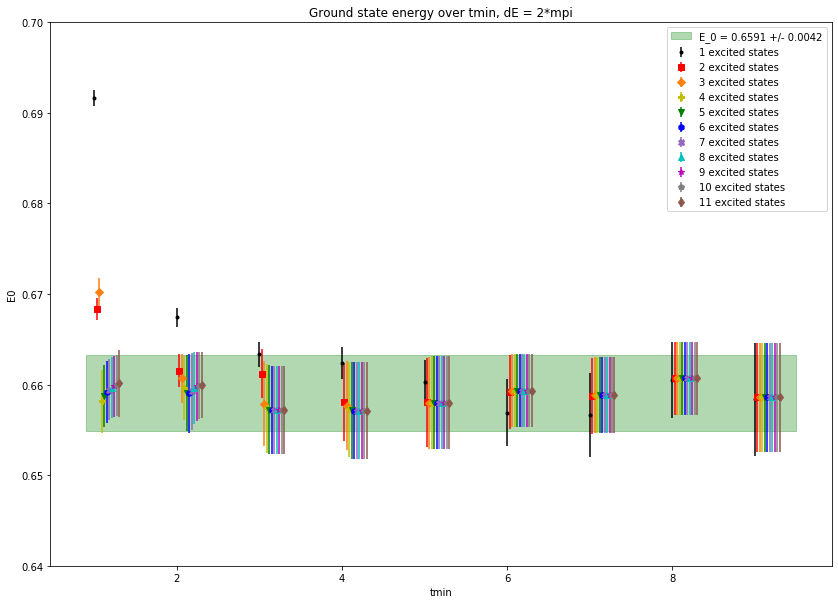

<Figure size 432x288 with 0 Axes>

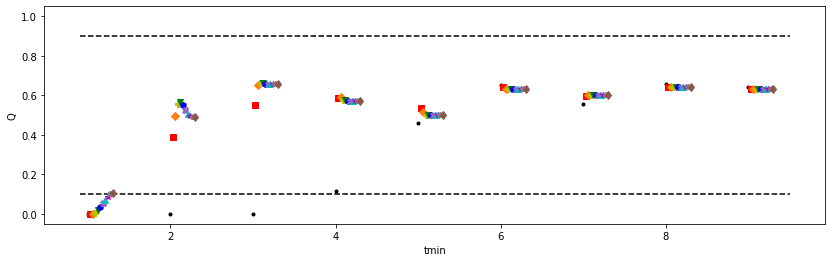

<Figure size 432x288 with 0 Axes>

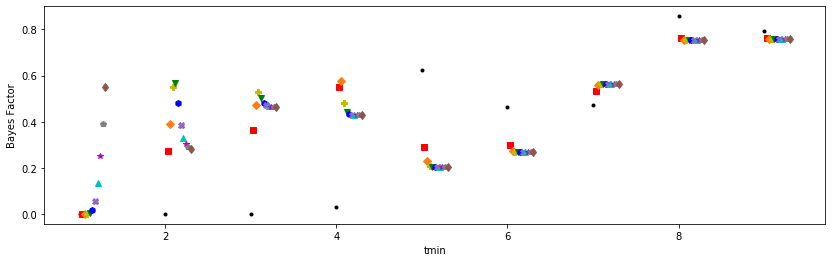

<Figure size 432x288 with 0 Axes>

In [23]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a0_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a0_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a0)):
       
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a0[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a0[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))
plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[4][1].mean + E0_tmin_bmax_a0[4][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[4][1].mean - E0_tmin_bmax_a0[4][1].sdev  for i in tmin_samp_line], color="green",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[4][1].mean, E0_tmin_bmax_a0[4][1].sdev))
plt.title("Ground state energy over tmin, dE = 2*mpi")
plt.xlabel("tmin")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a0)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a0[i][k] for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a0)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a0[i][k] for k in range(len(tmin))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()

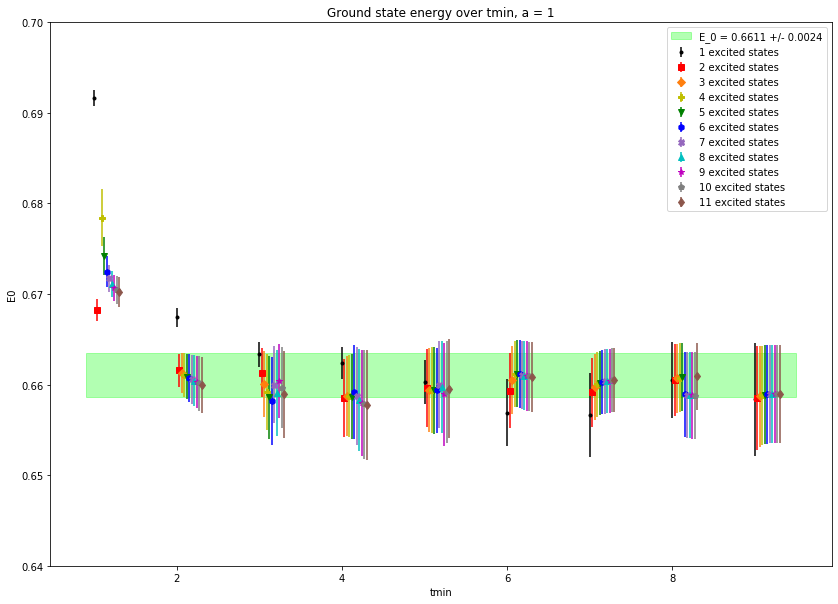

<Figure size 432x288 with 0 Axes>

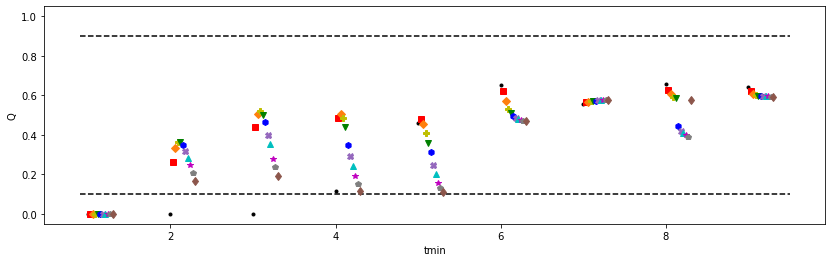

<Figure size 432x288 with 0 Axes>

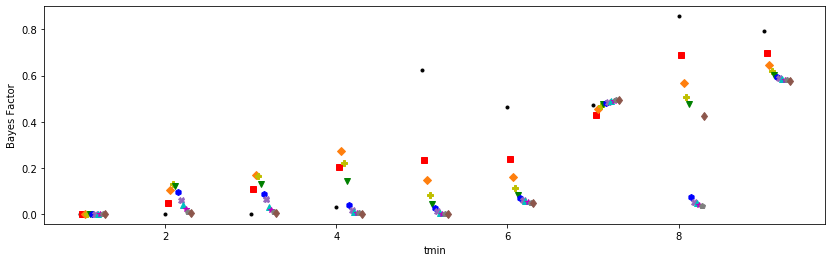

<Figure size 432x288 with 0 Axes>

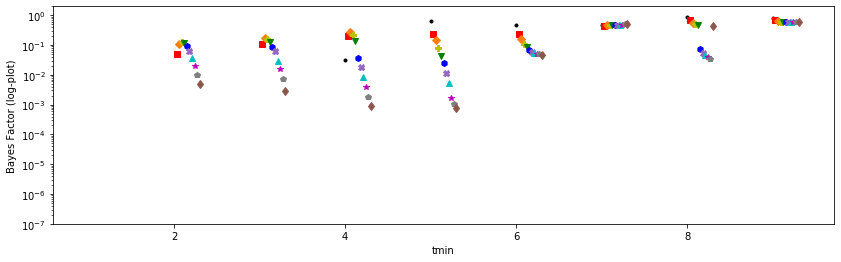

In [24]:
# Make a plot of E0 values vs tmin for a=1 , with a Q-plot and a Bayes factor plot right below, 
a1_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a1_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a1)):
       
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a1[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a1[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a1[3][1].mean + E0_tmin_bmax_a1[3][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a1[3][1].mean - E0_tmin_bmax_a1[3][1].sdev  for i in tmin_samp_line], color="lime",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a1[3][1].mean, E0_tmin_bmax_a1[3][1].sdev))
plt.title("Ground state energy over tmin, a = 1")
plt.xlabel("tmin")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a1)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a1[i][k] for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a1)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a1[i][k] for k in range(len(tmin))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a1_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a1)):
        
    plt.semilogy(tmin+ i*0.03, [BF_tmin_bmax_a1[i][k] for k in range(len(tmin))], '.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        
        
plt.xlabel("tmin")
plt.ylabel("Bayes Factor (log-plot)")
plt.ylim(1e-7, 2)
plt.show()



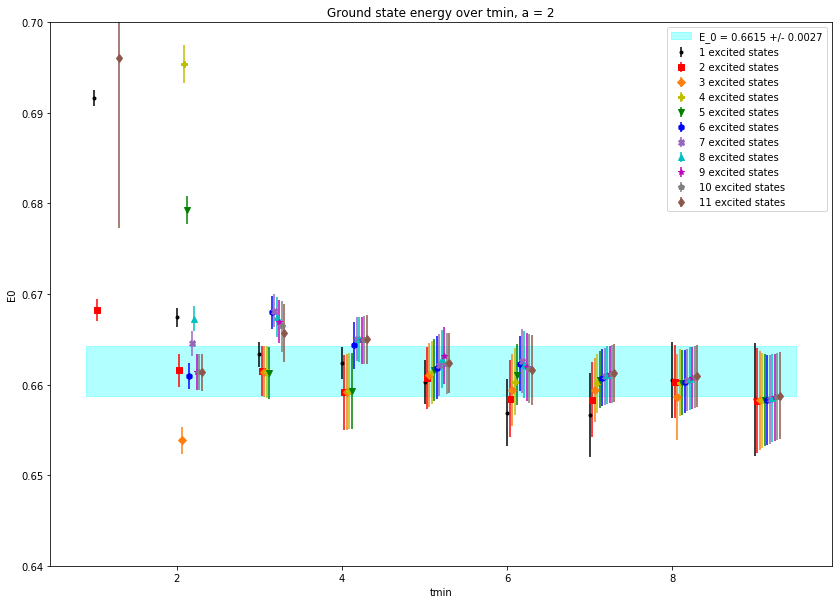

<Figure size 432x288 with 0 Axes>

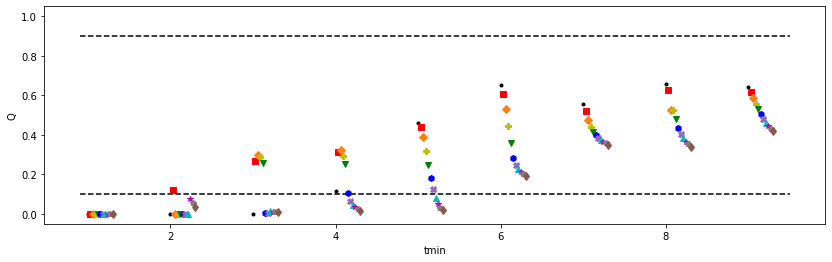

<Figure size 432x288 with 0 Axes>

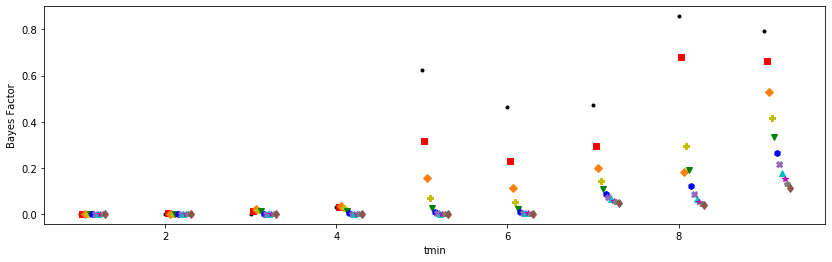

<Figure size 432x288 with 0 Axes>

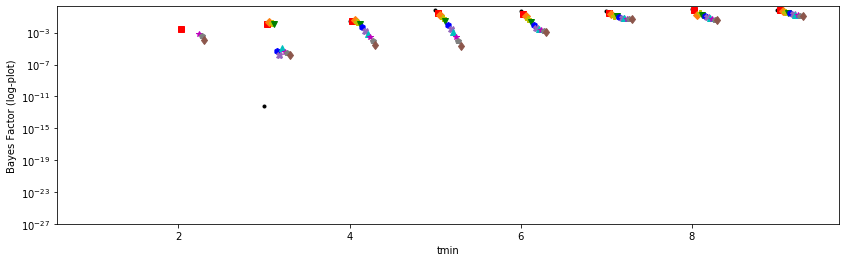

In [25]:
# Make a plot of E0 values vs tmin for a=2 , with a Q-plot and a Bayes factor plot right below, 
a2_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a2_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmin_bmax_a2)):
    E0_tmin_bmax_a2[i]
    plt.errorbar(tmin+ i*0.03, [E0_tmin_bmax_a2[i][k].mean for k in range(len(tmin))], yerr = [E0_tmin_bmax_a2[i][k].sdev for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a2[1][2].mean + E0_tmin_bmax_a2[1][2].sdev for i in tmin_samp_line], [E0_tmin_bmax_a2[1][2].mean - E0_tmin_bmax_a2[1][2].sdev  for i in tmin_samp_line], color="cyan",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a2[1][2].mean, E0_tmin_bmax_a2[1][2].sdev))
plt.title("Ground state energy over tmin, a = 2")
plt.xlabel("tmin")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmin_bmax_a2)):
        
    plt.errorbar(tmin+ i*0.03, [Q_tmin_bmax_a2[i][k] for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a2_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmin_samp_line, Q_01_line, "k--")
plt.plot(tmin_samp_line, Q_09_line, "k--")
plt.xlabel("tmin")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a2)):
        
    plt.errorbar(tmin+ i*0.03, [BF_tmin_bmax_a2[i][k] for k in range(len(tmin))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmin_bmax_a2)):
        
    plt.semilogy(tmin+ i*0.03, [BF_tmin_bmax_a2[i][k] for k in range(len(tmin))], '.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmin")
plt.ylabel("Bayes Factor (log-plot)")
plt.ylim(1e-27, 2)
plt.show()


## Now, do the same with tmax 

In [26]:
# Test to see if tmax affects the fit at all
tmax = np.array([13, 15, 18, 20, 22, 25])

list_tmax_LogGBF_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a0 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

list_tmax_LogGBF_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a1 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

list_tmax_LogGBF_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_Q_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
list_tmax_E0_a2 = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

In [27]:
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmax)):
            num_zs = j + np.min(num_fitsamples) + 1
            fit_a0 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[0]][i],fcn=C_2pt,debug=True)
            fit_a1 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[1]][i],fcn=C_2pt,debug=True)
            fit_a2 = lsqfit.nonlinear_fit(data=(np.array([l for l in range(2, tmax[k])]), np.array([avg_data_original['proton'][l] for l in range(2, tmax[k])])), prior=priors[a_select_indices[2]][i],fcn=C_2pt,debug=True)
            
            print("\ni = ", i, " j = ", j, " k = ", k, "\n")
            
            list_tmax_LogGBF_a0[i][j][k] = fit_a0.logGBF
            list_tmax_Q_a0[i][j][k] = fit_a0.Q
            list_tmax_E0_a0[i][j][k] = fit_a0.p['E0']
            
            print("Fit for a = ", a[a_select_indices[0]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmax = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a0[i][j][k])
            print("list Q: ", list_tmax_Q_a0[i][j][k])
            print("list E0: ", list_tmax_E0_a0[i][j][k])
            print(fit_a0.format(pstyle='vv'))
            
            list_tmax_LogGBF_a1[i][j][k] = fit_a1.logGBF
            list_tmax_Q_a1[i][j][k] = fit_a1.Q
            list_tmax_E0_a1[i][j][k] = fit_a1.p['E0']
            
            print("Fit for a = ", a[a_select_indices[1]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a1[i][j][k])
            print("list Q: ", list_tmax_Q_a1[i][j][k])
            print("list E0: ", list_tmax_E0_a1[i][j][k])
            print(fit_a1.format(pstyle='vv'))
            
            list_tmax_LogGBF_a2[i][j][k] = fit_a2.logGBF
            list_tmax_Q_a2[i][j][k] = fit_a2.Q
            list_tmax_E0_a2[i][j][k] = fit_a2.p['E0']
            
            print("Fit for a = ", a[a_select_indices[2]], ", b = ", b[i], ", ", j + np.min(num_fitsamples), " excited states, tmin = ", tmax[k])
            print("list logGBF: ", list_tmax_LogGBF_a2[i][j][k])
            print("list Q: ", list_tmax_Q_a2[i][j][k])
            print("list E0: ", list_tmax_E0_a2[i][j][k])
            print(fit_a2.format(pstyle='vv'))


i =  0  j =  0  k =  0 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  13
list logGBF:  243.38743595822694
list Q:  2.3377763397504414e-97
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 2.3e-97    logGBF = 243.39

Parameters:
             E0       0.667565 +- 0.0010806            [     0.67 +- 0.02 ]  
             Z0   0.00078576 +- 2.52295e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303828 +- 1.21843e-05            [   0.003 +- 0.003 ]  
             Z1    0.00125254 +- 3.7634e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00918085 +- 4.28628e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127863 +- 0.00678993            [  -0.97551 +- 0.3 ]  **
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.


i =  0  j =  0  k =  1 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  15
list logGBF:  349.71327453232954
list Q:  2.978416329970772e-96
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 21 [26]    Q = 3e-96    logGBF = 349.71

Parameters:
             E0       0.667545 +- 0.00107908             [     0.67 +- 0.02 ]  
             Z0   0.000785434 +- 2.51981e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303662 +- 1.21486e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125233 +- 3.74683e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917193 +- 4.25548e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.129135 +- 0.00673945             [  -0.97551 +- 0.3 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  0  j =  0  k =  2 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  18
list logGBF:  516.4543213390864
list Q:  9.77408372174606e-94
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 9.8e-94    logGBF = 516.45

Parameters:
             E0       0.667517 +- 0.00107743             [     0.67 +- 0.02 ]  
             Z0   0.000785421 +- 2.51669e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303616 +- 1.21316e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125224 +- 3.75086e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917145 +- 4.25722e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.12838 +- 0.00674036             [  -0.97551 +- 0.3 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  0  j =  0  k =  3 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  20
list logGBF:  629.8333527485802
list Q:  1.5172646172116884e-92
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 1.5e-92    logGBF = 629.83

Parameters:
             E0       0.667363 +- 0.00107305             [     0.67 +- 0.02 ]  
             Z0   0.000785039 +- 2.50517e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303473 +- 1.20961e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125291 +- 3.73541e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917236 +- 4.23378e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.12803 +- 0.00670403             [  -0.97551 +- 0.3 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
            


i =  0  j =  0  k =  4 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  22
list logGBF:  746.5108781419336
list Q:  5.450947378777909e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 5.5e-91    logGBF = 746.51

Parameters:
             E0       0.667411 +- 0.00107212             [     0.67 +- 0.02 ]  
             Z0   0.000785098 +- 2.50338e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303492 +- 1.2079e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125263 +- 3.72373e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917145 +- 4.21995e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128577 +- 0.00669193             [  -0.97551 +- 0.3 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             


i =  0  j =  0  k =  5 

Fit for a =  0.0 , b =  0.3 ,  1  excited states, tmax =  25
list logGBF:  923.3434508548123
list Q:  8.23842539046903e-90
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 8.2e-90    logGBF = 923.34

Parameters:
             E0       0.667319 +- 0.00106714             [     0.67 +- 0.02 ]  
             Z0   0.000784954 +- 2.49708e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303444 +- 1.20298e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125179 +- 3.69655e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00916728 +- 4.20024e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.129522 +- 0.00665552             [  -0.97551 +- 0.3 ]  **
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  0  j =  1  k =  0 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  13
list logGBF:  486.1809232516755
list Q:  0.31140050911131095
list E0:  0.6613(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.31    logGBF = 486.18

Parameters:
             E0       0.661296 +- 0.00187511             [     0.67 +- 0.02 ]  
             Z0   0.000758279 +- 5.94418e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028678 +- 2.83926e-05             [   0.003 +- 0.003 ]  
             Z1     0.000710137 +- 4.143e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00485866 +- 0.000309551             [       0 +- 0.005 ]  
       log(dE1)        -0.759468 +- 0.064539             [  -0.97551 +- 0.3 ]  
             Z2    0.00132886 +- 2.18607e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00987412 +- 0.000223327             [       0 +- 0.005 ]  *
       log(dE2)       -0.104693 +- 0.0525135             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  0  j =  1  k =  1 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  15
list logGBF:  591.3647500508973
list Q:  0.11486850754640633
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.11    logGBF = 591.36

Parameters:
             E0       0.661554 +- 0.00184806             [     0.67 +- 0.02 ]  
             Z0   0.000759119 +- 5.80895e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287326 +- 2.76712e-05             [   0.003 +- 0.003 ]  
             Z1    0.00071645 +- 4.20419e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00491191 +- 0.000313814             [       0 +- 0.005 ]  
       log(dE1)       -0.745206 +- 0.0636086             [  -0.97551 +- 0.3 ]  
             Z2     0.00132969 +- 2.2829e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00987421 +- 0.000231068             [       0 +- 0.005 ]  *
       log(dE2)       -0.101531 +- 0.0546378             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  0  j =  1  k =  2 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  18
list logGBF:  760.4716573131642
list Q:  0.26388829629027205
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.26    logGBF = 760.47

Parameters:
             E0       0.661533 +- 0.00183981             [     0.67 +- 0.02 ]  
             Z0   0.000759075 +- 5.78608e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002873 +- 2.75569e-05             [   0.003 +- 0.003 ]  
             Z1   0.000717258 +- 4.17826e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00491781 +- 0.000312413             [       0 +- 0.005 ]  
       log(dE1)       -0.743701 +- 0.0631286             [  -0.97551 +- 0.3 ]  
             Z2    0.00133041 +- 2.30497e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988061 +- 0.000232416             [       0 +- 0.005 ]  *
       log(dE2)      -0.0997771 +- 0.0547568             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  0  j =  1  k =  3 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  20
list logGBF:  875.127813669376
list Q:  0.29146041541546097
list E0:  0.6614(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.29    logGBF = 875.13

Parameters:
             E0       0.661427 +- 0.00182582             [     0.67 +- 0.02 ]  
             Z0   0.000758824 +- 5.73358e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287277 +- 2.7309e-05             [   0.003 +- 0.003 ]  
             Z1   0.000721088 +- 4.18684e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00494303 +- 0.000313341             [       0 +- 0.005 ]  
       log(dE1)       -0.738114 +- 0.0626383             [  -0.97551 +- 0.3 ]  
             Z2    0.00133091 +- 2.34631e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00987845 +- 0.000235274             [       0 +- 0.005 ]  *
       log(dE2)      -0.0973727 +- 0.0556044             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  0  j =  1  k =  4 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  22
list logGBF:  992.6421720084692
list Q:  0.3707021958342232
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [40]    Q = 0.37    logGBF = 992.64

Parameters:
             E0       0.661461 +- 0.00183222             [     0.67 +- 0.02 ]  
             Z0   0.000758743 +- 5.76147e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287198 +- 2.74274e-05             [   0.003 +- 0.003 ]  
             Z1   0.000716889 +- 4.17021e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00491315 +- 0.000311212             [       0 +- 0.005 ]  
       log(dE1)       -0.744208 +- 0.0628591             [  -0.97551 +- 0.3 ]  
             Z2    0.00132901 +- 2.26572e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00985822 +- 0.000228525             [       0 +- 0.005 ]  *
       log(dE2)       -0.102298 +- 0.0544421             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  0  j =  1  k =  5 

Fit for a =  0.0 , b =  0.3 ,  2  excited states, tmax =  25
list logGBF:  1172.5553519149848
list Q:  0.4284364369573481
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.43    logGBF = 1172.6

Parameters:
             E0       0.661614 +- 0.00180564             [     0.67 +- 0.02 ]  
             Z0   0.000759396 +- 5.65843e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287512 +- 2.69152e-05             [   0.003 +- 0.003 ]  
             Z1   0.000718945 +- 4.17465e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00494123 +- 0.000310957             [       0 +- 0.005 ]  
       log(dE1)         -0.73879 +- 0.062067             [  -0.97551 +- 0.3 ]  
             Z2    0.00132987 +- 2.31503e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00985301 +- 0.00023151             [       0 +- 0.005 ]  *
       log(dE2)       -0.100112 +- 0.0552742             [  -0.97551 +- 0.7 ]  *
             Z3     


i =  0  j =  2  k =  0 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  13
list logGBF:  486.4750679506226
list Q:  0.43927587928353223
list E0:  0.6608(27)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.44    logGBF = 486.48

Parameters:
             E0        0.66084 +- 0.00268473             [     0.67 +- 0.02 ]  
             Z0   0.000756163 +- 9.76288e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285733 +- 4.40468e-05             [   0.003 +- 0.003 ]  
             Z1   0.000674225 +- 6.34047e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00454226 +- 0.000535424             [       0 +- 0.005 ]  
       log(dE1)        -0.809793 +- 0.104359             [  -0.97551 +- 0.3 ]  
             Z2    0.000838732 +- 0.00027763             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00640105 +- 0.00216169             [       0 +- 0.005 ]  *
       log(dE2)        -0.400046 +- 0.247338             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  2  k =  1 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  15
list logGBF:  591.6861446148816
list Q:  0.1809830896906884
list E0:  0.6608(27)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.69

Parameters:
             E0       0.660793 +- 0.00267893             [     0.67 +- 0.02 ]  
             Z0    0.000755795 +- 9.7436e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028576 +- 4.38813e-05             [   0.003 +- 0.003 ]  
             Z1   0.000677586 +- 6.49923e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00453397 +- 0.00055053             [       0 +- 0.005 ]  
       log(dE1)         -0.80606 +- 0.106124             [  -0.97551 +- 0.3 ]  
             Z2   0.000830124 +- 0.000280733             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00651585 +- 0.00213668             [       0 +- 0.005 ]  *
       log(dE2)         -0.40411 +- 0.252979             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  2  k =  2 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  18
list logGBF:  760.7930163415815
list Q:  0.36987252510681734
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 760.79

Parameters:
             E0       0.660596 +- 0.00269632             [     0.67 +- 0.02 ]  
             Z0   0.000755038 +- 9.84842e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028542 +- 4.4328e-05             [   0.003 +- 0.003 ]  
             Z1   0.000675973 +- 6.59639e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00450118 +- 0.000557677             [       0 +- 0.005 ]  
       log(dE1)        -0.811845 +- 0.108035             [  -0.97551 +- 0.3 ]  
             Z2   0.000822362 +- 0.000282976             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00653902 +- 0.00212458             [       0 +- 0.005 ]  *
       log(dE2)        -0.410896 +- 0.258547             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  0  j =  2  k =  3 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  20
list logGBF:  875.461287730455
list Q:  0.3969222314585427
list E0:  0.6605(27)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 875.46

Parameters:
             E0       0.660463 +- 0.00267796             [     0.67 +- 0.02 ]  
             Z0   0.000754706 +- 9.75842e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285368 +- 4.39261e-05             [   0.003 +- 0.003 ]  
             Z1   0.000680121 +- 6.56208e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00452559 +- 0.000556459             [       0 +- 0.005 ]  
       log(dE1)        -0.805923 +- 0.106876             [  -0.97551 +- 0.3 ]  
             Z2   0.000822226 +- 0.000283252             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0065602 +- 0.0021233             [       0 +- 0.005 ]  *
       log(dE2)         -0.407233 +- 0.25786             [  -0.97551 +- 0.7 ]  
             Z3    0.0011


i =  0  j =  2  k =  4 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  22
list logGBF:  992.9582663395876
list Q:  0.4858715304814154
list E0:  0.6603(27)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.96

Parameters:
             E0       0.660313 +- 0.00274351             [     0.67 +- 0.02 ]  
             Z0   0.000753828 +- 1.01003e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284924 +- 4.54066e-05             [   0.003 +- 0.003 ]  
             Z1   0.000670108 +- 6.96415e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00443216 +- 0.000582788             [       0 +- 0.005 ]  
       log(dE1)        -0.824164 +- 0.113514             [  -0.97551 +- 0.3 ]  
             Z2    0.00080984 +- 0.000285925             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00650165 +- 0.00210556             [       0 +- 0.005 ]  *
       log(dE2)        -0.434684 +- 0.272908             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  0  j =  2  k =  5 

Fit for a =  0.0 , b =  0.3 ,  3  excited states, tmax =  25
list logGBF:  1172.8877496582495
list Q:  0.5456898145330525
list E0:  0.6602(28)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.9

Parameters:
             E0       0.660198 +- 0.00277094             [     0.67 +- 0.02 ]  
             Z0   0.000753363 +- 1.02931e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284741 +- 4.62075e-05             [   0.003 +- 0.003 ]  
             Z1   0.000666689 +- 7.29613e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.004386 +- 0.000609734             [       0 +- 0.005 ]  
       log(dE1)        -0.831934 +- 0.118589             [  -0.97551 +- 0.3 ]  
             Z2   0.000792943 +- 0.000290077             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00647834 +- 0.00209131             [       0 +- 0.005 ]  *
       log(dE2)        -0.454846 +- 0.287463             [  -0.97551 +- 0.7 ]  
             Z3    


i =  0  j =  3  k =  0 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  13
list logGBF:  486.7569694675349
list Q:  0.5178980585277714
list E0:  0.6601(34)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 486.76

Parameters:
             E0       0.660079 +- 0.00338219             [     0.67 +- 0.02 ]  
             Z0   0.000752302 +- 1.35398e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283881 +- 5.95965e-05             [   0.003 +- 0.003 ]  
             Z1   0.000591249 +- 0.000119322             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00381891 +- 0.000988118             [       0 +- 0.005 ]  
       log(dE1)        -0.928158 +- 0.194298             [  -0.97551 +- 0.3 ]  
             Z2   0.000675272 +- 0.000286516             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00544032 +- 0.00205797             [       0 +- 0.005 ]  *
       log(dE2)        -0.770918 +- 0.450395             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  3  k =  1 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  15
list logGBF:  591.9959039773527
list Q:  0.22784270008206334
list E0:  0.6600(34)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 592

Parameters:
             E0        0.659957 +- 0.0033657             [     0.67 +- 0.02 ]  
             Z0   0.000751664 +- 1.34671e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283832 +- 5.91053e-05             [   0.003 +- 0.003 ]  
             Z1   0.000597413 +- 0.000118738             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0038192 +- 0.00099213             [       0 +- 0.005 ]  
       log(dE1)        -0.922331 +- 0.194039             [  -0.97551 +- 0.3 ]  
             Z2   0.000672484 +- 0.000287116             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0055405 +- 0.00204586             [       0 +- 0.005 ]  *
       log(dE2)        -0.764412 +- 0.446246             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  3  k =  2 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  18
list logGBF:  761.1064877402302
list Q:  0.4367571113547974
list E0:  0.6597(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 761.11

Parameters:
             E0       0.659668 +- 0.00341291             [     0.67 +- 0.02 ]  
             Z0    0.000750482 +- 1.3761e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028332 +- 6.02685e-05             [   0.003 +- 0.003 ]  
             Z1   0.000595016 +- 0.000118735             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00376876 +- 0.000994327             [       0 +- 0.005 ]  
       log(dE1)        -0.933255 +- 0.198304             [  -0.97551 +- 0.3 ]  
             Z2   0.000669699 +- 0.000285701             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00559162 +- 0.00201763             [       0 +- 0.005 ]  *
       log(dE2)        -0.767057 +- 0.443455             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  0  j =  3  k =  3 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  20
list logGBF:  875.7728551566074
list Q:  0.4618703347992419
list E0:  0.6595(34)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.77

Parameters:
             E0       0.659524 +- 0.00339764             [     0.67 +- 0.02 ]  
             Z0   0.000750124 +- 1.36718e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283264 +- 5.98474e-05             [   0.003 +- 0.003 ]  
             Z1   0.000598409 +- 0.000119528             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00378588 +- 0.00100282             [       0 +- 0.005 ]  
       log(dE1)         -0.92704 +- 0.197444             [  -0.97551 +- 0.3 ]  
             Z2   0.000667954 +- 0.000285539             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00559042 +- 0.00201131             [       0 +- 0.005 ]  *
       log(dE2)        -0.770358 +- 0.446535             [  -0.97551 +- 0.7 ]  
             Z3     0.0


i =  0  j =  3  k =  4 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  22
list logGBF:  993.308254360279
list Q:  0.5528159795398666
list E0:  0.6594(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.31

Parameters:
             E0         0.65936 +- 0.0034643             [     0.67 +- 0.02 ]  
             Z0   0.000749152 +- 1.40598e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282791 +- 6.14716e-05             [   0.003 +- 0.003 ]  
             Z1   0.000592438 +- 0.000118044             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00372264 +- 0.000988343             [       0 +- 0.005 ]  
       log(dE1)        -0.944495 +- 0.201863             [  -0.97551 +- 0.3 ]  
             Z2    0.00067248 +- 0.000284211             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00565797 +- 0.00200309             [       0 +- 0.005 ]  *
       log(dE2)        -0.763084 +- 0.435744             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  3  k =  5 

Fit for a =  0.0 , b =  0.3 ,  4  excited states, tmax =  25
list logGBF:  1173.2527636744776
list Q:  0.6116348102242168
list E0:  0.6591(35)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1173.3

Parameters:
             E0       0.659136 +- 0.00353893             [     0.67 +- 0.02 ]  
             Z0   0.000748184 +- 1.45287e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028241 +- 6.32999e-05             [   0.003 +- 0.003 ]  
             Z1    0.00058933 +- 0.000118269             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00366349 +- 0.000995642             [       0 +- 0.005 ]  
       log(dE1)        -0.957118 +- 0.208172             [  -0.97551 +- 0.3 ]  
             Z2   0.000667484 +- 0.000281928             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00572344 +- 0.00196543             [       0 +- 0.005 ]  *
       log(dE2)         -0.769705 +- 0.43162             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  4  k =  0 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  13
list logGBF:  486.79057600725514
list Q:  0.533865883751945
list E0:  0.6599(36)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 486.79

Parameters:
             E0        0.659899 +- 0.0036484             [     0.67 +- 0.02 ]  
             Z0   0.000751265 +- 1.50438e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283391 +- 6.53533e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560635 +- 0.000129757             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356331 +- 0.00107248             [       0 +- 0.005 ]  
       log(dE1)        -0.973238 +- 0.222603             [  -0.97551 +- 0.3 ]  
             Z2   0.000653059 +- 0.000276839             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.005314 +- 0.00212061             [       0 +- 0.005 ]  *
       log(dE2)         -0.856678 +- 0.47542             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  4  k =  1 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  15
list logGBF:  592.0467182617898
list Q:  0.23886049558081587
list E0:  0.6598(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 592.05

Parameters:
             E0       0.659756 +- 0.00361806             [     0.67 +- 0.02 ]  
             Z0   0.000750552 +- 1.48948e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283326 +- 6.45419e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568457 +- 0.000128397             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357231 +- 0.00107162             [       0 +- 0.005 ]  
       log(dE1)        -0.965445 +- 0.220984             [  -0.97551 +- 0.3 ]  
             Z2   0.000649492 +- 0.000277647             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00540466 +- 0.00212797             [       0 +- 0.005 ]  *
       log(dE2)        -0.848224 +- 0.470143             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  0  j =  4  k =  2 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  18
list logGBF:  761.1687809213162
list Q:  0.4518553896109773
list E0:  0.6595(37)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 761.17

Parameters:
             E0       0.659462 +- 0.00365371             [     0.67 +- 0.02 ]  
             Z0   0.000749349 +- 1.51362e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028281 +- 6.54951e-05             [   0.003 +- 0.003 ]  
             Z1    0.000567985 +- 0.00012678             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353621 +- 0.00105956             [       0 +- 0.005 ]  
       log(dE1)        -0.974908 +- 0.223239             [  -0.97551 +- 0.3 ]  
             Z2   0.000647681 +- 0.000276894             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00546138 +- 0.00211739             [       0 +- 0.005 ]  *
       log(dE2)        -0.843561 +- 0.463947             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  4  k =  3 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  20
list logGBF:  875.8387568126035
list Q:  0.4768609736076731
list E0:  0.6593(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 875.84

Parameters:
             E0       0.659313 +- 0.00363893             [     0.67 +- 0.02 ]  
             Z0   0.000748972 +- 1.50467e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282749 +- 6.50669e-05             [   0.003 +- 0.003 ]  
             Z1   0.000571078 +- 0.000127769             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354989 +- 0.00107034             [       0 +- 0.005 ]  
       log(dE1)        -0.968751 +- 0.222635             [  -0.97551 +- 0.3 ]  
             Z2   0.000646463 +- 0.000276407             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00546656 +- 0.00211026             [       0 +- 0.005 ]  *
       log(dE2)        -0.847633 +- 0.466594             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  4  k =  4 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  22
list logGBF:  993.3820055936789
list Q:  0.567170178579652
list E0:  0.6592(37)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 993.38

Parameters:
             E0       0.659166 +- 0.00369307             [     0.67 +- 0.02 ]  
             Z0   0.000748072 +- 1.53727e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282307 +- 6.64577e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056741 +- 0.000124849             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00350795 +- 0.00104214             [       0 +- 0.005 ]  
       log(dE1)        -0.983875 +- 0.224776             [  -0.97551 +- 0.3 ]  
             Z2   0.000650647 +- 0.000276373             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00552093 +- 0.00212291             [       0 +- 0.005 ]  *
       log(dE2)        -0.833086 +- 0.454589             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  4  k =  5 

Fit for a =  0.0 , b =  0.3 ,  5  excited states, tmax =  25
list logGBF:  1173.3446909657619
list Q:  0.6256046198148872
list E0:  0.6589(37)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1173.3

Parameters:
             E0       0.658948 +- 0.00374961             [     0.67 +- 0.02 ]  
             Z0   0.000747134 +- 1.57468e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281944 +- 6.79193e-05             [   0.003 +- 0.003 ]  
             Z1   0.000566703 +- 0.000123278             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346822 +- 0.00103271             [       0 +- 0.005 ]  
       log(dE1)        -0.993983 +- 0.228254             [  -0.97551 +- 0.3 ]  
             Z2    0.000648396 +- 0.00027492             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00560229 +- 0.0021086             [       0 +- 0.005 ]  *
       log(dE2)         -0.829612 +- 0.44668             [  -0.97551 +- 0.7 ]  
             Z3    


i =  0  j =  5  k =  0 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  13
list logGBF:  486.59801875139476
list Q:  0.5100981584195174
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 486.6

Parameters:
             E0       0.659992 +- 0.00370375             [     0.67 +- 0.02 ]  
             Z0     0.00075158 +- 1.5356e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283482 +- 6.64524e-05             [   0.003 +- 0.003 ]  
             Z1   0.000544879 +- 0.000136571             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347133 +- 0.00109836             [       0 +- 0.005 ]  
       log(dE1)         -0.98894 +- 0.231374             [  -0.97551 +- 0.3 ]  
             Z2   0.000648347 +- 0.000272321             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00515211 +- 0.00219019             [       0 +- 0.005 ]  *
       log(dE2)        -0.896414 +- 0.493186             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  5  k =  1 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  15
list logGBF:  591.875058684791
list Q:  0.22568927628057756
list E0:  0.6598(37)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.88

Parameters:
             E0        0.65984 +- 0.00366365             [     0.67 +- 0.02 ]  
             Z0   0.000750837 +- 1.51542e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283413 +- 6.54483e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553854 +- 0.000134885             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00348603 +- 0.00109809             [       0 +- 0.005 ]  
       log(dE1)        -0.979755 +- 0.229343             [  -0.97551 +- 0.3 ]  
             Z2   0.000644636 +- 0.000273331             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00524028 +- 0.0022057             [       0 +- 0.005 ]  *
       log(dE2)        -0.886618 +- 0.488108             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  5  k =  2 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  18
list logGBF:  761.003214784765
list Q:  0.4351710421734636
list E0:  0.6595(37)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 761

Parameters:
             E0       0.659545 +- 0.00369437             [     0.67 +- 0.02 ]  
             Z0   0.000749627 +- 1.53719e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282895 +- 6.63217e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554076 +- 0.000132828             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345403 +- 0.00108327             [       0 +- 0.005 ]  
       log(dE1)        -0.988799 +- 0.231156             [  -0.97551 +- 0.3 ]  
             Z2   0.000642781 +- 0.000273106             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529688 +- 0.00220134             [       0 +- 0.005 ]  *
       log(dE2)        -0.879794 +- 0.481522             [  -0.97551 +- 0.7 ]  
             Z3   0.0006972


i =  0  j =  5  k =  3 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  20
list logGBF:  875.6784931928448
list Q:  0.4613574849280551
list E0:  0.6594(37)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.68

Parameters:
             E0       0.659394 +- 0.00367876             [     0.67 +- 0.02 ]  
             Z0   0.000749244 +- 1.52785e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282834 +- 6.58762e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557112 +- 0.000133891             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346657 +- 0.00109529             [       0 +- 0.005 ]  
       log(dE1)        -0.982548 +- 0.230641             [  -0.97551 +- 0.3 ]  
             Z2   0.000641416 +- 0.000272572             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530316 +- 0.00219377             [       0 +- 0.005 ]  *
       log(dE2)        -0.884649 +- 0.484447             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  5  k =  4 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  22
list logGBF:  993.2220385565114
list Q:  0.5517863116492563
list E0:  0.6593(37)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.22

Parameters:
             E0       0.659256 +- 0.00372918             [     0.67 +- 0.02 ]  
             Z0   0.000748382 +- 1.55832e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282406 +- 6.71928e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554136 +- 0.000130662             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00343094 +- 0.0010641             [       0 +- 0.005 ]  
       log(dE1)        -0.997022 +- 0.232248             [  -0.97551 +- 0.3 ]  
             Z2   0.000645346 +- 0.000273067             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00535019 +- 0.00221307             [       0 +- 0.005 ]  *
       log(dE2)        -0.867904 +- 0.472261             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  5  k =  5 

Fit for a =  0.0 , b =  0.3 ,  6  excited states, tmax =  25
list logGBF:  1173.1917639009419
list Q:  0.611779952467899
list E0:  0.6590(38)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1173.2

Parameters:
             E0       0.659037 +- 0.00378033             [     0.67 +- 0.02 ]  
             Z0   0.000747442 +- 1.59301e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282045 +- 6.85594e-05             [   0.003 +- 0.003 ]  
             Z1     0.000554061 +- 0.0001287             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00339476 +- 0.00105218             [       0 +- 0.005 ]  
       log(dE1)         -1.00671 +- 0.235277             [  -0.97551 +- 0.3 ]  
             Z2   0.000642949 +- 0.000272198             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0054307 +- 0.00220601             [       0 +- 0.005 ]  *
       log(dE2)        -0.862638 +- 0.464383             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  6  k =  0 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  13
list logGBF:  486.34320720855885
list Q:  0.4739661950930665
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 486.34

Parameters:
             E0       0.660182 +- 0.00366382             [     0.67 +- 0.02 ]  
             Z0   0.000752424 +- 1.51172e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283809 +- 6.54682e-05             [   0.003 +- 0.003 ]  
             Z1   0.000539273 +- 0.000141337             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347392 +- 0.00110627             [       0 +- 0.005 ]  
       log(dE1)        -0.987114 +- 0.231001             [  -0.97551 +- 0.3 ]  
             Z2   0.000659087 +- 0.000268499             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00508056 +- 0.00222213             [       0 +- 0.005 ]  *
       log(dE2)        -0.902053 +- 0.500478             [  -0.97551 +- 0.7 ]  
             Z3    


i =  0  j =  6  k =  1 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  15
list logGBF:  591.6428828073626
list Q:  0.20573900697560318
list E0:  0.6600(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 591.64

Parameters:
             E0       0.660033 +- 0.00361586             [     0.67 +- 0.02 ]  
             Z0   0.000751699 +- 1.48723e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283749 +- 6.43145e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549122 +- 0.000139495             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349406 +- 0.00110734             [       0 +- 0.005 ]  
       log(dE1)        -0.976737 +- 0.228676             [  -0.97551 +- 0.3 ]  
             Z2   0.000655485 +- 0.000269582             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516449 +- 0.00224214             [       0 +- 0.005 ]  *
       log(dE2)        -0.891251 +- 0.496102             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  6  k =  2 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  18
list logGBF:  760.7731165301573
list Q:  0.4085509318069613
list E0:  0.6597(36)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 760.77

Parameters:
             E0       0.659739 +- 0.00364545             [     0.67 +- 0.02 ]  
             Z0   0.000750493 +- 1.50835e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283233 +- 6.51735e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549351 +- 0.000137438             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346061 +- 0.00109397             [       0 +- 0.005 ]  
       log(dE1)        -0.985921 +- 0.230726             [  -0.97551 +- 0.3 ]  
             Z2   0.000653095 +- 0.000269773             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00521976 +- 0.00223828             [       0 +- 0.005 ]  *
       log(dE2)        -0.884703 +- 0.489977             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  6  k =  3 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  20
list logGBF:  875.454502332833
list Q:  0.4361260844225321
list E0:  0.6596(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 875.45

Parameters:
             E0        0.65959 +- 0.00362788             [     0.67 +- 0.02 ]  
             Z0   0.000750116 +- 1.49812e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283175 +- 6.46971e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552524 +- 0.000138509             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347427 +- 0.00110653             [       0 +- 0.005 ]  
       log(dE1)        -0.979419 +- 0.230156             [  -0.97551 +- 0.3 ]  
             Z2    0.00065166 +- 0.000269262             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522519 +- 0.00223142             [       0 +- 0.005 ]  *
       log(dE2)        -0.889573 +- 0.493213             [  -0.97551 +- 0.7 ]  
             Z3   0.0006


i =  0  j =  6  k =  4 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  22
list logGBF:  992.9953620305718
list Q:  0.5267216184898458
list E0:  0.6595(37)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 993

Parameters:
             E0       0.659456 +- 0.00367824             [     0.67 +- 0.02 ]  
             Z0   0.000749274 +- 1.52821e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282755 +- 6.59977e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549481 +- 0.000135285             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00343741 +- 0.00107548             [       0 +- 0.005 ]  
       log(dE1)         -0.994026 +- 0.23186             [  -0.97551 +- 0.3 ]  
             Z2   0.000655496 +- 0.000269925             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00527239 +- 0.00225002             [       0 +- 0.005 ]  *
       log(dE2)        -0.872801 +- 0.480832             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  6  k =  5 

Fit for a =  0.0 , b =  0.3 ,  7  excited states, tmax =  25
list logGBF:  1172.9665082224387
list Q:  0.5886301698877155
list E0:  0.6592(37)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1173

Parameters:
             E0       0.659238 +- 0.00372803             [     0.67 +- 0.02 ]  
             Z0   0.000748335 +- 1.56232e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282394 +- 6.73532e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549263 +- 0.000133394             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00339851 +- 0.0010656             [       0 +- 0.005 ]  
       log(dE1)           -1.0041 +- 0.23531             [  -0.97551 +- 0.3 ]  
             Z2    0.00065244 +- 0.000269502             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053512 +- 0.00224328             [       0 +- 0.005 ]  *
       log(dE2)        -0.868151 +- 0.473677             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  7  k =  0 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  13
list logGBF:  486.15365894585693
list Q:  0.44573730718331783
list E0:  0.6604(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 486.15

Parameters:
             E0       0.660365 +- 0.00358412             [     0.67 +- 0.02 ]  
             Z0   0.000753288 +- 1.46468e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284165 +- 6.36195e-05             [   0.003 +- 0.003 ]  
             Z1    0.00054227 +- 0.000142751             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353623 +- 0.00109685             [       0 +- 0.005 ]  
       log(dE1)        -0.974743 +- 0.224703             [  -0.97551 +- 0.3 ]  
             Z2    0.00067934 +- 0.000264128             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510752 +- 0.00223165             [       0 +- 0.005 ]  *
       log(dE2)        -0.881774 +- 0.497541             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  7  k =  1 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  15
list logGBF:  591.4704748208383
list Q:  0.1907089320956822
list E0:  0.6602(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 591.47

Parameters:
             E0       0.660225 +- 0.00353279             [     0.67 +- 0.02 ]  
             Z0     0.0007526 +- 1.43839e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284119 +- 6.24067e-05             [   0.003 +- 0.003 ]  
             Z1    0.000552341 +- 0.00014094             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00355862 +- 0.00109882             [       0 +- 0.005 ]  
       log(dE1)        -0.963972 +- 0.222279             [  -0.97551 +- 0.3 ]  
             Z2   0.000675516 +- 0.000265231             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00518334 +- 0.00225431             [       0 +- 0.005 ]  *
       log(dE2)        -0.871301 +- 0.494194             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  7  k =  2 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  18
list logGBF:  760.6006104296688
list Q:  0.3875634270659975
list E0:  0.6599(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 760.6

Parameters:
             E0       0.659934 +- 0.00356232             [     0.67 +- 0.02 ]  
             Z0   0.000751412 +- 1.45926e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283609 +- 6.32659e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552182 +- 0.000139184             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00352148 +- 0.00108908             [       0 +- 0.005 ]  
       log(dE1)         -0.97347 +- 0.224846             [  -0.97551 +- 0.3 ]  
             Z2   0.000672667 +- 0.000265709             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523871 +- 0.00224749             [       0 +- 0.005 ]  *
       log(dE2)        -0.865987 +- 0.488822             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  0  j =  7  k =  3 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  20
list logGBF:  875.2867876099303
list Q:  0.4160648271372399
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 875.29

Parameters:
             E0       0.659788 +- 0.00354331             [     0.67 +- 0.02 ]  
             Z0   0.000751045 +- 1.44845e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283554 +- 6.27708e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055553 +- 0.000140227             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353693 +- 0.00110153             [       0 +- 0.005 ]  
       log(dE1)          -0.96676 +- 0.22417             [  -0.97551 +- 0.3 ]  
             Z2   0.000670917 +- 0.000265272             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524001 +- 0.00224235             [       0 +- 0.005 ]  *
       log(dE2)         -0.870858 +- 0.49248             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  7  k =  4 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  22
list logGBF:  992.8235731156016
list Q:  0.5065600213772996
list E0:  0.6597(36)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.82

Parameters:
             E0        0.659653 +- 0.0035962             [     0.67 +- 0.02 ]  
             Z0     0.0007502 +- 1.47959e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283132 +- 6.41078e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551859 +- 0.000137247             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349367 +- 0.00107295             [       0 +- 0.005 ]  
       log(dE1)        -0.982124 +- 0.226421             [  -0.97551 +- 0.3 ]  
             Z2   0.000674745 +- 0.000265903             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529298 +- 0.00225555             [       0 +- 0.005 ]  *
       log(dE2)         -0.85547 +- 0.479974             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  0  j =  7  k =  5 

Fit for a =  0.0 , b =  0.3 ,  8  excited states, tmax =  25
list logGBF:  1172.7931710435882
list Q:  0.569653175499697
list E0:  0.6594(36)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1172.8

Parameters:
             E0       0.659436 +- 0.00364642             [     0.67 +- 0.02 ]  
             Z0   0.000749267 +- 1.51403e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282772 +- 6.54883e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551083 +- 0.000135727             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034494 +- 0.00106768             [       0 +- 0.005 ]  
       log(dE1)        -0.992885 +- 0.230693             [  -0.97551 +- 0.3 ]  
             Z2   0.000670728 +- 0.000265883             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00537061 +- 0.00224549             [       0 +- 0.005 ]  *
       log(dE2)        -0.852643 +- 0.473848             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  8  k =  0 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  13
list logGBF:  486.05022190178397
list Q:  0.43076352737833445
list E0:  0.6605(35)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 486.05

Parameters:
             E0        0.660468 +- 0.0035281             [     0.67 +- 0.02 ]  
             Z0   0.000753786 +- 1.43169e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284377 +- 6.23207e-05             [   0.003 +- 0.003 ]  
             Z1   0.000546601 +- 0.000142271             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0035899 +- 0.00108324             [       0 +- 0.005 ]  
       log(dE1)        -0.964596 +- 0.218999             [  -0.97551 +- 0.3 ]  
             Z2   0.000693488 +- 0.000261278             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00514265 +- 0.00223776             [       0 +- 0.005 ]  *
       log(dE2)         -0.863269 +- 0.49316             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  8  k =  1 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  15
list logGBF:  591.3756475039271
list Q:  0.18287986635832032
list E0:  0.6603(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.38

Parameters:
             E0       0.660335 +- 0.00347557             [     0.67 +- 0.02 ]  
             Z0    0.000753126 +- 1.4048e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284341 +- 6.10895e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556636 +- 0.000140514             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361295 +- 0.00108538             [       0 +- 0.005 ]  
       log(dE1)        -0.953791 +- 0.216547             [  -0.97551 +- 0.3 ]  
             Z2    0.00068965 +- 0.000262374             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00521447 +- 0.00226142             [       0 +- 0.005 ]  *
       log(dE2)        -0.852995 +- 0.490324             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  8  k =  2 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  18
list logGBF:  760.5054198333244
list Q:  0.3762862066035137
list E0:  0.6600(35)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 760.51

Parameters:
             E0       0.660047 +- 0.00350474             [     0.67 +- 0.02 ]  
             Z0   0.000751956 +- 1.42529e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283837 +- 6.19407e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055619 +- 0.000139031             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357361 +- 0.00107839             [       0 +- 0.005 ]  
       log(dE1)        -0.963419 +- 0.219441             [  -0.97551 +- 0.3 ]  
             Z2   0.000686651 +- 0.000262982             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00527078 +- 0.00225196             [       0 +- 0.005 ]  *
       log(dE2)        -0.848464 +- 0.485487             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  8  k =  3 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  20
list logGBF:  875.1941752139147
list Q:  0.4052148485189457
list E0:  0.6599(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 875.19

Parameters:
             E0       0.659903 +- 0.00348484             [     0.67 +- 0.02 ]  
             Z0   0.000751597 +- 1.41411e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283785 +- 6.14334e-05             [   0.003 +- 0.003 ]  
             Z1   0.000559666 +- 0.000140033             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359047 +- 0.00109041             [       0 +- 0.005 ]  
       log(dE1)        -0.956573 +- 0.218665             [  -0.97551 +- 0.3 ]  
             Z2   0.000684701 +- 0.000262601             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00526893 +- 0.00224822             [       0 +- 0.005 ]  *
       log(dE2)        -0.853237 +- 0.489384             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  0  j =  8  k =  4 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  22
list logGBF:  992.7288132918078
list Q:  0.495556640461599
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.73

Parameters:
             E0        0.659769 +- 0.0035383             [     0.67 +- 0.02 ]  
             Z0   0.000750756 +- 1.44531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283365 +- 6.27722e-05             [   0.003 +- 0.003 ]  
             Z1    0.000555586 +- 0.00013729             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354335 +- 0.00106407             [       0 +- 0.005 ]  
       log(dE1)        -0.972288 +- 0.221262             [  -0.97551 +- 0.3 ]  
             Z2   0.000689006 +- 0.000263097             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053291 +- 0.00225639             [       0 +- 0.005 ]  *
       log(dE2)        -0.838443 +- 0.476721             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  8  k =  5 

Fit for a =  0.0 , b =  0.3 ,  9  excited states, tmax =  25
list logGBF:  1172.6969197624144
list Q:  0.5591519098672941
list E0:  0.6596(36)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172.7

Parameters:
             E0       0.659555 +- 0.00358858             [     0.67 +- 0.02 ]  
             Z0   0.000749835 +- 1.47979e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283008 +- 6.41629e-05             [   0.003 +- 0.003 ]  
             Z1    0.000554372 +- 0.00013614             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349555 +- 0.00106268             [       0 +- 0.005 ]  
       log(dE1)        -0.983432 +- 0.226123             [  -0.97551 +- 0.3 ]  
             Z2   0.000684432 +- 0.000263294             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00540633 +- 0.00224284             [       0 +- 0.005 ]  *
       log(dE2)        -0.836986 +- 0.471415             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  9  k =  0 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  13
list logGBF:  485.9999884888913
list Q:  0.42380350773787323
list E0:  0.6605(35)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 486

Parameters:
             E0       0.660513 +- 0.00350038             [     0.67 +- 0.02 ]  
             Z0   0.000754009 +- 1.41542e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284474 +- 6.16783e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549185 +- 0.000141678             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361839 +- 0.00107457             [       0 +- 0.005 ]  
       log(dE1)        -0.959332 +- 0.215886             [  -0.97551 +- 0.3 ]  
             Z2   0.000700461 +- 0.000259963             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516227 +- 0.00224213             [       0 +- 0.005 ]  *
       log(dE2)        -0.853219 +- 0.490459             [  -0.97551 +- 0.7 ]  
             Z3    0.000


i =  0  j =  9  k =  1 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  15
list logGBF:  591.3288034500839
list Q:  0.1792586972804579
list E0:  0.6604(34)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.33

Parameters:
             E0       0.660384 +- 0.00344789             [     0.67 +- 0.02 ]  
             Z0   0.000753365 +- 1.38857e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284443 +- 6.04498e-05             [   0.003 +- 0.003 ]  
             Z1   0.000559099 +- 0.000139994             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00364114 +- 0.00107698             [       0 +- 0.005 ]  
       log(dE1)        -0.948611 +- 0.213478             [  -0.97551 +- 0.3 ]  
             Z2   0.000696522 +- 0.000261039             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523157 +- 0.00226573             [       0 +- 0.005 ]  *
       log(dE2)        -0.843372 +- 0.487975             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  0  j =  9  k =  2 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  18
list logGBF:  760.4583376396041
list Q:  0.37099112585454597
list E0:  0.6601(35)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 760.46

Parameters:
             E0       0.660099 +- 0.00347681             [     0.67 +- 0.02 ]  
             Z0   0.000752205 +- 1.40883e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283943 +- 6.12954e-05             [   0.003 +- 0.003 ]  
             Z1   0.000558517 +- 0.000138654             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00360085 +- 0.00107135             [       0 +- 0.005 ]  
       log(dE1)         -0.95828 +- 0.216519             [  -0.97551 +- 0.3 ]  
             Z2   0.000693468 +- 0.000261702             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0052884 +- 0.00225493             [       0 +- 0.005 ]  *
       log(dE2)        -0.839209 +- 0.483416             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  9  k =  3 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  20
list logGBF:  875.1482391912018
list Q:  0.40009944477992465
list E0:  0.6600(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 875.15

Parameters:
             E0       0.659956 +- 0.00345645             [     0.67 +- 0.02 ]  
             Z0    0.00075185 +- 1.39746e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283893 +- 6.07813e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562062 +- 0.000139627             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361847 +- 0.00108305             [       0 +- 0.005 ]  
       log(dE1)        -0.951361 +- 0.215682             [  -0.97551 +- 0.3 ]  
             Z2   0.000691439 +- 0.000261347             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00528503 +- 0.00225194             [       0 +- 0.005 ]  *
       log(dE2)        -0.843889 +- 0.487402             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  0  j =  9  k =  4 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  22
list logGBF:  992.6815205938702
list Q:  0.4903429977486746
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.68

Parameters:
             E0       0.659821 +- 0.00351097             [     0.67 +- 0.02 ]  
             Z0   0.000751006 +- 1.42913e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028347 +- 6.21383e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557692 +- 0.000137046             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356866 +- 0.00105822             [       0 +- 0.005 ]  
       log(dE1)        -0.967379 +- 0.218536             [  -0.97551 +- 0.3 ]  
             Z2   0.000695758 +- 0.000261794             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534774 +- 0.00225741             [       0 +- 0.005 ]  *
       log(dE2)        -0.829793 +- 0.474827             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  0  j =  9  k =  5 

Fit for a =  0.0 , b =  0.3 ,  10  excited states, tmax =  25
list logGBF:  1172.6488243392107
list Q:  0.5541444747064729
list E0:  0.6596(36)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.6

Parameters:
             E0       0.659608 +- 0.00356121             [     0.67 +- 0.02 ]  
             Z0   0.000750092 +- 1.46357e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283116 +- 6.35319e-05             [   0.003 +- 0.003 ]  
             Z1    0.000556273 +- 0.00013609             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00351928 +- 0.00105877             [       0 +- 0.005 ]  
       log(dE1)        -0.978678 +- 0.223671             [  -0.97551 +- 0.3 ]  
             Z2   0.000690926 +- 0.000262095             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542484 +- 0.00224214             [       0 +- 0.005 ]  *
       log(dE2)         -0.828975 +- 0.46994             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  10  k =  0 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  13
list logGBF:  485.9760129847462
list Q:  0.4205902599968106
list E0:  0.6605(35)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.98

Parameters:
             E0        0.660533 +- 0.0034879             [     0.67 +- 0.02 ]  
             Z0    0.000754109 +- 1.4081e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284518 +- 6.13879e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550415 +- 0.000141356             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363158 +- 0.00107034             [       0 +- 0.005 ]  
       log(dE1)        -0.956907 +- 0.214429             [  -0.97551 +- 0.3 ]  
             Z2   0.000703578 +- 0.000259383             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00517106 +- 0.00224434             [       0 +- 0.005 ]  *
       log(dE2)         -0.848626 +- 0.48919             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  0  j =  10  k =  1 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  15
list logGBF:  591.3064180893001
list Q:  0.17758968207430256
list E0:  0.6604(34)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.31

Parameters:
             E0       0.660406 +- 0.00343508             [     0.67 +- 0.02 ]  
             Z0   0.000753473 +- 1.38107e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028449 +- 6.01536e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560318 +- 0.000139682             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365457 +- 0.00107267             [       0 +- 0.005 ]  
       log(dE1)        -0.946167 +- 0.211998             [  -0.97551 +- 0.3 ]  
             Z2    0.000699716 +- 0.00026044             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523996 +- 0.00226802             [       0 +- 0.005 ]  *
       log(dE2)        -0.838732 +- 0.486765             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  10  k =  2 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  18
list logGBF:  760.4357766955223
list Q:  0.36853439602675375
list E0:  0.6601(35)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 760.44

Parameters:
             E0         0.660122 +- 0.003464             [     0.67 +- 0.02 ]  
             Z0   0.000752316 +- 1.40129e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283991 +- 6.09988e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055966 +- 0.000138417             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361373 +- 0.00106772             [       0 +- 0.005 ]  
       log(dE1)         -0.95587 +- 0.215117             [  -0.97551 +- 0.3 ]  
             Z2   0.000696598 +- 0.000261131             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529684 +- 0.00225655             [       0 +- 0.005 ]  *
       log(dE2)        -0.834811 +- 0.482368             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  10  k =  3 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  20
list logGBF:  875.1261535862728
list Q:  0.39772126169009936
list E0:  0.6600(34)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 875.13

Parameters:
             E0       0.659979 +- 0.00344349             [     0.67 +- 0.02 ]  
             Z0   0.000751964 +- 1.38985e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283941 +- 6.04827e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056323 +- 0.000139377             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363166 +- 0.00107928             [       0 +- 0.005 ]  
       log(dE1)        -0.948927 +- 0.214256             [  -0.97551 +- 0.3 ]  
             Z2   0.000694519 +- 0.000260789             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529267 +- 0.00225389             [       0 +- 0.005 ]  *
       log(dE2)        -0.839475 +- 0.486403             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  0  j =  10  k =  4 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  22
list logGBF:  992.6588885310385
list Q:  0.4879134841587879
list E0:  0.6598(35)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.66

Parameters:
             E0       0.659844 +- 0.00349829             [     0.67 +- 0.02 ]  
             Z0   0.000751118 +- 1.42164e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283518 +- 6.18441e-05             [   0.003 +- 0.003 ]  
             Z1   0.000558747 +- 0.000136865             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00358078 +- 0.0010551             [       0 +- 0.005 ]  
       log(dE1)        -0.965054 +- 0.217211             [  -0.97551 +- 0.3 ]  
             Z2   0.000698914 +- 0.000261206             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.005357 +- 0.00225812             [       0 +- 0.005 ]  *
       log(dE2)        -0.825584 +- 0.473829             [  -0.97551 +- 0.7 ]  
             Z3   


i =  0  j =  10  k =  5 

Fit for a =  0.0 , b =  0.3 ,  11  excited states, tmax =  25
list logGBF:  1172.6256954851788
list Q:  0.5518051341219974
list E0:  0.6596(35)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.6

Parameters:
             E0       0.659632 +- 0.00354874             [     0.67 +- 0.02 ]  
             Z0   0.000750207 +- 1.45619e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283164 +- 6.32438e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557205 +- 0.000136018             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353046 +- 0.00105667             [       0 +- 0.005 ]  
       log(dE1)        -0.976458 +- 0.222497             [  -0.97551 +- 0.3 ]  
             Z2   0.000693886 +- 0.000261559             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543355 +- 0.00224194             [       0 +- 0.005 ]  *
       log(dE2)        -0.825217 +- 0.469207             [  -0.97551 +- 0.7 ]  
             Z3  


i =  1  j =  0  k =  0 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  13
list logGBF:  245.43322198977506
list Q:  2.7322079358668836e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 2.7e-96    logGBF = 245.43

Parameters:
             E0       0.667586 +- 0.00108052             [     0.67 +- 0.02 ]  
             Z0   0.000785814 +- 2.52267e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303857 +- 1.21835e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125267 +- 3.76637e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00918237 +- 4.2893e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127527 +- 0.00679287             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
            


i =  1  j =  0  k =  1 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  15
list logGBF:  351.7513640504346
list Q:  3.3947603691133215e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 3.4e-95    logGBF = 351.75

Parameters:
             E0         0.667565 +- 0.001079             [     0.67 +- 0.02 ]  
             Z0   0.000785487 +- 2.51955e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0030369 +- 1.21478e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125245 +- 3.74971e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917342 +- 4.25841e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128806 +- 0.00674233             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             


i =  1  j =  0  k =  2 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  18
list logGBF:  518.4969658366642
list Q:  1.0891218032681234e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 1.1e-92    logGBF = 518.5

Parameters:
             E0       0.667537 +- 0.00107736             [     0.67 +- 0.02 ]  
             Z0   0.000785475 +- 2.51643e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303644 +- 1.21309e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125237 +- 3.75377e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917294 +- 4.26017e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128049 +- 0.00674323             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  1  j =  0  k =  3 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  20
list logGBF:  631.8780853517701
list Q:  1.66528226801034e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 1.7e-91    logGBF = 631.88

Parameters:
             E0       0.667383 +- 0.00107298             [     0.67 +- 0.02 ]  
             Z0   0.000785092 +- 2.50491e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303501 +- 1.20953e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125304 +- 3.73829e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917384 +- 4.23667e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127703 +- 0.00670685             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  1  j =  0  k =  4 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  22
list logGBF:  748.5523068622889
list Q:  5.861240368658732e-90
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 5.9e-90    logGBF = 748.55

Parameters:
             E0       0.667431 +- 0.00107205             [     0.67 +- 0.02 ]  
             Z0   0.000785151 +- 2.50312e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0030352 +- 1.20782e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125275 +- 3.72657e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917292 +- 4.22283e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128251 +- 0.00669474             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  1  j =  0  k =  5 

Fit for a =  0.0 , b =  0.5 ,  1  excited states, tmax =  25
list logGBF:  925.3791621783449
list Q:  8.604417910509642e-89
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 8.6e-89    logGBF = 925.38

Parameters:
             E0       0.667339 +- 0.00106707             [     0.67 +- 0.02 ]  
             Z0   0.000785005 +- 2.49683e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303471 +- 1.20291e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125192 +- 3.69932e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00916873 +- 4.20306e-05             [       0 +- 0.005 ]  *
       log(dE1)        -0.1292 +- 0.00665826             [  -0.97551 +- 0.5 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  1  j =  1  k =  0 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  13
list logGBF:  485.8716266812545
list Q:  0.3285256987967188
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.33    logGBF = 485.87

Parameters:
             E0        0.66135 +- 0.00186779             [     0.67 +- 0.02 ]  
             Z0   0.000758564 +- 5.91488e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286951 +- 2.83036e-05             [   0.003 +- 0.003 ]  
             Z1   0.000714006 +- 4.20703e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00489047 +- 0.000315362             [       0 +- 0.005 ]  
       log(dE1)       -0.752667 +- 0.0649772             [  -0.97551 +- 0.5 ]  
             Z2    0.00132983 +- 2.25503e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988134 +- 0.000228658             [       0 +- 0.005 ]  *
       log(dE2)       -0.101358 +- 0.0538999             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  1  j =  1  k =  1 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  15
list logGBF:  591.0793625835103
list Q:  0.12373304858849316
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.12    logGBF = 591.08

Parameters:
             E0       0.661608 +- 0.00184053             [     0.67 +- 0.02 ]  
             Z0   0.000759406 +- 5.77833e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287498 +- 2.75731e-05             [   0.003 +- 0.003 ]  
             Z1    0.00072057 +- 4.26715e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00494567 +- 0.000319505             [       0 +- 0.005 ]  
       log(dE1)       -0.738195 +- 0.0639798             [  -0.97551 +- 0.5 ]  
             Z2     0.0013308 +- 2.36104e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988226 +- 0.000237055             [       0 +- 0.005 ]  *
       log(dE2)      -0.0978055 +- 0.0561481             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  1  j =  1  k =  2 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  18
list logGBF:  760.1885676914192
list Q:  0.27883676771833776
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.28    logGBF = 760.19

Parameters:
             E0       0.661589 +- 0.00183231             [     0.67 +- 0.02 ]  
             Z0   0.000759366 +- 5.75551e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287473 +- 2.74576e-05             [   0.003 +- 0.003 ]  
             Z1   0.000721353 +- 4.23984e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00495146 +- 0.000317982             [       0 +- 0.005 ]  
       log(dE1)       -0.736729 +- 0.0634832             [  -0.97551 +- 0.5 ]  
             Z2     0.00133154 +- 2.3841e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988877 +- 0.000238441             [       0 +- 0.005 ]  *
       log(dE2)      -0.0960352 +- 0.0562591             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  1  j =  1  k =  3 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  20
list logGBF:  874.8543777473568
list Q:  0.3071999160037473
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.31    logGBF = 874.85

Parameters:
             E0       0.661483 +- 0.00181829             [     0.67 +- 0.02 ]  
             Z0    0.000759117 +- 5.7028e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287451 +- 2.72075e-05             [   0.003 +- 0.003 ]  
             Z1   0.000725253 +- 4.24735e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00497723 +- 0.000318807             [       0 +- 0.005 ]  
       log(dE1)       -0.731109 +- 0.0629641             [  -0.97551 +- 0.5 ]  
             Z2    0.00133211 +- 2.42963e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988709 +- 0.000241588             [       0 +- 0.005 ]  *
       log(dE2)      -0.0934627 +- 0.0571531             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  1  j =  1  k =  4 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  22
list logGBF:  992.3579333083939
list Q:  0.3867786260154339
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 992.36

Parameters:
             E0       0.661516 +- 0.00182474             [     0.67 +- 0.02 ]  
             Z0   0.000759032 +- 5.73102e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028737 +- 2.73285e-05             [   0.003 +- 0.003 ]  
             Z1   0.000720972 +- 4.23109e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00494666 +- 0.000316712             [       0 +- 0.005 ]  
       log(dE1)        -0.73727 +- 0.0632065             [  -0.97551 +- 0.5 ]  
             Z2    0.00133011 +- 2.34306e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986618 +- 0.000234423             [       0 +- 0.005 ]  *
       log(dE2)      -0.0985757 +- 0.0559305             [  -0.97551 +- 0.7 ]  *
             Z3      


i =  1  j =  1  k =  5 

Fit for a =  0.0 , b =  0.5 ,  2  excited states, tmax =  25
list logGBF:  1172.2800696186036
list Q:  0.44505355375106
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.45    logGBF = 1172.3

Parameters:
             E0       0.661668 +- 0.00179816             [     0.67 +- 0.02 ]  
             Z0    0.00075968 +- 5.62768e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287682 +- 2.68129e-05             [   0.003 +- 0.003 ]  
             Z1   0.000723082 +- 4.23367e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00497511 +- 0.000316278             [       0 +- 0.005 ]  
       log(dE1)       -0.731859 +- 0.0623779             [  -0.97551 +- 0.5 ]  
             Z2    0.00133104 +- 2.39599e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00986126 +- 0.00023762             [       0 +- 0.005 ]  *
       log(dE2)       -0.096252 +- 0.0567909             [  -0.97551 +- 0.7 ]  *
             Z3       


i =  1  j =  2  k =  0 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  13
list logGBF:  486.19919265585224
list Q:  0.45216179383276506
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 486.2

Parameters:
             E0       0.661058 +- 0.00263844             [     0.67 +- 0.02 ]  
             Z0   0.000757166 +- 9.53298e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286235 +- 4.31819e-05             [   0.003 +- 0.003 ]  
             Z1   0.000684295 +- 6.04004e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00463995 +- 0.000523779             [       0 +- 0.005 ]  
       log(dE1)        -0.791313 +- 0.100989             [  -0.97551 +- 0.5 ]  
             Z2   0.000856407 +- 0.000273153             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646004 +- 0.00218331             [       0 +- 0.005 ]  *
       log(dE2)        -0.368594 +- 0.229093             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  2  k =  1 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  15
list logGBF:  591.4283771582914
list Q:  0.1883626278811909
list E0:  0.6610(26)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 591.43

Parameters:
             E0       0.661036 +- 0.00262418             [     0.67 +- 0.02 ]  
             Z0    0.00075691 +- 9.46956e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286311 +- 4.28296e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688992 +- 6.11686e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00464452 +- 0.000532764             [       0 +- 0.005 ]  
       log(dE1)        -0.785558 +- 0.101638             [  -0.97551 +- 0.5 ]  
             Z2   0.000851927 +- 0.000275225             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00661686 +- 0.0021547             [       0 +- 0.005 ]  *
       log(dE2)         -0.36599 +- 0.230643             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  2  k =  2 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  18
list logGBF:  760.5368997368548
list Q:  0.3797951909080175
list E0:  0.6609(26)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 760.54

Parameters:
             E0       0.660857 +- 0.00263623             [     0.67 +- 0.02 ]  
             Z0   0.000756232 +- 9.54518e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286006 +- 4.31538e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688177 +- 6.13883e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00461923 +- 0.00053472             [       0 +- 0.005 ]  
       log(dE1)        -0.789978 +- 0.102657             [  -0.97551 +- 0.5 ]  
             Z2    0.00084717 +- 0.000276791             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00667365 +- 0.00213911             [       0 +- 0.005 ]  *
       log(dE2)          -0.367741 +- 0.2329             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  2  k =  3 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  20
list logGBF:  875.2132951078378
list Q:  0.40725807672915576
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 875.21

Parameters:
             E0       0.660729 +- 0.00261686             [     0.67 +- 0.02 ]  
             Z0   0.000755914 +- 9.45076e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285959 +- 4.27293e-05             [   0.003 +- 0.003 ]  
             Z1   0.000692442 +- 6.10526e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00464491 +- 0.000533109             [       0 +- 0.005 ]  
       log(dE1)        -0.784011 +- 0.101455             [  -0.97551 +- 0.5 ]  
             Z2   0.000847545 +- 0.000276939             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00669807 +- 0.00213826             [       0 +- 0.005 ]  *
       log(dE2)        -0.363478 +- 0.231895             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  2  k =  4 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  22
list logGBF:  992.7046390326481
list Q:  0.49450215304096135
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.7

Parameters:
             E0          0.6606 +- 0.0026718             [     0.67 +- 0.02 ]  
             Z0   0.000755144 +- 9.73448e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285565 +- 4.39766e-05             [   0.003 +- 0.003 ]  
             Z1   0.000684198 +- 6.33695e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00456653 +- 0.000548576             [       0 +- 0.005 ]  
       log(dE1)        -0.799377 +- 0.106143             [  -0.97551 +- 0.5 ]  
             Z2   0.000838575 +- 0.000279029             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00668337 +- 0.00211776             [       0 +- 0.005 ]  *
       log(dE2)        -0.382069 +- 0.241203             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  2  k =  5 

Fit for a =  0.0 , b =  0.5 ,  3  excited states, tmax =  25
list logGBF:  1172.650494239347
list Q:  0.5533479511213047
list E0:  0.6605(27)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.7

Parameters:
             E0       0.660533 +- 0.00267701             [     0.67 +- 0.02 ]  
             Z0   0.000754904 +- 9.80878e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285485 +- 4.42761e-05             [   0.003 +- 0.003 ]  
             Z1   0.000683555 +- 6.43621e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00454665 +- 0.000558581             [       0 +- 0.005 ]  
       log(dE1)        -0.802636 +- 0.108102             [  -0.97551 +- 0.5 ]  
             Z2    0.00082898 +- 0.000282025             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0067326 +- 0.00210529             [       0 +- 0.005 ]  *
       log(dE2)        -0.387662 +- 0.246468             [  -0.97551 +- 0.7 ]  
             Z3     


i =  1  j =  3  k =  0 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  13
list logGBF:  486.5030588714254
list Q:  0.5195393275296503
list E0:  0.6603(34)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.52    logGBF = 486.5

Parameters:
             E0        0.660335 +- 0.0033502             [     0.67 +- 0.02 ]  
             Z0   0.000753566 +- 1.34065e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284476 +- 5.98105e-05             [   0.003 +- 0.003 ]  
             Z1   0.000607789 +- 0.000122524             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00397592 +- 0.00105001             [       0 +- 0.005 ]  
       log(dE1)        -0.898165 +- 0.200671             [  -0.97551 +- 0.5 ]  
             Z2   0.000677646 +- 0.000292991             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00539769 +- 0.0021672             [       0 +- 0.005 ]  *
       log(dE2)        -0.734025 +- 0.449475             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  3  k =  1 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  15
list logGBF:  591.7543941450831
list Q:  0.2290584975757157
list E0:  0.6602(33)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.75

Parameters:
             E0       0.660245 +- 0.00332837             [     0.67 +- 0.02 ]  
             Z0   0.000753064 +- 1.32999e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028448 +- 5.91582e-05             [   0.003 +- 0.003 ]  
             Z1     0.000614554 +- 0.0001219             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00398457 +- 0.00105145             [       0 +- 0.005 ]  
       log(dE1)        -0.890907 +- 0.199359             [  -0.97551 +- 0.5 ]  
             Z2   0.000675938 +- 0.000293916             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00550664 +- 0.00215268             [       0 +- 0.005 ]  *
       log(dE2)        -0.724981 +- 0.446288             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  3  k =  2 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  18
list logGBF:  760.8566042090545
list Q:  0.43777998228380727
list E0:  0.6599(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.86

Parameters:
             E0       0.659921 +- 0.00342069             [     0.67 +- 0.02 ]  
             Z0   0.000751713 +- 1.38492e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283884 +- 6.14377e-05             [   0.003 +- 0.003 ]  
             Z1   0.000609088 +- 0.000125274             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00390576 +- 0.00108421             [       0 +- 0.005 ]  
       log(dE1)        -0.906468 +- 0.210488             [  -0.97551 +- 0.5 ]  
             Z2    0.000672125 +- 0.00029188             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00556618 +- 0.00210311             [       0 +- 0.005 ]  *
       log(dE2)        -0.735962 +- 0.449156             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  3  k =  3 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  20
list logGBF:  875.5364993689265
list Q:  0.4631564817416457
list E0:  0.6598(34)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.54

Parameters:
             E0       0.659812 +- 0.00338168             [     0.67 +- 0.02 ]  
             Z0    0.000751517 +- 1.3621e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283899 +- 6.04179e-05             [   0.003 +- 0.003 ]  
             Z1    0.00061457 +- 0.000124588             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00394302 +- 0.00107911             [       0 +- 0.005 ]  
       log(dE1)        -0.896865 +- 0.205999             [  -0.97551 +- 0.5 ]  
             Z2   0.000670887 +- 0.000292623             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00556256 +- 0.00210962             [       0 +- 0.005 ]  *
       log(dE2)         -0.73369 +- 0.450745             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  1  j =  3  k =  4 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  22
list logGBF:  993.0395716590791
list Q:  0.5533313233212045
list E0:  0.6596(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 993.04

Parameters:
             E0       0.659552 +- 0.00353224             [     0.67 +- 0.02 ]  
             Z0   0.000750089 +- 1.44957e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283217 +- 6.41298e-05             [   0.003 +- 0.003 ]  
             Z1   0.000602366 +- 0.000128261             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00382002 +- 0.00111113             [       0 +- 0.005 ]  
       log(dE1)        -0.924723 +- 0.222724             [  -0.97551 +- 0.5 ]  
             Z2   0.000673968 +- 0.000288828             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00564098 +- 0.00206041             [       0 +- 0.005 ]  *
       log(dE2)        -0.742558 +- 0.446232             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  3  k =  5 

Fit for a =  0.0 , b =  0.5 ,  4  excited states, tmax =  25
list logGBF:  1172.971878805647
list Q:  0.6118056174297569
list E0:  0.6593(37)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1173

Parameters:
             E0       0.659262 +- 0.00368635             [     0.67 +- 0.02 ]  
             Z0   0.000748802 +- 1.54271e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282689 +- 6.79375e-05             [   0.003 +- 0.003 ]  
             Z1   0.000595333 +- 0.000132549             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00372309 +- 0.0011572             [       0 +- 0.005 ]  
       log(dE1)        -0.944542 +- 0.239863             [  -0.97551 +- 0.5 ]  
             Z2   0.000667967 +- 0.000285068             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00571336 +- 0.00199862             [       0 +- 0.005 ]  *
       log(dE2)        -0.758286 +- 0.446198             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  4  k =  0 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  13
list logGBF:  486.5018752533185
list Q:  0.5338697487789201
list E0:  0.6599(39)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 486.5

Parameters:
             E0       0.659913 +- 0.00389629             [     0.67 +- 0.02 ]  
             Z0   0.000751332 +- 1.65571e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283422 +- 7.27895e-05             [   0.003 +- 0.003 ]  
             Z1    0.000561372 +- 0.00015031             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357059 +- 0.00130983             [       0 +- 0.005 ]  
       log(dE1)        -0.971657 +- 0.275324             [  -0.97551 +- 0.5 ]  
             Z2   0.000652936 +- 0.000277163             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00530995 +- 0.0021443             [       0 +- 0.005 ]  *
       log(dE2)         -0.85585 +- 0.487353             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  4  k =  1 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  15
list logGBF:  591.7713594178776
list Q:  0.23890644269181666
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 591.77

Parameters:
             E0       0.659816 +- 0.00383832             [     0.67 +- 0.02 ]  
             Z0   0.000750851 +- 1.62336e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283461 +- 7.11461e-05             [   0.003 +- 0.003 ]  
             Z1   0.000571528 +- 0.000147982             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00360317 +- 0.00129651             [       0 +- 0.005 ]  
       log(dE1)        -0.958842 +- 0.268214             [  -0.97551 +- 0.5 ]  
             Z2    0.000649277 +- 0.00027895             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00538924 +- 0.0021583             [       0 +- 0.005 ]  *
       log(dE2)        -0.844296 +- 0.483495             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  4  k =  2 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  18
list logGBF:  760.8781017655314
list Q:  0.45185561046109696
list E0:  0.6595(39)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 760.88

Parameters:
             E0       0.659466 +- 0.00393294             [     0.67 +- 0.02 ]  
             Z0   0.000749368 +- 1.68299e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282819 +- 7.35575e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568164 +- 0.000147968             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00353802 +- 0.0012978             [       0 +- 0.005 ]  
       log(dE1)        -0.974505 +- 0.277521             [  -0.97551 +- 0.5 ]  
             Z2   0.000647655 +- 0.000276975             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00546044 +- 0.00212775             [       0 +- 0.005 ]  *
       log(dE2)        -0.843365 +- 0.477084             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  4  k =  3 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  20
list logGBF:  875.5606360733645
list Q:  0.47688625583507926
list E0:  0.6594(39)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 875.56

Parameters:
             E0       0.659355 +- 0.00389394             [     0.67 +- 0.02 ]  
             Z0    0.00074918 +- 1.65821e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282842 +- 7.24407e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573073 +- 0.000148497             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00356999 +- 0.0013042             [       0 +- 0.005 ]  
       log(dE1)        -0.964336 +- 0.273235             [  -0.97551 +- 0.5 ]  
             Z2   0.000646019 +- 0.000277331             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00545518 +- 0.00213055             [       0 +- 0.005 ]  *
       log(dE2)        -0.845571 +- 0.480734             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  1  j =  4  k =  4 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  22
list logGBF:  993.0752107547563
list Q:  0.5672075339289318
list E0:  0.6591(40)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 993.08

Parameters:
             E0       0.659113 +- 0.00402485             [     0.67 +- 0.02 ]  
             Z0   0.000747807 +- 1.73885e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282187 +- 7.58543e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565075 +- 0.000146923             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034842 +- 0.00128677             [       0 +- 0.005 ]  
       log(dE1)         -0.989355 +- 0.28493             [  -0.97551 +- 0.5 ]  
             Z2    0.00065095 +- 0.000275292             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00553245 +- 0.00211728             [       0 +- 0.005 ]  *
       log(dE2)        -0.835564 +- 0.466871             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  4  k =  5 

Fit for a =  0.0 , b =  0.5 ,  5  excited states, tmax =  25
list logGBF:  1173.0222177370622
list Q:  0.6257743744036501
list E0:  0.6588(42)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1173

Parameters:
             E0       0.658823 +- 0.00416117             [     0.67 +- 0.02 ]  
             Z0   0.000746504 +- 1.82454e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281664 +- 7.93045e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561577 +- 0.000146597             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00341556 +- 0.00128817             [       0 +- 0.005 ]  
       log(dE1)         -1.00654 +- 0.296706             [  -0.97551 +- 0.5 ]  
             Z2    0.000648701 +- 0.00027242             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562244 +- 0.00208803             [       0 +- 0.005 ]  *
       log(dE2)          -0.8353 +- 0.457474             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  5  k =  0 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  13
list logGBF:  486.2984849878798
list Q:  0.510234264241954
list E0:  0.6599(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 486.3

Parameters:
             E0       0.659913 +- 0.00403152             [     0.67 +- 0.02 ]  
             Z0   0.000751176 +- 1.73814e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283296 +- 7.61403e-05             [   0.003 +- 0.003 ]  
             Z1    0.000540548 +- 0.00016133             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342824 +- 0.00137993             [       0 +- 0.005 ]  
       log(dE1)         -0.998732 +- 0.30155             [  -0.97551 +- 0.5 ]  
             Z2   0.000648931 +- 0.000270886             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00517757 +- 0.00219244             [       0 +- 0.005 ]  *
       log(dE2)        -0.899959 +- 0.501802             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  5  k =  1 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  15
list logGBF:  591.5893382834607
list Q:  0.2256972546757181
list E0:  0.6598(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.59

Parameters:
             E0       0.659814 +- 0.00395566             [     0.67 +- 0.02 ]  
             Z0   0.000750709 +- 1.69505e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283355 +- 7.40454e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552561 +- 0.000158681             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347294 +- 0.00136678             [       0 +- 0.005 ]  
       log(dE1)        -0.982669 +- 0.292118             [  -0.97551 +- 0.5 ]  
             Z2   0.000644695 +- 0.000272923             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0052475 +- 0.0022175             [       0 +- 0.005 ]  *
       log(dE2)        -0.887884 +- 0.499155             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  5  k =  2 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  18
list logGBF:  760.7019121637416
list Q:  0.43527416120696355
list E0:  0.6595(40)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.7

Parameters:
             E0       0.659461 +- 0.00404334             [     0.67 +- 0.02 ]  
             Z0   0.000749204 +- 1.75212e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282705 +- 7.63568e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550122 +- 0.000157611             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00341371 +- 0.00135836             [       0 +- 0.005 ]  
       log(dE1)        -0.998083 +- 0.300468             [  -0.97551 +- 0.5 ]  
             Z2   0.000642936 +- 0.000271743             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531765 +- 0.00219499             [       0 +- 0.005 ]  *
       log(dE2)         -0.88354 +- 0.491648             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  5  k =  3 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  20
list logGBF:  875.3893545695346
list Q:  0.46138523432466105
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.39

Parameters:
             E0       0.659349 +- 0.00400357             [     0.67 +- 0.02 ]  
             Z0   0.000749021 +- 1.72643e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282733 +- 7.51961e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554982 +- 0.000158485             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344489 +- 0.00136866             [       0 +- 0.005 ]  
       log(dE1)        -0.987436 +- 0.296191             [  -0.97551 +- 0.5 ]  
             Z2    0.000641483 +- 0.00027184             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531427 +- 0.00219702             [       0 +- 0.005 ]  *
       log(dE2)        -0.886769 +- 0.495664             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  5  k =  4 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  22
list logGBF:  992.906593278184
list Q:  0.5520378214911787
list E0:  0.6591(41)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.91

Parameters:
             E0       0.659118 +- 0.00412526             [     0.67 +- 0.02 ]  
             Z0    0.000747687 +- 1.8029e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282095 +- 7.84513e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548112 +- 0.000155746             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336906 +- 0.00133957             [       0 +- 0.005 ]  
       log(dE1)         -1.01177 +- 0.306462             [  -0.97551 +- 0.5 ]  
             Z2   0.000645407 +- 0.000270992             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00538018 +- 0.00219386             [       0 +- 0.005 ]  *
       log(dE2)        -0.873432 +- 0.481421             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  1  j =  5  k =  5 

Fit for a =  0.0 , b =  0.5 ,  6  excited states, tmax =  25
list logGBF:  1172.8618269664971
list Q:  0.612269382015673
list E0:  0.6588(43)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.9

Parameters:
             E0       0.658828 +- 0.00425193             [     0.67 +- 0.02 ]  
             Z0    0.000746381 +- 1.8844e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281571 +- 8.17417e-05             [   0.003 +- 0.003 ]  
             Z1   0.000545599 +- 0.000154398             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0033073 +- 0.00133147             [       0 +- 0.005 ]  
       log(dE1)         -1.02842 +- 0.317025             [  -0.97551 +- 0.5 ]  
             Z2   0.000643303 +- 0.000268999             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00546984 +- 0.00217448             [       0 +- 0.005 ]  *
       log(dE2)        -0.869648 +- 0.471492             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  6  k =  0 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  13
list logGBF:  486.0467441705627
list Q:  0.4740677358846267
list E0:  0.6601(40)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 486.05

Parameters:
             E0       0.660114 +- 0.00395159             [     0.67 +- 0.02 ]  
             Z0   0.000752075 +- 1.69193e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283646 +- 7.4279e-05             [   0.003 +- 0.003 ]  
             Z1   0.000535267 +- 0.000166301             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00343432 +- 0.00138876             [       0 +- 0.005 ]  
       log(dE1)          -0.996001 +- 0.3002             [  -0.97551 +- 0.5 ]  
             Z2   0.000659195 +- 0.000267633             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510361 +- 0.00222934             [       0 +- 0.005 ]  *
       log(dE2)         -0.90541 +- 0.508815             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  6  k =  1 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  15
list logGBF:  591.3610665538574
list Q:  0.20573914952207661
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 591.36

Parameters:
             E0       0.660024 +- 0.00386494             [     0.67 +- 0.02 ]  
             Z0   0.000751651 +- 1.64279e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283728 +- 7.19538e-05             [   0.003 +- 0.003 ]  
             Z1    0.000548519 +- 0.00016335             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00348812 +- 0.00137516             [       0 +- 0.005 ]  
       log(dE1)         -0.977959 +- 0.28956             [  -0.97551 +- 0.5 ]  
             Z2    0.00065506 +- 0.000269563             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516464 +- 0.00226066             [       0 +- 0.005 ]  *
       log(dE2)        -0.892517 +- 0.507373             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  6  k =  2 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  18
list logGBF:  760.4773583041328
list Q:  0.4086136376340425
list E0:  0.6597(39)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 760.48

Parameters:
             E0       0.659674 +- 0.00394888             [     0.67 +- 0.02 ]  
             Z0   0.000750164 +- 1.69775e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283084 +- 7.42089e-05             [   0.003 +- 0.003 ]  
             Z1   0.000546035 +- 0.000162507             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.0034271 +- 0.0013704             [       0 +- 0.005 ]  
       log(dE1)        -0.993503 +- 0.298494             [  -0.97551 +- 0.5 ]  
             Z2   0.000652863 +- 0.000269034             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523666 +- 0.00223728             [       0 +- 0.005 ]  *
       log(dE2)         -0.888004 +- 0.50043             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  6  k =  3 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  20
list logGBF:  875.1713421309382
list Q:  0.4361345730033441
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 875.17

Parameters:
             E0       0.659566 +- 0.00390568             [     0.67 +- 0.02 ]  
             Z0   0.000749995 +- 1.67041e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028312 +- 7.29817e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551261 +- 0.000163252             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346157 +- 0.00137982             [       0 +- 0.005 ]  
       log(dE1)        -0.982225 +- 0.293707             [  -0.97551 +- 0.5 ]  
             Z2    0.000651594 +- 0.00026899             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523163 +- 0.00224127             [       0 +- 0.005 ]  *
       log(dE2)        -0.890889 +- 0.504733             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  6  k =  4 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  22
list logGBF:  992.6858152814749
list Q:  0.5269103409860888
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.69

Parameters:
             E0       0.659338 +- 0.00402725             [     0.67 +- 0.02 ]  
             Z0   0.000748678 +- 1.74644e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282486 +- 7.62313e-05             [   0.003 +- 0.003 ]  
             Z1   0.000543939 +- 0.000160839             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0033809 +- 0.00135406             [       0 +- 0.005 ]  
       log(dE1)         -1.00726 +- 0.304883             [  -0.97551 +- 0.5 ]  
             Z2   0.000654906 +- 0.000268707             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00529918 +- 0.00223486             [       0 +- 0.005 ]  *
       log(dE2)         -0.878152 +- 0.49051             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  6  k =  5 

Fit for a =  0.0 , b =  0.5 ,  7  excited states, tmax =  25
list logGBF:  1172.6426234492476
list Q:  0.5890519130354106
list E0:  0.6590(42)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1172.6

Parameters:
             E0       0.659044 +- 0.00415527             [     0.67 +- 0.02 ]  
             Z0   0.000747352 +- 1.82937e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281953 +- 7.96094e-05             [   0.003 +- 0.003 ]  
             Z1    0.00054099 +- 0.000159861             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00331323 +- 0.00135131             [       0 +- 0.005 ]  
       log(dE1)         -1.02498 +- 0.316998             [  -0.97551 +- 0.5 ]  
             Z2   0.000651778 +- 0.000267403             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00538951 +- 0.00221434             [       0 +- 0.005 ]  *
       log(dE2)        -0.875179 +- 0.481365             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  7  k =  0 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  13
list logGBF:  485.8667592594219
list Q:  0.4457377518040503
list E0:  0.6604(38)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 485.87

Parameters:
             E0       0.660369 +- 0.00377537             [     0.67 +- 0.02 ]  
             Z0    0.00075331 +- 1.58656e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284175 +- 6.99521e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542548 +- 0.000164708             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353893 +- 0.00134691             [       0 +- 0.005 ]  
       log(dE1)        -0.974164 +- 0.280195             [  -0.97551 +- 0.5 ]  
             Z2    0.000679351 +- 0.00026431             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510597 +- 0.00226134             [       0 +- 0.005 ]  *
       log(dE2)        -0.881493 +- 0.507159             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  7  k =  1 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  15
list logGBF:  591.1995630155841
list Q:  0.19076239345969734
list E0:  0.6603(37)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 591.2

Parameters:
             E0       0.660291 +- 0.00368372             [     0.67 +- 0.02 ]  
             Z0   0.000752932 +- 1.53521e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284272 +- 6.75648e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556345 +- 0.000161239             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0035981 +- 0.00132863             [       0 +- 0.005 ]  
       log(dE1)        -0.955683 +- 0.269122             [  -0.97551 +- 0.5 ]  
             Z2   0.000676186 +- 0.000265963             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516242 +- 0.00229689             [       0 +- 0.005 ]  *
       log(dE2)        -0.866585 +- 0.505706             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  7  k =  2 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  18
list logGBF:  760.3168561566067
list Q:  0.38756582551733243
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 760.32

Parameters:
             E0       0.659947 +- 0.00376823             [     0.67 +- 0.02 ]  
             Z0   0.000751474 +- 1.58978e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283637 +- 6.98411e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552869 +- 0.000161603             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00352833 +- 0.00133663             [       0 +- 0.005 ]  
       log(dE1)         -0.97198 +- 0.279747             [  -0.97551 +- 0.5 ]  
             Z2    0.000672771 +- 0.00026596             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523518 +- 0.00226682             [       0 +- 0.005 ]  *
       log(dE2)        -0.865228 +- 0.500731             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  7  k =  3 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  20
list logGBF:  875.015977905832
list Q:  0.41610735709894237
list E0:  0.6598(37)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 875.02

Parameters:
             E0       0.659841 +- 0.00372273             [     0.67 +- 0.02 ]  
             Z0   0.000751311 +- 1.56184e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283676 +- 6.85915e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055856 +- 0.000161881             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.003567 +- 0.00134174             [       0 +- 0.005 ]  
       log(dE1)        -0.960378 +- 0.274397             [  -0.97551 +- 0.5 ]  
             Z2   0.000671431 +- 0.000265887             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522491 +- 0.00227477             [       0 +- 0.005 ]  *
       log(dE2)        -0.867258 +- 0.505086             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  7  k =  4 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  22
list logGBF:  992.5253379716809
list Q:  0.5065825521262038
list E0:  0.6596(38)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.53

Parameters:
             E0          0.659611 +- 0.00385             [     0.67 +- 0.02 ]  
             Z0   0.000749988 +- 1.64003e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283036 +- 7.19448e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549681 +- 0.000160908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347181 +- 0.00133005             [       0 +- 0.005 ]  
       log(dE1)         -0.98703 +- 0.287927             [  -0.97551 +- 0.5 ]  
             Z2   0.000674243 +- 0.000265747             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530274 +- 0.00225623             [       0 +- 0.005 ]  *
       log(dE2)        -0.857951 +- 0.491578             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  7  k =  5 

Fit for a =  0.0 , b =  0.5 ,  8  excited states, tmax =  25
list logGBF:  1172.4818791610146
list Q:  0.5698082321841405
list E0:  0.6593(40)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1172.5

Parameters:
             E0       0.659321 +- 0.00397823             [     0.67 +- 0.02 ]  
             Z0   0.000748681 +- 1.72297e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282507 +- 7.53675e-05             [   0.003 +- 0.003 ]  
             Z1   0.000545665 +- 0.000161248             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00339434 +- 0.00134156             [       0 +- 0.005 ]  
       log(dE1)         -1.00584 +- 0.302397             [  -0.97551 +- 0.5 ]  
             Z2   0.000669881 +- 0.000265027             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00539567 +- 0.00222761             [       0 +- 0.005 ]  *
       log(dE2)        -0.857857 +- 0.484249             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  8  k =  0 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  13
list logGBF:  485.77009987609017
list Q:  0.4308520966177397
list E0:  0.6605(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 485.77

Parameters:
             E0       0.660529 +- 0.00364967             [     0.67 +- 0.02 ]  
             Z0   0.000754101 +- 1.51137e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284527 +- 6.68112e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550958 +- 0.000160738             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036316 +- 0.00129747             [       0 +- 0.005 ]  
       log(dE1)        -0.955926 +- 0.262457             [  -0.97551 +- 0.5 ]  
             Z2   0.000694286 +- 0.000261981             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00512081 +- 0.00228856             [       0 +- 0.005 ]  *
       log(dE2)        -0.858002 +- 0.502564             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  8  k =  1 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  15
list logGBF:  591.1097079936394
list Q:  0.18306147587839017
list E0:  0.6605(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.11

Parameters:
             E0       0.660451 +- 0.00356478             [     0.67 +- 0.02 ]  
             Z0   0.000753709 +- 1.46453e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284613 +- 6.46287e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056418 +- 0.000157289             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00368617 +- 0.00127925             [       0 +- 0.005 ]  
       log(dE1)        -0.938841 +- 0.252605             [  -0.97551 +- 0.5 ]  
             Z2   0.000691092 +- 0.000263502             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0051754 +- 0.00232356             [       0 +- 0.005 ]  *
       log(dE2)        -0.843371 +- 0.500951             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  8  k =  2 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  18
list logGBF:  760.2289740836734
list Q:  0.3763681136341172
list E0:  0.6601(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 760.23

Parameters:
             E0       0.660118 +- 0.00364354             [     0.67 +- 0.02 ]  
             Z0   0.000752308 +- 1.51507e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.00284 +- 6.67657e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560367 +- 0.000158387             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036146 +- 0.00129425             [       0 +- 0.005 ]  
       log(dE1)        -0.954772 +- 0.263432             [  -0.97551 +- 0.5 ]  
             Z2   0.000687459 +- 0.000263745             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525002 +- 0.00228959             [       0 +- 0.005 ]  *
       log(dE2)        -0.843335 +- 0.497435             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  8  k =  3 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  20
list logGBF:  874.9304192200644
list Q:  0.40540999693845886
list E0:  0.6600(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.93

Parameters:
             E0       0.660013 +- 0.00359791             [     0.67 +- 0.02 ]  
             Z0   0.000752141 +- 1.48759e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284036 +- 6.55367e-05             [   0.003 +- 0.003 ]  
             Z1   0.000566292 +- 0.000158303             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365531 +- 0.00129601             [       0 +- 0.005 ]  
       log(dE1)        -0.943203 +- 0.257906             [  -0.97551 +- 0.5 ]  
             Z2   0.000686005 +- 0.000263692             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523603 +- 0.00230025             [       0 +- 0.005 ]  *
       log(dE2)         -0.844729 +- 0.50159             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  8  k =  4 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  22
list logGBF:  992.43846102948
list Q:  0.4955623230876919
list E0:  0.6598(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.44

Parameters:
             E0       0.659788 +- 0.00372244             [     0.67 +- 0.02 ]  
             Z0   0.000750851 +- 1.56317e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283409 +- 6.87968e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556638 +- 0.000158414             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00355376 +- 0.00129432             [       0 +- 0.005 ]  
       log(dE1)        -0.970017 +- 0.272199             [  -0.97551 +- 0.5 ]  
             Z2   0.000689237 +- 0.000263475             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532415 +- 0.00227247             [       0 +- 0.005 ]  *
       log(dE2)         -0.837198 +- 0.48898             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  1  j =  8  k =  5 

Fit for a =  0.0 , b =  0.5 ,  9  excited states, tmax =  25
list logGBF:  1172.3955924596416
list Q:  0.559184113523713
list E0:  0.6595(38)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172.4

Parameters:
             E0       0.659508 +- 0.00384583             [     0.67 +- 0.02 ]  
             Z0   0.000749597 +- 1.64281e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282899 +- 7.21171e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551923 +- 0.000159931             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00347134 +- 0.00131719             [       0 +- 0.005 ]  
       log(dE1)        -0.988927 +- 0.287776             [  -0.97551 +- 0.5 ]  
             Z2    0.00068427 +- 0.000263027             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541788 +- 0.00223632             [       0 +- 0.005 ]  *
       log(dE2)        -0.839551 +- 0.483662             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  9  k =  0 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  13
list logGBF:  485.7217634527983
list Q:  0.42399344742542583
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.72

Parameters:
             E0       0.660599 +- 0.00359301             [     0.67 +- 0.02 ]  
             Z0   0.000754447 +- 1.47758e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284684 +- 6.53854e-05             [   0.003 +- 0.003 ]  
             Z1   0.000555358 +- 0.000158287             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00367714 +- 0.0012702             [       0 +- 0.005 ]  
       log(dE1)        -0.947241 +- 0.253801             [  -0.97551 +- 0.5 ]  
             Z2   0.000701342 +- 0.000260915             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00512916 +- 0.00230344             [       0 +- 0.005 ]  *
       log(dE2)        -0.845839 +- 0.499477             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  1  j =  9  k =  1 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  15
list logGBF:  591.064695102229
list Q:  0.17953103079713775
list E0:  0.6605(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.06

Parameters:
             E0       0.660524 +- 0.00350938             [     0.67 +- 0.02 ]  
             Z0   0.000754062 +- 1.43169e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284771 +- 6.32511e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568404 +- 0.000154831             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0037308 +- 0.00125156             [       0 +- 0.005 ]  
       log(dE1)        -0.930542 +- 0.244303             [  -0.97551 +- 0.5 ]  
             Z2   0.000698445 +- 0.000262317             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00518388 +- 0.00233788             [       0 +- 0.005 ]  *
       log(dE2)        -0.831011 +- 0.497686             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  1  j =  9  k =  2 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  18
list logGBF:  760.1849534845782
list Q:  0.37115534266078093
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 760.18

Parameters:
             E0       0.660196 +- 0.00358453             [     0.67 +- 0.02 ]  
             Z0   0.000752692 +- 1.47981e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284169 +- 6.52993e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564508 +- 0.000156216             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365916 +- 0.00126916             [       0 +- 0.005 ]  
       log(dE1)        -0.946159 +- 0.255018             [  -0.97551 +- 0.5 ]  
             Z2   0.000694761 +- 0.000262674             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00525937 +- 0.0023025             [       0 +- 0.005 ]  *
       log(dE2)        -0.831446 +- 0.494871             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  1  j =  9  k =  3 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  20
list logGBF:  874.887337554165
list Q:  0.4004131774089326
list E0:  0.6601(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.89

Parameters:
             E0         0.660091 +- 0.003539             [     0.67 +- 0.02 ]  
             Z0   0.000752523 +- 1.45265e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284205 +- 6.40844e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570534 +- 0.000155955             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00370073 +- 0.00126929             [       0 +- 0.005 ]  
       log(dE1)         -0.93464 +- 0.249448             [  -0.97551 +- 0.5 ]  
             Z2   0.000693277 +- 0.000262631             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524384 +- 0.00231437             [       0 +- 0.005 ]  *
       log(dE2)        -0.832477 +- 0.498854             [  -0.97551 +- 0.7 ]  
             Z3   0.0007


i =  1  j =  9  k =  4 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  22
list logGBF:  992.3944295354771
list Q:  0.4903791056763147
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.39

Parameters:
             E0        0.659868 +- 0.0036634             [     0.67 +- 0.02 ]  
             Z0   0.000751243 +- 1.52763e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028358 +- 6.73262e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560391 +- 0.000156677             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359516 +- 0.00127315             [       0 +- 0.005 ]  
       log(dE1)        -0.961679 +- 0.264216             [  -0.97551 +- 0.5 ]  
             Z2   0.000696441 +- 0.000262379             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00533556 +- 0.00228186             [       0 +- 0.005 ]  *
       log(dE2)        -0.826397 +- 0.487003             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  9  k =  5 

Fit for a =  0.0 , b =  0.5 ,  10  excited states, tmax =  25
list logGBF:  1172.351065410401
list Q:  0.554149682389327
list E0:  0.6596(38)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.4

Parameters:
             E0       0.659588 +- 0.00378703             [     0.67 +- 0.02 ]  
             Z0   0.000749992 +- 1.60725e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028307 +- 7.06615e-05             [   0.003 +- 0.003 ]  
             Z1   0.000555237 +- 0.000158748             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00350899 +- 0.00130169             [       0 +- 0.005 ]  
       log(dE1)        -0.980985 +- 0.280514             [  -0.97551 +- 0.5 ]  
             Z2     0.00069073 +- 0.00026219             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542947 +- 0.00224319             [       0 +- 0.005 ]  *
       log(dE2)         -0.830149 +- 0.48265             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  1  j =  10  k =  0 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  13
list logGBF:  485.6985244502703
list Q:  0.4208397894355701
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.7

Parameters:
             E0        0.660629 +- 0.0035679             [     0.67 +- 0.02 ]  
             Z0   0.000754598 +- 1.46265e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284753 +- 6.47524e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055743 +- 0.000157066             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00369808 +- 0.00125713             [       0 +- 0.005 ]  
       log(dE1)        -0.943305 +- 0.249848             [  -0.97551 +- 0.5 ]  
             Z2   0.000704565 +- 0.000260443             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513338 +- 0.00231057             [       0 +- 0.005 ]  *
       log(dE2)        -0.840082 +- 0.497861             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  10  k =  1 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  15
list logGBF:  591.0429043022688
list Q:  0.17790971597499286
list E0:  0.6606(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 591.04

Parameters:
             E0       0.660556 +- 0.00348471             [     0.67 +- 0.02 ]  
             Z0   0.000754219 +- 1.41709e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284841 +- 6.2636e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570402 +- 0.000153607             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00375142 +- 0.00123827             [       0 +- 0.005 ]  
       log(dE1)        -0.926758 +- 0.240494             [  -0.97551 +- 0.5 ]  
             Z2   0.000701841 +- 0.000261784             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0051884 +- 0.00234469             [       0 +- 0.005 ]  *
       log(dE2)         -0.825131 +- 0.49597             [  -0.97551 +- 0.7 ]  
             Z3   


i =  1  j =  10  k =  2 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  18
list logGBF:  760.1636378475368
list Q:  0.3687463099467777
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 760.16

Parameters:
             E0       0.660231 +- 0.00355805             [     0.67 +- 0.02 ]  
             Z0   0.000752863 +- 1.46401e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284245 +- 6.4639e-05             [   0.003 +- 0.003 ]  
             Z1   0.000566482 +- 0.000155111             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00367992 +- 0.0012569             [       0 +- 0.005 ]  
       log(dE1)        -0.942198 +- 0.251115             [  -0.97551 +- 0.5 ]  
             Z2   0.000698127 +- 0.000262189             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00526401 +- 0.00230877             [       0 +- 0.005 ]  *
       log(dE2)        -0.825793 +- 0.493494             [  -0.97551 +- 0.7 ]  
             Z3    


i =  1  j =  10  k =  3 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  20
list logGBF:  874.8664121643014
list Q:  0.3980994657223718
list E0:  0.6601(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.87

Parameters:
             E0        0.660126 +- 0.0035126             [     0.67 +- 0.02 ]  
             Z0   0.000752694 +- 1.43701e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028428 +- 6.34315e-05             [   0.003 +- 0.003 ]  
             Z1    0.000572551 +- 0.00015477             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00372186 +- 0.0012563             [       0 +- 0.005 ]  
       log(dE1)        -0.930709 +- 0.245535             [  -0.97551 +- 0.5 ]  
             Z2   0.000696638 +- 0.000262149             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524785 +- 0.00232117             [       0 +- 0.005 ]  *
       log(dE2)        -0.826646 +- 0.497381             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  1  j =  10  k =  4 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  22
list logGBF:  992.3731680405796
list Q:  0.48797268110022585
list E0:  0.6599(36)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.37

Parameters:
             E0       0.659904 +- 0.00363662             [     0.67 +- 0.02 ]  
             Z0   0.000751419 +- 1.51154e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283658 +- 6.6657e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562209 +- 0.000155761             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036147 +- 0.00126256             [       0 +- 0.005 ]  
       log(dE1)        -0.957802 +- 0.260459             [  -0.97551 +- 0.5 ]  
             Z2    0.000699788 +- 0.00026188             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534121 +- 0.00228658             [       0 +- 0.005 ]  *
       log(dE2)        -0.821196 +- 0.485904             [  -0.97551 +- 0.7 ]  
             Z3  


i =  1  j =  10  k =  5 

Fit for a =  0.0 , b =  0.5 ,  11  excited states, tmax =  25
list logGBF:  1172.3299002738283
list Q:  0.5518055924978139
list E0:  0.6596(38)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.3

Parameters:
             E0       0.659626 +- 0.00375894             [     0.67 +- 0.02 ]  
             Z0    0.00075018 +- 1.59027e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283152 +- 6.99632e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055692 +- 0.000158078             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00352763 +- 0.00129343             [       0 +- 0.005 ]  
       log(dE1)        -0.977094 +- 0.276911             [  -0.97551 +- 0.5 ]  
             Z2   0.000693878 +- 0.000261776             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543515 +- 0.00224658             [       0 +- 0.005 ]  *
       log(dE2)         -0.825489 +- 0.48206             [  -0.97551 +- 0.7 ]  
             Z3  


i =  2  j =  0  k =  0 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  13
list logGBF:  245.80147854279585
list Q:  5.3796637268458725e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 5.4e-96    logGBF = 245.8

Parameters:
             E0       0.667592 +- 0.0010805            [     0.67 +- 0.02 ]  
             Z0   0.000785829 +- 2.5226e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303865 +- 1.21832e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125271 +- 3.76719e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00918279 +- 4.29013e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127435 +- 0.00679368            [  -0.97551 +- 0.7 ]  *
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.00


i =  2  j =  0  k =  1 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  15
list logGBF:  352.11749302836034
list Q:  6.637973892246417e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 6.6e-95    logGBF = 352.12

Parameters:
             E0       0.667571 +- 0.00107898             [     0.67 +- 0.02 ]  
             Z0   0.000785502 +- 2.51947e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303698 +- 1.21476e-05             [   0.003 +- 0.003 ]  
             Z1     0.00125249 +- 3.7505e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917383 +- 4.25922e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128715 +- 0.00674313             [  -0.97551 +- 0.7 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             


i =  2  j =  0  k =  2 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  18
list logGBF:  518.8643510539224
list Q:  2.1162966654641203e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 2.1e-92    logGBF = 518.86

Parameters:
             E0      0.667543 +- 0.00107734            [     0.67 +- 0.02 ]  
             Z0   0.00078549 +- 2.51636e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303652 +- 1.21307e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125241 +- 3.75457e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00917336 +- 4.26098e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127958 +- 0.00674403            [  -0.97551 +- 0.7 ]  *
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.00


i =  2  j =  0  k =  3 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  20
list logGBF:  632.2460424250869
list Q:  3.222278537997186e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 3.2e-91    logGBF = 632.25

Parameters:
             E0       0.667389 +- 0.00107296             [     0.67 +- 0.02 ]  
             Z0   0.000785107 +- 2.50484e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303508 +- 1.20951e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125307 +- 3.73908e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917424 +- 4.23747e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127612 +- 0.00670762             [  -0.97551 +- 0.7 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  2  j =  0  k =  4 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  22
list logGBF:  748.9193518825317
list Q:  1.127709408711383e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.1e-89    logGBF = 748.92

Parameters:
             E0       0.667437 +- 0.00107203             [     0.67 +- 0.02 ]  
             Z0   0.000785166 +- 2.50305e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303527 +- 1.2078e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125279 +- 3.72736e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917333 +- 4.22362e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128161 +- 0.00669551             [  -0.97551 +- 0.7 ]  *
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  2  j =  0  k =  5 

Fit for a =  0.0 , b =  0.7 ,  1  excited states, tmax =  25
list logGBF:  925.7446270287431
list Q:  1.6422138484816741e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 1.6e-88    logGBF = 925.74

Parameters:
             E0      0.667344 +- 0.00106705            [     0.67 +- 0.02 ]  
             Z0   0.00078502 +- 2.49676e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303479 +- 1.20288e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125195 +- 3.70008e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00916913 +- 4.20384e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.129112 +- 0.00665902            [  -0.97551 +- 0.7 ]  *
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.00


i =  2  j =  1  k =  0 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  13
list logGBF:  485.59273456143404
list Q:  0.3335326383938281
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.33    logGBF = 485.59

Parameters:
             E0       0.661365 +- 0.00186574             [     0.67 +- 0.02 ]  
             Z0    0.000758645 +- 5.9066e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286999 +- 2.82781e-05             [   0.003 +- 0.003 ]  
             Z1   0.000715103 +- 4.22496e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00489949 +- 0.000316983             [       0 +- 0.005 ]  
       log(dE1)       -0.750752 +- 0.0650938             [  -0.97551 +- 0.7 ]  
             Z2    0.00133012 +- 2.27524e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988343 +- 0.000230211             [       0 +- 0.005 ]  *
       log(dE2)       -0.100397 +- 0.0543007             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  2  j =  1  k =  1 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  15
list logGBF:  590.8072401566106
list Q:  0.12636862261608284
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.13    logGBF = 590.81

Parameters:
             E0       0.661624 +- 0.00183842             [     0.67 +- 0.02 ]  
             Z0   0.000759487 +- 5.76971e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287547 +- 2.75451e-05             [   0.003 +- 0.003 ]  
             Z1   0.000721736 +- 4.28471e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00495523 +- 0.000321088             [       0 +- 0.005 ]  
       log(dE1)       -0.736225 +- 0.0640774             [  -0.97551 +- 0.7 ]  
             Z2    0.00133112 +- 2.38394e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988459 +- 0.000238799             [       0 +- 0.005 ]  *
       log(dE2)      -0.0967338 +- 0.0565838             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  2  j =  1  k =  2 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  18
list logGBF:  759.917076245191
list Q:  0.28320804559081797
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.28    logGBF = 759.92

Parameters:
             E0      0.661604 +- 0.00183021            [     0.67 +- 0.02 ]  
             Z0   0.000759448 +- 5.7469e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00287522 +- 2.74293e-05            [   0.003 +- 0.003 ]  
             Z1    0.000722512 +- 4.257e-05            [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496099 +- 0.00031953            [       0 +- 0.005 ]  
       log(dE1)       -0.73477 +- 0.0635763            [  -0.97551 +- 0.7 ]  
             Z2   0.00133187 +- 2.40727e-05            [ 0.0008 +- 0.0004 ]  *
        Ztilde2   0.00989113 +- 0.000240194            [       0 +- 0.005 ]  *
       log(dE2)     -0.0949594 +- 0.0566922            [  -0.97551 +- 0.7 ]  *
             Z3            0.0008 +- 


i =  2  j =  1  k =  3 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  20
list logGBF:  874.5856012233248
list Q:  0.31178769811178025
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.31    logGBF = 874.59

Parameters:
             E0      0.661499 +- 0.00181618            [     0.67 +- 0.02 ]  
             Z0    0.0007592 +- 5.69414e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.002875 +- 2.71786e-05            [   0.003 +- 0.003 ]  
             Z1   0.00072643 +- 4.26419e-05            [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.0049869 +- 0.000320323            [       0 +- 0.005 ]  
       log(dE1)       -0.729143 +- 0.063049            [  -0.97551 +- 0.7 ]  
             Z2   0.00133246 +- 2.45402e-05            [ 0.0008 +- 0.0004 ]  *
        Ztilde2   0.00988959 +- 0.000243424            [       0 +- 0.005 ]  *
       log(dE2)     -0.0923397 +- 0.0575989            [  -0.97551 +- 0.7 ]  *
             Z3            0.0008 +-


i =  2  j =  1  k =  4 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  22
list logGBF:  992.0861085087291
list Q:  0.3914332914116968
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 992.09

Parameters:
             E0       0.661532 +- 0.00182264             [     0.67 +- 0.02 ]  
             Z0   0.000759114 +- 5.72244e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287418 +- 2.73003e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722128 +- 4.24806e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00495615 +- 0.000318241             [       0 +- 0.005 ]  
       log(dE1)       -0.735321 +- 0.0632976             [  -0.97551 +- 0.7 ]  
             Z2    0.00133044 +- 2.36571e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.00986848 +- 0.00023614             [       0 +- 0.005 ]  *
       log(dE2)      -0.0975054 +- 0.0563595             [  -0.97551 +- 0.7 ]  *
             Z3      


i =  2  j =  1  k =  5 

Fit for a =  0.0 , b =  0.7 ,  2  excited states, tmax =  25
list logGBF:  1172.010750451249
list Q:  0.4498398671595393
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.45    logGBF = 1172

Parameters:
             E0       0.661684 +- 0.00179606             [     0.67 +- 0.02 ]  
             Z0    0.00075976 +- 5.61903e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028773 +- 2.67838e-05             [   0.003 +- 0.003 ]  
             Z1   0.000724251 +- 4.25008e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00498469 +- 0.000317754             [       0 +- 0.005 ]  
       log(dE1)       -0.729914 +- 0.0624588             [  -0.97551 +- 0.7 ]  
             Z2    0.00133137 +- 2.41967e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986365 +- 0.000239396             [       0 +- 0.005 ]  *
       log(dE2)      -0.0951436 +- 0.0572273             [  -0.97551 +- 0.7 ]  *
             Z3        


i =  2  j =  2  k =  0 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  13
list logGBF:  485.92878107872076
list Q:  0.45621466656092186
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 485.93

Parameters:
             E0       0.661118 +- 0.00262703             [     0.67 +- 0.02 ]  
             Z0   0.000757437 +- 9.47622e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286371 +- 4.29673e-05             [   0.003 +- 0.003 ]  
             Z1   0.000686788 +- 5.98572e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0046648 +- 0.000522213             [       0 +- 0.005 ]  
       log(dE1)        -0.786575 +- 0.100291             [  -0.97551 +- 0.7 ]  
             Z2   0.000860302 +- 0.000272173             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646501 +- 0.00219108             [       0 +- 0.005 ]  *
       log(dE2)        -0.361781 +- 0.225305             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  2  k =  1 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  15
list logGBF:  591.1625949306399
list Q:  0.19073127167721898
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 591.16

Parameters:
             E0        0.661102 +- 0.0026111             [     0.67 +- 0.02 ]  
             Z0   0.000757205 +- 9.40407e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286457 +- 4.25776e-05             [   0.003 +- 0.003 ]  
             Z1    0.00069174 +- 6.04982e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00467189 +- 0.000530179             [       0 +- 0.005 ]  
       log(dE1)        -0.780432 +- 0.100742             [  -0.97551 +- 0.7 ]  
             Z2   0.000856715 +- 0.000274008             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00663069 +- 0.00216134             [       0 +- 0.005 ]  *
       log(dE2)        -0.357935 +- 0.226119             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  2  j =  2  k =  2 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  18
list logGBF:  760.2709034163032
list Q:  0.3829799511337081
list E0:  0.6609(26)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 760.27

Parameters:
             E0       0.660926 +- 0.00262226             [     0.67 +- 0.02 ]  
             Z0   0.000756543 +- 9.47485e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286158 +- 4.28812e-05             [   0.003 +- 0.003 ]  
             Z1   0.000691045 +- 6.06004e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00464778 +- 0.000531322             [       0 +- 0.005 ]  
       log(dE1)        -0.784625 +- 0.101621             [  -0.97551 +- 0.7 ]  
             Z2   0.000852593 +- 0.000275408             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0066947 +- 0.00214462             [       0 +- 0.005 ]  *
       log(dE2)        -0.358819 +- 0.227791             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  2  k =  3 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  20
list logGBF:  874.9495904180719
list Q:  0.41055643123461955
list E0:  0.6608(26)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.95

Parameters:
             E0       0.660799 +- 0.00260272             [     0.67 +- 0.02 ]  
             Z0   0.000756227 +- 9.37979e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286113 +- 4.2453e-05             [   0.003 +- 0.003 ]  
             Z1   0.000695328 +- 6.02775e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00467366 +- 0.000529691             [       0 +- 0.005 ]  
       log(dE1)        -0.778667 +- 0.100419             [  -0.97551 +- 0.7 ]  
             Z2   0.000853034 +- 0.000275543             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671934 +- 0.00214388             [       0 +- 0.005 ]  *
       log(dE2)          -0.35449 +- 0.22678             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  2  k =  4 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  22
list logGBF:  992.4379239887672
list Q:  0.497327866610644
list E0:  0.6607(27)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.44

Parameters:
             E0       0.660674 +- 0.00265588             [     0.67 +- 0.02 ]  
             Z0   0.000755479 +- 9.65354e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285729 +- 4.36603e-05             [   0.003 +- 0.003 ]  
             Z1    0.000687367 +- 6.2304e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00459775 +- 0.00054336             [       0 +- 0.005 ]  
       log(dE1)        -0.793528 +- 0.104785             [  -0.97551 +- 0.7 ]  
             Z2   0.000844828 +- 0.000277435             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00671439 +- 0.00212214             [       0 +- 0.005 ]  *
       log(dE2)        -0.371535 +- 0.235004             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  2  k =  5 

Fit for a =  0.0 , b =  0.7 ,  3  excited states, tmax =  25
list logGBF:  1172.3856678323305
list Q:  0.5559233869262868
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172.4

Parameters:
             E0       0.660615 +- 0.00265782             [     0.67 +- 0.02 ]  
             Z0   0.000755275 +- 9.71061e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285665 +- 4.38854e-05             [   0.003 +- 0.003 ]  
             Z1   0.000687079 +- 6.30122e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00458144 +- 0.000551226             [       0 +- 0.005 ]  
       log(dE1)         -0.79617 +- 0.106342             [  -0.97551 +- 0.7 ]  
             Z2   0.000836533 +- 0.000280135             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00677618 +- 0.00210911             [       0 +- 0.005 ]  *
       log(dE2)        -0.375138 +- 0.238953             [  -0.97551 +- 0.7 ]  
             Z3    


i =  2  j =  3  k =  0 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  13
list logGBF:  486.2451925103354
list Q:  0.5203824757755322
list E0:  0.6604(33)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 486.25

Parameters:
             E0       0.660443 +- 0.00331184             [     0.67 +- 0.02 ]  
             Z0    0.000754094 +- 1.3196e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284726 +- 5.91028e-05             [   0.003 +- 0.003 ]  
             Z1   0.000614795 +- 0.000120887             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00404246 +- 0.00104383             [       0 +- 0.005 ]  
       log(dE1)        -0.885819 +- 0.197106             [  -0.97551 +- 0.7 ]  
             Z2   0.000679304 +- 0.000295237             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00537959 +- 0.00221377             [       0 +- 0.005 ]  *
       log(dE2)        -0.716939 +- 0.445208             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  3  k =  1 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  15
list logGBF:  591.4997517479986
list Q:  0.22966202435556302
list E0:  0.6604(33)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.5

Parameters:
             E0       0.660362 +- 0.00328898             [     0.67 +- 0.02 ]  
             Z0   0.000753627 +- 1.30829e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284742 +- 5.84236e-05             [   0.003 +- 0.003 ]  
             Z1   0.000621578 +- 0.000120295             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00405228 +- 0.00104479             [       0 +- 0.005 ]  
       log(dE1)         -0.878424 +- 0.19566             [  -0.97551 +- 0.7 ]  
             Z2   0.000678004 +- 0.000296179             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00549312 +- 0.00219693             [       0 +- 0.005 ]  *
       log(dE2)        -0.707375 +- 0.442323             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  3  k =  2 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  18
list logGBF:  760.6036076400288
list Q:  0.4383130327770568
list E0:  0.6600(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.6

Parameters:
             E0        0.660034 +- 0.0033924             [     0.67 +- 0.02 ]  
             Z0   0.000752258 +- 1.36929e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284135 +- 6.09953e-05             [   0.003 +- 0.003 ]  
             Z1   0.000615472 +- 0.000124904             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00396782 +- 0.00108905             [       0 +- 0.005 ]  
       log(dE1)        -0.894691 +- 0.208757             [  -0.97551 +- 0.7 ]  
             Z2   0.000673729 +- 0.000294295             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00555531 +- 0.00214253             [       0 +- 0.005 ]  *
       log(dE2)        -0.720643 +- 0.447878             [  -0.97551 +- 0.7 ]  
             Z3   0.0008


i =  2  j =  3  k =  3 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  20
list logGBF:  875.2860944962362
list Q:  0.4638156258142636
list E0:  0.6599(33)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.29

Parameters:
             E0        0.659935 +- 0.0033441             [     0.67 +- 0.02 ]  
             Z0   0.000752108 +- 1.34122e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284172 +- 5.97396e-05             [   0.003 +- 0.003 ]  
             Z1   0.000621614 +- 0.000123423             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00401138 +- 0.00107647             [       0 +- 0.005 ]  
       log(dE1)        -0.884154 +- 0.202768             [  -0.97551 +- 0.7 ]  
             Z2   0.000672798 +- 0.000295227             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00555145 +- 0.0021531             [       0 +- 0.005 ]  *
       log(dE2)        -0.716196 +- 0.448247             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  3  k =  4 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  22
list logGBF:  992.7838760778471
list Q:  0.5536047645311635
list E0:  0.6596(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.78

Parameters:
             E0       0.659644 +- 0.00353007             [     0.67 +- 0.02 ]  
             Z0   0.000750535 +- 1.44881e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283421 +- 6.43542e-05             [   0.003 +- 0.003 ]  
             Z1    0.000607204 +- 0.00012998             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00386741 +- 0.00113536             [       0 +- 0.005 ]  
       log(dE1)         -0.915336 +- 0.22514             [  -0.97551 +- 0.7 ]  
             Z2    0.00067494 +- 0.000290877             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00563302 +- 0.0020889             [       0 +- 0.005 ]  *
       log(dE2)        -0.731894 +- 0.448316             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  2  j =  3  k =  5 

Fit for a =  0.0 , b =  0.7 ,  4  excited states, tmax =  25
list logGBF:  1172.716304057618
list Q:  0.6119015431974965
list E0:  0.6593(37)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.7

Parameters:
             E0       0.659329 +- 0.00372289             [     0.67 +- 0.02 ]  
             Z0    0.00074913 +- 1.56424e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282837 +- 6.9151e-05             [   0.003 +- 0.003 ]  
             Z1   0.000598577 +- 0.000136776             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00375526 +- 0.00120567             [       0 +- 0.005 ]  
       log(dE1)        -0.937877 +- 0.248008             [  -0.97551 +- 0.7 ]  
             Z2   0.000668326 +- 0.000286687             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00570812 +- 0.00201688             [       0 +- 0.005 ]  *
       log(dE2)        -0.751812 +- 0.451485             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  4  k =  0 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  13
list logGBF:  486.24812927307596
list Q:  0.533871977302392
list E0:  0.6599(40)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 486.25

Parameters:
             E0         0.65992 +- 0.0040106             [     0.67 +- 0.02 ]  
             Z0    0.000751371 +- 1.7239e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028344 +- 7.61221e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561795 +- 0.000159373             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357477 +- 0.00141127             [       0 +- 0.005 ]  
       log(dE1)        -0.970752 +- 0.297433             [  -0.97551 +- 0.7 ]  
             Z2   0.000652868 +- 0.000277347             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530762 +- 0.00215655             [       0 +- 0.005 ]  *
       log(dE2)        -0.855369 +- 0.493176             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  2  j =  4  k =  1 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  15
list logGBF:  591.5209125997011
list Q:  0.23893181413964218
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 591.52

Parameters:
             E0        0.659848 +- 0.0039276             [     0.67 +- 0.02 ]  
             Z0   0.000751011 +- 1.67604e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283534 +- 7.37618e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573193 +- 0.000155853             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361989 +- 0.00138473             [       0 +- 0.005 ]  
       log(dE1)        -0.955301 +- 0.285787             [  -0.97551 +- 0.7 ]  
             Z2    0.00064917 +- 0.000279644             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00538073 +- 0.00217465             [       0 +- 0.005 ]  *
       log(dE2)        -0.842111 +- 0.489721             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  4  k =  2 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  18
list logGBF:  760.6240865678501
list Q:  0.4518557389685671
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 760.62

Parameters:
             E0         0.659468 +- 0.004065             [     0.67 +- 0.02 ]  
             Z0   0.000749379 +- 1.76131e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282824 +- 7.72632e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568267 +- 0.000157493             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00353907 +- 0.0014018             [       0 +- 0.005 ]  
       log(dE1)        -0.974273 +- 0.300941             [  -0.97551 +- 0.7 ]  
             Z2   0.000647645 +- 0.000277021             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00545992 +- 0.00213305             [       0 +- 0.005 ]  *
       log(dE2)        -0.843245 +- 0.483546             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  4  k =  3 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  20
list logGBF:  875.3105865170354
list Q:  0.47690039544555973
list E0:  0.6594(40)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 875.31

Parameters:
             E0       0.659379 +- 0.00400398             [     0.67 +- 0.02 ]  
             Z0   0.000749296 +- 1.72269e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282894 +- 7.55425e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574205 +- 0.000157229             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00358143 +- 0.00140025             [       0 +- 0.005 ]  
       log(dE1)        -0.961875 +- 0.293251             [  -0.97551 +- 0.7 ]  
             Z2   0.000645951 +- 0.000277832             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00544983 +- 0.0021418             [       0 +- 0.005 ]  *
       log(dE2)        -0.844097 +- 0.487444             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  4  k =  4 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  22
list logGBF:  992.8161307624599
list Q:  0.5672285471679406
list E0:  0.6591(42)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.82

Parameters:
             E0        0.659083 +- 0.0041991             [     0.67 +- 0.02 ]  
             Z0   0.000747653 +- 1.84297e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282119 +- 8.06546e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563731 +- 0.000157646             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034705 +- 0.00140192             [       0 +- 0.005 ]  
       log(dE1)        -0.992525 +- 0.313792             [  -0.97551 +- 0.7 ]  
             Z2    0.000651031 +- 0.00027467             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00553832 +- 0.0021133             [       0 +- 0.005 ]  *
       log(dE2)          -0.8371 +- 0.473044             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  4  k =  5 

Fit for a =  0.0 , b =  0.7 ,  5  excited states, tmax =  25
list logGBF:  1172.7581219608976
list Q:  0.6258719041323699
list E0:  0.6587(44)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1172.8

Parameters:
             E0       0.658748 +- 0.00439956             [     0.67 +- 0.02 ]  
             Z0   0.000746128 +- 1.96774e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281496 +- 8.57516e-05             [   0.003 +- 0.003 ]  
             Z1   0.000558588 +- 0.000158782             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00338489 +- 0.00141735             [       0 +- 0.005 ]  
       log(dE1)         -1.01403 +- 0.333162             [  -0.97551 +- 0.7 ]  
             Z2   0.000649024 +- 0.000270907             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00563432 +- 0.00207546             [       0 +- 0.005 ]  *
       log(dE2)        -0.838281 +- 0.462623             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  5  k =  0 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  13
list logGBF:  486.0455693404765
list Q:  0.5103163113519047
list E0:  0.6599(42)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 486.05

Parameters:
             E0       0.659864 +- 0.00422366             [     0.67 +- 0.02 ]  
             Z0   0.000750925 +- 1.85549e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.00283179 +- 8.167e-05             [   0.003 +- 0.003 ]  
             Z1   0.000537887 +- 0.000174529             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00340178 +- 0.00152392             [       0 +- 0.005 ]  
       log(dE1)         -1.00485 +- 0.338882             [  -0.97551 +- 0.7 ]  
             Z2   0.000649327 +- 0.000269981             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00519287 +- 0.00219044             [       0 +- 0.005 ]  *
       log(dE2)        -0.901987 +- 0.506205             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  5  k =  1 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  15
list logGBF:  591.3398952194094
list Q:  0.22570184593625564
list E0:  0.6598(41)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.34

Parameters:
             E0         0.6598 +- 0.00410858             [     0.67 +- 0.02 ]  
             Z0   0.000750635 +- 1.78729e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283321 +- 7.84142e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055181 +- 0.000170289             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346533 +- 0.00149325             [       0 +- 0.005 ]  
       log(dE1)        -0.984368 +- 0.321816             [  -0.97551 +- 0.7 ]  
             Z2   0.000644722 +- 0.000272685             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525161 +- 0.00222297             [       0 +- 0.005 ]  *
       log(dE2)         -0.88862 +- 0.504892             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  5  k =  2 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  18
list logGBF:  760.4476392943579
list Q:  0.4353346111912075
list E0:  0.6594(42)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.45

Parameters:
             E0        0.65941 +- 0.00424435             [     0.67 +- 0.02 ]  
             Z0   0.000748947 +- 1.87425e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282589 +- 8.19833e-05             [   0.003 +- 0.003 ]  
             Z1   0.000547756 +- 0.000170585             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00338958 +- 0.00149718             [       0 +- 0.005 ]  
       log(dE1)         -1.00373 +- 0.336734             [  -0.97551 +- 0.7 ]  
             Z2   0.000643011 +- 0.000270911             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053295 +- 0.00218943             [       0 +- 0.005 ]  *
       log(dE2)        -0.885724 +- 0.496855             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  5  k =  3 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  20
list logGBF:  875.1392163595714
list Q:  0.46140134993668697
list E0:  0.6593(42)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.14

Parameters:
             E0       0.659323 +- 0.00417946             [     0.67 +- 0.02 ]  
             Z0   0.000748889 +- 1.83206e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282674 +- 8.0099e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553732 +- 0.000170797             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00343217 +- 0.00150079             [       0 +- 0.005 ]  
       log(dE1)        -0.990325 +- 0.328352             [  -0.97551 +- 0.7 ]  
             Z2    0.00064152 +- 0.000271403             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053206 +- 0.00219759             [       0 +- 0.005 ]  *
       log(dE2)        -0.888005 +- 0.501512             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  5  k =  4 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  22
list logGBF:  992.6475405429156
list Q:  0.5521841177440772
list E0:  0.6590(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.65

Parameters:
             E0       0.659034 +- 0.00436741             [     0.67 +- 0.02 ]  
             Z0   0.000747261 +- 1.95114e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281904 +- 8.51799e-05             [   0.003 +- 0.003 ]  
             Z1    0.00054452 +- 0.000169444             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00333213 +- 0.00148469             [       0 +- 0.005 ]  
       log(dE1)         -1.02079 +- 0.347915             [  -0.97551 +- 0.7 ]  
             Z2   0.000645443 +- 0.000269712             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00539704 +- 0.00218087             [       0 +- 0.005 ]  *
       log(dE2)        -0.876533 +- 0.485953             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  5  k =  5 

Fit for a =  0.0 , b =  0.7 ,  6  excited states, tmax =  25
list logGBF:  1172.5974630656444
list Q:  0.6125581580674685
list E0:  0.6587(46)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.6

Parameters:
             E0       0.658697 +- 0.00456094             [     0.67 +- 0.02 ]  
             Z0    0.00074571 +- 2.07469e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281273 +- 9.02327e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540482 +- 0.000169098             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00325439 +- 0.00148559             [       0 +- 0.005 ]  
       log(dE1)          -1.04208 +- 0.36628             [  -0.97551 +- 0.7 ]  
             Z2   0.000643564 +- 0.000266971             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00549155 +- 0.00215456             [       0 +- 0.005 ]  *
       log(dE2)        -0.873435 +- 0.474518             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  6  k =  0 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  13
list logGBF:  485.7947450177876
list Q:  0.47413108727328745
list E0:  0.6601(41)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 485.79

Parameters:
             E0       0.660071 +- 0.00412054             [     0.67 +- 0.02 ]  
             Z0    0.00075185 +- 1.79651e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283541 +- 7.93059e-05             [   0.003 +- 0.003 ]  
             Z1    0.00053272 +- 0.000179572             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00340913 +- 0.00153254             [       0 +- 0.005 ]  
       log(dE1)         -1.00174 +- 0.336779             [  -0.97551 +- 0.7 ]  
             Z2   0.000659276 +- 0.000267069             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00511786 +- 0.00222977             [       0 +- 0.005 ]  *
       log(dE2)        -0.907445 +- 0.513109             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  6  k =  1 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  15
list logGBF:  591.1126764063922
list Q:  0.20573939601239322
list E0:  0.6600(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 591.11

Parameters:
             E0       0.660018 +- 0.00399181             [     0.67 +- 0.02 ]  
             Z0   0.000751622 +- 1.72042e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283715 +- 7.57302e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548204 +- 0.000174721             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00348497 +- 0.00149829             [       0 +- 0.005 ]  
       log(dE1)        -0.978643 +- 0.317457             [  -0.97551 +- 0.7 ]  
             Z2   0.000654996 +- 0.000269534             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00516604 +- 0.0022701             [       0 +- 0.005 ]  *
       log(dE2)        -0.892899 +- 0.513068             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  6  k =  2 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  18
list logGBF:  760.2250733640124
list Q:  0.4086514354949687
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 760.23

Parameters:
             E0       0.659633 +- 0.00412181             [     0.67 +- 0.02 ]  
             Z0   0.000749959 +- 1.80415e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282991 +- 7.92111e-05             [   0.003 +- 0.003 ]  
             Z1   0.000544012 +- 0.000175479             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00340658 +- 0.00150821             [       0 +- 0.005 ]  
       log(dE1)        -0.998214 +- 0.333309             [  -0.97551 +- 0.7 ]  
             Z2   0.000652711 +- 0.000268579             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524682 +- 0.00223473             [       0 +- 0.005 ]  *
       log(dE2)        -0.889929 +- 0.505843             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  6  k =  3 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  20
list logGBF:  874.9230712917177
list Q:  0.43613963104134174
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 874.92

Parameters:
             E0       0.659551 +- 0.00405262             [     0.67 +- 0.02 ]  
             Z0    0.00074992 +- 1.75979e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283086 +- 7.72316e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550502 +- 0.000175378             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034539 +- 0.00150911             [       0 +- 0.005 ]  
       log(dE1)        -0.983931 +- 0.323938             [  -0.97551 +- 0.7 ]  
             Z2   0.000651527 +- 0.000268832             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523545 +- 0.00224578             [       0 +- 0.005 ]  *
       log(dE2)        -0.891676 +- 0.510741             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  6  k =  4 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  22
list logGBF:  992.429120839192
list Q:  0.527023123736647
list E0:  0.6593(42)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.43

Parameters:
             E0       0.659264 +- 0.00424041             [     0.67 +- 0.02 ]  
             Z0   0.000748304 +- 1.87851e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282317 +- 8.23276e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540564 +- 0.000174739             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00334639 +- 0.00150019             [       0 +- 0.005 ]  
       log(dE1)         -1.01553 +- 0.345319             [  -0.97551 +- 0.7 ]  
             Z2    0.00065455 +- 0.000267942             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531493 +- 0.00222388             [       0 +- 0.005 ]  *
       log(dE2)        -0.881199 +- 0.495399             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  6  k =  5 

Fit for a =  0.0 , b =  0.7 ,  7  excited states, tmax =  25
list logGBF:  1172.381111047771
list Q:  0.5893086189030351
list E0:  0.6589(44)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1172.4

Parameters:
             E0        0.65892 +- 0.00443862             [     0.67 +- 0.02 ]  
             Z0   0.000746718 +- 2.00592e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281669 +- 8.75869e-05             [   0.003 +- 0.003 ]  
             Z1   0.000535868 +- 0.000175117             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0032604 +- 0.00151009             [       0 +- 0.005 ]  
       log(dE1)         -1.03842 +- 0.366489             [  -0.97551 +- 0.7 ]  
             Z2      0.0006515 +- 0.00026601             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541185 +- 0.00219494             [       0 +- 0.005 ]  *
       log(dE2)        -0.879021 +- 0.484805             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  7  k =  0 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  13
list logGBF:  485.6144634977096
list Q:  0.44573801137489183
list E0:  0.6604(39)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 485.61

Parameters:
             E0       0.660372 +- 0.00386811             [     0.67 +- 0.02 ]  
             Z0   0.000753321 +- 1.64446e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028418 +- 7.29315e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542691 +- 0.000174737             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354031 +- 0.00145685             [       0 +- 0.005 ]  
       log(dE1)        -0.973863 +- 0.304289             [  -0.97551 +- 0.7 ]  
             Z2   0.000679322 +- 0.000264408             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510494 +- 0.00227644             [       0 +- 0.005 ]  *
       log(dE2)         -0.881396 +- 0.51198             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  2  j =  7  k =  1 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  15
list logGBF:  590.950368262843
list Q:  0.19079341906185449
list E0:  0.6603(37)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.95

Parameters:
             E0       0.660329 +- 0.00374078             [     0.67 +- 0.02 ]  
             Z0     0.00075312 +- 1.5708e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028436 +- 6.95026e-05             [   0.003 +- 0.003 ]  
             Z1    0.000558658 +- 0.00016912             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362085 +- 0.00141562             [       0 +- 0.005 ]  
       log(dE1)        -0.950973 +- 0.285588             [  -0.97551 +- 0.7 ]  
             Z2   0.000676608 +- 0.000266353             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00515031 +- 0.0023205             [       0 +- 0.005 ]  *
       log(dE2)        -0.863726 +- 0.510934             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  2  j =  7  k =  2 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  18
list logGBF:  760.0660298233788
list Q:  0.3875672360220977
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 760.07

Parameters:
             E0       0.659956 +- 0.00386402             [     0.67 +- 0.02 ]  
             Z0    0.00075152 +- 1.64914e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283658 +- 7.28208e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553362 +- 0.000171614             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00353329 +- 0.0014435             [       0 +- 0.005 ]  
       log(dE1)        -0.970906 +- 0.302899             [  -0.97551 +- 0.7 ]  
             Z2    0.000672951 +- 0.00026608             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523308 +- 0.00227719             [       0 +- 0.005 ]  *
       log(dE2)         -0.864605 +- 0.50664             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  7  k =  3 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  20
list logGBF:  874.7682296706315
list Q:  0.41613247814798704
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 874.77

Parameters:
             E0       0.659872 +- 0.00379669             [     0.67 +- 0.02 ]  
             Z0   0.000751465 +- 1.60726e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283746 +- 7.0945e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560334 +- 0.000170758             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00358458 +- 0.00143747             [       0 +- 0.005 ]  
       log(dE1)        -0.956686 +- 0.293323             [  -0.97551 +- 0.7 ]  
             Z2   0.000671757 +- 0.000266225             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0052161 +- 0.00229298             [       0 +- 0.005 ]  *
       log(dE2)        -0.865068 +- 0.511076             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  7  k =  4 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  22
list logGBF:  992.2702222666259
list Q:  0.5065958502049764
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.27

Parameters:
             E0       0.659585 +- 0.00398709             [     0.67 +- 0.02 ]  
             Z0   0.000749856 +- 1.72531e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282975 +- 7.60494e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548328 +- 0.000172583             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345823 +- 0.00145248             [       0 +- 0.005 ]  
       log(dE1)        -0.990098 +- 0.317769             [  -0.97551 +- 0.7 ]  
             Z2   0.000673924 +- 0.000265634             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530859 +- 0.00225507             [       0 +- 0.005 ]  *
       log(dE2)        -0.859485 +- 0.497513             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  7  k =  5 

Fit for a =  0.0 , b =  0.7 ,  8  excited states, tmax =  25
list logGBF:  1172.2235269161818
list Q:  0.5699035208769094
list E0:  0.6592(42)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1172.2

Parameters:
             E0       0.659246 +- 0.00418187             [     0.67 +- 0.02 ]  
             Z0   0.000748302 +- 1.85004e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282336 +- 8.1273e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542256 +- 0.000175083             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00335962 +- 0.00148485             [       0 +- 0.005 ]  
       log(dE1)         -1.01419 +- 0.342117             [  -0.97551 +- 0.7 ]  
             Z2   0.000669367 +- 0.000264457             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541075 +- 0.00221495             [       0 +- 0.005 ]  *
       log(dE2)        -0.860964 +- 0.489494             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  8  k =  0 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  13
list logGBF:  485.516092359211
list Q:  0.4309053920157753
list E0:  0.6606(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 485.52

Parameters:
             E0       0.660564 +- 0.00369327             [     0.67 +- 0.02 ]  
             Z0   0.000754276 +- 1.53928e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284611 +- 6.84323e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553446 +- 0.000167594             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365523 +- 0.00137553             [       0 +- 0.005 ]  
       log(dE1)        -0.951078 +- 0.277099             [  -0.97551 +- 0.7 ]  
             Z2   0.000694602 +- 0.000262397             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510767 +- 0.00231623             [       0 +- 0.005 ]  *
       log(dE2)         -0.85496 +- 0.506625             [  -0.97551 +- 0.7 ]  
             Z3     0.00


i =  2  j =  8  k =  1 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  15
list logGBF:  590.8577262516973
list Q:  0.18316322741734933
list E0:  0.6605(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.86

Parameters:
             E0        0.660512 +- 0.0035855             [     0.67 +- 0.02 ]  
             Z0   0.000754011 +- 1.47827e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284755 +- 6.55733e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568178 +- 0.000162467             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00372485 +- 0.00133921             [       0 +- 0.005 ]  
       log(dE1)         -0.931107 +- 0.26207             [  -0.97551 +- 0.7 ]  
             Z2   0.000691866 +- 0.000264044             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00515388 +- 0.00235654             [       0 +- 0.005 ]  *
       log(dE2)        -0.838039 +- 0.504921             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  2  j =  8  k =  2 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  18
list logGBF:  759.9768885239259
list Q:  0.3764158029592694
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 759.98

Parameters:
             E0       0.660157 +- 0.00369351             [     0.67 +- 0.02 ]  
             Z0   0.000752505 +- 1.54654e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284091 +- 6.85051e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562762 +- 0.000165644             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.003638 +- 0.00137345             [       0 +- 0.005 ]  
       log(dE1)        -0.949909 +- 0.278348             [  -0.97551 +- 0.7 ]  
             Z2   0.000687976 +- 0.000264141             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523831 +- 0.00231057             [       0 +- 0.005 ]  *
       log(dE2)        -0.840215 +- 0.502639             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  8  k =  3 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  20
list logGBF:  874.6810113966877
list Q:  0.40552170037524377
list E0:  0.6601(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.68

Parameters:
             E0       0.660072 +- 0.00362902             [     0.67 +- 0.02 ]  
             Z0   0.000752434 +- 1.50729e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284172 +- 6.67422e-05             [   0.003 +- 0.003 ]  
             Z1    0.000569953 +- 0.00016432             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00369097 +- 0.00136317             [       0 +- 0.005 ]  
       log(dE1)        -0.935999 +- 0.269049             [  -0.97551 +- 0.7 ]  
             Z2   0.000686799 +- 0.000264238             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00521778 +- 0.00232891             [       0 +- 0.005 ]  *
       log(dE2)        -0.839728 +- 0.506466             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  8  k =  4 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  22
list logGBF:  992.1835769036944
list Q:  0.4955656327724739
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 992.18

Parameters:
             E0         0.6598 +- 0.00380531             [     0.67 +- 0.02 ]  
             Z0   0.000750909 +- 1.61502e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283435 +- 7.1439e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557271 +- 0.000167538             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356004 +- 0.00139069             [       0 +- 0.005 ]  
       log(dE1)        -0.968652 +- 0.292992             [  -0.97551 +- 0.7 ]  
             Z2    0.00068941 +- 0.000263664             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00532128 +- 0.0022811             [       0 +- 0.005 ]  *
       log(dE2)        -0.836416 +- 0.494846             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  8  k =  5 

Fit for a =  0.0 , b =  0.7 ,  9  excited states, tmax =  25
list logGBF:  1172.1393941230572
list Q:  0.5592039279688084
list E0:  0.6595(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172.1

Parameters:
             E0       0.659478 +- 0.00398559             [     0.67 +- 0.02 ]  
             Z0   0.000749448 +- 1.73001e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282831 +- 7.63091e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550445 +- 0.000171679             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00345655 +- 0.0014388             [       0 +- 0.005 ]  
       log(dE1)         -0.992323 +- 0.31788             [  -0.97551 +- 0.7 ]  
             Z2   0.000684023 +- 0.000262901             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542447 +- 0.00223197             [       0 +- 0.005 ]  *
       log(dE2)        -0.841105 +- 0.489888             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  9  k =  0 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  13
list logGBF:  485.4665161695255
list Q:  0.4241055009034183
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.47

Parameters:
             E0       0.660646 +- 0.00361817             [     0.67 +- 0.02 ]  
             Z0   0.000754687 +- 1.49431e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284799 +- 6.64876e-05             [   0.003 +- 0.003 ]  
             Z1     0.00055881 +- 0.00016371             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00370989 +- 0.00133402             [       0 +- 0.005 ]  
       log(dE1)        -0.940615 +- 0.264664             [  -0.97551 +- 0.7 ]  
             Z2    0.00070181 +- 0.000261405             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510992 +- 0.00233645             [       0 +- 0.005 ]  *
       log(dE2)        -0.841562 +- 0.502956             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  2  j =  9  k =  1 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  15
list logGBF:  590.8109564857162
list Q:  0.17968024822611237
list E0:  0.6606(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.81

Parameters:
             E0       0.660593 +- 0.00351656             [     0.67 +- 0.02 ]  
             Z0   0.000754405 +- 1.43736e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284933 +- 6.38181e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573094 +- 0.000158772             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00377581 +- 0.00129941             [       0 +- 0.005 ]  
       log(dE1)        -0.921677 +- 0.250954             [  -0.97551 +- 0.7 ]  
             Z2   0.000699379 +- 0.000262904             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0051584 +- 0.00237482             [       0 +- 0.005 ]  *
       log(dE2)         -0.824528 +- 0.50082             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  9  k =  2 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  18
list logGBF:  759.9317431592488
list Q:  0.37124911083012324
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.93

Parameters:
             E0       0.660248 +- 0.00361614             [     0.67 +- 0.02 ]  
             Z0    0.00075295 +- 1.50015e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028429 +- 6.65328e-05             [   0.003 +- 0.003 ]  
             Z1   0.000567752 +- 0.000162119             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00369065 +- 0.00133498             [       0 +- 0.005 ]  
       log(dE1)        -0.939721 +- 0.266381             [  -0.97551 +- 0.7 ]  
             Z2   0.000695441 +- 0.000263157             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524296 +- 0.00232835             [       0 +- 0.005 ]  *
       log(dE2)         -0.82712 +- 0.499458             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  9  k =  3 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  20
list logGBF:  874.6365286046052
list Q:  0.4005890772583477
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.64

Parameters:
             E0       0.660161 +- 0.00355376             [     0.67 +- 0.02 ]  
             Z0   0.000752868 +- 1.46257e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284365 +- 6.48427e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574988 +- 0.000160621             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00374381 +- 0.0013232             [       0 +- 0.005 ]  
       log(dE1)         -0.92608 +- 0.257378             [  -0.97551 +- 0.7 ]  
             Z2   0.000694267 +- 0.000263241             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522125 +- 0.00234764             [       0 +- 0.005 ]  *
       log(dE2)        -0.826187 +- 0.502912             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  2  j =  9  k =  4 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  22
list logGBF:  992.1400219689898
list Q:  0.4903985133634643
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.14

Parameters:
             E0          0.6599 +- 0.0037193             [     0.67 +- 0.02 ]  
             Z0   0.000751404 +- 1.56302e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283654 +- 6.92414e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562284 +- 0.000164261             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00361369 +- 0.00135411             [       0 +- 0.005 ]  
       log(dE1)        -0.957781 +- 0.280279             [  -0.97551 +- 0.7 ]  
             Z2   0.000697334 +- 0.000262641             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532961 +- 0.00229627             [       0 +- 0.005 ]  *
       log(dE2)        -0.823495 +- 0.492293             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  9  k =  5 

Fit for a =  0.0 , b =  0.7 ,  10  excited states, tmax =  25
list logGBF:  1172.094895762939
list Q:  0.5541528248637945
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.1

Parameters:
             E0       0.659576 +- 0.00390158             [     0.67 +- 0.02 ]  
             Z0     0.00074993 +- 1.6788e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283042 +- 7.41688e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554608 +- 0.000169383             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00350272 +- 0.00141202             [       0 +- 0.005 ]  
       log(dE1)        -0.982395 +- 0.306457             [  -0.97551 +- 0.7 ]  
             Z2     0.0006906 +- 0.000262229             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543226 +- 0.00224306             [       0 +- 0.005 ]  *
       log(dE2)         -0.830857 +- 0.48899             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  10  k =  0 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  13
list logGBF:  485.442828322338
list Q:  0.42098549716262507
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.44

Parameters:
             E0       0.660683 +- 0.00358468             [     0.67 +- 0.02 ]  
             Z0   0.000754869 +- 1.47433e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284883 +- 6.56199e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561374 +- 0.000161796             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0037354 +- 0.00131414             [       0 +- 0.005 ]  
       log(dE1)        -0.935814 +- 0.258986             [  -0.97551 +- 0.7 ]  
             Z2    0.00070521 +- 0.000260954             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00511175 +- 0.00234614             [       0 +- 0.005 ]  *
       log(dE2)        -0.835015 +- 0.500948             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  2  j =  10  k =  1 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  15
list logGBF:  590.7883920163896
list Q:  0.17808316955005776
list E0:  0.6606(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.79

Parameters:
             E0       0.660628 +- 0.00348613             [     0.67 +- 0.02 ]  
             Z0   0.000754579 +- 1.41934e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285011 +- 6.30421e-05             [   0.003 +- 0.003 ]  
             Z1   0.000575413 +- 0.000156983             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00379932 +- 0.00128065             [       0 +- 0.005 ]  
       log(dE1)        -0.917393 +- 0.245927             [  -0.97551 +- 0.7 ]  
             Z2   0.000702902 +- 0.000262382             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516148 +- 0.00238338             [       0 +- 0.005 ]  *
       log(dE2)        -0.818019 +- 0.498642             [  -0.97551 +- 0.7 ]  
             Z3   


i =  2  j =  10  k =  2 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  18
list logGBF:  759.9099449460864
list Q:  0.3688661739130998
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.91

Parameters:
             E0       0.660289 +- 0.00358156             [     0.67 +- 0.02 ]  
             Z0    0.00075315 +- 1.47947e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284379 +- 6.56496e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570138 +- 0.000160373             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00371528 +- 0.00131644             [       0 +- 0.005 ]  
       log(dE1)         -0.93503 +- 0.260887             [  -0.97551 +- 0.7 ]  
             Z2   0.000698956 +- 0.000262697             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00524574 +- 0.00233688             [       0 +- 0.005 ]  *
       log(dE2)        -0.820776 +- 0.497696             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  2  j =  10  k =  3 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  20
list logGBF:  874.6148906415252
list Q:  0.398309337882943
list E0:  0.6602(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.61

Parameters:
             E0         0.6602 +- 0.00352075             [     0.67 +- 0.02 ]  
             Z0   0.000753059 +- 1.44301e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028445 +- 6.40079e-05             [   0.003 +- 0.003 ]  
             Z1   0.000577343 +- 0.000158837             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00376803 +- 0.00130438             [       0 +- 0.005 ]  
       log(dE1)          -0.9216 +- 0.252127             [  -0.97551 +- 0.7 ]  
             Z2    0.000697729 +- 0.00026278             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00522352 +- 0.0023564             [       0 +- 0.005 ]  *
       log(dE2)        -0.819755 +- 0.501003             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  2  j =  10  k =  4 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  22
list logGBF:  992.1183158715318
list Q:  0.48800519935157527
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 992.12

Parameters:
             E0       0.659942 +- 0.00368382             [     0.67 +- 0.02 ]  
             Z0     0.00075161 +- 1.5416e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283746 +- 6.83312e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564478 +- 0.000162755             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363683 +- 0.00133769             [       0 +- 0.005 ]  
       log(dE1)        -0.953166 +- 0.274874             [  -0.97551 +- 0.7 ]  
             Z2   0.000700744 +- 0.000262184             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00533324 +- 0.00230315             [       0 +- 0.005 ]  *
       log(dE2)        -0.817809 +- 0.490972             [  -0.97551 +- 0.7 ]  
             Z3  


i =  2  j =  10  k =  5 

Fit for a =  0.0 , b =  0.7 ,  11  excited states, tmax =  25
list logGBF:  1172.0738491213215
list Q:  0.551805858167723
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1172.1

Parameters:
             E0       0.659623 +- 0.00386143             [     0.67 +- 0.02 ]  
             Z0   0.000750162 +- 1.65435e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283144 +- 7.31419e-05             [   0.003 +- 0.003 ]  
             Z1    0.000556738 +- 0.00016813             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00352581 +- 0.0013979             [       0 +- 0.005 ]  
       log(dE1)           -0.9775 +- 0.30081             [  -0.97551 +- 0.7 ]  
             Z2   0.000693835 +- 0.000261887             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543594 +- 0.00224872             [       0 +- 0.005 ]  *
       log(dE2)          -0.8257 +- 0.488389             [  -0.97551 +- 0.7 ]  
             Z3   


i =  3  j =  0  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  13
list logGBF:  245.84022069549815
list Q:  7.109705293850543e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 7.1e-96    logGBF = 245.84

Parameters:
             E0       0.667594 +- 0.00108049             [     0.67 +- 0.02 ]  
             Z0   0.000785835 +- 2.52257e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303868 +- 1.21832e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125272 +- 3.76753e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00918296 +- 4.29048e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127396 +- 0.00679401             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  


i =  3  j =  0  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  15
list logGBF:  352.1553587426671
list Q:  8.747608328536137e-95
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 8.7e-95    logGBF = 352.16

Parameters:
             E0       0.667573 +- 0.00107898             [     0.67 +- 0.02 ]  
             Z0   0.000785508 +- 2.51944e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303701 +- 1.21475e-05             [   0.003 +- 0.003 ]  
             Z1     0.0012525 +- 3.75083e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1      0.009174 +- 4.25955e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128677 +- 0.00674345             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  



i =  3  j =  0  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  18
list logGBF:  518.9027339018527
list Q:  2.781671720743027e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 2.8e-92    logGBF = 518.9

Parameters:
             E0       0.667545 +- 0.00107733             [     0.67 +- 0.02 ]  
             Z0   0.000785496 +- 2.51633e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303655 +- 1.21306e-05             [   0.003 +- 0.003 ]  
             Z1     0.00125242 +- 3.7549e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917352 +- 4.26132e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127921 +- 0.00674435             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
 


i =  3  j =  0  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  20
list logGBF:  632.2846601723849
list Q:  4.2280459314148647e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 4.2e-91    logGBF = 632.28

Parameters:
             E0       0.667391 +- 0.00107295             [     0.67 +- 0.02 ]  
             Z0   0.000785113 +- 2.50481e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303512 +- 1.2095e-05             [   0.003 +- 0.003 ]  
             Z1     0.00125309 +- 3.7394e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.00917441 +- 4.2378e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127575 +- 0.00670794             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  


i =  3  j =  0  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  22
list logGBF:  748.9575940731985
list Q:  1.4762391589452086e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.5e-89    logGBF = 748.96

Parameters:
             E0       0.667439 +- 0.00107202             [     0.67 +- 0.02 ]  
             Z0   0.000785172 +- 2.50302e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303531 +- 1.2078e-05             [   0.003 +- 0.003 ]  
             Z1     0.0012528 +- 3.72768e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.0091735 +- 4.22395e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128124 +- 0.00669583             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  


i =  3  j =  0  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  1  excited states, tmax =  25
list logGBF:  925.7822183192364
list Q:  2.1426290218075363e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 2.1e-88    logGBF = 925.78

Parameters:
             E0       0.667346 +- 0.00106704             [     0.67 +- 0.02 ]  
             Z0   0.000785026 +- 2.49673e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303482 +- 1.20288e-05             [   0.003 +- 0.003 ]  
             Z1     0.00125196 +- 3.7004e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1     0.0091693 +- 4.20416e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.129075 +- 0.00665933             [  -0.97551 +- 0.9 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  


i =  3  j =  1  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  13
list logGBF:  485.36538103163116
list Q:  0.335630952865987
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.34    logGBF = 485.37

Parameters:
             E0       0.661372 +- 0.00186488             [     0.67 +- 0.02 ]  
             Z0   0.000758678 +- 5.90316e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287019 +- 2.82674e-05             [   0.003 +- 0.003 ]  
             Z1   0.000715559 +- 4.23237e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00490324 +- 0.000317653             [       0 +- 0.005 ]  
       log(dE1)       -0.749958 +- 0.0651412             [  -0.97551 +- 0.9 ]  
             Z2    0.00133023 +- 2.28371e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2     0.0098843 +- 0.000230861             [       0 +- 0.005 ]  *
       log(dE2)      -0.0999959 +- 0.0544681             [  -0.97551 +- 0.7 ]  *
    


i =  3  j =  1  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  15
list logGBF:  590.5826957297928
list Q:  0.12747905848038113
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.13    logGBF = 590.58

Parameters:
             E0        0.66163 +- 0.00183755             [     0.67 +- 0.02 ]  
             Z0   0.000759521 +- 5.76613e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287567 +- 2.75334e-05             [   0.003 +- 0.003 ]  
             Z1    0.00072222 +- 4.29196e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0049592 +- 0.000321741             [       0 +- 0.005 ]  
       log(dE1)        -0.735409 +- 0.064117             [  -0.97551 +- 0.9 ]  
             Z2    0.00133125 +- 2.39354e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988556 +- 0.000239529             [       0 +- 0.005 ]  *
       log(dE2)      -0.0962869 +- 0.0567657             [  -0.97551 +- 0.7 ]  *
   


i =  3  j =  1  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  18
list logGBF:  759.6927908969635
list Q:  0.2850400861073088
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.29    logGBF = 759.69

Parameters:
             E0       0.661611 +- 0.00182934             [     0.67 +- 0.02 ]  
             Z0   0.000759482 +- 5.74333e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287542 +- 2.74175e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722993 +- 4.26409e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496494 +- 0.000320168             [       0 +- 0.005 ]  
       log(dE1)         -0.73396 +- 0.063614             [  -0.97551 +- 0.9 ]  
             Z2    0.00133201 +- 2.41699e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989211 +- 0.000240928             [       0 +- 0.005 ]  *
       log(dE2)      -0.0945109 +- 0.0568728             [  -0.97551 +- 0.7 ]  *
    


i =  3  j =  1  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  20
list logGBF:  874.3624399309194
list Q:  0.3137085034931111
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.31    logGBF = 874.36

Parameters:
             E0        0.661506 +- 0.0018153             [     0.67 +- 0.02 ]  
             Z0   0.000759234 +- 5.69056e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287521 +- 2.71666e-05             [   0.003 +- 0.003 ]  
             Z1   0.000726918 +- 4.27113e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00499091 +- 0.000320948             [       0 +- 0.005 ]  
       log(dE1)       -0.728329 +- 0.0630834             [  -0.97551 +- 0.9 ]  
             Z2     0.0013326 +- 2.46424e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989064 +- 0.000244193             [       0 +- 0.005 ]  *
       log(dE2)      -0.0918717 +- 0.0577848             [  -0.97551 +- 0.7 ]  *
    


i =  3  j =  1  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  22
list logGBF:  991.8616837952876
list Q:  0.3933780172056363
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.86

Parameters:
             E0       0.661538 +- 0.00182178             [     0.67 +- 0.02 ]  
             Z0   0.000759148 +- 5.71889e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287439 +- 2.72885e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722607 +- 4.25506e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496008 +- 0.000318872             [       0 +- 0.005 ]  
       log(dE1)       -0.734514 +- 0.0633345             [  -0.97551 +- 0.9 ]  
             Z2     0.00133057 +- 2.3752e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986945 +- 0.000236858             [       0 +- 0.005 ]  *
       log(dE2)      -0.0970592 +- 0.0565385             [  -0.97551 +- 0.7 ]  *
      


i =  3  j =  1  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  2  excited states, tmax =  25
list logGBF:  1171.7873614483597
list Q:  0.45183631583931083
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.45    logGBF = 1171.8

Parameters:
             E0        0.66169 +- 0.00179519             [     0.67 +- 0.02 ]  
             Z0   0.000759793 +- 5.61545e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287749 +- 2.67717e-05             [   0.003 +- 0.003 ]  
             Z1   0.000724736 +- 4.25686e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00498866 +- 0.000318362             [       0 +- 0.005 ]  
       log(dE1)       -0.729109 +- 0.0624915             [  -0.97551 +- 0.9 ]  
             Z2    0.00133152 +- 2.42959e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986464 +- 0.000240139             [       0 +- 0.005 ]  *
       log(dE2)      -0.0946817 +- 0.0574093             [  -0.97551 +- 0.7 ]  *
    


i =  3  j =  2  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  13
list logGBF:  485.704907004521
list Q:  0.4579463050239637
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 485.7

Parameters:
             E0       0.661142 +- 0.00262246             [     0.67 +- 0.02 ]  
             Z0   0.000757549 +- 9.45342e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286426 +- 4.28809e-05             [   0.003 +- 0.003 ]  
             Z1      0.00068779 +- 5.966e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00467486 +- 0.000521719             [       0 +- 0.005 ]  
       log(dE1)        -0.784655 +- 0.100024             [  -0.97551 +- 0.9 ]  
             Z2     0.0008618 +- 0.000271798             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646581 +- 0.00219451             [       0 +- 0.005 ]  *
       log(dE2)        -0.359154 +- 0.223868             [  -0.97551 +- 0.7 ]  
          


i =  3  j =  2  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  15
list logGBF:  590.9406152349962
list Q:  0.19174922965157745
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.94

Parameters:
             E0       0.661128 +- 0.00260588             [     0.67 +- 0.02 ]  
             Z0   0.000757325 +- 9.37796e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286516 +- 4.24769e-05             [   0.003 +- 0.003 ]  
             Z1   0.000692838 +- 6.02566e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0046829 +- 0.000529319             [       0 +- 0.005 ]  
       log(dE1)        -0.778367 +- 0.100403             [  -0.97551 +- 0.9 ]  
             Z2   0.000858557 +- 0.000273542             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00663487 +- 0.00216431             [       0 +- 0.005 ]  *
       log(dE2)        -0.354846 +- 0.224413             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  2  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  18
list logGBF:  760.0487933035885
list Q:  0.38434679535578925
list E0:  0.6610(26)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 760.05

Parameters:
             E0       0.660954 +- 0.00261672             [     0.67 +- 0.02 ]  
             Z0   0.000756669 +- 9.44696e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00286221 +- 4.2773e-05             [   0.003 +- 0.003 ]  
             Z1   0.000692185 +- 6.03169e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00465921 +- 0.000530173             [       0 +- 0.005 ]  
       log(dE1)        -0.782477 +- 0.101231             [  -0.97551 +- 0.9 ]  
             Z2   0.000854682 +- 0.000274877             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00670169 +- 0.0021471             [       0 +- 0.005 ]  *
       log(dE2)        -0.355411 +- 0.225868             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  2  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  20
list logGBF:  874.728444458895
list Q:  0.41196963076690407
list E0:  0.6608(26)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.73

Parameters:
             E0        0.660828 +- 0.0025971             [     0.67 +- 0.02 ]  
             Z0   0.000756355 +- 9.35162e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286175 +- 4.23433e-05             [   0.003 +- 0.003 ]  
             Z1   0.000696476 +- 5.99984e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00468518 +- 0.000528527             [       0 +- 0.005 ]  
       log(dE1)        -0.776522 +- 0.100028             [  -0.97551 +- 0.9 ]  
             Z2   0.000855154 +- 0.000275006             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00672644 +- 0.00214641             [       0 +- 0.005 ]  *
       log(dE2)         -0.35105 +- 0.224853             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  2  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  22
list logGBF:  992.2154304073455
list Q:  0.4985450414650622
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.22

Parameters:
             E0       0.660704 +- 0.00264962             [     0.67 +- 0.02 ]  
             Z0   0.000755614 +- 9.62177e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285795 +- 4.3536e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688616 +- 6.19205e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461015 +- 0.000541557             [       0 +- 0.005 ]  
       log(dE1)        -0.791198 +- 0.104279             [  -0.97551 +- 0.9 ]  
             Z2   0.000847241 +- 0.000276817             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00672527 +- 0.00212414             [       0 +- 0.005 ]  *
       log(dE2)        -0.367534 +- 0.232676             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  2  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  3  excited states, tmax =  25
list logGBF:  1172.1638173960469
list Q:  0.5570376889603346
list E0:  0.6606(27)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172.2

Parameters:
             E0        0.660648 +- 0.0026504             [     0.67 +- 0.02 ]  
             Z0    0.000755423 +- 9.6727e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285737 +- 4.37347e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688449 +- 6.25335e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00459508 +- 0.0005487             [       0 +- 0.005 ]  
       log(dE1)        -0.793623 +- 0.105698             [  -0.97551 +- 0.9 ]  
             Z2   0.000839427 +- 0.000279403             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00679167 +- 0.00211083             [       0 +- 0.005 ]  *
       log(dE2)        -0.370444 +- 0.236166             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  3  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  13
list logGBF:  486.02605042144114
list Q:  0.5208082070199365
list E0:  0.6605(33)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 486.03

Parameters:
             E0       0.660492 +- 0.00329176             [     0.67 +- 0.02 ]  
             Z0   0.000754332 +- 1.30843e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284839 +- 5.86932e-05             [   0.003 +- 0.003 ]  
             Z1   0.000617942 +- 0.000119777             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00407237 +- 0.00103712             [       0 +- 0.005 ]  
       log(dE1)        -0.880326 +- 0.194827             [  -0.97551 +- 0.9 ]  
             Z2   0.000680183 +- 0.000296139             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00537132 +- 0.00223468             [       0 +- 0.005 ]  *
       log(dE2)        -0.709014 +- 0.442639             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  3  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  15
list logGBF:  591.281929953325
list Q:  0.2299627216795687
list E0:  0.6604(33)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.28

Parameters:
             E0        0.660414 +- 0.0032687             [     0.67 +- 0.02 ]  
             Z0     0.000753877 +- 1.297e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028486 +- 5.80103e-05             [   0.003 +- 0.003 ]  
             Z1   0.000624707 +- 0.000119218             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00408244 +- 0.00103807             [       0 +- 0.005 ]  
       log(dE1)        -0.872922 +- 0.193379             [  -0.97551 +- 0.9 ]  
             Z2   0.000679052 +- 0.000297081             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00548708 +- 0.00221665             [       0 +- 0.005 ]  *
       log(dE2)        -0.699291 +- 0.439888             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  18
list logGBF:  760.3870961844852
list Q:  0.4385864880659873
list E0:  0.6601(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.39

Parameters:
             E0       0.660086 +- 0.00337479             [     0.67 +- 0.02 ]  
             Z0   0.000752512 +- 1.35937e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284253 +- 6.06564e-05             [   0.003 +- 0.003 ]  
             Z1   0.000618462 +- 0.000124243             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00399688 +- 0.00108623             [       0 +- 0.005 ]  
       log(dE1)        -0.889242 +- 0.207016             [  -0.97551 +- 0.9 ]  
             Z2   0.000674595 +- 0.000295336             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00555034 +- 0.00216104             [       0 +- 0.005 ]  *
       log(dE2)        -0.713221 +- 0.446529             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  3  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  20
list logGBF:  875.0703082514746
list Q:  0.46414966109358113
list E0:  0.6600(33)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 875.07

Parameters:
             E0       0.659992 +- 0.00332308             [     0.67 +- 0.02 ]  
             Z0   0.000752376 +- 1.32943e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284296 +- 5.93143e-05             [   0.003 +- 0.003 ]  
             Z1   0.000624834 +- 0.000122433             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00404263 +- 0.00107052             [       0 +- 0.005 ]  
       log(dE1)        -0.878413 +- 0.200473             [  -0.97551 +- 0.9 ]  
             Z2   0.000673815 +- 0.000296308             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554652 +- 0.00217303             [       0 +- 0.005 ]  *
       log(dE2)        -0.707913 +- 0.446305             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  22
list logGBF:  992.567084867971
list Q:  0.553747963197883
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.57

Parameters:
             E0       0.659689 +- 0.00352303             [     0.67 +- 0.02 ]  
             Z0   0.000750753 +- 1.44485e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283521 +- 6.42886e-05             [   0.003 +- 0.003 ]  
             Z1    0.00060959 +- 0.000130269             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00389078 +- 0.00114141             [       0 +- 0.005 ]  
       log(dE1)        -0.910759 +- 0.225132             [  -0.97551 +- 0.9 ]  
             Z2   0.000675483 +- 0.000291836             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562917 +- 0.00210305             [       0 +- 0.005 ]  *
       log(dE2)        -0.726476 +- 0.448686             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  3  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  4  excited states, tmax =  25
list logGBF:  1172.5007218508622
list Q:  0.6119539011475897
list E0:  0.6594(37)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.5

Parameters:
             E0       0.659364 +- 0.00373335             [     0.67 +- 0.02 ]  
             Z0   0.000749301 +- 1.57025e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282915 +- 6.95362e-05             [   0.003 +- 0.003 ]  
             Z1   0.000600291 +- 0.000138318             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00377227 +- 0.00122385             [       0 +- 0.005 ]  
       log(dE1)         -0.934386 +- 0.25066             [  -0.97551 +- 0.9 ]  
             Z2    0.00066855 +- 0.000287519             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00570536 +- 0.00202664             [       0 +- 0.005 ]  *
       log(dE2)        -0.748306 +- 0.453658             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  4  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  13
list logGBF:  486.0349864574471
list Q:  0.5338732300372401
list E0:  0.6599(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 486.03

Parameters:
             E0        0.659925 +- 0.0040675             [     0.67 +- 0.02 ]  
             Z0   0.000751393 +- 1.75751e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028345 +- 7.7762e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562032 +- 0.000163814             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357711 +- 0.00146045             [       0 +- 0.005 ]  
       log(dE1)        -0.970246 +- 0.308058             [  -0.97551 +- 0.9 ]  
             Z2    0.00065283 +- 0.000277449             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530631 +- 0.00216303             [       0 +- 0.005 ]  *
       log(dE2)         -0.855098 +- 0.49616             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  4  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  15
list logGBF:  591.3085492890589
list Q:  0.23894565152259675
list E0:  0.6599(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 591.31

Parameters:
             E0       0.659865 +- 0.00396822             [     0.67 +- 0.02 ]  
             Z0   0.000751097 +- 1.69968e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283573 +- 7.49434e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574087 +- 0.000159465             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362887 +- 0.00142497             [       0 +- 0.005 ]  
       log(dE1)        -0.953408 +- 0.293563             [  -0.97551 +- 0.9 ]  
             Z2   0.000649116 +- 0.000280014             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053761 +- 0.00218339             [       0 +- 0.005 ]  *
       log(dE2)         -0.84092 +- 0.492786             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  4  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  18
list logGBF:  760.4110266892336
list Q:  0.45185581116133156
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 760.41

Parameters:
             E0          0.65947 +- 0.004132             [     0.67 +- 0.02 ]  
             Z0   0.000749385 +- 1.80067e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282826 +- 7.91214e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568325 +- 0.000162232             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353965 +- 0.00145302             [       0 +- 0.005 ]  
       log(dE1)        -0.974143 +- 0.312424             [  -0.97551 +- 0.9 ]  
             Z2    0.00064764 +- 0.000277047             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00545964 +- 0.00213585             [       0 +- 0.005 ]  *
       log(dE2)        -0.843176 +- 0.486887             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  4  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  20
list logGBF:  875.0988538596263
list Q:  0.4769081864500867
list E0:  0.6594(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 875.1

Parameters:
             E0       0.659391 +- 0.00405636             [     0.67 +- 0.02 ]  
             Z0   0.000749359 +- 1.75301e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282922 +- 7.70041e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574823 +- 0.000161372             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00358768 +- 0.00144547             [       0 +- 0.005 ]  
       log(dE1)        -0.960534 +- 0.302484             [  -0.97551 +- 0.9 ]  
             Z2   0.000645916 +- 0.000278103             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.0054469 +- 0.0021479             [       0 +- 0.005 ]  *
       log(dE2)        -0.843281 +- 0.490832             [  -0.97551 +- 0.7 ]  
         


i =  3  j =  4  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  22
list logGBF:  992.601396548654
list Q:  0.5672403053332511
list E0:  0.6591(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.6

Parameters:
             E0       0.659065 +- 0.00429425             [     0.67 +- 0.02 ]  
             Z0   0.000747566 +- 1.89945e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028208 +- 8.32462e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562971 +- 0.000163297             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00346276 +- 0.0014619             [       0 +- 0.005 ]  
       log(dE1)        -0.994326 +- 0.329022             [  -0.97551 +- 0.9 ]  
             Z2   0.000651077 +- 0.000274316             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554159 +- 0.00211088             [       0 +- 0.005 ]  *
       log(dE2)        -0.837961 +- 0.476308             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  4  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  5  excited states, tmax =  25
list logGBF:  1172.5417087937024
list Q:  0.6259274691875443
list E0:  0.6587(45)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1172.5

Parameters:
             E0       0.658704 +- 0.00453941             [     0.67 +- 0.02 ]  
             Z0   0.000745907 +- 2.05147e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281398 +- 8.94996e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556856 +- 0.000165573             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336711 +- 0.00148846             [       0 +- 0.005 ]  
       log(dE1)         -1.01843 +- 0.353862             [  -0.97551 +- 0.9 ]  
             Z2   0.000649221 +- 0.000270017             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00564105 +- 0.00206808             [       0 +- 0.005 ]  *
       log(dE2)        -0.839945 +- 0.465314             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  5  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  13
list logGBF:  485.8351319064429
list Q:  0.5103643851624415
list E0:  0.6598(43)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 485.84

Parameters:
             E0       0.659835 +- 0.00433707             [     0.67 +- 0.02 ]  
             Z0   0.000750773 +- 1.92447e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283109 +- 8.48975e-05             [   0.003 +- 0.003 ]  
             Z1   0.000536299 +- 0.000181962             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00338599 +- 0.0016037             [       0 +- 0.005 ]  
       log(dE1)         -1.00854 +- 0.360105             [  -0.97551 +- 0.9 ]  
             Z2   0.000649571 +- 0.000269434             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520185 +- 0.00218829             [       0 +- 0.005 ]  *
       log(dE2)        -0.903149 +- 0.508584             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  5  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  15
list logGBF:  591.1299302414482
list Q:  0.22570443891726574
list E0:  0.6598(42)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.13

Parameters:
             E0        0.659791 +- 0.0041913             [     0.67 +- 0.02 ]  
             Z0   0.000750593 +- 1.83678e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283302 +- 8.0747e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551386 +- 0.000176375             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00346104 +- 0.00155869             [       0 +- 0.005 ]  
       log(dE1)        -0.985331 +- 0.337266             [  -0.97551 +- 0.9 ]  
             Z2   0.000644742 +- 0.000272549             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525393 +- 0.00222569             [       0 +- 0.005 ]  *
       log(dE2)         -0.889028 +- 0.50797             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  5  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  18
list logGBF:  760.2363068903637
list Q:  0.43536937964907935
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.24

Parameters:
             E0        0.65938 +- 0.00436092             [     0.67 +- 0.02 ]  
             Z0   0.000748797 +- 1.94473e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282522 +- 8.52111e-05             [   0.003 +- 0.003 ]  
             Z1   0.000546385 +- 0.000177779             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00337559 +- 0.00157309             [       0 +- 0.005 ]  
       log(dE1)         -1.00703 +- 0.357013             [  -0.97551 +- 0.9 ]  
             Z2   0.000643085 +- 0.000270418             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00533639 +- 0.00218571             [       0 +- 0.005 ]  *
       log(dE2)          -0.88692 +- 0.49966             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  5  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  20
list logGBF:  874.9292433828574
list Q:  0.4614105202067258
list E0:  0.6593(43)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 874.93

Parameters:
             E0       0.659308 +- 0.00427703             [     0.67 +- 0.02 ]  
             Z0   0.000748813 +- 1.89022e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028264 +- 8.27853e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553015 +- 0.000177382             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342487 +- 0.00157055             [       0 +- 0.005 ]  
       log(dE1)        -0.991991 +- 0.345522             [  -0.97551 +- 0.9 ]  
             Z2   0.000641542 +- 0.000271152             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532421 +- 0.00219757             [       0 +- 0.005 ]  *
       log(dE2)        -0.888701 +- 0.504668             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  5  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  22
list logGBF:  992.4345402607345
list Q:  0.5522683368246956
list E0:  0.6590(45)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.43

Parameters:
             E0       0.658985 +- 0.00451458             [     0.67 +- 0.02 ]  
             Z0   0.000747007 +- 2.04097e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028179 +- 8.9232e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542412 +- 0.000177316             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00331044 +- 0.00156696             [       0 +- 0.005 ]  
       log(dE1)         -1.02618 +- 0.372239             [  -0.97551 +- 0.9 ]  
             Z2   0.000645476 +- 0.000268944             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00540664 +- 0.00217285             [       0 +- 0.005 ]  *
       log(dE2)         -0.87827 +- 0.488368             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  5  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  6  excited states, tmax =  25
list logGBF:  1172.382564538704
list Q:  0.6127267472903156
list E0:  0.6586(48)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.4

Parameters:
             E0       0.658617 +- 0.00475918             [     0.67 +- 0.02 ]  
             Z0   0.000745298 +- 2.19679e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028109 +- 9.56473e-05             [   0.003 +- 0.003 ]  
             Z1    0.000537424 +- 0.00017789             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00322275 +- 0.00157652             [       0 +- 0.005 ]  
       log(dE1)         -1.05046 +- 0.396857             [  -0.97551 +- 0.9 ]  
             Z2   0.000643732 +- 0.000265726             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0055038 +- 0.00214261             [       0 +- 0.005 ]  *
       log(dE2)        -0.875535 +- 0.475962             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  6  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  13
list logGBF:  485.58462398194104
list Q:  0.4741689798014551
list E0:  0.6600(42)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 485.58

Parameters:
             E0       0.660044 +- 0.00422051             [     0.67 +- 0.02 ]  
             Z0   0.000751712 +- 1.85813e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283477 +- 8.22435e-05             [   0.003 +- 0.003 ]  
             Z1    0.000531169 +- 0.00018704             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00339379 +- 0.0016121             [       0 +- 0.005 ]  
       log(dE1)         -1.00527 +- 0.357549             [  -0.97551 +- 0.9 ]  
             Z2   0.000659329 +- 0.000266721             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00512638 +- 0.00222885             [       0 +- 0.005 ]  *
       log(dE2)        -0.908646 +- 0.515431             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  6  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  15
list logGBF:  590.9034164314658
list Q:  0.20573997863757204
list E0:  0.6600(41)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 590.9

Parameters:
             E0       0.660017 +- 0.00405633             [     0.67 +- 0.02 ]  
             Z0   0.000751616 +- 1.75959e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283712 +- 7.76402e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548193 +- 0.000180457             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00348476 +- 0.00155967             [       0 +- 0.005 ]  
       log(dE1)        -0.978741 +- 0.331249             [  -0.97551 +- 0.9 ]  
             Z2   0.000655241 +- 0.000269519             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516815 +- 0.00227556             [       0 +- 0.005 ]  *
       log(dE2)        -0.892487 +- 0.515942             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  6  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  18
list logGBF:  760.0144659139569
list Q:  0.4086735118623837
list E0:  0.6596(42)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 760.01

Parameters:
             E0       0.659609 +- 0.00422157             [     0.67 +- 0.02 ]  
             Z0   0.000749836 +- 1.86519e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282936 +- 8.20607e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542814 +- 0.000182622             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00339443 +- 0.00158302             [       0 +- 0.005 ]  
       log(dE1)         -1.00103 +- 0.352592             [  -0.97551 +- 0.9 ]  
             Z2   0.000652616 +- 0.000268307             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0052527 +- 0.00223264             [       0 +- 0.005 ]  *
       log(dE2)        -0.891059 +- 0.508791             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  6  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  20
list logGBF:  874.7137037024781
list Q:  0.4361425484863993
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 874.71

Parameters:
             E0       0.659542 +- 0.00413264             [     0.67 +- 0.02 ]  
             Z0   0.000749877 +- 1.80806e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283067 +- 7.9515e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550062 +- 0.000181759             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344945 +- 0.00157626             [       0 +- 0.005 ]  
       log(dE1)        -0.984923 +- 0.339736             [  -0.97551 +- 0.9 ]  
             Z2   0.000651489 +- 0.000268739             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523765 +- 0.00224797             [       0 +- 0.005 ]  *
       log(dE2)        -0.892126 +- 0.513974             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  6  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  22
list logGBF:  992.2164826300999
list Q:  0.5270888144821688
list E0:  0.6592(44)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.22

Parameters:
             E0       0.659217 +- 0.00437353             [     0.67 +- 0.02 ]  
             Z0    0.00074806 +- 1.96071e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282208 +- 8.60834e-05             [   0.003 +- 0.003 ]  
             Z1    0.000538406 +- 0.00018279             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00332421 +- 0.00158373             [       0 +- 0.005 ]  
       log(dE1)          -1.0209 +- 0.369417             [  -0.97551 +- 0.9 ]  
             Z2   0.000654084 +- 0.000267483             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00532326 +- 0.0022166             [       0 +- 0.005 ]  *
       log(dE2)         -0.883372 +- 0.49808             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  6  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  7  excited states, tmax =  25
list logGBF:  1172.1677816606268
list Q:  0.5894613921356882
list E0:  0.6588(46)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1172.2

Parameters:
             E0       0.658843 +- 0.00462235             [     0.67 +- 0.02 ]  
             Z0   0.000746322 +- 2.12041e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281492 +- 9.27237e-05             [   0.003 +- 0.003 ]  
             Z1     0.00053276 +- 0.00018431             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00322831 +- 0.00160445             [       0 +- 0.005 ]  
       log(dE1)         -1.04679 +- 0.397446             [  -0.97551 +- 0.9 ]  
             Z2   0.000651348 +- 0.000265137             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542471 +- 0.00218293             [       0 +- 0.005 ]  *
       log(dE2)        -0.881196 +- 0.486522             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  7  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  13
list logGBF:  485.4022817324963
list Q:  0.44573816638346503
list E0:  0.6604(39)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 485.4

Parameters:
             E0       0.660373 +- 0.00391553             [     0.67 +- 0.02 ]  
             Z0   0.000753328 +- 1.67381e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284183 +- 7.44361e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542777 +- 0.000179751             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354115 +- 0.00151109             [       0 +- 0.005 ]  
       log(dE1)        -0.973681 +- 0.316111             [  -0.97551 +- 0.9 ]  
             Z2   0.000679318 +- 0.000264458             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510438 +- 0.00228439             [       0 +- 0.005 ]  *
       log(dE2)        -0.881322 +- 0.514487             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  7  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  15
list logGBF:  590.7382441768634
list Q:  0.19081073820075803
list E0:  0.6603(38)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.74

Parameters:
             E0        0.66035 +- 0.00376492             [     0.67 +- 0.02 ]  
             Z0   0.000753222 +- 1.58565e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284407 +- 7.03293e-05             [   0.003 +- 0.003 ]  
             Z1   0.000559936 +- 0.000172601             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036334 +- 0.00145387             [       0 +- 0.005 ]  
       log(dE1)        -0.948397 +- 0.292484             [  -0.97551 +- 0.9 ]  
             Z2   0.000676861 +- 0.000266557             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0051437 +- 0.00233318             [       0 +- 0.005 ]  *
       log(dE2)        -0.862094 +- 0.513429             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  7  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  18
list logGBF:  759.8543009437888
list Q:  0.3875680414761902
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 759.85

Parameters:
             E0        0.65996 +- 0.00391229             [     0.67 +- 0.02 ]  
             Z0   0.000751543 +- 1.67875e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283669 +- 7.43035e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553632 +- 0.000176543             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353596 +- 0.00149557             [       0 +- 0.005 ]  
       log(dE1)         -0.970336 +- 0.31409             [  -0.97551 +- 0.9 ]  
             Z2   0.000673027 +- 0.000266156             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.005232 +- 0.00228284             [       0 +- 0.005 ]  *
       log(dE2)        -0.864241 +- 0.509668             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  7  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  20
list logGBF:  874.5575128508001
list Q:  0.4161466130024887
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 874.56

Parameters:
             E0        0.659891 +- 0.0038287             [     0.67 +- 0.02 ]  
             Z0   0.000751557 +- 1.62666e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283788 +- 7.19695e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561421 +- 0.000174771             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359533 +- 0.00148047             [       0 +- 0.005 ]  
       log(dE1)        -0.954457 +- 0.301439             [  -0.97551 +- 0.9 ]  
             Z2   0.000672053 +- 0.000266407             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00521131 +- 0.00230321             [       0 +- 0.005 ]  *
       log(dE2)        -0.863583 +- 0.513996             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  7  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  22
list logGBF:  992.0575134981158
list Q:  0.50660347758851
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 992.06

Parameters:
             E0       0.659569 +- 0.00406355             [     0.67 +- 0.02 ]  
             Z0   0.000749776 +- 1.77256e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282939 +- 7.8307e-05             [   0.003 +- 0.003 ]  
             Z1    0.000547518 +- 0.00017881             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345011 +- 0.00151694             [       0 +- 0.005 ]  
       log(dE1)        -0.991942 +- 0.333713             [  -0.97551 +- 0.9 ]  
             Z2   0.000673729 +- 0.000265563             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531201 +- 0.00225392             [       0 +- 0.005 ]  *
       log(dE2)        -0.860402 +- 0.500694             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  7  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  8  excited states, tmax =  25
list logGBF:  1172.0117355656191
list Q:  0.5699605162336393
list E0:  0.6592(43)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1172

Parameters:
             E0       0.659208 +- 0.00430017             [     0.67 +- 0.02 ]  
             Z0    0.00074811 +- 1.92359e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282248 +- 8.46783e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540378 +- 0.000183012             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00334109 +- 0.00156537             [       0 +- 0.005 ]  
       log(dE1)         -1.01864 +- 0.364708             [  -0.97551 +- 0.9 ]  
             Z2   0.000669327 +- 0.000264035             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541789 +- 0.00220626             [       0 +- 0.005 ]  *
       log(dE2)        -0.862828 +- 0.492669             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  8  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  13
list logGBF:  485.30144392578586
list Q:  0.4309359215359634
list E0:  0.6606(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 485.3

Parameters:
             E0       0.660582 +- 0.00371173             [     0.67 +- 0.02 ]  
             Z0   0.000754371 +- 1.55093e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284656 +- 6.91227e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554737 +- 0.000170607             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00366762 +- 0.00140972             [       0 +- 0.005 ]  
       log(dE1)        -0.948528 +- 0.283205             [  -0.97551 +- 0.9 ]  
             Z2   0.000694667 +- 0.000262608             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00509964 +- 0.00233071             [       0 +- 0.005 ]  *
       log(dE2)        -0.853565 +- 0.508621             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  8  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  15
list logGBF:  590.6435500046225
list Q:  0.18321775587895603
list E0:  0.6605(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.64

Parameters:
             E0       0.660546 +- 0.00358633             [     0.67 +- 0.02 ]  
             Z0   0.000754182 +- 1.47924e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284836 +- 6.57678e-05             [   0.003 +- 0.003 ]  
             Z1   0.000570595 +- 0.000164118             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00374795 +- 0.00135932             [       0 +- 0.005 ]  
       log(dE1)        -0.926602 +- 0.264509             [  -0.97551 +- 0.9 ]  
             Z2   0.000692783 +- 0.000264288             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00514427 +- 0.00237453             [       0 +- 0.005 ]  *
       log(dE2)         -0.834088 +- 0.50618             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  8  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  18
list logGBF:  759.7632929040261
list Q:  0.3764424441046061
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 759.76

Parameters:
             E0       0.660179 +- 0.00371398             [     0.67 +- 0.02 ]  
             Z0   0.000752612 +- 1.55926e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284141 +- 6.92281e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564071 +- 0.000168794             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036508 +- 0.00140773             [       0 +- 0.005 ]  
       log(dE1)        -0.947266 +- 0.284462             [  -0.97551 +- 0.9 ]  
             Z2   0.000688257 +- 0.000264345             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523175 +- 0.00232184             [       0 +- 0.005 ]  *
       log(dE2)        -0.838508 +- 0.505096             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  8  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  20
list logGBF:  874.4669581315704
list Q:  0.4055824895235134
list E0:  0.6601(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.47

Parameters:
             E0       0.660097 +- 0.00364401             [     0.67 +- 0.02 ]  
             Z0    0.00075256 +- 1.51649e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284231 +- 6.72936e-05             [   0.003 +- 0.003 ]  
             Z1     0.00057154 +- 0.00016694             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00370635 +- 0.00139251             [       0 +- 0.005 ]  
       log(dE1)        -0.932893 +- 0.273807             [  -0.97551 +- 0.9 ]  
             Z2   0.000686751 +- 0.000264564             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520752 +- 0.00234314             [       0 +- 0.005 ]  *
       log(dE2)        -0.837898 +- 0.508793             [  -0.97551 +- 0.7 ]  
        


i =  3  j =  8  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  22
list logGBF:  991.9696722945267
list Q:  0.4955675028023284
list E0:  0.6598(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.97

Parameters:
             E0       0.659806 +- 0.00384604             [     0.67 +- 0.02 ]  
             Z0    0.00075094 +- 1.64025e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028345 +- 7.27233e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557618 +- 0.000171952             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356347 +- 0.00143683             [       0 +- 0.005 ]  
       log(dE1)        -0.967908 +- 0.302835             [  -0.97551 +- 0.9 ]  
             Z2    0.00068949 +- 0.000263766             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531965 +- 0.00228574             [       0 +- 0.005 ]  *
       log(dE2)        -0.835997 +- 0.497818             [  -0.97551 +- 0.7 ]  
      


i =  3  j =  8  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  9  excited states, tmax =  25
list logGBF:  1171.9262566275793
list Q:  0.5592155443033725
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1171.9

Parameters:
             E0       0.659461 +- 0.00406365             [     0.67 +- 0.02 ]  
             Z0    0.00074936 +- 1.77842e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282791 +- 7.86198e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549579 +- 0.000177955             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344787 +- 0.00150296             [       0 +- 0.005 ]  
       log(dE1)        -0.994329 +- 0.334005             [  -0.97551 +- 0.9 ]  
             Z2   0.000683877 +- 0.000262825             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542832 +- 0.00222917             [       0 +- 0.005 ]  *
       log(dE2)        -0.841999 +- 0.493222             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  9  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  13
list logGBF:  485.2505644070045
list Q:  0.4241679982104527
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.25

Parameters:
             E0       0.660671 +- 0.00362714             [     0.67 +- 0.02 ]  
             Z0   0.000754809 +- 1.50023e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284858 +- 6.69074e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560551 +- 0.000165904             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00372646 +- 0.00136015             [       0 +- 0.005 ]  
       log(dE1)        -0.937276 +- 0.268766             [  -0.97551 +- 0.9 ]  
             Z2   0.000701933 +- 0.000261658             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00509909 +- 0.0023534             [       0 +- 0.005 ]  *
       log(dE2)          -0.83953 +- 0.50453             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  9  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  15
list logGBF:  590.5950018090571
list Q:  0.17975972022070033
list E0:  0.6606(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.6

Parameters:
             E0       0.660628 +- 0.00351522             [     0.67 +- 0.02 ]  
             Z0     0.000754577 +- 1.437e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285014 +- 6.39367e-05             [   0.003 +- 0.003 ]  
             Z1    0.000575481 +- 0.00016006             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00379865 +- 0.00131603             [       0 +- 0.005 ]  
       log(dE1)        -0.917233 +- 0.252739             [  -0.97551 +- 0.9 ]  
             Z2   0.000699887 +- 0.000263183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00514538 +- 0.00239352             [       0 +- 0.005 ]  *
       log(dE2)        -0.821104 +- 0.501939             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  9  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  18
list logGBF:  759.7171353502537
list Q:  0.37130065606950663
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.72

Parameters:
             E0       0.660276 +- 0.00362608             [     0.67 +- 0.02 ]  
             Z0   0.000753091 +- 1.50652e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284355 +- 6.69645e-05             [   0.003 +- 0.003 ]  
             Z1   0.000569526 +- 0.000164445             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00370786 +- 0.00136116             [       0 +- 0.005 ]  
       log(dE1)        -0.936236 +- 0.270447             [  -0.97551 +- 0.9 ]  
             Z2   0.000695875 +- 0.000263391             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523413 +- 0.00234215             [       0 +- 0.005 ]  *
       log(dE2)        -0.824662 +- 0.501442             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  9  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  20
list logGBF:  874.4220728904145
list Q:  0.40068409088775825
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.42

Parameters:
             E0       0.660196 +- 0.00355589             [     0.67 +- 0.02 ]  
             Z0   0.000753041 +- 1.46416e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284446 +- 6.50507e-05             [   0.003 +- 0.003 ]  
             Z1   0.000577256 +- 0.000162269             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00376568 +- 0.0013429             [       0 +- 0.005 ]  
       log(dE1)         -0.92178 +- 0.259778             [  -0.97551 +- 0.9 ]  
             Z2   0.000694752 +- 0.000263544             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520942 +- 0.00236471             [       0 +- 0.005 ]  *
       log(dE2)        -0.822923 +- 0.504526             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  9  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  22
list logGBF:  991.9252027962012
list Q:  0.4904100451870097
list E0:  0.6599(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.93

Parameters:
             E0       0.659915 +- 0.00374611             [     0.67 +- 0.02 ]  
             Z0   0.000751479 +- 1.57972e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283689 +- 7.01406e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563157 +- 0.000167779             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362223 +- 0.00139138             [       0 +- 0.005 ]  
       log(dE1)         -0.955971 +- 0.28755             [  -0.97551 +- 0.9 ]  
             Z2     0.000697544 +- 0.0002628             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532552 +- 0.00230372             [       0 +- 0.005 ]  *
       log(dE2)        -0.822375 +- 0.494948             [  -0.97551 +- 0.7 ]  
    


i =  3  j =  9  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  10  excited states, tmax =  25
list logGBF:  1171.8811905242746
list Q:  0.5541546497095431
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.9

Parameters:
             E0       0.659569 +- 0.00396255             [     0.67 +- 0.02 ]  
             Z0   0.000749895 +- 1.71659e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283025 +- 7.60111e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554243 +- 0.000174852             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349908 +- 0.00146809             [       0 +- 0.005 ]  
       log(dE1)        -0.983216 +- 0.319713             [  -0.97551 +- 0.9 ]  
             Z2   0.000690524 +- 0.000262246             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543386 +- 0.00224277             [       0 +- 0.005 ]  *
       log(dE2)        -0.831267 +- 0.492322             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  10  k =  0 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  13
list logGBF:  485.2264635743438
list Q:  0.42106611289074625
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.23

Parameters:
             E0         0.66071 +- 0.0035884             [     0.67 +- 0.02 ]  
             Z0   0.000755008 +- 1.47711e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284951 +- 6.5894e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563432 +- 0.000163533             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00375483 +- 0.00133582             [       0 +- 0.005 ]  
       log(dE1)        -0.931956 +- 0.262016             [  -0.97551 +- 0.9 ]  
             Z2   0.000705527 +- 0.000261216             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510018 +- 0.00236453             [       0 +- 0.005 ]  *
       log(dE2)        -0.832314 +- 0.502172             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  10  k =  1 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  15
list logGBF:  590.5718424669743
list Q:  0.17817481346968694
list E0:  0.6607(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.57

Parameters:
             E0       0.660664 +- 0.00348252             [     0.67 +- 0.02 ]  
             Z0   0.000754756 +- 1.41766e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285096 +- 6.30957e-05             [   0.003 +- 0.003 ]  
             Z1   0.000577905 +- 0.000158019             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00382309 +- 0.00129483             [       0 +- 0.005 ]  
       log(dE1)        -0.912796 +- 0.247212             [  -0.97551 +- 0.9 ]  
             Z2   0.000703427 +- 0.000262664             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00514768 +- 0.00240266             [       0 +- 0.005 ]  *
       log(dE2)        -0.814414 +- 0.499544             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  10  k =  2 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  18
list logGBF:  759.6956318705143
list Q:  0.3689303803692026
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.7

Parameters:
             E0       0.660324 +- 0.00358226             [     0.67 +- 0.02 ]  
             Z0   0.000753326 +- 1.48035e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284462 +- 6.58372e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572502 +- 0.000162023             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00373795 +- 0.00133604             [       0 +- 0.005 ]  
       log(dE1)         -0.930539 +- 0.26328             [  -0.97551 +- 0.9 ]  
             Z2   0.000699961 +- 0.000262924             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523716 +- 0.00235302             [       0 +- 0.005 ]  *
       log(dE2)         -0.816879 +- 0.49908             [  -0.97551 +- 0.7 ]  
     


i =  3  j =  10  k =  3 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  20
list logGBF:  874.4003416070134
list Q:  0.39842172110843244
list E0:  0.6602(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.4

Parameters:
             E0        0.66024 +- 0.00351752             [     0.67 +- 0.02 ]  
             Z0   0.000753253 +- 1.44144e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284542 +- 6.40717e-05             [   0.003 +- 0.003 ]  
             Z1   0.000579915 +- 0.000160064             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00379285 +- 0.00131991             [       0 +- 0.005 ]  
       log(dE1)        -0.916763 +- 0.253536             [  -0.97551 +- 0.9 ]  
             Z2   0.000698454 +- 0.000263056             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00521064 +- 0.0023748             [       0 +- 0.005 ]  *
       log(dE2)        -0.815891 +- 0.502286             [  -0.97551 +- 0.7 ]  
       


i =  3  j =  10  k =  4 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  22
list logGBF:  991.9030497698453
list Q:  0.48802385679594484
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.9

Parameters:
             E0        0.65996 +- 0.00370554             [     0.67 +- 0.02 ]  
             Z0   0.000751701 +- 1.55521e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283788 +- 6.9089e-05             [   0.003 +- 0.003 ]  
             Z1    0.000565553 +- 0.00016591             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00364731 +- 0.00137139             [       0 +- 0.005 ]  
       log(dE1)        -0.950965 +- 0.281177             [  -0.97551 +- 0.9 ]  
             Z2    0.000701008 +- 0.00026236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532818 +- 0.00231172             [       0 +- 0.005 ]  *
       log(dE2)        -0.816402 +- 0.493455             [  -0.97551 +- 0.7 ]  
   


i =  3  j =  10  k =  5 

Fit for a =  0.0 , b =  0.9000000000000001 ,  11  excited states, tmax =  25
list logGBF:  1171.859902963218
list Q:  0.5518060118164635
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.9

Parameters:
             E0       0.659621 +- 0.00391449             [     0.67 +- 0.02 ]  
             Z0   0.000750152 +- 1.68724e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283139 +- 7.47665e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556628 +- 0.000173191             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00352473 +- 0.0014499             [       0 +- 0.005 ]  
       log(dE1)         -0.97774 +- 0.312701             [  -0.97551 +- 0.9 ]  
             Z2   0.000693807 +- 0.000261943             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543637 +- 0.00224974             [       0 +- 0.005 ]  *
       log(dE2)        -0.825837 +- 0.491678             [  -0.97551 +- 0.7 ]  
   


i =  4  j =  0  k =  0 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  13
list logGBF:  245.78638610846286
list Q:  8.187523017193215e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 8.2e-96    logGBF = 245.79

Parameters:
             E0       0.667595 +- 0.00108049             [     0.67 +- 0.02 ]  
             Z0   0.000785839 +- 2.52255e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0030387 +- 1.21831e-05             [   0.003 +- 0.003 ]  
             Z1     0.00125273 +- 3.7677e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00918305 +- 4.29065e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127377 +- 0.00679418             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z


i =  4  j =  0  k =  1 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  15
list logGBF:  352.1010803053229
list Q:  1.0059138466773812e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 1e-94    logGBF = 352.1

Parameters:
             E0       0.667574 +- 0.00107897             [     0.67 +- 0.02 ]  
             Z0   0.000785511 +- 2.51943e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303703 +- 1.21474e-05             [   0.003 +- 0.003 ]  
             Z1      0.00125251 +- 3.751e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917408 +- 4.25972e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128658 +- 0.00674362             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3  


i =  4  j =  0  k =  2 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  18
list logGBF:  518.8487172729258
list Q:  3.194534407566486e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 3.2e-92    logGBF = 518.85

Parameters:
             E0       0.667547 +- 0.00107733             [     0.67 +- 0.02 ]  
             Z0   0.000785499 +- 2.51631e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303657 +- 1.21305e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125243 +- 3.75507e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917361 +- 4.26149e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.127902 +- 0.00674452             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  4  j =  0  k =  3 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  20
list logGBF:  632.2307623529583
list Q:  4.851320699478344e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 4.9e-91    logGBF = 632.23

Parameters:
             E0      0.667392 +- 0.00107295            [     0.67 +- 0.02 ]  
             Z0   0.000785116 +- 2.5048e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303513 +- 1.2095e-05            [   0.003 +- 0.003 ]  
             Z1    0.0012531 +- 3.73957e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.0091745 +- 4.23796e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127557 +- 0.00670811            [  -0.97551 +- 1.1 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008


i =  4  j =  0  k =  4 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  22
list logGBF:  748.9035060973048
list Q:  1.6918497349820942e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.7e-89    logGBF = 748.9

Parameters:
             E0       0.66744 +- 0.00107202            [     0.67 +- 0.02 ]  
             Z0    0.000785175 +- 2.503e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303532 +- 1.20779e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125281 +- 3.72784e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00917358 +- 4.22411e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.128106 +- 0.00669599            [  -0.97551 +- 1.1 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008


i =  4  j =  0  k =  5 

Fit for a =  0.0 , b =  1.1 ,  1  excited states, tmax =  25
list logGBF:  925.7278007198371
list Q:  2.45144137269239e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 2.5e-88    logGBF = 925.73

Parameters:
             E0       0.667347 +- 0.00106704             [     0.67 +- 0.02 ]  
             Z0   0.000785029 +- 2.49671e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303484 +- 1.20287e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125197 +- 3.70056e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00916938 +- 4.20432e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.129057 +- 0.00665948             [  -0.97551 +- 1.1 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3 


i =  4  j =  1  k =  0 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  13
list logGBF:  485.1768989140574
list Q:  0.33670164574473266
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.34    logGBF = 485.18

Parameters:
             E0       0.661375 +- 0.00186445             [     0.67 +- 0.02 ]  
             Z0   0.000758695 +- 5.90142e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.0028703 +- 2.8262e-05             [   0.003 +- 0.003 ]  
             Z1    0.00071579 +- 4.23613e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00490514 +- 0.000317992             [       0 +- 0.005 ]  
       log(dE1)       -0.749556 +- 0.0651651             [  -0.97551 +- 1.1 ]  
             Z2     0.0013303 +- 2.28804e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988474 +- 0.000231193             [       0 +- 0.005 ]  *
       log(dE2)      -0.0997917 +- 0.0545534             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  4  j =  1  k =  1 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  15
list logGBF:  590.3956406143338
list Q:  0.12804702139534135
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.13    logGBF = 590.4

Parameters:
             E0        0.661633 +- 0.0018371             [     0.67 +- 0.02 ]  
             Z0   0.000759538 +- 5.76432e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287578 +- 2.75275e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722466 +- 4.29564e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496121 +- 0.000322072             [       0 +- 0.005 ]  
       log(dE1)       -0.734995 +- 0.0641369             [  -0.97551 +- 1.1 ]  
             Z2    0.00133132 +- 2.39844e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988606 +- 0.000239901             [       0 +- 0.005 ]  *
       log(dE2)      -0.0960594 +- 0.0568583             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  4  j =  1  k =  2 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  18
list logGBF:  759.5058668527129
list Q:  0.2859749380598901
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.29    logGBF = 759.51

Parameters:
             E0        0.661614 +- 0.0018289             [     0.67 +- 0.02 ]  
             Z0   0.000759499 +- 5.74152e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287552 +- 2.74115e-05             [   0.003 +- 0.003 ]  
             Z1   0.000723237 +- 4.26768e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496695 +- 0.000320492             [       0 +- 0.005 ]  
       log(dE1)       -0.733548 +- 0.0636329             [  -0.97551 +- 1.1 ]  
             Z2    0.00133208 +- 2.42195e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989262 +- 0.000241302             [       0 +- 0.005 ]  *
       log(dE2)      -0.0942826 +- 0.0569648             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  4  j =  1  k =  3 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  20
list logGBF:  874.176086710849
list Q:  0.3146882024916304
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.31    logGBF = 874.18

Parameters:
             E0       0.661509 +- 0.00181486             [     0.67 +- 0.02 ]  
             Z0   0.000759251 +- 5.68874e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287531 +- 2.71605e-05             [   0.003 +- 0.003 ]  
             Z1   0.000727166 +- 4.27465e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00499295 +- 0.000321265             [       0 +- 0.005 ]  
       log(dE1)       -0.727916 +- 0.0631006             [  -0.97551 +- 1.1 ]  
             Z2    0.00133268 +- 2.46946e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989117 +- 0.000244585             [       0 +- 0.005 ]  *
       log(dE2)      -0.0916334 +- 0.0578795             [  -0.97551 +- 0.7 ]  *
             Z3     


i =  4  j =  1  k =  4 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  22
list logGBF:  991.6746886999732
list Q:  0.3943689974162351
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.67

Parameters:
             E0       0.661541 +- 0.00182134             [     0.67 +- 0.02 ]  
             Z0   0.000759165 +- 5.71708e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287449 +- 2.72825e-05             [   0.003 +- 0.003 ]  
             Z1    0.00072285 +- 4.25862e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496208 +- 0.000319191             [       0 +- 0.005 ]  
       log(dE1)        -0.734105 +- 0.063353             [  -0.97551 +- 1.1 ]  
             Z2    0.00133064 +- 2.38005e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986994 +- 0.000237225             [       0 +- 0.005 ]  *
       log(dE2)       -0.096832 +- 0.0566296             [  -0.97551 +- 0.7 ]  *
             Z3      


i =  4  j =  1  k =  5 

Fit for a =  0.0 , b =  1.1 ,  2  excited states, tmax =  25
list logGBF:  1171.6008919564094
list Q:  0.4528529115489106
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.45    logGBF = 1171.6

Parameters:
             E0       0.661693 +- 0.00179476             [     0.67 +- 0.02 ]  
             Z0    0.00075981 +- 5.61363e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028776 +- 2.67656e-05             [   0.003 +- 0.003 ]  
             Z1   0.000724982 +- 4.26029e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00499068 +- 0.000318671             [       0 +- 0.005 ]  
       log(dE1)       -0.728701 +- 0.0625079             [  -0.97551 +- 1.1 ]  
             Z2    0.00133159 +- 2.43466e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986515 +- 0.000240519             [       0 +- 0.005 ]  *
       log(dE2)      -0.0944466 +- 0.0575019             [  -0.97551 +- 0.7 ]  *
             Z3     


i =  4  j =  2  k =  0 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  13
list logGBF:  485.5181882290365
list Q:  0.4588371205697762
list E0:  0.6612(26)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 485.52

Parameters:
             E0       0.661155 +- 0.00262016             [     0.67 +- 0.02 ]  
             Z0   0.000757605 +- 9.44197e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286455 +- 4.28375e-05             [   0.003 +- 0.003 ]  
             Z1   0.000688292 +- 5.95656e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00467992 +- 0.000521498             [       0 +- 0.005 ]  
       log(dE1)       -0.783689 +- 0.0998922             [  -0.97551 +- 1.1 ]  
             Z2   0.000862537 +- 0.000271614             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646595 +- 0.00219631             [       0 +- 0.005 ]  *
       log(dE2)         -0.35786 +- 0.223165             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  2  k =  1 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  15
list logGBF:  590.7548599003824
list Q:  0.19227423743242741
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.75

Parameters:
             E0       0.661142 +- 0.00260326             [     0.67 +- 0.02 ]  
             Z0   0.000757386 +- 9.36487e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286547 +- 4.24264e-05             [   0.003 +- 0.003 ]  
             Z1   0.000693388 +- 6.01405e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00468843 +- 0.000528919             [       0 +- 0.005 ]  
       log(dE1)        -0.777329 +- 0.100236             [  -0.97551 +- 1.1 ]  
             Z2   0.000859468 +- 0.000273312             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00663671 +- 0.00216586             [       0 +- 0.005 ]  *
       log(dE2)        -0.353323 +- 0.223577             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  4  j =  2  k =  2 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  18
list logGBF:  759.8629650615096
list Q:  0.38505122036893796
list E0:  0.6610(26)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 759.86

Parameters:
             E0       0.660969 +- 0.00261395             [     0.67 +- 0.02 ]  
             Z0   0.000756733 +- 9.43302e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286252 +- 4.27189e-05             [   0.003 +- 0.003 ]  
             Z1   0.000692755 +- 6.01808e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00466494 +- 0.000529634             [       0 +- 0.005 ]  
       log(dE1)           -0.7814 +- 0.10104             [  -0.97551 +- 1.1 ]  
             Z2   0.000855715 +- 0.000274614             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00670493 +- 0.0021484             [       0 +- 0.005 ]  *
       log(dE2)        -0.353733 +- 0.224927             [  -0.97551 +- 0.7 ]  
             Z3     


i =  4  j =  2  k =  3 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  20
list logGBF:  874.5430984578095
list Q:  0.4126974103288538
list E0:  0.6608(26)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.54

Parameters:
             E0       0.660842 +- 0.00259431             [     0.67 +- 0.02 ]  
             Z0   0.000756419 +- 9.33759e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286207 +- 4.22886e-05             [   0.003 +- 0.003 ]  
             Z1   0.000697049 +- 5.98655e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00469094 +- 0.000527989             [       0 +- 0.005 ]  
       log(dE1)       -0.775448 +- 0.0998375             [  -0.97551 +- 1.1 ]  
             Z2   0.000856194 +- 0.000274743             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00672966 +- 0.00214774             [       0 +- 0.005 ]  *
       log(dE2)        -0.349364 +- 0.223917             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  2  k =  4 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  22
list logGBF:  992.0293811229552
list Q:  0.49917318476795436
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 992.03

Parameters:
             E0       0.660719 +- 0.00264651             [     0.67 +- 0.02 ]  
             Z0     0.000755682 +- 9.606e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285829 +- 4.34744e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689237 +- 6.17377e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461634 +- 0.000540716             [       0 +- 0.005 ]  
       log(dE1)        -0.790034 +- 0.104034             [  -0.97551 +- 1.1 ]  
             Z2   0.000848425 +- 0.000276513             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00673035 +- 0.00212519             [       0 +- 0.005 ]  *
       log(dE2)        -0.365579 +- 0.231545             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  4  j =  2  k =  5 

Fit for a =  0.0 , b =  1.1 ,  3  excited states, tmax =  25
list logGBF:  1171.978069749378
list Q:  0.557613684158588
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1172

Parameters:
             E0       0.660665 +- 0.00264674             [     0.67 +- 0.02 ]  
             Z0   0.000755498 +- 9.65402e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285774 +- 4.36604e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689128 +- 6.23067e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00460186 +- 0.000547522             [       0 +- 0.005 ]  
       log(dE1)        -0.792357 +- 0.105388             [  -0.97551 +- 1.1 ]  
             Z2   0.000840844 +- 0.000279044             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00679898 +- 0.00211174             [       0 +- 0.005 ]  *
       log(dE2)        -0.368162 +- 0.234819             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  4  j =  3  k =  0 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  13
list logGBF:  485.84152466141586
list Q:  0.5210436264745923
list E0:  0.6605(33)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 485.84

Parameters:
             E0       0.660518 +- 0.00328078             [     0.67 +- 0.02 ]  
             Z0   0.000754455 +- 1.30231e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284898 +- 5.84628e-05             [   0.003 +- 0.003 ]  
             Z1   0.000619578 +- 0.000119126             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00408792 +- 0.00103286             [       0 +- 0.005 ]  
       log(dE1)        -0.877483 +- 0.193515             [  -0.97551 +- 1.1 ]  
             Z2   0.000680672 +- 0.000296581             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00536698 +- 0.00224555             [       0 +- 0.005 ]  *
       log(dE2)        -0.704838 +- 0.441155             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  3  k =  1 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  15
list logGBF:  591.0980782871192
list Q:  0.2301280404831019
list E0:  0.6604(33)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 591.1

Parameters:
             E0       0.660441 +- 0.00325766             [     0.67 +- 0.02 ]  
             Z0   0.000754007 +- 1.29085e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028492 +- 5.77796e-05             [   0.003 +- 0.003 ]  
             Z1    0.00062633 +- 0.000118587             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00409809 +- 0.00103384             [       0 +- 0.005 ]  
       log(dE1)        -0.870082 +- 0.192077             [  -0.97551 +- 1.1 ]  
             Z2   0.000679627 +- 0.000297522             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00548392 +- 0.00222687             [       0 +- 0.005 ]  *
       log(dE2)        -0.695045 +- 0.438474             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  3  k =  2 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  18
list logGBF:  760.204015742649
list Q:  0.43873910948525985
list E0:  0.6601(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.2

Parameters:
             E0       0.660114 +- 0.00336455             [     0.67 +- 0.02 ]  
             Z0   0.000752646 +- 1.35358e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284315 +- 6.04495e-05             [   0.003 +- 0.003 ]  
             Z1   0.000620049 +- 0.000123788             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0040123 +- 0.00108365             [       0 +- 0.005 ]  
       log(dE1)        -0.886367 +- 0.205903             [  -0.97551 +- 1.1 ]  
             Z2   0.000675086 +- 0.000295864             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554772 +- 0.00217087             [       0 +- 0.005 ]  *
       log(dE2)        -0.709222 +- 0.445632             [  -0.97551 +- 0.7 ]  
             Z3   0.0008


i =  4  j =  3  k =  3 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  20
list logGBF:  874.8875208523398
list Q:  0.4643348397630126
list E0:  0.6600(33)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 874.89

Parameters:
             E0       0.660021 +- 0.00331132             [     0.67 +- 0.02 ]  
             Z0   0.000752517 +- 1.32281e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284361 +- 5.90688e-05             [   0.003 +- 0.003 ]  
             Z1   0.000626523 +- 0.000121819             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00405901 +- 0.00106643             [       0 +- 0.005 ]  
       log(dE1)         -0.87542 +- 0.199111             [  -0.97551 +- 1.1 ]  
             Z2   0.000674384 +- 0.000296847             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554396 +- 0.00218348             [       0 +- 0.005 ]  *
       log(dE2)        -0.703502 +- 0.445099             [  -0.97551 +- 0.7 ]  
             Z3     0.0


i =  4  j =  3  k =  4 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  22
list logGBF:  992.3840690856028
list Q:  0.5538289228757337
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.38

Parameters:
             E0       0.659714 +- 0.00351781             [     0.67 +- 0.02 ]  
             Z0   0.000750872 +- 1.44186e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283575 +- 6.42123e-05             [   0.003 +- 0.003 ]  
             Z1   0.000610893 +- 0.000130295             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00390353 +- 0.00114333             [       0 +- 0.005 ]  
       log(dE1)        -0.908274 +- 0.224856             [  -0.97551 +- 1.1 ]  
             Z2   0.000675798 +- 0.000292345             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562708 +- 0.00211079             [       0 +- 0.005 ]  *
       log(dE2)        -0.723475 +- 0.448715             [  -0.97551 +- 0.7 ]  
             Z3     


i =  4  j =  3  k =  5 

Fit for a =  0.0 , b =  1.1 ,  4  excited states, tmax =  25
list logGBF:  1172.3186397139061
list Q:  0.6119842429511332
list E0:  0.6594(37)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.3

Parameters:
             E0       0.659384 +- 0.00373699             [     0.67 +- 0.02 ]  
             Z0   0.000749398 +- 1.57229e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282959 +- 6.96893e-05             [   0.003 +- 0.003 ]  
             Z1   0.000601265 +- 0.000139013             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00378193 +- 0.00123225             [       0 +- 0.005 ]  
       log(dE1)        -0.932413 +- 0.251751             [  -0.97551 +- 1.1 ]  
             Z2   0.000668688 +- 0.000287984             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00570381 +- 0.0020322             [       0 +- 0.005 ]  *
       log(dE2)        -0.746288 +- 0.454714             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  4  k =  0 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  13
list logGBF:  485.85471569358907
list Q:  0.5338739714978811
list E0:  0.6599(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 485.85

Parameters:
             E0       0.659927 +- 0.00409894             [     0.67 +- 0.02 ]  
             Z0   0.000751405 +- 1.77599e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283456 +- 7.86633e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562172 +- 0.000166252             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357849 +- 0.00148733             [       0 +- 0.005 ]  
       log(dE1)        -0.969946 +- 0.313835             [  -0.97551 +- 1.1 ]  
             Z2     0.00065281 +- 0.00027751             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530555 +- 0.00216675             [       0 +- 0.005 ]  *
       log(dE2)        -0.854935 +- 0.497837             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  4  k =  1 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  15
list logGBF:  591.1284327783704
list Q:  0.2389536872074506
list E0:  0.6599(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 591.13

Parameters:
             E0       0.659875 +- 0.00398946             [     0.67 +- 0.02 ]  
             Z0   0.000751146 +- 1.71196e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283596 +- 7.55597e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574601 +- 0.000161369             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363404 +- 0.00144614             [       0 +- 0.005 ]  
       log(dE1)        -0.952322 +- 0.297582             [  -0.97551 +- 1.1 ]  
             Z2   0.000649085 +- 0.000280225             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00537343 +- 0.00218839             [       0 +- 0.005 ]  *
       log(dE2)         -0.84023 +- 0.494463             [  -0.97551 +- 0.7 ]  
             Z3      


i =  4  j =  4  k =  2 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  18
list logGBF:  760.2308738930187
list Q:  0.45185585386777655
list E0:  0.6595(42)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 760.23

Parameters:
             E0         0.65947 +- 0.0041695             [     0.67 +- 0.02 ]  
             Z0    0.000749389 +- 1.8226e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282828 +- 8.01554e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568359 +- 0.000164859             [ 0.0008 +- 0.0004 ]  
        Ztilde1        0.00354 +- 0.00148129             [       0 +- 0.005 ]  
       log(dE1)        -0.974066 +- 0.318749             [  -0.97551 +- 1.1 ]  
             Z2   0.000647637 +- 0.000277062             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00545947 +- 0.00213745             [       0 +- 0.005 ]  *
       log(dE2)        -0.843134 +- 0.488775             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  4  k =  3 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  20
list logGBF:  874.9192180489417
list Q:  0.4769127404409761
list E0:  0.6594(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 874.92

Parameters:
             E0       0.659399 +- 0.00408451             [     0.67 +- 0.02 ]  
             Z0    0.000749395 +- 1.7692e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282939 +- 7.77863e-05             [   0.003 +- 0.003 ]  
             Z1   0.000575183 +- 0.000163601             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359131 +- 0.00146971             [       0 +- 0.005 ]  
       log(dE1)        -0.959757 +- 0.307378             [  -0.97551 +- 1.1 ]  
             Z2    0.000645897 +- 0.00027826             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00544519 +- 0.00215142             [       0 +- 0.005 ]  *
       log(dE2)        -0.842804 +- 0.492716             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  4  k =  4 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  22
list logGBF:  992.420628335209
list Q:  0.5672472645970846
list E0:  0.6591(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.42

Parameters:
             E0       0.659055 +- 0.00435003             [     0.67 +- 0.02 ]  
             Z0   0.000747514 +- 1.93247e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282056 +- 8.47573e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562519 +- 0.000166549             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345815 +- 0.00149624             [       0 +- 0.005 ]  
       log(dE1)        -0.995402 +- 0.337807             [  -0.97551 +- 1.1 ]  
             Z2   0.000651106 +- 0.000274105             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554353 +- 0.00210938             [       0 +- 0.005 ]  *
       log(dE2)        -0.838467 +- 0.478181             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  4  k =  5 

Fit for a =  0.0 , b =  1.1 ,  5  excited states, tmax =  25
list logGBF:  1172.3603417678596
list Q:  0.6259607796576098
list E0:  0.6587(46)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1172.4

Parameters:
             E0       0.658678 +- 0.00462534             [     0.67 +- 0.02 ]  
             Z0   0.000745771 +- 2.10284e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281338 +- 9.17927e-05             [   0.003 +- 0.003 ]  
             Z1   0.000555801 +- 0.000169635             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00335629 +- 0.00153073             [       0 +- 0.005 ]  
       log(dE1)         -1.02113 +- 0.366386             [  -0.97551 +- 1.1 ]  
             Z2   0.000649338 +- 0.000269472             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00564498 +- 0.00206357             [       0 +- 0.005 ]  *
       log(dE2)         -0.84095 +- 0.466867             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  5  k =  0 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  13
list logGBF:  485.6572420216512
list Q:  0.510393694645306
list E0:  0.6598(44)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 485.66

Parameters:
             E0       0.659817 +- 0.00440719             [     0.67 +- 0.02 ]  
             Z0   0.000750678 +- 1.96704e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283065 +- 8.68815e-05             [   0.003 +- 0.003 ]  
             Z1   0.000535313 +- 0.000186437             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00337619 +- 0.00165135             [       0 +- 0.005 ]  
       log(dE1)         -1.01085 +- 0.372986             [  -0.97551 +- 1.1 ]  
             Z2   0.000649716 +- 0.000269093             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520729 +- 0.00218664             [       0 +- 0.005 ]  *
       log(dE2)        -0.903866 +- 0.509975             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  5  k =  1 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  15
list logGBF:  590.9517750510075
list Q:  0.22570598049371035
list E0:  0.6598(42)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 590.95

Parameters:
             E0       0.659786 +- 0.00423945             [     0.67 +- 0.02 ]  
             Z0   0.000750567 +- 1.86548e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283291 +- 8.20963e-05             [   0.003 +- 0.003 ]  
             Z1   0.000551132 +- 0.000179861             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345847 +- 0.00159594             [       0 +- 0.005 ]  
       log(dE1)        -0.985909 +- 0.346092             [  -0.97551 +- 1.1 ]  
             Z2   0.000644753 +- 0.000272467             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525531 +- 0.00222719             [       0 +- 0.005 ]  *
       log(dE2)        -0.889272 +- 0.509751             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  5  k =  2 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  18
list logGBF:  760.0577421371628
list Q:  0.43539032707883446
list E0:  0.6594(44)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.06

Parameters:
             E0       0.659362 +- 0.00443238             [     0.67 +- 0.02 ]  
             Z0   0.000748703 +- 1.98783e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028248 +- 8.71775e-05             [   0.003 +- 0.003 ]  
             Z1   0.000545536 +- 0.000182068             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336693 +- 0.00161806             [       0 +- 0.005 ]  
       log(dE1)         -1.00909 +- 0.369206             [  -0.97551 +- 1.1 ]  
             Z2   0.000643105 +- 0.000270116             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534047 +- 0.00218325             [       0 +- 0.005 ]  *
       log(dE2)        -0.887682 +- 0.501306             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  5  k =  3 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  20
list logGBF:  874.7512235304451
list Q:  0.46141600011046974
list E0:  0.6593(43)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 874.75

Parameters:
             E0       0.659299 +- 0.00433473             [     0.67 +- 0.02 ]  
             Z0   0.000748768 +- 1.92451e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028262 +- 8.43644e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552584 +- 0.000181204             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00342048 +- 0.00161079             [       0 +- 0.005 ]  
       log(dE1)        -0.992996 +- 0.355494             [  -0.97551 +- 1.1 ]  
             Z2   0.000641554 +- 0.000271001             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532639 +- 0.00219743             [       0 +- 0.005 ]  *
       log(dE2)        -0.889115 +- 0.506504             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  5  k =  4 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  22
list logGBF:  992.2554774283884
list Q:  0.5523192026591007
list E0:  0.6590(46)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.26

Parameters:
             E0       0.658954 +- 0.00460705             [     0.67 +- 0.02 ]  
             Z0   0.000746849 +- 2.09736e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028172 +- 9.17673e-05             [   0.003 +- 0.003 ]  
             Z1   0.000541124 +- 0.000182117             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00329719 +- 0.00161679             [       0 +- 0.005 ]  
       log(dE1)         -1.02951 +- 0.387267             [  -0.97551 +- 1.1 ]  
             Z2   0.000645508 +- 0.000268468             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541247 +- 0.00216782             [       0 +- 0.005 ]  *
       log(dE2)        -0.879288 +- 0.489769             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  5  k =  5 

Fit for a =  0.0 , b =  1.1 ,  6  excited states, tmax =  25
list logGBF:  1172.2028379267106
list Q:  0.6128296545376727
list E0:  0.6586(49)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.2

Parameters:
             E0       0.658567 +- 0.00488874             [     0.67 +- 0.02 ]  
             Z0   0.000745038 +- 2.27662e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280975 +- 9.91764e-05             [   0.003 +- 0.003 ]  
             Z1   0.000535523 +- 0.000183416             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00320308 +- 0.00163329             [       0 +- 0.005 ]  
       log(dE1)         -1.05576 +- 0.416519             [  -0.97551 +- 1.1 ]  
             Z2     0.00064384 +- 0.00026494             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00551111 +- 0.00213522             [       0 +- 0.005 ]  *
       log(dE2)        -0.876783 +- 0.476743             [  -0.97551 +- 0.7 ]  
             Z3    


i =  4  j =  6  k =  0 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  13
list logGBF:  485.40688386457737
list Q:  0.474192372889781
list E0:  0.6600(43)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 485.41

Parameters:
             E0       0.660027 +- 0.00428236             [     0.67 +- 0.02 ]  
             Z0   0.000751625 +- 1.89619e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283436 +- 8.40502e-05             [   0.003 +- 0.003 ]  
             Z1   0.000530199 +- 0.000191534             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0033842 +- 0.00165958             [       0 +- 0.005 ]  
       log(dE1)          -1.0075 +- 0.370149             [  -0.97551 +- 1.1 ]  
             Z2   0.000659364 +- 0.000266502             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513165 +- 0.00222788             [       0 +- 0.005 ]  *
       log(dE2)        -0.909382 +- 0.516788             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  6  k =  1 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  15
list logGBF:  590.7252223283419
list Q:  0.20574008335809058
list E0:  0.6600(41)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 590.73

Parameters:
             E0       0.660015 +- 0.00409476             [     0.67 +- 0.02 ]  
             Z0   0.000751607 +- 1.78279e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283707 +- 7.8762e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548092 +- 0.000183763             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00348375 +- 0.00159479             [       0 +- 0.005 ]  
       log(dE1)        -0.978961 +- 0.339204             [  -0.97551 +- 1.1 ]  
             Z2   0.000655225 +- 0.000269509             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516863 +- 0.00227839             [       0 +- 0.005 ]  *
       log(dE2)        -0.892602 +- 0.517687             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  6  k =  2 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  18
list logGBF:  759.8362820209964
list Q:  0.40868692857660477
list E0:  0.6596(43)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 759.84

Parameters:
             E0       0.659594 +- 0.00428224             [     0.67 +- 0.02 ]  
             Z0    0.00074976 +- 1.90222e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282901 +- 8.37827e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542076 +- 0.000186854             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00338693 +- 0.00162705             [       0 +- 0.005 ]  
       log(dE1)         -1.00277 +- 0.364087             [  -0.97551 +- 1.1 ]  
             Z2   0.000652557 +- 0.000268138             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525628 +- 0.00223116             [       0 +- 0.005 ]  *
       log(dE2)        -0.891745 +- 0.510514             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  6  k =  3 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  20
list logGBF:  874.5359079763123
list Q:  0.43614430477451877
list E0:  0.6595(42)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 874.54

Parameters:
             E0       0.659537 +- 0.00417933             [     0.67 +- 0.02 ]  
             Z0   0.000749851 +- 1.83611e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283055 +- 8.0839e-05             [   0.003 +- 0.003 ]  
             Z1     0.0005498 +- 0.000185419             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034468 +- 0.00161455             [       0 +- 0.005 ]  
       log(dE1)        -0.985517 +- 0.348777             [  -0.97551 +- 1.1 ]  
             Z2    0.00065147 +- 0.000268683             [ 0.0008 +- 0.0004 ]  
        Ztilde2       0.005239 +- 0.00224916             [       0 +- 0.005 ]  *
       log(dE2)        -0.892388 +- 0.515847             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  4  j =  6  k =  4 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  22
list logGBF:  992.0379047741704
list Q:  0.5271289849099524
list E0:  0.6592(45)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 992.04

Parameters:
             E0       0.659188 +- 0.00445593             [     0.67 +- 0.02 ]  
             Z0   0.000747916 +- 2.01155e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282143 +- 8.84025e-05             [   0.003 +- 0.003 ]  
             Z1   0.000537142 +- 0.000187674             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00331125 +- 0.00163404             [       0 +- 0.005 ]  
       log(dE1)         -1.02409 +- 0.384144             [  -0.97551 +- 1.1 ]  
             Z2   0.000653944 +- 0.000267188             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532885 +- 0.00221202             [       0 +- 0.005 ]  *
       log(dE2)         -0.88445 +- 0.499616             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  4  j =  6  k =  5 

Fit for a =  0.0 , b =  1.1 ,  7  excited states, tmax =  25
list logGBF:  1171.9887310697015
list Q:  0.5895558995597813
list E0:  0.6588(47)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1172

Parameters:
             E0       0.658794 +- 0.00474531             [     0.67 +- 0.02 ]  
             Z0   0.000746067 +- 2.19701e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281379 +- 9.61401e-05             [   0.003 +- 0.003 ]  
             Z1   0.000530685 +- 0.000190238             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00320716 +- 0.00166467             [       0 +- 0.005 ]  
       log(dE1)          -1.0523 +- 0.417793             [  -0.97551 +- 1.1 ]  
             Z2   0.000651033 +- 0.000264558             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543029 +- 0.00217469             [       0 +- 0.005 ]  *
       log(dE2)        -0.883124 +- 0.487704             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  7  k =  0 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  13
list logGBF:  485.22272456053173
list Q:  0.4457382854722652
list E0:  0.6604(39)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 485.22

Parameters:
             E0       0.660374 +- 0.00394145             [     0.67 +- 0.02 ]  
             Z0   0.000753336 +- 1.68977e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284187 +- 7.52569e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542872 +- 0.000182508             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354209 +- 0.00154073             [       0 +- 0.005 ]  
       log(dE1)         -0.97348 +- 0.322505             [  -0.97551 +- 1.1 ]  
             Z2   0.000679356 +- 0.000264484             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510398 +- 0.00228905             [       0 +- 0.005 ]  *
       log(dE2)        -0.881206 +- 0.515906             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  7  k =  1 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  15
list logGBF:  590.5578101192091
list Q:  0.19082097848226226
list E0:  0.6604(38)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.56

Parameters:
             E0        0.66036 +- 0.00377902             [     0.67 +- 0.02 ]  
             Z0   0.000753272 +- 1.59422e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284431 +- 7.0797e-05             [   0.003 +- 0.003 ]  
             Z1   0.000560544 +- 0.000174493             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00363937 +- 0.0014746             [       0 +- 0.005 ]  
       log(dE1)        -0.947162 +- 0.296252             [  -0.97551 +- 1.1 ]  
             Z2   0.000676841 +- 0.000266683             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513964 +- 0.00234008             [       0 +- 0.005 ]  *
       log(dE2)        -0.861478 +- 0.514845             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  7  k =  2 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  18
list logGBF:  759.6748186842434
list Q:  0.3875685223052893
list E0:  0.6600(39)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 759.67

Parameters:
             E0       0.659963 +- 0.00393905             [     0.67 +- 0.02 ]  
             Z0   0.000751557 +- 1.69508e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00283675 +- 7.5121e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553794 +- 0.000179255             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353756 +- 0.00152407             [       0 +- 0.005 ]  
       log(dE1)        -0.969995 +- 0.320182             [  -0.97551 +- 1.1 ]  
             Z2   0.000673071 +- 0.000266201             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00523134 +- 0.0022861             [       0 +- 0.005 ]  *
       log(dE2)        -0.864025 +- 0.511376             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  4  j =  7  k =  3 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  20
list logGBF:  874.3779342078507
list Q:  0.4161551139465891
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 874.38

Parameters:
             E0       0.659899 +- 0.00384742             [     0.67 +- 0.02 ]  
             Z0    0.000751601 +- 1.6379e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283809 +- 7.25533e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561913 +- 0.000176991             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00360024 +- 0.00150412             [       0 +- 0.005 ]  
       log(dE1)        -0.953416 +- 0.305938             [  -0.97551 +- 1.1 ]  
             Z2    0.000672044 +- 0.00026651             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520798 +- 0.00230869             [       0 +- 0.005 ]  *
       log(dE2)        -0.863126 +- 0.515692             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  4  j =  7  k =  4 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  22
list logGBF:  991.8778994436458
list Q:  0.5066080544276242
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 991.88

Parameters:
             E0       0.659559 +- 0.00410904             [     0.67 +- 0.02 ]  
             Z0   0.000749727 +- 1.80059e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282917 +- 7.96409e-05             [   0.003 +- 0.003 ]  
             Z1   0.000547018 +- 0.000182427             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344509 +- 0.00155415             [       0 +- 0.005 ]  
       log(dE1)        -0.993084 +- 0.343003             [  -0.97551 +- 1.1 ]  
             Z2   0.000673607 +- 0.000265517             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0053141 +- 0.00225306             [       0 +- 0.005 ]  *
       log(dE2)        -0.860967 +- 0.502539             [  -0.97551 +- 0.7 ]  
             Z3     


i =  4  j =  7  k =  5 

Fit for a =  0.0 , b =  1.1 ,  8  excited states, tmax =  25
list logGBF:  1171.8326000440516
list Q:  0.5699954434297367
list E0:  0.6592(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1171.8

Parameters:
             E0        0.65918 +- 0.00437785             [     0.67 +- 0.02 ]  
             Z0   0.000747967 +- 1.97186e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282184 +- 8.68957e-05             [   0.003 +- 0.003 ]  
             Z1   0.000539112 +- 0.000187842             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00332822 +- 0.00161439             [       0 +- 0.005 ]  
       log(dE1)          -1.0218 +- 0.379016             [  -0.97551 +- 1.1 ]  
             Z2   0.000669135 +- 0.000263814             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00542305 +- 0.0022012             [       0 +- 0.005 ]  *
       log(dE2)        -0.863957 +- 0.494361             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  8  k =  0 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  13
list logGBF:  485.12022672194905
list Q:  0.4309535218942896
list E0:  0.6606(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 485.12

Parameters:
             E0       0.660595 +- 0.00371788             [     0.67 +- 0.02 ]  
             Z0   0.000754436 +- 1.55489e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284688 +- 6.93916e-05             [   0.003 +- 0.003 ]  
             Z1   0.000555701 +- 0.000171953             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00367673 +- 0.00142531             [       0 +- 0.005 ]  
       log(dE1)        -0.946699 +- 0.285713             [  -0.97551 +- 1.1 ]  
             Z2   0.000694957 +- 0.000262725             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00509558 +- 0.00233966             [       0 +- 0.005 ]  *
       log(dE2)        -0.852148 +- 0.509493             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  4  j =  8  k =  1 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  15
list logGBF:  590.4615724306298
list Q:  0.183249585462626
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.46

Parameters:
             E0       0.660563 +- 0.00358812             [     0.67 +- 0.02 ]  
             Z0   0.000754266 +- 1.48048e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284875 +- 6.58971e-05             [   0.003 +- 0.003 ]  
             Z1   0.000571728 +- 0.000165023             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00375887 +- 0.00137023             [       0 +- 0.005 ]  
       log(dE1)         -0.92445 +- 0.265893             [  -0.97551 +- 1.1 ]  
             Z2   0.000692964 +- 0.000264441             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513773 +- 0.00238396             [       0 +- 0.005 ]  *
       log(dE2)        -0.832563 +- 0.506996             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  8  k =  2 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  18
list logGBF:  759.5823329692604
list Q:  0.37645809709253336
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 759.58

Parameters:
             E0       0.660191 +- 0.00372408             [     0.67 +- 0.02 ]  
             Z0   0.000752673 +- 1.56548e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284169 +- 6.95879e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564819 +- 0.000170401             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0036581 +- 0.00142522             [       0 +- 0.005 ]  
       log(dE1)        -0.945761 +- 0.287486             [  -0.97551 +- 1.1 ]  
             Z2   0.000688406 +- 0.000264461             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0052279 +- 0.00232829             [       0 +- 0.005 ]  *
       log(dE2)        -0.837538 +- 0.506406             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  8  k =  3 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  20
list logGBF:  874.2868247441888
list Q:  0.40561871624270174
list E0:  0.6601(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.29

Parameters:
             E0        0.66012 +- 0.00364315             [     0.67 +- 0.02 ]  
             Z0    0.00075267 +- 1.51608e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284282 +- 6.73577e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572948 +- 0.000167831             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00372011 +- 0.00140287             [       0 +- 0.005 ]  
       log(dE1)        -0.930176 +- 0.274833             [  -0.97551 +- 1.1 ]  
             Z2   0.000687401 +- 0.000264672             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520212 +- 0.00235248             [       0 +- 0.005 ]  *
       log(dE2)        -0.835612 +- 0.509706             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  8  k =  4 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  22
list logGBF:  991.7889248564985
list Q:  0.495568612133064
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.79

Parameters:
             E0       0.659809 +- 0.00386834             [     0.67 +- 0.02 ]  
             Z0   0.000750959 +- 1.65399e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283458 +- 7.34227e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557823 +- 0.000174355             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356549 +- 0.00146184             [       0 +- 0.005 ]  
       log(dE1)        -0.967469 +- 0.308133             [  -0.97551 +- 1.1 ]  
             Z2   0.000689535 +- 0.000263824             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531867 +- 0.00228843             [       0 +- 0.005 ]  *
       log(dE2)        -0.835753 +- 0.499477             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  8  k =  5 

Fit for a =  0.0 , b =  1.1 ,  9  excited states, tmax =  25
list logGBF:  1171.7464417200447
list Q:  0.5592226157721628
list E0:  0.6595(41)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1171.7

Parameters:
             E0        0.65945 +- 0.00411011             [     0.67 +- 0.02 ]  
             Z0   0.000749306 +- 1.80715e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282766 +- 7.99859e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549051 +- 0.000181602             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344257 +- 0.00154001             [       0 +- 0.005 ]  
       log(dE1)        -0.995558 +- 0.343409             [  -0.97551 +- 1.1 ]  
             Z2   0.000683787 +- 0.000262777             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543066 +- 0.00222739             [       0 +- 0.005 ]  *
       log(dE2)        -0.842539 +- 0.495155             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  9  k =  0 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  13
list logGBF:  485.0682460589431
list Q:  0.42420468302552783
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.07

Parameters:
             E0       0.660685 +- 0.00363013             [     0.67 +- 0.02 ]  
             Z0   0.000754881 +- 1.50226e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284893 +- 6.70791e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561597 +- 0.000166908             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00373636 +- 0.00137239             [       0 +- 0.005 ]  
       log(dE1)        -0.935299 +- 0.270518             [  -0.97551 +- 1.1 ]  
             Z2   0.000702075 +- 0.000261798             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00509311 +- 0.00236313             [       0 +- 0.005 ]  *
       log(dE2)        -0.838189 +- 0.505262             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  4  j =  9  k =  1 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  15
list logGBF:  590.4123437413989
list Q:  0.1798050448913484
list E0:  0.6606(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.41

Parameters:
             E0       0.660646 +- 0.00351351             [     0.67 +- 0.02 ]  
             Z0    0.00075467 +- 1.43618e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285058 +- 6.39679e-05             [   0.003 +- 0.003 ]  
             Z1   0.000576784 +- 0.000160614             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0038111 +- 0.00132354             [       0 +- 0.005 ]  
       log(dE1)        -0.914823 +- 0.253395             [  -0.97551 +- 1.1 ]  
             Z2   0.000700146 +- 0.000263336             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513808 +- 0.00240379             [       0 +- 0.005 ]  *
       log(dE2)        -0.819233 +- 0.502452             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  9  k =  2 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  18
list logGBF:  759.5354043919666
list Q:  0.37133060797667433
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.54

Parameters:
             E0       0.660292 +- 0.00363051             [     0.67 +- 0.02 ]  
             Z0   0.000753167 +- 1.50935e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284391 +- 6.71668e-05             [   0.003 +- 0.003 ]  
             Z1    0.000570508 +- 0.00016558             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00371736 +- 0.00137405             [       0 +- 0.005 ]  
       log(dE1)        -0.934322 +- 0.272351             [  -0.97551 +- 1.1 ]  
             Z2   0.000696088 +- 0.000263526             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522908 +- 0.00234991             [       0 +- 0.005 ]  *
       log(dE2)        -0.823306 +- 0.502455             [  -0.97551 +- 0.7 ]  
             Z3    


i =  4  j =  9  k =  3 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  20
list logGBF:  874.2407676749531
list Q:  0.40073864076872057
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.24

Parameters:
             E0       0.660219 +- 0.00355308             [     0.67 +- 0.02 ]  
             Z0   0.000753151 +- 1.46262e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284497 +- 6.50541e-05             [   0.003 +- 0.003 ]  
             Z1   0.000578692 +- 0.000162867             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00377962 +- 0.0013505             [       0 +- 0.005 ]  
       log(dE1)        -0.919058 +- 0.260299             [  -0.97551 +- 1.1 ]  
             Z2   0.000695219 +- 0.000263677             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520238 +- 0.00237477             [       0 +- 0.005 ]  *
       log(dE2)        -0.820751 +- 0.505223             [  -0.97551 +- 0.7 ]  
             Z3     0.


i =  4  j =  9  k =  4 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  22
list logGBF:  991.7437349421201
list Q:  0.4904168251775396
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.74

Parameters:
             E0       0.659924 +- 0.00375999             [     0.67 +- 0.02 ]  
             Z0   0.000751522 +- 1.58832e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283709 +- 7.06066e-05             [   0.003 +- 0.003 ]  
             Z1   0.000563663 +- 0.000169623             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00362718 +- 0.00141088             [       0 +- 0.005 ]  
       log(dE1)        -0.954925 +- 0.291285             [  -0.97551 +- 1.1 ]  
             Z2   0.000697665 +- 0.000262889             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532313 +- 0.00230802             [       0 +- 0.005 ]  *
       log(dE2)        -0.821724 +- 0.496386             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  9  k =  5 

Fit for a =  0.0 , b =  1.1 ,  10  excited states, tmax =  25
list logGBF:  1171.7008183508192
list Q:  0.5541557537077505
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.7

Parameters:
             E0       0.659564 +- 0.00399788             [     0.67 +- 0.02 ]  
             Z0    0.000749872 +- 1.7384e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283015 +- 7.70708e-05             [   0.003 +- 0.003 ]  
             Z1   0.000554013 +- 0.000177958             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034968 +- 0.00149974             [       0 +- 0.005 ]  
       log(dE1)        -0.983731 +- 0.327235             [  -0.97551 +- 1.1 ]  
             Z2   0.000690468 +- 0.000262254             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543478 +- 0.00224251             [       0 +- 0.005 ]  *
       log(dE2)        -0.831537 +- 0.494232             [  -0.97551 +- 0.7 ]  
             Z3   


i =  4  j =  10  k =  0 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  13
list logGBF:  485.0437667526279
list Q:  0.42111308343534065
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 485.04

Parameters:
             E0       0.660726 +- 0.00358921             [     0.67 +- 0.02 ]  
             Z0   0.000755086 +- 1.47784e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284988 +- 6.6003e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564587 +- 0.000164328             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00376573 +- 0.00134602             [       0 +- 0.005 ]  
       log(dE1)        -0.929799 +- 0.263297             [  -0.97551 +- 1.1 ]  
             Z2   0.000705689 +- 0.000261361             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00509348 +- 0.00237483             [       0 +- 0.005 ]  *
       log(dE2)        -0.830809 +- 0.502767             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  4  j =  10  k =  1 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  15
list logGBF:  590.3888472367394
list Q:  0.17822684266421254
list E0:  0.6607(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.39

Parameters:
             E0        0.660684 +- 0.0034796             [     0.67 +- 0.02 ]  
             Z0   0.000754852 +- 1.41613e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00285141 +- 6.3092e-05             [   0.003 +- 0.003 ]  
             Z1   0.000579265 +- 0.000158433             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00383604 +- 0.00130099             [       0 +- 0.005 ]  
       log(dE1)        -0.910307 +- 0.247601             [  -0.97551 +- 1.1 ]  
             Z2   0.000703706 +- 0.000262817             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00514004 +- 0.00241322             [       0 +- 0.005 ]  *
       log(dE2)        -0.812425 +- 0.499923             [  -0.97551 +- 0.7 ]  
             Z3   


i =  4  j =  10  k =  2 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  18
list logGBF:  759.5134215873485
list Q:  0.3689682722794415
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.51

Parameters:
             E0       0.660341 +- 0.00358457             [     0.67 +- 0.02 ]  
             Z0   0.000753408 +- 1.48191e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0      0.002845 +- 6.59793e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573568 +- 0.000162953             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00374822 +- 0.00134694             [       0 +- 0.005 ]  
       log(dE1)         -0.928491 +- 0.26474             [  -0.97551 +- 1.1 ]  
             Z2   0.000700192 +- 0.000263065             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523165 +- 0.00236125             [       0 +- 0.005 ]  *
       log(dE2)        -0.815371 +- 0.499938             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  4  j =  10  k =  3 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  20
list logGBF:  874.2181872263269
list Q:  0.3984860620492637
list E0:  0.6603(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.22

Parameters:
             E0        0.66026 +- 0.00351553             [     0.67 +- 0.02 ]  
             Z0    0.000753353 +- 1.4404e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284588 +- 6.40925e-05             [   0.003 +- 0.003 ]  
             Z1   0.000581263 +- 0.000160609             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00380576 +- 0.00132713             [       0 +- 0.005 ]  
       log(dE1)        -0.914264 +- 0.254101             [  -0.97551 +- 1.1 ]  
             Z2   0.000698766 +- 0.000263224             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520369 +- 0.00238474             [       0 +- 0.005 ]  *
       log(dE2)        -0.813861 +- 0.502879             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  4  j =  10  k =  4 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  22
list logGBF:  991.7212581014854
list Q:  0.48803477319930155
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.72

Parameters:
             E0       0.659971 +- 0.00371645             [     0.67 +- 0.02 ]  
             Z0     0.000751753 +- 1.562e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283812 +- 6.94722e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056617 +- 0.000167536             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365334 +- 0.00138875             [       0 +- 0.005 ]  
       log(dE1)        -0.949704 +- 0.284343             [  -0.97551 +- 1.1 ]  
             Z2   0.000701158 +- 0.000262458             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532524 +- 0.00231664             [       0 +- 0.005 ]  *
       log(dE2)        -0.815589 +- 0.494781             [  -0.97551 +- 0.7 ]  
             Z3  


i =  4  j =  10  k =  5 

Fit for a =  0.0 , b =  1.1 ,  11  excited states, tmax =  25
list logGBF:  1171.679318008452
list Q:  0.5518061040766369
list E0:  0.6596(39)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.7

Parameters:
             E0         0.65962 +- 0.0039445             [     0.67 +- 0.02 ]  
             Z0   0.000750146 +- 1.70576e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283136 +- 7.56796e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556566 +- 0.000176015             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00352412 +- 0.00147876             [       0 +- 0.005 ]  
       log(dE1)        -0.977878 +- 0.319301             [  -0.97551 +- 1.1 ]  
             Z2   0.000693795 +- 0.000261975             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543666 +- 0.00225032             [       0 +- 0.005 ]  *
       log(dE2)        -0.825905 +- 0.493539             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  0  k =  0 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  13
list logGBF:  245.70378753629882
list Q:  8.879945062243231e-96
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 24 [22]    Q = 8.9e-96    logGBF = 245.7

Parameters:
             E0      0.667596 +- 0.00108049            [     0.67 +- 0.02 ]  
             Z0   0.00078584 +- 2.52254e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303871 +- 1.21831e-05            [   0.003 +- 0.003 ]  
             Z1    0.00125273 +- 3.7678e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.0091831 +- 4.29075e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127366 +- 0.00679427            [  -0.97551 +- 1.3 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008


i =  5  j =  0  k =  1 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  15
list logGBF:  352.0182263930624
list Q:  1.090074940386997e-94
list E0:  0.6676(11)
Least Square Fit:
  chi2/dof [dof] = 20 [26]    Q = 1.1e-94    logGBF = 352.02

Parameters:
             E0       0.667575 +- 0.00107897             [     0.67 +- 0.02 ]  
             Z0   0.000785513 +- 2.51942e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303704 +- 1.21474e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125251 +- 3.75109e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917413 +- 4.25982e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128647 +- 0.00674371             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3


i =  5  j =  0  k =  2 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  18
list logGBF:  518.76601395022
list Q:  3.459196802818851e-92
list E0:  0.6675(11)
Least Square Fit:
  chi2/dof [dof] = 17 [32]    Q = 3.5e-92    logGBF = 518.77

Parameters:
             E0      0.667547 +- 0.00107732            [     0.67 +- 0.02 ]  
             Z0     0.0007855 +- 2.5163e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303658 +- 1.21305e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125243 +- 3.75517e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00917366 +- 4.26158e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.127891 +- 0.00674461            [  -0.97551 +- 1.3 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008 +


i =  5  j =  0  k =  3 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  20
list logGBF:  632.1481273340048
list Q:  5.25059115594256e-91
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 15 [36]    Q = 5.3e-91    logGBF = 632.15

Parameters:
             E0       0.667393 +- 0.00107295             [     0.67 +- 0.02 ]  
             Z0   0.000785117 +- 2.50479e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00303514 +- 1.2095e-05             [   0.003 +- 0.003 ]  
             Z1     0.0012531 +- 3.73966e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917455 +- 4.23806e-05             [       0 +- 0.005 ]  *
       log(dE1)       -0.127546 +- 0.0067082             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3 


i =  5  j =  0  k =  4 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  22
list logGBF:  748.820761694965
list Q:  1.829841886781634e-89
list E0:  0.6674(11)
Least Square Fit:
  chi2/dof [dof] = 14 [40]    Q = 1.8e-89    logGBF = 748.82

Parameters:
             E0       0.667441 +- 0.00107201             [     0.67 +- 0.02 ]  
             Z0   0.000785176 +- 2.50299e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00303533 +- 1.20779e-05             [   0.003 +- 0.003 ]  
             Z1    0.00125281 +- 3.72794e-06             [ 0.0008 +- 0.0004 ]  *
        Ztilde1    0.00917363 +- 4.22421e-05             [       0 +- 0.005 ]  *
       log(dE1)      -0.128095 +- 0.00669608             [  -0.97551 +- 1.3 ]  
             Z2             0.0008 +- 0.0004             [ 0.0008 +- 0.0004 ]  
        Ztilde2                   0 +- 0.005             [       0 +- 0.005 ]  
       log(dE2)              -0.97551 +- 0.7             [  -0.97551 +- 0.7 ]  
             Z3 


i =  5  j =  0  k =  5 

Fit for a =  0.0 , b =  1.3 ,  1  excited states, tmax =  25
list logGBF:  925.6448666928884
list Q:  2.648823225638367e-88
list E0:  0.6673(11)
Least Square Fit:
  chi2/dof [dof] = 12 [46]    Q = 2.6e-88    logGBF = 925.64

Parameters:
             E0      0.667348 +- 0.00106703            [     0.67 +- 0.02 ]  
             Z0    0.00078503 +- 2.4967e-06            [ 0.0008 +- 0.0003 ]  
        Ztilde0   0.00303484 +- 1.20287e-05            [   0.003 +- 0.003 ]  
             Z1   0.00125197 +- 3.70065e-06            [ 0.0008 +- 0.0004 ]  *
        Ztilde1   0.00916943 +- 4.20441e-05            [       0 +- 0.005 ]  *
       log(dE1)     -0.129046 +- 0.00665958            [  -0.97551 +- 1.3 ]  
             Z2            0.0008 +- 0.0004            [ 0.0008 +- 0.0004 ]  
        Ztilde2                  0 +- 0.005            [       0 +- 0.005 ]  
       log(dE2)             -0.97551 +- 0.7            [  -0.97551 +- 0.7 ]  
             Z3            0.0008


i =  5  j =  1  k =  0 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  13
list logGBF:  485.01687324744944
list Q:  0.3373200658568903
list E0:  0.6614(19)
Least Square Fit:
  chi2/dof [dof] = 1.1 [22]    Q = 0.34    logGBF = 485.02

Parameters:
             E0        0.661377 +- 0.0018642             [     0.67 +- 0.02 ]  
             Z0   0.000758705 +- 5.90041e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287035 +- 2.82589e-05             [   0.003 +- 0.003 ]  
             Z1   0.000715923 +- 4.23829e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00490624 +- 0.000318188             [       0 +- 0.005 ]  
       log(dE1)       -0.749324 +- 0.0651788             [  -0.97551 +- 1.3 ]  
             Z2    0.00133033 +- 2.29054e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2      0.009885 +- 0.000231384             [       0 +- 0.005 ]  *
       log(dE2)       -0.099674 +- 0.0546026             [  -0.97551 +- 0.7 ]  *
             Z3   


i =  5  j =  1  k =  1 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  15
list logGBF:  590.2364372936981
list Q:  0.1283754857009413
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.3 [26]    Q = 0.13    logGBF = 590.24

Parameters:
             E0       0.661635 +- 0.00183685             [     0.67 +- 0.02 ]  
             Z0   0.000759548 +- 5.76328e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287583 +- 2.75241e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722608 +- 4.29775e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496237 +- 0.000322263             [       0 +- 0.005 ]  
       log(dE1)       -0.734757 +- 0.0641483             [  -0.97551 +- 1.3 ]  
             Z2    0.00133136 +- 2.40128e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00988635 +- 0.000240116             [       0 +- 0.005 ]  *
       log(dE2)      -0.0959281 +- 0.0569117             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  5  j =  1  k =  2 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  18
list logGBF:  759.3467389862409
list Q:  0.2865149071204505
list E0:  0.6616(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.29    logGBF = 759.35

Parameters:
             E0       0.661616 +- 0.00182864             [     0.67 +- 0.02 ]  
             Z0   0.000759509 +- 5.74048e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287558 +- 2.74081e-05             [   0.003 +- 0.003 ]  
             Z1   0.000723378 +- 4.26975e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496811 +- 0.000320678             [       0 +- 0.005 ]  
       log(dE1)       -0.733311 +- 0.0636437             [  -0.97551 +- 1.3 ]  
             Z2    0.00133212 +- 2.42481e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989291 +- 0.000241518             [       0 +- 0.005 ]  *
       log(dE2)      -0.0941508 +- 0.0570179             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  5  j =  1  k =  3 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  20
list logGBF:  874.0172869478841
list Q:  0.3152539374790126
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1.1 [36]    Q = 0.32    logGBF = 874.02

Parameters:
             E0       0.661511 +- 0.00181461             [     0.67 +- 0.02 ]  
             Z0   0.000759261 +- 5.68769e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287537 +- 2.7157e-05             [   0.003 +- 0.003 ]  
             Z1   0.000727309 +- 4.27668e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00499412 +- 0.000321448             [       0 +- 0.005 ]  
       log(dE1)       -0.727679 +- 0.0631105             [  -0.97551 +- 1.3 ]  
             Z2    0.00133272 +- 2.47247e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00989148 +- 0.000244811             [       0 +- 0.005 ]  *
       log(dE2)       -0.091496 +- 0.0579341             [  -0.97551 +- 0.7 ]  *
             Z3    


i =  5  j =  1  k =  4 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  22
list logGBF:  991.5155197165674
list Q:  0.394940965183726
list E0:  0.6615(18)
Least Square Fit:
  chi2/dof [dof] = 1 [40]    Q = 0.39    logGBF = 991.52

Parameters:
             E0       0.661543 +- 0.00182108             [     0.67 +- 0.02 ]  
             Z0   0.000759175 +- 5.71604e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00287455 +- 2.72791e-05             [   0.003 +- 0.003 ]  
             Z1   0.000722991 +- 4.26066e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00496324 +- 0.000319375             [       0 +- 0.005 ]  
       log(dE1)       -0.733869 +- 0.0633636             [  -0.97551 +- 1.3 ]  
             Z2    0.00133068 +- 2.38285e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00987022 +- 0.000237436             [       0 +- 0.005 ]  *
       log(dE2)       -0.096701 +- 0.0566822             [  -0.97551 +- 0.7 ]  *
             Z3       


i =  5  j =  1  k =  5 

Fit for a =  0.0 , b =  1.3 ,  2  excited states, tmax =  25
list logGBF:  1171.442025086586
list Q:  0.4534394365202061
list E0:  0.6617(18)
Least Square Fit:
  chi2/dof [dof] = 1 [46]    Q = 0.45    logGBF = 1171.4

Parameters:
             E0        0.661695 +- 0.0017945             [     0.67 +- 0.02 ]  
             Z0   0.000759819 +- 5.61259e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00287765 +- 2.6762e-05             [   0.003 +- 0.003 ]  
             Z1   0.000725124 +- 4.26226e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00499184 +- 0.000318848             [       0 +- 0.005 ]  
       log(dE1)       -0.728466 +- 0.0625173             [  -0.97551 +- 1.3 ]  
             Z2    0.00133163 +- 2.43758e-05             [ 0.0008 +- 0.0004 ]  *
        Ztilde2    0.00986545 +- 0.000240737             [       0 +- 0.005 ]  *
       log(dE2)      -0.0943111 +- 0.0575554             [  -0.97551 +- 0.7 ]  *
             Z3      


i =  5  j =  2  k =  0 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  13
list logGBF:  485.3591811517335
list Q:  0.4593538266071305
list E0:  0.6612(26)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.46    logGBF = 485.36

Parameters:
             E0       0.661162 +- 0.00261884             [     0.67 +- 0.02 ]  
             Z0   0.000757637 +- 9.43541e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286471 +- 4.28126e-05             [   0.003 +- 0.003 ]  
             Z1    0.00068858 +- 5.95124e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00468282 +- 0.000521377             [       0 +- 0.005 ]  
       log(dE1)       -0.783135 +- 0.0998173             [  -0.97551 +- 1.3 ]  
             Z2    0.000862958 +- 0.00027151             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00646597 +- 0.00219735             [       0 +- 0.005 ]  *
       log(dE2)        -0.357123 +- 0.222766             [  -0.97551 +- 0.7 ]  
             Z3    0.00


i =  5  j =  2  k =  1 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  15
list logGBF:  590.5964009843563
list Q:  0.19257917105815428
list E0:  0.6611(26)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.6

Parameters:
             E0        0.66115 +- 0.00260177             [     0.67 +- 0.02 ]  
             Z0   0.000757421 +- 9.35741e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286564 +- 4.23976e-05             [   0.003 +- 0.003 ]  
             Z1   0.000693702 +- 6.00761e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.0046916 +- 0.000528703             [       0 +- 0.005 ]  
       log(dE1)        -0.776736 +- 0.100142             [  -0.97551 +- 1.3 ]  
             Z2   0.000859981 +- 0.000273183             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00663765 +- 0.00216677             [       0 +- 0.005 ]  *
       log(dE2)        -0.352463 +- 0.223108             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  2  k =  2 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  18
list logGBF:  759.7044615875316
list Q:  0.3854601899880926
list E0:  0.6610(26)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 759.7

Parameters:
             E0       0.660977 +- 0.00261237             [     0.67 +- 0.02 ]  
             Z0   0.000756769 +- 9.42507e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028627 +- 4.26881e-05             [   0.003 +- 0.003 ]  
             Z1   0.000693081 +- 6.01052e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00466822 +- 0.000529341             [       0 +- 0.005 ]  
       log(dE1)        -0.780783 +- 0.100933             [  -0.97551 +- 1.3 ]  
             Z2   0.000856298 +- 0.000274466             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00670666 +- 0.00214917             [       0 +- 0.005 ]  *
       log(dE2)        -0.352786 +- 0.224399             [  -0.97551 +- 0.7 ]  
             Z3     0.


i =  5  j =  2  k =  3 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  20
list logGBF:  874.3848826910007
list Q:  0.41311977526910365
list E0:  0.6609(26)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.38

Parameters:
             E0         0.66085 +- 0.0025927             [     0.67 +- 0.02 ]  
             Z0   0.000756456 +- 9.32954e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00286225 +- 4.22572e-05             [   0.003 +- 0.003 ]  
             Z1   0.000697377 +- 5.97907e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00469424 +- 0.000527688             [       0 +- 0.005 ]  
       log(dE1)       -0.774832 +- 0.0997292             [  -0.97551 +- 1.3 ]  
             Z2   0.000856789 +- 0.000274592             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00673146 +- 0.00214851             [       0 +- 0.005 ]  *
       log(dE2)        -0.348404 +- 0.223384             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  5  j =  2  k =  4 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  22
list logGBF:  991.87074916481
list Q:  0.49953811035351703
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.5    logGBF = 991.87

Parameters:
             E0       0.660728 +- 0.00264474             [     0.67 +- 0.02 ]  
             Z0   0.000755722 +- 9.59702e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285848 +- 4.34393e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689591 +- 6.16357e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00461987 +- 0.000540252             [       0 +- 0.005 ]  
       log(dE1)        -0.789369 +- 0.103896             [  -0.97551 +- 1.3 ]  
             Z2   0.000849097 +- 0.000276341             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00673315 +- 0.00212581             [       0 +- 0.005 ]  *
       log(dE2)        -0.364474 +- 0.230908             [  -0.97551 +- 0.7 ]  
             Z3    0.0


i =  5  j =  2  k =  5 

Fit for a =  0.0 , b =  1.3 ,  3  excited states, tmax =  25
list logGBF:  1171.8196050365148
list Q:  0.5579485816244556
list E0:  0.6607(26)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1171.8

Parameters:
             E0       0.660674 +- 0.00264466             [     0.67 +- 0.02 ]  
             Z0    0.00075554 +- 9.64341e-06             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285794 +- 4.36182e-05             [   0.003 +- 0.003 ]  
             Z1   0.000689513 +- 6.21804e-05             [ 0.0008 +- 0.0004 ]  
        Ztilde1    0.00460572 +- 0.000546871             [       0 +- 0.005 ]  
       log(dE1)        -0.791636 +- 0.105215             [  -0.97551 +- 1.3 ]  
             Z2    0.000841647 +- 0.00027884             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00680304 +- 0.00211227             [       0 +- 0.005 ]  *
       log(dE2)        -0.366876 +- 0.234062             [  -0.97551 +- 0.7 ]  
             Z3    


i =  5  j =  3  k =  0 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  13
list logGBF:  485.68370152626557
list Q:  0.5211854082594756
list E0:  0.6605(33)
Least Square Fit:
  chi2/dof [dof] = 0.95 [22]    Q = 0.52    logGBF = 485.68

Parameters:
             E0       0.660533 +- 0.00327426             [     0.67 +- 0.02 ]  
             Z0   0.000754527 +- 1.29867e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284933 +- 5.83241e-05             [   0.003 +- 0.003 ]  
             Z1   0.000620529 +- 0.000118726             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00409697 +- 0.00103017             [       0 +- 0.005 ]  
       log(dE1)        -0.875833 +- 0.192718             [  -0.97551 +- 1.3 ]  
             Z2    0.000680966 +- 0.00029683             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00536443 +- 0.00225186             [       0 +- 0.005 ]  *
       log(dE2)        -0.702393 +- 0.440248             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  3  k =  1 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  15
list logGBF:  590.9406455996858
list Q:  0.2302273079708127
list E0:  0.6605(33)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 590.94

Parameters:
             E0       0.660457 +- 0.00325111             [     0.67 +- 0.02 ]  
             Z0   0.000754082 +- 1.28719e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284956 +- 5.7641e-05             [   0.003 +- 0.003 ]  
             Z1     0.000627272 +- 0.0001182             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00410717 +- 0.00103117             [       0 +- 0.005 ]  
       log(dE1)        -0.868435 +- 0.191289             [  -0.97551 +- 1.3 ]  
             Z2     0.00067997 +- 0.00029777             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00548207 +- 0.0022328             [       0 +- 0.005 ]  *
       log(dE2)        -0.692563 +- 0.437607             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  3  k =  2 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  18
list logGBF:  760.0470523324958
list Q:  0.4388315254587059
list E0:  0.6601(34)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 760.05

Parameters:
             E0       0.660131 +- 0.00335827             [     0.67 +- 0.02 ]  
             Z0   0.000752724 +- 1.35003e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284351 +- 6.03201e-05             [   0.003 +- 0.003 ]  
             Z1   0.000620982 +- 0.000123489             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00402136 +- 0.00108181             [       0 +- 0.005 ]  
       log(dE1)        -0.884682 +- 0.205195             [  -0.97551 +- 1.3 ]  
             Z2   0.000675384 +- 0.000296166             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554619 +- 0.00217665             [       0 +- 0.005 ]  *
       log(dE2)        -0.706852 +- 0.445047             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  3  k =  3 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  20
list logGBF:  874.730705321389
list Q:  0.4644465352447397
list E0:  0.6600(33)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 874.73

Parameters:
             E0       0.660039 +- 0.00330424             [     0.67 +- 0.02 ]  
             Z0   0.000752599 +- 1.31883e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284399 +- 5.89191e-05             [   0.003 +- 0.003 ]  
             Z1   0.000627509 +- 0.000121432             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00406857 +- 0.00106376             [       0 +- 0.005 ]  
       log(dE1)        -0.873677 +- 0.198271             [  -0.97551 +- 1.3 ]  
             Z2   0.000674727 +- 0.000297152             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554248 +- 0.00218958             [       0 +- 0.005 ]  *
       log(dE2)        -0.700904 +- 0.444336             [  -0.97551 +- 0.7 ]  
             Z3   0.0008


i =  5  j =  3  k =  4 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  22
list logGBF:  992.227205116118
list Q:  0.5538783321894473
list E0:  0.6597(35)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.23

Parameters:
             E0       0.659728 +- 0.00351427             [     0.67 +- 0.02 ]  
             Z0   0.000750942 +- 1.43983e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283608 +- 6.41543e-05             [   0.003 +- 0.003 ]  
             Z1    0.000611672 +- 0.00013027             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00391115 +- 0.00114405             [       0 +- 0.005 ]  
       log(dE1)        -0.906794 +- 0.224609             [  -0.97551 +- 1.3 ]  
             Z2   0.000675992 +- 0.000292644             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00562585 +- 0.00211542             [       0 +- 0.005 ]  *
       log(dE2)        -0.721668 +- 0.448677             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  3  k =  5 

Fit for a =  0.0 , b =  1.3 ,  4  excited states, tmax =  25
list logGBF:  1172.1624170246348
list Q:  0.6120030398737265
list E0:  0.6594(37)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172.2

Parameters:
             E0       0.659396 +- 0.00373847             [     0.67 +- 0.02 ]  
             Z0    0.000749458 +- 1.5731e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282985 +- 6.97617e-05             [   0.003 +- 0.003 ]  
             Z1    0.000601861 +- 0.00013938             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00378784 +- 0.00123677             [       0 +- 0.005 ]  
       log(dE1)         -0.93121 +- 0.252285             [  -0.97551 +- 1.3 ]  
             Z2   0.000668775 +- 0.000288266             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00570287 +- 0.00203561             [       0 +- 0.005 ]  *
       log(dE2)          -0.745044 +- 0.4553             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  4  k =  0 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  13
list logGBF:  485.6997448667173
list Q:  0.5338744372034683
list E0:  0.6599(41)
Least Square Fit:
  chi2/dof [dof] = 0.94 [22]    Q = 0.53    logGBF = 485.7

Parameters:
             E0       0.659929 +- 0.00411791             [     0.67 +- 0.02 ]  
             Z0   0.000751413 +- 1.78711e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283459 +- 7.92054e-05             [   0.003 +- 0.003 ]  
             Z1    0.00056226 +- 0.000167717             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00357936 +- 0.00150345             [       0 +- 0.005 ]  
       log(dE1)        -0.969759 +- 0.317289             [  -0.97551 +- 1.3 ]  
             Z2   0.000652796 +- 0.000277548             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00530506 +- 0.00216903             [       0 +- 0.005 ]  *
       log(dE2)        -0.854835 +- 0.498858             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  4  k =  1 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  15
list logGBF:  590.9734577680841
list Q:  0.23895867559001308
list E0:  0.6599(40)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.24    logGBF = 590.97

Parameters:
             E0       0.659881 +- 0.00400183             [     0.67 +- 0.02 ]  
             Z0   0.000751176 +- 1.71908e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283609 +- 7.59182e-05             [   0.003 +- 0.003 ]  
             Z1   0.000574919 +- 0.000162485             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363723 +- 0.00145853             [       0 +- 0.005 ]  
       log(dE1)        -0.951654 +- 0.299908             [  -0.97551 +- 1.3 ]  
             Z2   0.000649067 +- 0.000280355             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00537177 +- 0.00219148             [       0 +- 0.005 ]  *
       log(dE2)        -0.839802 +- 0.495467             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  4  k =  2 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  18
list logGBF:  760.0760050246139
list Q:  0.4518558806858021
list E0:  0.6595(42)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.45    logGBF = 760.08

Parameters:
             E0       0.659471 +- 0.00419229             [     0.67 +- 0.02 ]  
             Z0    0.000749391 +- 1.8359e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00282829 +- 8.0782e-05             [   0.003 +- 0.003 ]  
             Z1   0.000568381 +- 0.000166449             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354022 +- 0.00149835             [       0 +- 0.005 ]  
       log(dE1)        -0.974017 +- 0.322559             [  -0.97551 +- 1.3 ]  
             Z2   0.000647636 +- 0.000277072             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00545937 +- 0.00213843             [       0 +- 0.005 ]  *
       log(dE2)         -0.843108 +- 0.48993             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  4  k =  3 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  20
list logGBF:  874.7645796912988
list Q:  0.4769155791793164
list E0:  0.6594(41)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.48    logGBF = 874.76

Parameters:
             E0        0.659403 +- 0.0041012             [     0.67 +- 0.02 ]  
             Z0   0.000749418 +- 1.77876e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282949 +- 7.82487e-05             [   0.003 +- 0.003 ]  
             Z1   0.000575406 +- 0.000164923             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00359357 +- 0.00148408             [       0 +- 0.005 ]  
       log(dE1)        -0.959274 +- 0.310256             [  -0.97551 +- 1.3 ]  
             Z2   0.000645884 +- 0.000278358             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00544412 +- 0.0021536             [       0 +- 0.005 ]  *
       log(dE2)        -0.842507 +- 0.493854             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  4  k =  4 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  22
list logGBF:  992.2655107371994
list Q:  0.5672516411168701
list E0:  0.6590(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.57    logGBF = 992.27

Parameters:
             E0       0.659048 +- 0.00438497             [     0.67 +- 0.02 ]  
             Z0   0.000747481 +- 1.95312e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282042 +- 8.57008e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562234 +- 0.000168564             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345524 +- 0.00151745             [       0 +- 0.005 ]  
       log(dE1)         -0.996083 +- 0.34326             [  -0.97551 +- 1.3 ]  
             Z2   0.000651124 +- 0.000273971             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00554475 +- 0.00210841             [       0 +- 0.005 ]  *
       log(dE2)         -0.838785 +- 0.47934             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  4  k =  5 

Fit for a =  0.0 , b =  1.3 ,  5  excited states, tmax =  25
list logGBF:  1172.2050264602392
list Q:  0.6259819115901504
list E0:  0.6587(47)
Least Square Fit:
  chi2/dof [dof] = 0.92 [46]    Q = 0.63    logGBF = 1172.2

Parameters:
             E0       0.658661 +- 0.00468078             [     0.67 +- 0.02 ]  
             Z0   0.000745684 +- 2.13597e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281299 +- 9.32689e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055513 +- 0.000172214             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0033494 +- 0.00155748             [       0 +- 0.005 ]  
       log(dE1)         -1.02285 +- 0.374396             [  -0.97551 +- 1.3 ]  
             Z2   0.000649419 +- 0.000269122             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00564752 +- 0.00206068             [       0 +- 0.005 ]  *
       log(dE2)        -0.841572 +- 0.467824             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  5  k =  0 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  13
list logGBF:  485.5040986279797
list Q:  0.5104124867374491
list E0:  0.6598(45)
Least Square Fit:
  chi2/dof [dof] = 0.96 [22]    Q = 0.51    logGBF = 485.5

Parameters:
             E0       0.659805 +- 0.00445258             [     0.67 +- 0.02 ]  
             Z0   0.000750617 +- 1.99457e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283037 +- 8.81622e-05             [   0.003 +- 0.003 ]  
             Z1   0.000534677 +- 0.000189291             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00336987 +- 0.00168162             [       0 +- 0.005 ]  
       log(dE1)         -1.01234 +- 0.381245             [  -0.97551 +- 1.3 ]  
             Z2   0.000649813 +- 0.000268871             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0052108 +- 0.00218545             [       0 +- 0.005 ]  *
       log(dE2)        -0.904318 +- 0.510846             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  1 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  15
list logGBF:  590.7982257092084
list Q:  0.22570695229119656
list E0:  0.6598(43)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.23    logGBF = 590.8

Parameters:
             E0       0.659783 +- 0.00426945             [     0.67 +- 0.02 ]  
             Z0   0.000750551 +- 1.88331e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283283 +- 8.29339e-05             [   0.003 +- 0.003 ]  
             Z1   0.000550972 +- 0.000182012             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00345684 +- 0.00161885             [       0 +- 0.005 ]  
       log(dE1)        -0.986274 +- 0.351534             [  -0.97551 +- 1.3 ]  
             Z2    0.00064476 +- 0.000272415             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00525619 +- 0.0022281             [       0 +- 0.005 ]  *
       log(dE2)        -0.889426 +- 0.510857             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  2 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  18
list logGBF:  759.9041532869606
list Q:  0.43540365375000933
list E0:  0.6594(45)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.44    logGBF = 759.9

Parameters:
             E0        0.65935 +- 0.00447817             [     0.67 +- 0.02 ]  
             Z0   0.000748643 +- 2.01542e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282453 +- 8.84342e-05             [   0.003 +- 0.003 ]  
             Z1   0.000544998 +- 0.000184783             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00336143 +- 0.0016464             [       0 +- 0.005 ]  
       log(dE1)          -1.0104 +- 0.376949             [  -0.97551 +- 1.3 ]  
             Z2   0.000643128 +- 0.000269921             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00534308 +- 0.00218163             [       0 +- 0.005 ]  *
       log(dE2)        -0.888148 +- 0.502333             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  5  k =  3 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  20
list logGBF:  874.5978147130797
list Q:  0.4614194663346876
list E0:  0.6593(44)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.46    logGBF = 874.6

Parameters:
             E0       0.659293 +- 0.00437106             [     0.67 +- 0.02 ]  
             Z0   0.000748738 +- 1.94605e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282607 +- 8.53549e-05             [   0.003 +- 0.003 ]  
             Z1   0.000552311 +- 0.000183584             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00341769 +- 0.00163575             [       0 +- 0.005 ]  
       log(dE1)        -0.993635 +- 0.361708             [  -0.97551 +- 1.3 ]  
             Z2   0.000641563 +- 0.000270905             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532776 +- 0.00219731             [       0 +- 0.005 ]  *
       log(dE2)        -0.889378 +- 0.507648             [  -0.97551 +- 0.7 ]  
             Z3   0.0006


i =  5  j =  5  k =  4 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  22
list logGBF:  992.1016990801864
list Q:  0.5523516383589809
list E0:  0.6589(47)
Least Square Fit:
  chi2/dof [dof] = 0.95 [40]    Q = 0.55    logGBF = 992.1

Parameters:
             E0        0.658934 +- 0.0046678             [     0.67 +- 0.02 ]  
             Z0   0.000746747 +- 2.13439e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281674 +- 9.34286e-05             [   0.003 +- 0.003 ]  
             Z1   0.000540291 +- 0.000185212             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00328861 +- 0.0016488             [       0 +- 0.005 ]  
       log(dE1)         -1.03167 +- 0.397042             [  -0.97551 +- 1.3 ]  
             Z2   0.000645522 +- 0.000268158             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00541612 +- 0.00216452             [       0 +- 0.005 ]  *
       log(dE2)        -0.879948 +- 0.490648             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  5  k =  5 

Fit for a =  0.0 , b =  1.3 ,  6  excited states, tmax =  25
list logGBF:  1172.0488860702073
list Q:  0.6128957725823208
list E0:  0.6585(50)
Least Square Fit:
  chi2/dof [dof] = 0.93 [46]    Q = 0.61    logGBF = 1172

Parameters:
             E0       0.658534 +- 0.00497602             [     0.67 +- 0.02 ]  
             Z0   0.000744867 +- 2.33042e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00280899 +- 0.000101551             [   0.003 +- 0.003 ]  
             Z1   0.000534286 +- 0.000187052             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00319028 +- 0.00167052             [       0 +- 0.005 ]  
       log(dE1)         -1.05924 +- 0.429644             [  -0.97551 +- 1.3 ]  
             Z2   0.000643912 +- 0.000264424             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00551576 +- 0.00213043             [       0 +- 0.005 ]  *
       log(dE2)         -0.87757 +- 0.477208             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  6  k =  0 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  13
list logGBF:  485.25380528112066
list Q:  0.47420749070196677
list E0:  0.6600(43)
Least Square Fit:
  chi2/dof [dof] = 0.99 [22]    Q = 0.47    logGBF = 485.25

Parameters:
             E0       0.660016 +- 0.00432256             [     0.67 +- 0.02 ]  
             Z0   0.000751568 +- 1.92091e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0       0.0028341 +- 8.522e-05             [   0.003 +- 0.003 ]  
             Z1   0.000529563 +- 0.000194407             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.00337791 +- 0.0016898             [       0 +- 0.005 ]  
       log(dE1)         -1.00896 +- 0.378248             [  -0.97551 +- 1.3 ]  
             Z2   0.000659383 +- 0.000266358             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513502 +- 0.00222708             [       0 +- 0.005 ]  *
       log(dE2)        -0.909871 +- 0.517642             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  6  k =  1 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  15
list logGBF:  590.571596881229
list Q:  0.2057401489605959
list E0:  0.6600(41)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.21    logGBF = 590.57

Parameters:
             E0       0.660014 +- 0.00411852             [     0.67 +- 0.02 ]  
             Z0    0.000751601 +- 1.7971e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283705 +- 7.94526e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548028 +- 0.000185789             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0034831 +- 0.00161624             [       0 +- 0.005 ]  
       log(dE1)        -0.979103 +- 0.344066             [  -0.97551 +- 1.3 ]  
             Z2   0.000655215 +- 0.000269503             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00516894 +- 0.00228013             [       0 +- 0.005 ]  *
       log(dE2)        -0.892676 +- 0.518766             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  6  k =  2 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  18
list logGBF:  759.6828672954199
list Q:  0.4086955097863147
list E0:  0.6596(43)
Least Square Fit:
  chi2/dof [dof] = 1 [32]    Q = 0.41    logGBF = 759.68

Parameters:
             E0        0.659584 +- 0.0043211             [     0.67 +- 0.02 ]  
             Z0    0.000749711 +- 1.9259e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282879 +- 8.48818e-05             [   0.003 +- 0.003 ]  
             Z1   0.000541602 +- 0.000189525             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00338213 +- 0.00165474             [       0 +- 0.005 ]  
       log(dE1)         -1.00389 +- 0.371369             [  -0.97551 +- 1.3 ]  
             Z2   0.000652521 +- 0.000268028             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00525857 +- 0.00223014             [       0 +- 0.005 ]  *
       log(dE2)         -0.89218 +- 0.511593             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  6  k =  3 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  20
list logGBF:  874.3825746961234
list Q:  0.4361454201889853
list E0:  0.6595(42)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.44    logGBF = 874.38

Parameters:
             E0       0.659534 +- 0.00420853             [     0.67 +- 0.02 ]  
             Z0   0.000749834 +- 1.85362e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283047 +- 8.16635e-05             [   0.003 +- 0.003 ]  
             Z1   0.000549631 +- 0.000187684             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00344509 +- 0.00163816             [       0 +- 0.005 ]  
       log(dE1)          -0.9859 +- 0.354367             [  -0.97551 +- 1.3 ]  
             Z2   0.000651456 +- 0.000268647             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523984 +- 0.00224987             [       0 +- 0.005 ]  *
       log(dE2)        -0.892559 +- 0.517012             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  6  k =  4 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  22
list logGBF:  991.8848585150971
list Q:  0.5271549486993936
list E0:  0.6592(45)
Least Square Fit:
  chi2/dof [dof] = 0.97 [40]    Q = 0.53    logGBF = 991.88

Parameters:
             E0       0.659172 +- 0.00450729             [     0.67 +- 0.02 ]  
             Z0    0.00074783 +- 2.04327e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282104 +- 8.98546e-05             [   0.003 +- 0.003 ]  
             Z1   0.000536465 +- 0.000190703             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00330415 +- 0.00166524             [       0 +- 0.005 ]  
       log(dE1)         -1.02591 +- 0.393305             [  -0.97551 +- 1.3 ]  
             Z2   0.000654066 +- 0.000267019             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00533386 +- 0.0022096             [       0 +- 0.005 ]  *
       log(dE2)          -0.8846 +- 0.500438             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  6  k =  5 

Fit for a =  0.0 , b =  1.3 ,  7  excited states, tmax =  25
list logGBF:  1171.8352894125092
list Q:  0.5896170476172536
list E0:  0.6588(48)
Least Square Fit:
  chi2/dof [dof] = 0.94 [46]    Q = 0.59    logGBF = 1171.8

Parameters:
             E0        0.658761 +- 0.0048285             [     0.67 +- 0.02 ]  
             Z0   0.000745897 +- 2.24889e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00281303 +- 9.84504e-05             [   0.003 +- 0.003 ]  
             Z1   0.000529356 +- 0.000194131             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0031935 +- 0.00170416             [       0 +- 0.005 ]  
       log(dE1)         -1.05592 +- 0.431413             [  -0.97551 +- 1.3 ]  
             Z2    0.000650891 +- 0.00026418             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00543456 +- 0.0021695             [       0 +- 0.005 ]  *
       log(dE2)         -0.884172 +- 0.48835             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  7  k =  0 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  13
list logGBF:  485.0681402742736
list Q:  0.44573835107355875
list E0:  0.6604(40)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.45    logGBF = 485.07

Parameters:
             E0        0.660375 +- 0.0039576             [     0.67 +- 0.02 ]  
             Z0    0.000753338 +- 1.6997e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284188 +- 7.57649e-05             [   0.003 +- 0.003 ]  
             Z1   0.000542912 +- 0.000184186             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00354245 +- 0.00155873             [       0 +- 0.005 ]  
       log(dE1)        -0.973405 +- 0.326411             [  -0.97551 +- 1.3 ]  
             Z2   0.000679366 +- 0.000264504             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00510387 +- 0.00229188             [       0 +- 0.005 ]  *
       log(dE2)        -0.881141 +- 0.516761             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  7  k =  1 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  15
list logGBF:  590.40296566227
list Q:  0.19082730898685088
list E0:  0.6604(38)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.19    logGBF = 590.4

Parameters:
             E0       0.660368 +- 0.00378444             [     0.67 +- 0.02 ]  
             Z0   0.000753315 +- 1.59753e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.0028445 +- 7.09982e-05             [   0.003 +- 0.003 ]  
             Z1   0.000561089 +- 0.000175455             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.0036447 +- 0.0014852             [       0 +- 0.005 ]  
       log(dE1)         -0.946085 +- 0.29798             [  -0.97551 +- 1.3 ]  
             Z2   0.000677047 +- 0.000266748             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513746 +- 0.00234481             [       0 +- 0.005 ]  *
       log(dE2)        -0.860646 +- 0.515575             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  7  k =  2 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  18
list logGBF:  759.5203226220016
list Q:  0.38756879979047565
list E0:  0.6600(40)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.39    logGBF = 759.52

Parameters:
             E0       0.659965 +- 0.00395518             [     0.67 +- 0.02 ]  
             Z0    0.000751566 +- 1.7049e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283679 +- 7.56125e-05             [   0.003 +- 0.003 ]  
             Z1   0.000553903 +- 0.000180877             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00353861 +- 0.00154111             [       0 +- 0.005 ]  
       log(dE1)        -0.969776 +- 0.323814             [  -0.97551 +- 1.3 ]  
             Z2   0.000673097 +- 0.000266236             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00523102 +- 0.00228821             [       0 +- 0.005 ]  *
       log(dE2)          -0.863852 +- 0.5124             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  7  k =  3 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  20
list logGBF:  874.2234070673466
list Q:  0.4161604035404932
list E0:  0.6599(39)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.42    logGBF = 874.22

Parameters:
             E0        0.659906 +- 0.0038574             [     0.67 +- 0.02 ]  
             Z0   0.000751633 +- 1.64387e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283823 +- 7.28703e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562281 +- 0.000178242             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00360388 +- 0.00151747             [       0 +- 0.005 ]  
       log(dE1)        -0.952663 +- 0.308396             [  -0.97551 +- 1.3 ]  
             Z2    0.00067212 +- 0.000266576             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00520619 +- 0.00231229             [       0 +- 0.005 ]  *
       log(dE2)        -0.862645 +- 0.516658             [  -0.97551 +- 0.7 ]  
             Z3   0.000


i =  5  j =  7  k =  4 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  22
list logGBF:  991.7249654800181
list Q:  0.5066126474683904
list E0:  0.6596(41)
Least Square Fit:
  chi2/dof [dof] = 0.98 [40]    Q = 0.51    logGBF = 991.72

Parameters:
             E0        0.659562 +- 0.0041277             [     0.67 +- 0.02 ]  
             Z0     0.00074974 +- 1.8121e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282922 +- 8.02202e-05             [   0.003 +- 0.003 ]  
             Z1     0.0005472 +- 0.000184294             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.0034469 +- 0.0015733             [       0 +- 0.005 ]  
       log(dE1)        -0.992745 +- 0.347273             [  -0.97551 +- 1.3 ]  
             Z2   0.000674132 +- 0.000265485             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531666 +- 0.00225381             [       0 +- 0.005 ]  *
       log(dE2)        -0.860143 +- 0.503528             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  5  j =  7  k =  5 

Fit for a =  0.0 , b =  1.3 ,  8  excited states, tmax =  25
list logGBF:  1171.6793526054628
list Q:  0.5700173696862174
list E0:  0.6592(44)
Least Square Fit:
  chi2/dof [dof] = 0.95 [46]    Q = 0.57    logGBF = 1171.7

Parameters:
             E0       0.659165 +- 0.00442422             [     0.67 +- 0.02 ]  
             Z0    0.000747889 +- 2.0007e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282149 +- 8.82311e-05             [   0.003 +- 0.003 ]  
             Z1   0.000538519 +- 0.000190766             [ 0.0008 +- 0.0004 ]  
        Ztilde1       0.003322 +- 0.00164408             [       0 +- 0.005 ]  
       log(dE1)         -1.02342 +- 0.387614             [  -0.97551 +- 1.3 ]  
             Z2   0.000669348 +- 0.000263683             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00542828 +- 0.00219858             [       0 +- 0.005 ]  *
       log(dE2)        -0.863931 +- 0.495254             [  -0.97551 +- 0.7 ]  
             Z3    


i =  5  j =  8  k =  0 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  13
list logGBF:  484.9644539621624
list Q:  0.43096445882285234
list E0:  0.6606(37)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.43    logGBF = 484.96

Parameters:
             E0       0.660603 +- 0.00372115             [     0.67 +- 0.02 ]  
             Z0     0.000754475 +- 1.557e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284706 +- 6.95398e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556293 +- 0.000172706             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00368228 +- 0.00143408             [       0 +- 0.005 ]  
       log(dE1)        -0.945594 +- 0.287091             [  -0.97551 +- 1.3 ]  
             Z2   0.000695154 +- 0.000262795             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00509335 +- 0.00234509             [       0 +- 0.005 ]  *
       log(dE2)         -0.851228 +- 0.50997             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  1 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  15
list logGBF:  590.3053411423361
list Q:  0.18326922791434885
list E0:  0.6606(36)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.31

Parameters:
             E0       0.660574 +- 0.00358875             [     0.67 +- 0.02 ]  
             Z0   0.000754317 +- 1.48094e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284899 +- 6.59605e-05             [   0.003 +- 0.003 ]  
             Z1   0.000572415 +- 0.000165512             [ 0.0008 +- 0.0004 ]  
        Ztilde1      0.0037655 +- 0.00137622             [       0 +- 0.005 ]  
       log(dE1)          -0.923148 +- 0.2666             [  -0.97551 +- 1.3 ]  
             Z2   0.000693071 +- 0.000264532             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513372 +- 0.00238968             [       0 +- 0.005 ]  *
       log(dE2)        -0.831639 +- 0.507456             [  -0.97551 +- 0.7 ]  
             Z3     


i =  5  j =  8  k =  2 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  18
list logGBF:  759.4257910391559
list Q:  0.3764670774380516
list E0:  0.6602(37)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.38    logGBF = 759.43

Parameters:
             E0       0.660192 +- 0.00373648             [     0.67 +- 0.02 ]  
             Z0   0.000752677 +- 1.57301e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284171 +- 6.99659e-05             [   0.003 +- 0.003 ]  
             Z1   0.000564862 +- 0.000171654             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365843 +- 0.00143873             [       0 +- 0.005 ]  
       log(dE1)        -0.945667 +- 0.290272             [  -0.97551 +- 1.3 ]  
             Z2    0.000688006 +- 0.00026458             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522552 +- 0.00233108             [       0 +- 0.005 ]  *
       log(dE2)         -0.837843 +- 0.50736             [  -0.97551 +- 0.7 ]  
             Z3     0


i =  5  j =  8  k =  3 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  20
list logGBF:  874.1312035111858
list Q:  0.40564082911765914
list E0:  0.6601(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.41    logGBF = 874.13

Parameters:
             E0        0.66013 +- 0.00364498             [     0.67 +- 0.02 ]  
             Z0   0.000752722 +- 1.51721e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284306 +- 6.74525e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573614 +- 0.000168447             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00372657 +- 0.00140996             [       0 +- 0.005 ]  
       log(dE1)        -0.928895 +- 0.275757             [  -0.97551 +- 1.3 ]  
             Z2   0.000687538 +- 0.000264768             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00519866 +- 0.0023577             [       0 +- 0.005 ]  *
       log(dE2)         -0.83467 +- 0.510318             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  8  k =  4 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  22
list logGBF:  991.6336481817874
list Q:  0.4955693098730789
list E0:  0.6598(39)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.5    logGBF = 991.63

Parameters:
             E0        0.659812 +- 0.0038817             [     0.67 +- 0.02 ]  
             Z0     0.00075097 +- 1.6622e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283463 +- 7.38406e-05             [   0.003 +- 0.003 ]  
             Z1   0.000557952 +- 0.000175792             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00356676 +- 0.00147676             [       0 +- 0.005 ]  
       log(dE1)        -0.967193 +- 0.311279             [  -0.97551 +- 1.3 ]  
             Z2    0.000689564 +- 0.00026386             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00531806 +- 0.00229009             [       0 +- 0.005 ]  *
       log(dE2)        -0.835598 +- 0.500481             [  -0.97551 +- 0.7 ]  
             Z3   0.0


i =  5  j =  8  k =  5 

Fit for a =  0.0 , b =  1.3 ,  9  excited states, tmax =  25
list logGBF:  1171.5919585752574
list Q:  0.5592271239621226
list E0:  0.6594(41)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.56    logGBF = 1171.6

Parameters:
             E0       0.659443 +- 0.00413937             [     0.67 +- 0.02 ]  
             Z0   0.000749271 +- 1.82521e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00282751 +- 8.08436e-05             [   0.003 +- 0.003 ]  
             Z1   0.000548718 +- 0.000183873             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00343923 +- 0.00156302             [       0 +- 0.005 ]  
       log(dE1)        -0.996333 +- 0.349273             [  -0.97551 +- 1.3 ]  
             Z2   0.000683732 +- 0.000262747             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543212 +- 0.00222623             [       0 +- 0.005 ]  *
       log(dE2)         -0.84288 +- 0.496362             [  -0.97551 +- 0.7 ]  
             Z3    


i =  5  j =  9  k =  0 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  13
list logGBF:  484.91196487880535
list Q:  0.42422764672684454
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 484.91

Parameters:
             E0        0.660694 +- 0.0036302             [     0.67 +- 0.02 ]  
             Z0   0.000754929 +- 1.50245e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0     0.00284916 +- 6.7135e-05             [   0.003 +- 0.003 ]  
             Z1   0.000562339 +- 0.000167368             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00374332 +- 0.00137831             [       0 +- 0.005 ]  
       log(dE1)        -0.933931 +- 0.271214             [  -0.97551 +- 1.3 ]  
             Z2   0.000702276 +- 0.000261881             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.00508967 +- 0.0023694             [       0 +- 0.005 ]  *
       log(dE2)        -0.837084 +- 0.505577             [  -0.97551 +- 0.7 ]  
             Z3    0


i =  5  j =  9  k =  1 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  15
list logGBF:  590.255698687418
list Q:  0.17983284560826163
list E0:  0.6607(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.26

Parameters:
             E0       0.660658 +- 0.00351197             [     0.67 +- 0.02 ]  
             Z0   0.000754727 +- 1.43537e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285085 +- 6.39705e-05             [   0.003 +- 0.003 ]  
             Z1   0.000577577 +- 0.000160888             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00381869 +- 0.00132742             [       0 +- 0.005 ]  
       log(dE1)        -0.913358 +- 0.253655             [  -0.97551 +- 1.3 ]  
             Z2   0.000700312 +- 0.000263424             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00513361 +- 0.00240999             [       0 +- 0.005 ]  *
       log(dE2)         -0.818086 +- 0.50272             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  9  k =  2 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  18
list logGBF:  759.3800926178424
list Q:  0.3713480853122331
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.38

Parameters:
             E0        0.660307 +- 0.0036265             [     0.67 +- 0.02 ]  
             Z0   0.000753241 +- 1.50707e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284426 +- 6.71154e-05             [   0.003 +- 0.003 ]  
             Z1    0.000571556 +- 0.00016582             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00372731 +- 0.00137742             [       0 +- 0.005 ]  
       log(dE1)        -0.932387 +- 0.272328             [  -0.97551 +- 1.3 ]  
             Z2   0.000696783 +- 0.000263587             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522727 +- 0.00235602             [       0 +- 0.005 ]  *
       log(dE2)        -0.821235 +- 0.502636             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  9  k =  3 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  20
list logGBF:  874.0846196436819
list Q:  0.40077229896452904
list E0:  0.6602(36)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.08

Parameters:
             E0        0.66023 +- 0.00355233             [     0.67 +- 0.02 ]  
             Z0   0.000753209 +- 1.46223e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284524 +- 6.50773e-05             [   0.003 +- 0.003 ]  
             Z1   0.000579466 +- 0.000163233             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00378706 +- 0.00135516             [       0 +- 0.005 ]  
       log(dE1)         -0.91761 +- 0.260702             [  -0.97551 +- 1.3 ]  
             Z2   0.000695392 +- 0.000263777             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00519834 +- 0.00238057             [       0 +- 0.005 ]  *
       log(dE2)        -0.819603 +- 0.505628             [  -0.97551 +- 0.7 ]  
             Z3   0.00


i =  5  j =  9  k =  4 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  22
list logGBF:  991.5879488567874
list Q:  0.49042106498087157
list E0:  0.6599(38)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.59

Parameters:
             E0       0.659929 +- 0.00376802             [     0.67 +- 0.02 ]  
             Z0   0.000751549 +- 1.59328e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283722 +- 7.08765e-05             [   0.003 +- 0.003 ]  
             Z1     0.000563976 +- 0.0001707             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00363024 +- 0.00142225             [       0 +- 0.005 ]  
       log(dE1)        -0.954278 +- 0.293438             [  -0.97551 +- 1.3 ]  
             Z2   0.000697739 +- 0.000262944             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532164 +- 0.00231067             [       0 +- 0.005 ]  *
       log(dE2)         -0.82132 +- 0.497241             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  9  k =  5 

Fit for a =  0.0 , b =  1.3 ,  10  excited states, tmax =  25
list logGBF:  1171.5458862138669
list Q:  0.5541564560598998
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.5

Parameters:
             E0       0.659562 +- 0.00401973             [     0.67 +- 0.02 ]  
             Z0   0.000749858 +- 1.75187e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283009 +- 7.77239e-05             [   0.003 +- 0.003 ]  
             Z1    0.00055387 +- 0.000179862             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00349537 +- 0.00151909             [       0 +- 0.005 ]  
       log(dE1)        -0.984052 +- 0.331839             [  -0.97551 +- 1.3 ]  
             Z2   0.000690437 +- 0.000262258             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543539 +- 0.00224232             [       0 +- 0.005 ]  *
       log(dE2)        -0.831699 +- 0.495408             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  10  k =  0 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  13
list logGBF:  484.88711230483915
list Q:  0.4211422465676227
list E0:  0.6607(36)
Least Square Fit:
  chi2/dof [dof] = 1 [22]    Q = 0.42    logGBF = 484.89

Parameters:
             E0       0.660735 +- 0.00358938             [     0.67 +- 0.02 ]  
             Z0   0.000755134 +- 1.47807e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285011 +- 6.60569e-05             [   0.003 +- 0.003 ]  
             Z1   0.000565278 +- 0.000164761             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00377228 +- 0.00135167             [       0 +- 0.005 ]  
       log(dE1)         -0.928503 +- 0.26396             [  -0.97551 +- 1.3 ]  
             Z2    0.00070577 +- 0.000261446             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00508923 +- 0.00238104             [       0 +- 0.005 ]  *
       log(dE2)        -0.829937 +- 0.503113             [  -0.97551 +- 0.7 ]  
             Z3   0.


i =  5  j =  10  k =  1 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  15
list logGBF:  590.2316013456023
list Q:  0.1782585666071636
list E0:  0.6607(35)
Least Square Fit:
  chi2/dof [dof] = 1.2 [26]    Q = 0.18    logGBF = 590.23

Parameters:
             E0       0.660693 +- 0.00347987             [     0.67 +- 0.02 ]  
             Z0   0.000754896 +- 1.41639e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00285162 +- 6.31395e-05             [   0.003 +- 0.003 ]  
             Z1   0.000579909 +- 0.000158766             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00384208 +- 0.00130558             [       0 +- 0.005 ]  
       log(dE1)        -0.909144 +- 0.248118             [  -0.97551 +- 1.3 ]  
             Z2   0.000703656 +- 0.000262946             [ 0.0008 +- 0.0004 ]  
        Ztilde2      0.0051356 +- 0.00241901             [       0 +- 0.005 ]  *
       log(dE2)        -0.811599 +- 0.500224             [  -0.97551 +- 0.7 ]  
             Z3   0


i =  5  j =  10  k =  2 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  18
list logGBF:  759.3564755966579
list Q:  0.36899268188347134
list E0:  0.6603(36)
Least Square Fit:
  chi2/dof [dof] = 1.1 [32]    Q = 0.37    logGBF = 759.36

Parameters:
             E0       0.660347 +- 0.00359052             [     0.67 +- 0.02 ]  
             Z0   0.000753436 +- 1.48552e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284513 +- 6.61775e-05             [   0.003 +- 0.003 ]  
             Z1   0.000573844 +- 0.000163785             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00375104 +- 0.00135612             [       0 +- 0.005 ]  
       log(dE1)        -0.927876 +- 0.266337             [  -0.97551 +- 1.3 ]  
             Z2   0.000699851 +- 0.000263168             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00522711 +- 0.00236509             [       0 +- 0.005 ]  *
       log(dE2)        -0.815506 +- 0.500779             [  -0.97551 +- 0.7 ]  
             Z3   


i =  5  j =  10  k =  3 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  20
list logGBF:  874.0618106194787
list Q:  0.39852559154572176
list E0:  0.6603(35)
Least Square Fit:
  chi2/dof [dof] = 1 [36]    Q = 0.4    logGBF = 874.06

Parameters:
             E0       0.660273 +- 0.00351394             [     0.67 +- 0.02 ]  
             Z0   0.000753413 +- 1.43952e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00284617 +- 6.40918e-05             [   0.003 +- 0.003 ]  
             Z1   0.000582073 +- 0.000160881             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00381353 +- 0.00133089             [       0 +- 0.005 ]  
       log(dE1)        -0.912765 +- 0.254325             [  -0.97551 +- 1.3 ]  
             Z2   0.000698951 +- 0.000263324             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00519944 +- 0.00239074             [       0 +- 0.005 ]  *
       log(dE2)        -0.812636 +- 0.503193             [  -0.97551 +- 0.7 ]  
             Z3    0.


i =  5  j =  10  k =  4 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  22
list logGBF:  991.5652480940076
list Q:  0.48804157808770854
list E0:  0.6600(37)
Least Square Fit:
  chi2/dof [dof] = 0.99 [40]    Q = 0.49    logGBF = 991.57

Parameters:
             E0       0.659977 +- 0.00372265             [     0.67 +- 0.02 ]  
             Z0   0.000751785 +- 1.56585e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283827 +- 6.96909e-05             [   0.003 +- 0.003 ]  
             Z1   0.000566551 +- 0.000168475             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00365705 +- 0.00139879             [       0 +- 0.005 ]  
       log(dE1)        -0.948928 +- 0.286145             [  -0.97551 +- 1.3 ]  
             Z2    0.00070125 +- 0.000262518             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00532341 +- 0.00231966             [       0 +- 0.005 ]  *
       log(dE2)        -0.815088 +- 0.495563             [  -0.97551 +- 0.7 ]  
             Z3  


i =  5  j =  10  k =  5 

Fit for a =  0.0 , b =  1.3 ,  11  excited states, tmax =  25
list logGBF:  1171.524210712647
list Q:  0.5518061624929274
list E0:  0.6596(40)
Least Square Fit:
  chi2/dof [dof] = 0.96 [46]    Q = 0.55    logGBF = 1171.5

Parameters:
             E0       0.659619 +- 0.00396286             [     0.67 +- 0.02 ]  
             Z0   0.000750142 +- 1.71707e-05             [ 0.0008 +- 0.0003 ]  
        Ztilde0    0.00283134 +- 7.62365e-05             [   0.003 +- 0.003 ]  
             Z1   0.000556528 +- 0.000177731             [ 0.0008 +- 0.0004 ]  
        Ztilde1     0.00352373 +- 0.00149625             [       0 +- 0.005 ]  
       log(dE1)        -0.977963 +- 0.323301             [  -0.97551 +- 1.3 ]  
             Z2   0.000693789 +- 0.000261993             [ 0.0008 +- 0.0004 ]  
        Ztilde2     0.00543683 +- 0.00225066             [       0 +- 0.005 ]  *
       log(dE2)         -0.825949 +- 0.49468             [  -0.97551 +- 0.7 ]  
             Z3   

In [28]:
max_tmax_logGBF_a0 = np.array([np.max(list_tmax_LogGBF_a0[:,:,i]) for i in range(len(list_tmax_LogGBF_a0[0][0]))])
max_tmax_logGBF_a1 = np.array([np.max(list_tmax_LogGBF_a1[:,:,i]) for i in range(len(list_tmax_LogGBF_a1[0][0]))])
max_tmax_logGBF_a2 = np.array([np.max(list_tmax_LogGBF_a2[:,:,i]) for i in range(len(list_tmax_LogGBF_a2[0][0]))])

In [29]:
# Write the list_LogGBF to a file
F_logGBF_tmax_a0 = open("logGBF_tmax_a0_data.csv","w")
F_Q_tmax_a0 = open("Q_tmax_a0_data.csv","w")
F_E0_tmax_a0 = open("E0_tmax_a0_data.csv","w")
F_E0_tmax_err_a0 = open("E0error_tmax_a0_data.csv","w")

F_logGBF_tmax_a1 = open("logGBF_tmax_a1_data.csv","w")
F_Q_tmax_a1 = open("Q_tmax_a1_data.csv","w")
F_E0_tmax_a1 = open("E0_tmax_a1_data.csv","w")
F_E0_tmax_err_a1 = open("E0error_tmax_a1_data.csv","w")

F_logGBF_tmax_a2 = open("logGBF_tmax_a2_data.csv","w")
F_Q_tmax_a2 = open("Q_tmax_a2_data.csv","w")
F_E0_tmax_a2 = open("E0_tmax_a2_data.csv","w")
F_E0_tmax_err_a2 = open("E0error_tmax_a2_data.csv","w")


for i in range(len(b)):
    for j in range(len(num_fitsamples)):
        F_logGBF_tmax_a0.write("{}".format(list_tmax_LogGBF_a0[i][j][0]))
        F_Q_tmax_a0.write("{}".format(list_tmax_Q_a0[i][j][0]))
        F_E0_tmax_a0.write("{}".format(list_tmax_E0_a0[i][j][0].mean))
        F_E0_tmax_err_a0.write("{}".format(list_tmax_E0_a0[i][j][0].sdev))
        
        F_logGBF_tmax_a1.write("{}".format(list_tmax_LogGBF_a1[i][j][0]))
        F_Q_tmax_a1.write("{}".format(list_tmax_Q_a1[i][j][0]))
        F_E0_tmax_a1.write("{}".format(list_tmax_E0_a1[i][j][0].mean))
        F_E0_tmax_err_a1.write("{}".format(list_tmax_E0_a1[i][j][0].sdev))
        
        F_logGBF_tmax_a2.write("{}".format(list_tmax_LogGBF_a2[i][j][0]))
        F_Q_tmax_a2.write("{}".format(list_tmax_Q_a2[i][j][0]))
        F_E0_tmax_a2.write("{}".format(list_tmax_E0_a2[i][j][0].mean))
        F_E0_tmax_err_a2.write("{}".format(list_tmax_E0_a2[i][j][0].sdev))
        
        for k in range(1, len(tmax)):
            F_logGBF_tmax_a0.write(", {}".format(list_tmax_LogGBF_a0[i][j][k]))
            F_Q_tmax_a0.write(", {}".format(list_tmax_Q_a0[i][j][k]))
            F_E0_tmax_a0.write(", {}".format(list_tmax_E0_a0[i][j][k].mean))
            F_E0_tmax_err_a0.write(", {}".format(list_tmax_E0_a0[i][j][k].sdev))
            
            F_logGBF_tmax_a1.write(", {}".format(list_tmax_LogGBF_a1[i][j][k]))
            F_Q_tmax_a1.write(", {}".format(list_tmax_Q_a1[i][j][k]))
            F_E0_tmax_a1.write(", {}".format(list_tmax_E0_a1[i][j][k].mean))
            F_E0_tmax_err_a1.write(", {}".format(list_tmax_E0_a1[i][j][k].sdev))
            
            F_logGBF_tmax_a2.write(", {}".format(list_tmax_LogGBF_a2[i][j][k]))
            F_Q_tmax_a2.write(", {}".format(list_tmax_Q_a2[i][j][k]))
            F_E0_tmax_a2.write(", {}".format(list_tmax_E0_a2[i][j][k].mean))
            F_E0_tmax_err_a2.write(", {}".format(list_tmax_E0_a2[i][j][k].sdev))
        
        F_logGBF_tmax_a0.write("; ")
        F_Q_tmax_a0.write("; ")
        F_E0_tmax_a0.write("; ")
        F_E0_tmax_err_a0.write("; ")
        
        F_logGBF_tmax_a1.write("; ")
        F_Q_tmax_a1.write("; ")
        F_E0_tmax_a1.write("; ")
        F_E0_tmax_err_a1.write("; ")
        
        F_logGBF_tmax_a2.write("; ")
        F_Q_tmax_a2.write("; ")
        F_E0_tmax_a2.write("; ")
        F_E0_tmax_err_a2.write("; ")
        
    F_logGBF_tmax_a0.write("\n")
    F_Q_tmax_a0.write("\n")
    F_E0_tmax_a0.write("\n")
    F_E0_tmax_err_a0.write("\n")
    
    F_logGBF_tmax_a1.write("\n")
    F_Q_tmax_a1.write("\n")
    F_E0_tmax_a1.write("\n")
    F_E0_tmax_err_a1.write("\n")
    
    F_logGBF_tmax_a2.write("\n")
    F_Q_tmax_a2.write("\n")
    F_E0_tmax_a2.write("\n")
    F_E0_tmax_err_a2.write("\n")
    

F_logGBF_tmax_a0.close()
F_Q_tmax_a0.close()
F_E0_tmax_a0.close()
F_E0_tmax_err_a0.close()

F_logGBF_tmax_a1.close()
F_Q_tmax_a1.close()
F_E0_tmax_a1.close()
F_E0_tmax_err_a1.close()

F_logGBF_tmax_a2.close()
F_Q_tmax_a2.close()
F_E0_tmax_a2.close()
F_E0_tmax_err_a2.close()

In [30]:
tmax = np.array([13, 15, 18, 20, 22, 25])
# Readout test
read_F_logGBF_tmax_a0 = open("logGBF_tmax_a0_data.csv","r")
read_F_Q_tmax_a0 = open("Q_tmax_a0_data.csv","r")
read_F_E0_tmax_a0 = open("E0_tmax_a0_data.csv","r")
read_F_E0_tmax_err_a0 = open("E0error_tmax_a0_data.csv","r")

read_F_logGBF_tmax_a1 = open("logGBF_tmax_a1_data.csv","r")
read_F_Q_tmax_a1 = open("Q_tmax_a1_data.csv","r")
read_F_E0_tmax_a1 = open("E0_tmax_a1_data.csv","r")
read_F_E0_tmax_err_a1 = open("E0error_tmax_a1_data.csv","r")

read_F_logGBF_tmax_a2 = open("logGBF_tmax_a2_data.csv","r")
read_F_Q_tmax_a2 = open("Q_tmax_a2_data.csv","r")
read_F_E0_tmax_a2 = open("E0_tmax_a2_data.csv","r")
read_F_E0_tmax_err_a2 = open("E0error_tmax_a2_data.csv","r")

logGBF_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

logGBF_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

logGBF_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
Q_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_mean_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_err_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))


E0_tmax_a0_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_a1_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))
E0_tmax_a2_readout = np.array([[[None]*len(tmax)]*len(num_fitsamples)]*len(b))

i = 0
j = 0
for line in read_F_logGBF_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_logGBF_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            logGBF_tmax_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        

i = 0
j = 0
for line in read_F_Q_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_Q_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            Q_tmax_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
        
        
        
        
i = 0
j = 0
for line in read_F_E0_tmax_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmax_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0
for line in read_F_E0_tmax_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_mean_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
    
    
    
    
 

        
i = 0
j = 0      
for line in read_F_E0_tmax_err_a0:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a0_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmax_err_a1:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a1_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    
i = 0
j = 0      
for line in read_F_E0_tmax_err_a2:
    sublines = line.split(";")[:-1]
    for subline in sublines:
        vals = subline.split(',')
        
        for k in range(len(vals)):
            E0_tmax_err_a2_readout[i][j][k] = float(vals[k])
            
        j += 1
        
    i += 1
    j = 0
    

    
for i in range(len(b)):
    
    for j in range(len(num_fitsamples)):
        
        for k in range(len(tmax)):
            E0_tmax_a0_readout[i][j][k] = gv.gvar(E0_tmax_mean_a0_readout[i][j][k], E0_tmax_err_a0_readout[i][j][k])
            E0_tmax_a1_readout[i][j][k] = gv.gvar(E0_tmax_mean_a1_readout[i][j][k], E0_tmax_err_a1_readout[i][j][k])
            E0_tmax_a2_readout[i][j][k] = gv.gvar(E0_tmax_mean_a2_readout[i][j][k], E0_tmax_err_a2_readout[i][j][k])

In [31]:
# Find the max Bayes factor b-values
logGBF_tmax_a0_readout_tp = np.transpose(logGBF_tmax_a0_readout)
tmax_b_max_BF_a0 = np.array([[np.where(logGBF_tmax_a0_readout_tp[i][j] == np.amax(logGBF_tmax_a0_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a0_readout_tp[0]))] for i in range(len(logGBF_tmax_a0_readout_tp))])

logGBF_tmax_a1_readout_tp = np.transpose(logGBF_tmax_a1_readout)
tmax_b_max_BF_a1 = np.array([[np.where(logGBF_tmax_a1_readout_tp[i][j] == np.amax(logGBF_tmax_a1_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a1_readout_tp[0]))] for i in range(len(logGBF_tmax_a1_readout_tp))])

logGBF_tmax_a2_readout_tp = np.transpose(logGBF_tmax_a2_readout)
tmax_b_max_BF_a2 = np.array([[np.where(logGBF_tmax_a2_readout_tp[i][j] == np.amax(logGBF_tmax_a2_readout_tp[i][j]))[0][0] for j in range(len(logGBF_tmax_a2_readout_tp[0]))] for i in range(len(logGBF_tmax_a2_readout_tp))])

In [32]:
tmax_log_GBF_max_a0 = np.array([np.max(logGBF_tmax_a0_readout_tp[i]) for i in range(len(logGBF_tmax_a0_readout_tp))])

tmax_log_GBF_max_a1 = np.array([np.max(logGBF_tmax_a1_readout_tp[i]) for i in range(len(logGBF_tmax_a1_readout_tp))])

tmax_log_GBF_max_a2 = np.array([np.max(logGBF_tmax_a2_readout_tp[i]) for i in range(len(logGBF_tmax_a2_readout_tp))])

tmax_log_GBF_max = np.array([np.max(np.array([tmax_log_GBF_max_a0[i], tmax_log_GBF_max_a1[i], tmax_log_GBF_max_a2[i]])) for i in range(len(tmax_log_GBF_max_a0))])

In [33]:
# Possible choices: b_max_BF_a<n>[i][j], 0, 1, 2, 3, 4, 5
tmax_choice_b_a0 = np.array([ [2 for j in range(len(logGBF_tmax_a0_readout_tp[0]))] for i in range(len(logGBF_tmax_a0_readout_tp))])
tmax_choice_b_a1 = np.array([ [2 for j in range(len(logGBF_tmax_a1_readout_tp[0]))] for i in range(len(logGBF_tmax_a1_readout_tp))])
tmax_choice_b_a2 = np.array([ [2 for j in range(len(logGBF_tmax_a2_readout_tp[0]))] for i in range(len(logGBF_tmax_a2_readout_tp))])
# Find the Bayes factors and make arrays with just the max Bayes factor locations

logGBF_tmax_bmax_a0 = np.array([[logGBF_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(logGBF_tmax_a0_readout[0][0]))] for j in range(len(logGBF_tmax_a0_readout[0]))])
BF_tmax_bmax_a0 = np.exp(np.array([[logGBF_tmax_bmax_a0[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a0[0])) ] for i in range(len(logGBF_tmax_bmax_a0)) ])) 
Q_tmax_bmax_a0 = np.array([[Q_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(Q_tmax_a0_readout[0][0]))] for j in range(len(Q_tmax_a0_readout[0]))])
E0_tmax_bmax_a0 = np.array([[E0_tmax_a0_readout[tmax_choice_b_a0[i][j]][j][i] for i in range(len(E0_tmax_a0_readout[0][0]))] for j in range(len(E0_tmax_a0_readout[0]))])


logGBF_tmax_bmax_a1 = np.array([[logGBF_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(logGBF_tmax_a1_readout[0][0]))] for j in range(len(logGBF_tmax_a1_readout[0]))])
BF_tmax_bmax_a1 = np.exp(np.array([[logGBF_tmax_bmax_a1[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a1[0])) ] for i in range(len(logGBF_tmax_bmax_a1)) ])) 
Q_tmax_bmax_a1 = np.array([[Q_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(Q_tmax_a1_readout[0][0]))] for j in range(len(Q_tmax_a1_readout[0]))])
E0_tmax_bmax_a1 = np.array([[E0_tmax_a1_readout[tmax_choice_b_a1[i][j]][j][i] for i in range(len(E0_tmax_a1_readout[0][0]))] for j in range(len(E0_tmax_a1_readout[0]))])

logGBF_tmax_bmax_a2 = np.array([[logGBF_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(logGBF_tmax_a2_readout[0][0]))] for j in range(len(logGBF_tmax_a2_readout[0]))])
BF_tmax_bmax_a2 = np.exp(np.array([[logGBF_tmax_bmax_a2[i][j] - tmax_log_GBF_max[j] for j in range(len(logGBF_tmax_bmax_a2[0])) ] for i in range(len(logGBF_tmax_bmax_a2)) ])) 
Q_tmax_bmax_a2 = np.array([[Q_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(Q_tmax_a2_readout[0][0]))] for j in range(len(Q_tmax_a2_readout[0]))])
E0_tmax_bmax_a2 = np.array([[E0_tmax_a2_readout[tmax_choice_b_a2[i][j]][j][i] for i in range(len(E0_tmax_a2_readout[0][0]))] for j in range(len(E0_tmax_a2_readout[0]))])



In [34]:
tmax_samp_line = np.linspace(12.9,25.5,100)
Q_01_line = np.linspace(0.1,0.1,100)
Q_09_line = np.linspace(0.9,0.9,100)

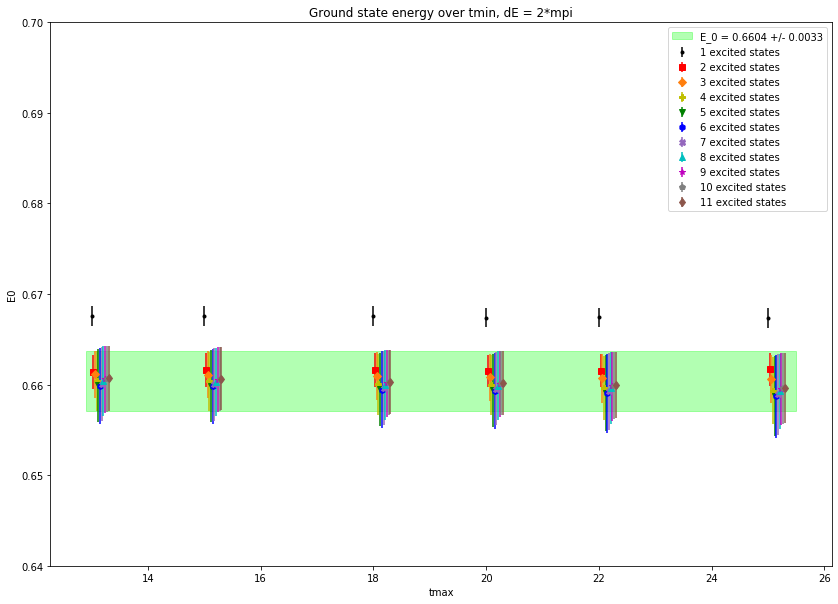

<Figure size 432x288 with 0 Axes>

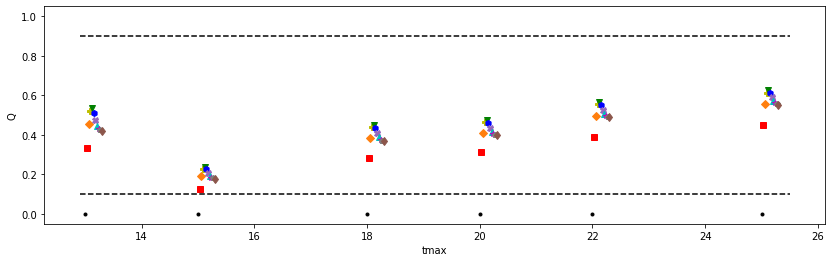

<Figure size 432x288 with 0 Axes>

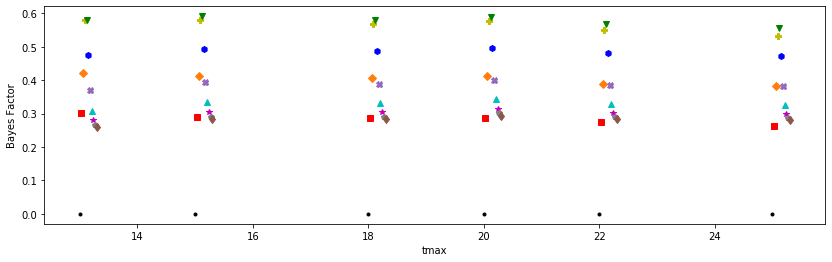

<Figure size 432x288 with 0 Axes>

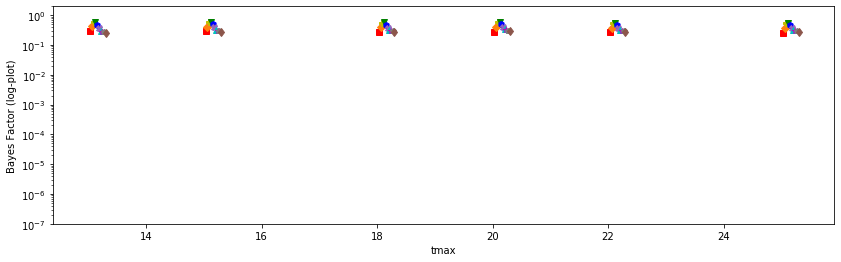

In [35]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a0_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a0_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a0)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a0[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a0[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

plt.fill_between(tmax_samp_line, [E0_tmax_bmax_a0[3][0].mean + E0_tmax_bmax_a0[3][0].sdev for i in tmax_samp_line], [E0_tmax_bmax_a0[3][0].mean - E0_tmax_bmax_a0[3][0].sdev  for i in tmax_samp_line], color="lime",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmax_bmax_a0[3][0].mean, E0_tmax_bmax_a0[3][0].sdev))
plt.title("Ground state energy over tmin, dE = 2*mpi")
plt.xlabel("tmax")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a0)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a0[i][k] for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a0)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a0[i][k] for k in range(len(tmax))], fmt='.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a0)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a0[i][k] for k in range(len(tmax))], '.', marker = a0_markers[i], color = a0_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor (log-plot)")
plt.ylim(1e-7, 2)
plt.savefig('logBFa0.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])

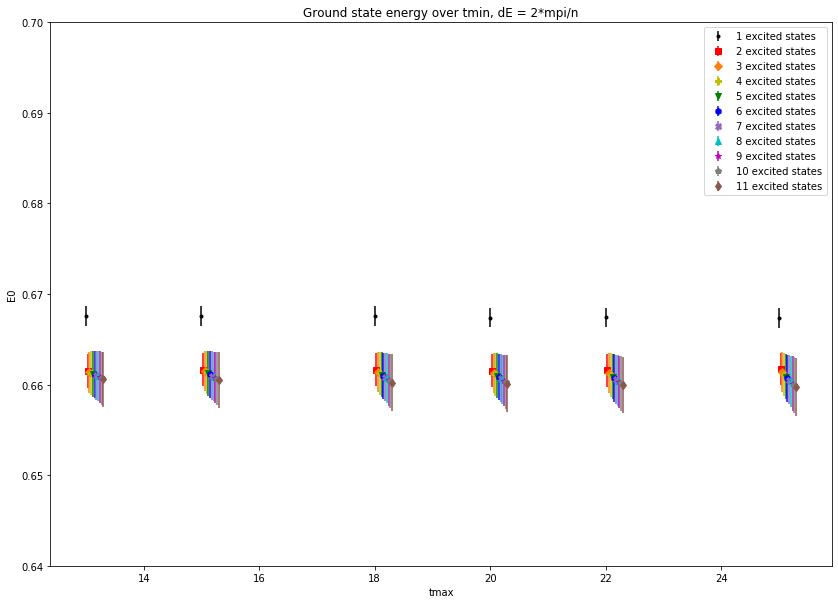

<Figure size 432x288 with 0 Axes>

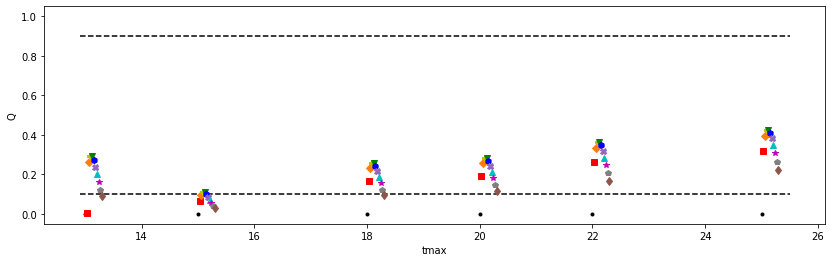

<Figure size 432x288 with 0 Axes>

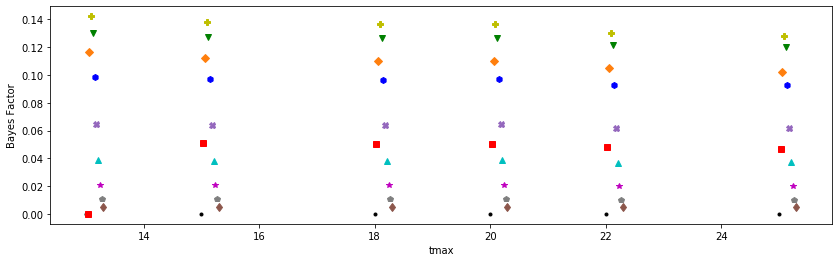

<Figure size 432x288 with 0 Axes>

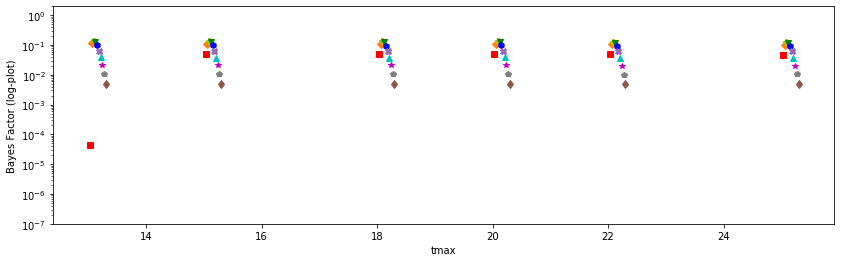

In [36]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a1_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a1_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a1)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a1[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a1[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))

plt.title("Ground state energy over tmin, dE = 2*mpi/n")
plt.xlabel("tmax")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a1)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a1[i][k] for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a1)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a1[i][k] for k in range(len(tmax))], fmt='.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a1)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a1[i][k] for k in range(len(tmax))], '.', marker = a1_markers[i], color = a1_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor (log-plot)")
plt.ylim(1e-7, 2)
plt.savefig('logBFa1.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])

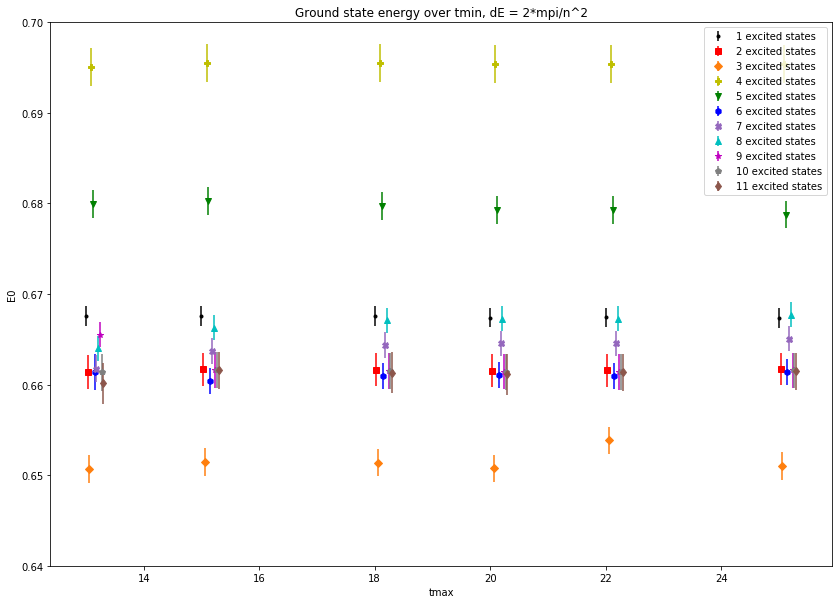

<Figure size 432x288 with 0 Axes>

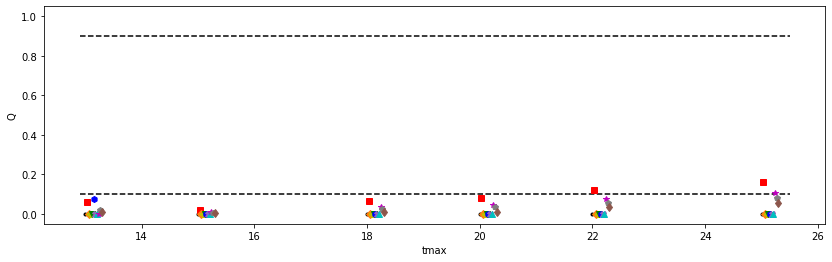

<Figure size 432x288 with 0 Axes>

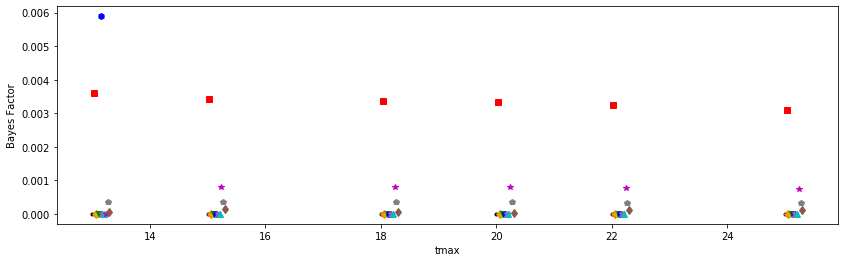

<Figure size 432x288 with 0 Axes>

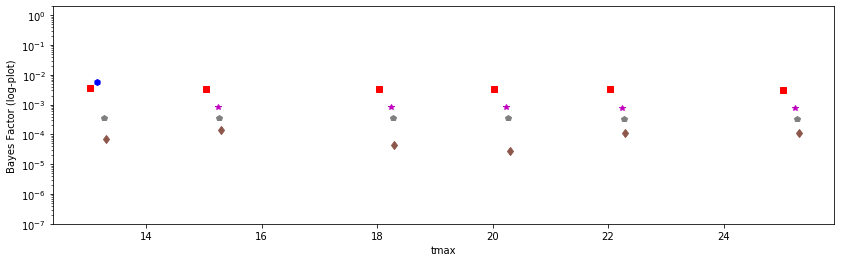

In [37]:
# Make a plot of E0 values vs tmin for a=0 , with a Q-plot and a Bayes factor plot right below, 
a2_markers = np.array(['.', 's', 'D', 'P', 'v', 'h', 'X', '^', '*', 'p', 'd'])
a2_colors = np.array(['k', 'r', 'tab:orange', 'y', 'g', 'b', 'tab:purple', 'c', 'm', 'tab:grey', 'tab:brown'])

plt.figure(figsize=(14,10))

for i in range(len(E0_tmax_bmax_a2)):
       
    plt.errorbar(tmax+ i*0.03, [E0_tmax_bmax_a2[i][k].mean for k in range(len(tmax))], yerr = [E0_tmax_bmax_a2[i][k].sdev for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))

#plt.fill_between(tmin_samp_line, [E0_tmin_bmax_a0[1][1].mean + E0_tmin_bmax_a0[1][1].sdev for i in tmin_samp_line], [E0_tmin_bmax_a0[1][1].mean - E0_tmin_bmax_a0[1][1].sdev  for i in tmin_samp_line], color="magenta",alpha=0.3, label = "E_0 = {:1.4f} +/- {:1.4f}".format(E0_tmin_bmax_a0[1][1].mean, E0_tmin_bmax_a0[1][1].sdev))

plt.title("Ground state energy over tmin, dE = 2*mpi/n^2")
plt.xlabel("tmax")
plt.ylabel("E0")
plt.ylim(0.64,0.7)
plt.legend()
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(Q_tmax_bmax_a2)):
        
    plt.errorbar(tmax+ i*0.03, [Q_tmax_bmax_a2[i][k] for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.plot(tmax_samp_line, Q_01_line, "k--")
plt.plot(tmax_samp_line, Q_09_line, "k--")
plt.xlabel("tmax")
plt.ylabel("Q")
plt.ylim(-0.05, 1.05)
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a2)):
        
    plt.errorbar(tmax+ i*0.03, [BF_tmax_bmax_a2[i][k] for k in range(len(tmax))], fmt='.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor")
plt.show()

plt.clf()
plt.figure(figsize=(14,4))
for i in range(len(BF_tmax_bmax_a2)):
        
    plt.semilogy(tmax+ i*0.03, [BF_tmax_bmax_a2[i][k] for k in range(len(tmax))], '.', marker = a2_markers[i], color = a2_colors[i], label = "{0} excited states".format(np.min(num_fitsamples) + i))
        #yerr = [Q_tmin_a0_readout[6][i*3 + j][k].sdev for k in range(len(tmin))],
        
plt.xlabel("tmax")
plt.ylabel("Bayes Factor (log-plot)")
plt.ylim(1e-7, 2)
plt.savefig('logBFa2.png')
plt.show()
#print(BF_tmin_bmax_a0[1][1])
#print(BF_tmin_bmax_a1[1][1])